In [6]:
import math
import numpy as np
import pandas as pd
from datetime import datetime
import logging
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [7]:
logging.getLogger('fbprophet').setLevel(logging.WARNING)
pd.set_option("max_rows", None)
sns.set_style("darkgrid")
sns.set_style("ticks", {"xtick.major.size": 16, "ytick.major.size": 16})

## Region Deaths

In [8]:
data_state = pd.read_csv('./DATA/us-states.csv')
data_state = data_state[['date', 'state', 'deaths']]
data_state['date'] = pd.to_datetime(data_state['date'])
data_state = data_state[(data_state['date'] >= '2020-03-08') & (data_state['date'] < '2021-01-01')]

NorthEast = ['Maine', 'New Hampshire', 'Vermont', 'Massachusetts', 'Rhode Island', 'Connecticut', 'New York', 
             'New Jersey', 'Pennsylvania']
MidWest = ['Ohio', 'Michigan', 'Indiana', 'Wisconsin', 'Illinois', 'Minnesota', 'Iowa', 'Missouri', 'North Dakota', 
           'South Dakota', 'Nebraska', 'Kansas']
South = ['Delaware', 'Maryland', 'Virginia', 'West Virginia', 'Kentucky', 'North Carolina', 'South Carolina', 
         'Tennessee', 'Georgia', 'Florida', 'Alabama', 'Mississippi', 'Arkansas', 'Louisiana', 'Texas', 'Oklahoma']
West = ['Montana', 'Idaho', 'Wyoming', 'Colorado', 'New Mexico', 'Arizona', 'Utah', 'Nevada', 'California', 
        'Oregon', 'Washington', 'Alaska', 'Hawaii']

for index, row in data_state.iterrows():
    if data_state.loc[index, 'state'] in NorthEast:
        data_state.loc[index, 'region'] = 'NorthEast'
    if data_state.loc[index, 'state'] in MidWest:
        data_state.loc[index, 'region'] = 'MidWest'
    if data_state.loc[index, 'state'] in South:
        data_state.loc[index, 'region'] = 'South'
    if data_state.loc[index, 'state'] in West:
        data_state.loc[index, 'region'] = 'West'
        
data_state = data_state.dropna()
data_region = data_state.groupby(['date', 'region'], as_index=False).sum()

Text(0.5, 1.0, 'Death Cases Trend by Region')

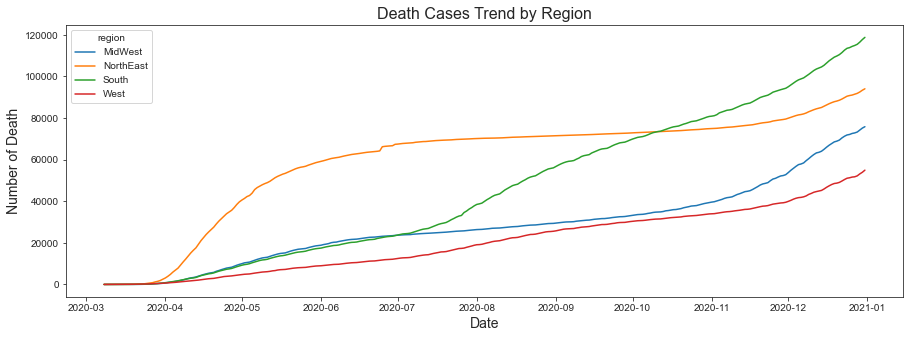

In [9]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=data_region, x="date", y="deaths", hue="region")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Death', fontsize=14)
plt.title('Death Cases Trend by Region', fontsize=16)

In [10]:
# Performance Matrix
region_perform = pd.DataFrame(columns=['region', 'ARIMA', 'HWAAS', 'Prohphet'])
region_perform['region'] = ['NorthEast', 'MidWest', 'South', 'West']

In [11]:
# Predicted Values
data_region_train = data_region[(data_region['date'] >= '2020-03-08') & (data_region['date'] < '2020-06-09')].copy()
data_region_test = data_region[(data_region['date'] >= '2020-06-09') & (data_region['date'] < '2021-01-01')].copy()
region_Nov = data_region_test.reindex(columns=['date', 'region', 'deaths', 'ARIMA', 'HWAAS', 'Prohphet'])  
region_Nov['date'] = region_Nov['date'].dt.date.astype(str)

### ARIMA

In [12]:
# forecasting
region_list = ['MidWest', 'NorthEast', 'South', 'West']
date_list = data_region_test['date'].dt.date.astype(str).unique().tolist()

for i in date_list:
    for j in region_list:
        train = data_region_train[data_region_train['region'] == j].reset_index()['deaths']
        train = np.array(train)
        model = ARIMA(train, order=(1,0,0))
        model_fit = model.fit()
        output = model_fit.forecast()
        y_hat = output[0]
        region_Nov.loc[(region_Nov['date'] == i) & (region_Nov['region'] == j), 'ARIMA'] = y_hat
        data_region_train.loc[len(data_region_train)] = [i, j, y_hat]

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


In [13]:
# evaluate forecasts
for j in region_list:
    result = region_Nov[region_Nov['region'] == j]
    rmse = math.sqrt(mean_squared_error(result['deaths'], result['ARIMA'])) 
    region_perform.loc[region_perform['region'] == j, 'ARIMA'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

MidWest Test RMSE: 21760.2499
NorthEast Test RMSE: 14713.6062
South Test RMSE: 52742.1182
West Test RMSE: 21782.1438


### HWAAS

In [14]:
data_region_train = data_region[(data_region['date'] >= '2020-03-08') & (data_region['date'] < '2020-06-09')].copy()
# forecasting
for i in date_list:
    for j in region_list:
        train = data_region_train[data_region_train['region'] == j].reset_index()['deaths']
        train = np.array(train)
        model = ExponentialSmoothing(endog=train, trend='add', initialization_method='estimated')
        model_fit = model.fit()
        output = model_fit.forecast()
        y_hat = output[0]
        region_Nov.loc[(region_Nov['date'] == i) & (region_Nov['region'] == j), 'HWAAS'] = y_hat
        data_region_train.loc[len(data_region_train)] = [i, j, y_hat]

In [15]:
# evaluate forecasts
for j in region_list:
    result = region_Nov[region_Nov['region'] == j]
    rmse = math.sqrt(mean_squared_error(result['deaths'], result['HWAAS'])) 
    region_perform.loc[region_perform['region'] == j, 'HWAAS'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

MidWest Test RMSE: 10681.6364
NorthEast Test RMSE: 8168.2688
South Test RMSE: 32056.5927
West Test RMSE: 10998.8408


### Prohphet

In [16]:
from fbprophet import Prophet
from datetime import datetime
import logging
logging.getLogger('fbprophet').setLevel(logging.WARNING)

In [17]:
data_region_train = data_region[(data_region['date'] >= '2020-03-08') & (data_region['date'] < '2020-06-09')].copy()
# forecasting
for i in date_list:
    for j in region_list:
        train = data_region_train[data_region_train['region'] == j].reset_index()[['date', 'deaths']]
        train = train.rename(columns={'deaths': 'y', 'date': 'ds'})
        model = Prophet(yearly_seasonality=True, daily_seasonality=True)
        model_fit = model.fit(train)
        future_dates = model.make_future_dataframe(periods=1)
        y_hat = model_fit.predict(future_dates).iloc()[0]['yhat']
        region_Nov.loc[(region_Nov['date'] == i) & (region_Nov['region'] == j), 'Prohphet'] = y_hat
        data_region_train.loc[len(data_region_train)] = [i, j, y_hat]


Initial log joint probability = -145.579
Iteration  1. Log joint probability =    90.2762. Improved by 235.855.
Iteration  2. Log joint probability =    135.382. Improved by 45.1055.
Iteration  3. Log joint probability =    198.076. Improved by 62.6947.
Iteration  4. Log joint probability =    209.455. Improved by 11.3786.
Iteration  5. Log joint probability =    306.898. Improved by 97.4432.
Iteration  6. Log joint probability =    363.262. Improved by 56.3641.
Iteration  7. Log joint probability =    422.943. Improved by 59.681.
Iteration  8. Log joint probability =    485.525. Improved by 62.5813.
Iteration  9. Log joint probability =    503.904. Improved by 18.3791.
Iteration 10. Log joint probability =    508.792. Improved by 4.88827.
Iteration 11. Log joint probability =    508.833. Improved by 0.0406195.
Iteration 12. Log joint probability =    508.866. Improved by 0.0333365.
Iteration 13. Log joint probability =    509.033. Improved by 0.166926.
Iteration 14. Log joint probabi


Initial log joint probability = -145.51
Iteration  1. Log joint probability =    93.1309. Improved by 238.641.
Iteration  2. Log joint probability =    150.201. Improved by 57.0702.
Iteration  3. Log joint probability =     281.16. Improved by 130.959.
Iteration  4. Log joint probability =    340.095. Improved by 58.9346.
Iteration  5. Log joint probability =    385.644. Improved by 45.5494.
Iteration  6. Log joint probability =     390.45. Improved by 4.8054.
Iteration  7. Log joint probability =    429.382. Improved by 38.9322.
Iteration  8. Log joint probability =    510.758. Improved by 81.3758.
Iteration  9. Log joint probability =    511.037. Improved by 0.278866.
Iteration 10. Log joint probability =    511.609. Improved by 0.572082.
Iteration 11. Log joint probability =    511.692. Improved by 0.0827885.
Iteration 12. Log joint probability =    512.178. Improved by 0.486679.
Iteration 13. Log joint probability =    512.301. Improved by 0.122305.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -158.304
Iteration  1. Log joint probability =    54.1387. Improved by 212.442.
Iteration  2. Log joint probability =    103.033. Improved by 48.8941.
Iteration  3. Log joint probability =    138.603. Improved by 35.5706.
Iteration  4. Log joint probability =    166.998. Improved by 28.3942.
Iteration  5. Log joint probability =    195.246. Improved by 28.2482.
Iteration  6. Log joint probability =    211.545. Improved by 16.2994.
Iteration  7. Log joint probability =    212.675. Improved by 1.12962.
Iteration  8. Log joint probability =    213.835. Improved by 1.16029.
Iteration  9. Log joint probability =    213.844. Improved by 0.00871499.
Iteration 10. Log joint probability =    213.846. Improved by 0.00191174.
Iteration 11. Log joint probability =    213.858. Improved by 0.0125619.
Iteration 12. Log joint probability =    213.865. Improved by 0.00666607.
Iteration 13. Log joint probability =    213.868. Improved by 0.00258835.
Iteration 14. Log joi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.898
Iteration  1. Log joint probability =    45.6081. Improved by 208.506.
Iteration  2. Log joint probability =    47.0957. Improved by 1.48759.
Iteration  3. Log joint probability =    78.1733. Improved by 31.0776.
Iteration  4. Log joint probability =    118.422. Improved by 40.2487.
Iteration  5. Log joint probability =      151.3. Improved by 32.8784.
Iteration  6. Log joint probability =    206.767. Improved by 55.4661.
Iteration  7. Log joint probability =    206.827. Improved by 0.0601789.
Iteration  8. Log joint probability =    207.031. Improved by 0.204804.
Iteration  9. Log joint probability =     213.04. Improved by 6.00895.
Iteration 10. Log joint probability =    213.726. Improved by 0.685231.
Iteration 11. Log joint probability =    213.747. Improved by 0.0211015.
Iteration 12. Log joint probability =    213.909. Improved by 0.16196.
Iteration 13. Log joint probability =    213.929. Improved by 0.0205309.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -158.513
Iteration  1. Log joint probability =    54.0228. Improved by 212.536.
Iteration  2. Log joint probability =    105.221. Improved by 51.1987.
Iteration  3. Log joint probability =    157.594. Improved by 52.3723.
Iteration  4. Log joint probability =     157.65. Improved by 0.056444.
Iteration  5. Log joint probability =    183.186. Improved by 25.5359.
Iteration  6. Log joint probability =    185.972. Improved by 2.78627.
Iteration  7. Log joint probability =    186.452. Improved by 0.479903.
Iteration  8. Log joint probability =    186.763. Improved by 0.310969.
Iteration  9. Log joint probability =    186.806. Improved by 0.042849.
Iteration 10. Log joint probability =    186.823. Improved by 0.0171666.
Iteration 11. Log joint probability =    186.969. Improved by 0.1454.
Iteration 12. Log joint probability =    187.064. Improved by 0.0954496.
Iteration 13. Log joint probability =    212.775. Improved by 25.7108.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -158.557
Iteration  1. Log joint probability =    53.9982. Improved by 212.555.
Iteration  2. Log joint probability =    105.639. Improved by 51.6404.
Iteration  3. Log joint probability =    157.484. Improved by 51.8458.
Iteration  4. Log joint probability =    185.772. Improved by 28.2876.
Iteration  5. Log joint probability =    203.783. Improved by 18.011.
Iteration  6. Log joint probability =    212.635. Improved by 8.85233.
Iteration  7. Log joint probability =    213.526. Improved by 0.890741.
Iteration  8. Log joint probability =    213.882. Improved by 0.355735.
Iteration  9. Log joint probability =    214.476. Improved by 0.594233.
Iteration 10. Log joint probability =    214.482. Improved by 0.00590069.
Iteration 11. Log joint probability =    214.511. Improved by 0.0294384.
Iteration 12. Log joint probability =    214.551. Improved by 0.039812.
Iteration 13. Log joint probability =    214.558. Improved by 0.00649311.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -159.698
Iteration  1. Log joint probability =    50.8539. Improved by 210.552.
Iteration  2. Log joint probability =    96.9029. Improved by 46.0491.
Iteration  3. Log joint probability =    142.937. Improved by 46.0339.
Iteration  4. Log joint probability =    182.802. Improved by 39.8648.
Iteration  5. Log joint probability =    198.622. Improved by 15.8199.
Iteration  6. Log joint probability =     214.49. Improved by 15.8683.
Iteration  7. Log joint probability =    215.454. Improved by 0.964406.
Iteration  8. Log joint probability =    215.514. Improved by 0.060105.
Iteration  9. Log joint probability =    215.697. Improved by 0.182646.
Iteration 10. Log joint probability =     216.24. Improved by 0.543282.
Iteration 11. Log joint probability =    216.241. Improved by 0.000994888.
Iteration 12. Log joint probability =    216.298. Improved by 0.057118.
Iteration 13. Log joint probability =    216.329. Improved by 0.0306552.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.303
Iteration  1. Log joint probability =    45.3371. Improved by 209.641.
Iteration  2. Log joint probability =    112.103. Improved by 66.7663.
Iteration  3. Log joint probability =    170.598. Improved by 58.4947.
Iteration  4. Log joint probability =    197.633. Improved by 27.0351.
Iteration  5. Log joint probability =    206.243. Improved by 8.60978.
Iteration  6. Log joint probability =    216.247. Improved by 10.0042.
Iteration  7. Log joint probability =    216.917. Improved by 0.670179.
Iteration  8. Log joint probability =    217.062. Improved by 0.144822.
Iteration  9. Log joint probability =    217.145. Improved by 0.0828908.
Iteration 10. Log joint probability =    217.284. Improved by 0.139046.
Iteration 11. Log joint probability =    217.435. Improved by 0.150815.
Iteration 12. Log joint probability =    217.468. Improved by 0.0328224.
Iteration 13. Log joint probability =    217.637. Improved by 0.169057.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -159.934
Iteration  1. Log joint probability =     50.961. Improved by 210.895.
Iteration  2. Log joint probability =    95.6714. Improved by 44.7103.
Iteration  3. Log joint probability =    134.589. Improved by 38.918.
Iteration  4. Log joint probability =    173.437. Improved by 38.8475.
Iteration  5. Log joint probability =    207.547. Improved by 34.1099.
Iteration  6. Log joint probability =    213.591. Improved by 6.04449.
Iteration  7. Log joint probability =    214.844. Improved by 1.25268.
Iteration  8. Log joint probability =     215.69. Improved by 0.846611.
Iteration  9. Log joint probability =    215.846. Improved by 0.155292.
Iteration 10. Log joint probability =     215.91. Improved by 0.064485.
Iteration 11. Log joint probability =    215.982. Improved by 0.0720647.
Iteration 12. Log joint probability =    216.283. Improved by 0.300977.
Iteration 13. Log joint probability =    216.387. Improved by 0.103925.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.056
Iteration  1. Log joint probability =    51.1561. Improved by 211.213.
Iteration  2. Log joint probability =    95.0245. Improved by 43.8683.
Iteration  3. Log joint probability =    132.167. Improved by 37.1429.
Iteration  4. Log joint probability =    166.243. Improved by 34.0757.
Iteration  5. Log joint probability =    200.278. Improved by 34.0349.
Iteration  6. Log joint probability =    215.332. Improved by 15.0541.
Iteration  7. Log joint probability =    216.076. Improved by 0.743538.
Iteration  8. Log joint probability =    216.841. Improved by 0.76532.
Iteration  9. Log joint probability =    216.987. Improved by 0.14569.
Iteration 10. Log joint probability =    217.052. Improved by 0.0658496.
Iteration 11. Log joint probability =    217.105. Improved by 0.0524225.
Iteration 12. Log joint probability =    217.113. Improved by 0.0076901.
Iteration 13. Log joint probability =    217.132. Improved by 0.0194278.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.658
Iteration  1. Log joint probability =    47.1433. Improved by 207.801.
Iteration  2. Log joint probability =    89.1003. Improved by 41.9571.
Iteration  3. Log joint probability =    136.639. Improved by 47.5387.
Iteration  4. Log joint probability =    173.444. Improved by 36.8054.
Iteration  5. Log joint probability =    199.086. Improved by 25.642.
Iteration  6. Log joint probability =     208.68. Improved by 9.5936.
Iteration  7. Log joint probability =    209.382. Improved by 0.70218.
Iteration  8. Log joint probability =    209.981. Improved by 0.598583.
Iteration  9. Log joint probability =    210.091. Improved by 0.110676.
Iteration 10. Log joint probability =    210.687. Improved by 0.596031.
Iteration 11. Log joint probability =    210.715. Improved by 0.0278241.
Iteration 12. Log joint probability =    210.872. Improved by 0.156775.
Iteration 13. Log joint probability =    210.982. Improved by 0.110372.
Iteration 14. Log joint probab

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.261
Iteration  1. Log joint probability =      45.89. Improved by 211.151.
Iteration  2. Log joint probability =    114.433. Improved by 68.5433.
Iteration  3. Log joint probability =     138.56. Improved by 24.1268.
Iteration  4. Log joint probability =    169.947. Improved by 31.387.
Iteration  5. Log joint probability =      195.1. Improved by 25.1525.
Iteration  6. Log joint probability =    210.545. Improved by 15.4455.
Iteration  7. Log joint probability =    211.384. Improved by 0.838877.
Iteration  8. Log joint probability =    211.414. Improved by 0.0299917.
Iteration  9. Log joint probability =    211.595. Improved by 0.180763.
Iteration 10. Log joint probability =     212.17. Improved by 0.575588.
Iteration 11. Log joint probability =    212.209. Improved by 0.0389761.
Iteration 12. Log joint probability =    212.234. Improved by 0.0242737.
Iteration 13. Log joint probability =    212.235. Improved by 0.00109297.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.895
Iteration  1. Log joint probability =    47.6328. Improved by 208.527.
Iteration  2. Log joint probability =    91.1139. Improved by 43.4811.
Iteration  3. Log joint probability =    135.991. Improved by 44.8766.
Iteration  4. Log joint probability =    170.478. Improved by 34.4875.
Iteration  5. Log joint probability =    197.572. Improved by 27.0936.
Iteration  6. Log joint probability =    209.515. Improved by 11.9432.
Iteration  7. Log joint probability =    210.658. Improved by 1.14277.
Iteration  8. Log joint probability =    210.843. Improved by 0.185817.
Iteration  9. Log joint probability =    210.968. Improved by 0.124907.
Iteration 10. Log joint probability =     211.61. Improved by 0.641378.
Iteration 11. Log joint probability =    211.633. Improved by 0.0233648.
Iteration 12. Log joint probability =    211.658. Improved by 0.0253798.
Iteration 13. Log joint probability =    211.669. Improved by 0.0109042.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.021
Iteration  1. Log joint probability =     48.189. Improved by 209.21.
Iteration  2. Log joint probability =    92.5245. Improved by 44.3355.
Iteration  3. Log joint probability =    137.345. Improved by 44.8208.
Iteration  4. Log joint probability =    168.563. Improved by 31.2182.
Iteration  5. Log joint probability =    188.225. Improved by 19.6612.
Iteration  6. Log joint probability =    209.666. Improved by 21.441.
Iteration  7. Log joint probability =    210.787. Improved by 1.1216.
Iteration  8. Log joint probability =    210.955. Improved by 0.167746.
Iteration  9. Log joint probability =    211.084. Improved by 0.128655.
Iteration 10. Log joint probability =    211.702. Improved by 0.618699.
Iteration 11. Log joint probability =    211.739. Improved by 0.0370302.
Iteration 12. Log joint probability =    211.757. Improved by 0.0178475.
Iteration 13. Log joint probability =    211.763. Improved by 0.00606569.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.321
Iteration  1. Log joint probability =    43.0657. Improved by 204.387.
Iteration  2. Log joint probability =    83.4032. Improved by 40.3375.
Iteration  3. Log joint probability =    121.297. Improved by 37.894.
Iteration  4. Log joint probability =    150.084. Improved by 28.7867.
Iteration  5. Log joint probability =    181.089. Improved by 31.005.
Iteration  6. Log joint probability =    199.726. Improved by 18.6372.
Iteration  7. Log joint probability =      200.5. Improved by 0.773784.
Iteration  8. Log joint probability =    200.538. Improved by 0.0384712.
Iteration  9. Log joint probability =    200.778. Improved by 0.239315.
Iteration 10. Log joint probability =    201.346. Improved by 0.567904.
Iteration 11. Log joint probability =     201.39. Improved by 0.0446641.
Iteration 12. Log joint probability =    201.426. Improved by 0.0361307.
Iteration 13. Log joint probability =     201.45. Improved by 0.0240648.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.868
Iteration  1. Log joint probability =    47.1428. Improved by 213.01.
Iteration  2. Log joint probability =    65.0885. Improved by 17.9457.
Iteration  3. Log joint probability =    116.714. Improved by 51.6256.
Iteration  4. Log joint probability =    147.348. Improved by 30.6339.
Iteration  5. Log joint probability =    178.784. Improved by 31.4365.
Iteration  6. Log joint probability =    200.011. Improved by 21.2263.
Iteration  7. Log joint probability =    200.936. Improved by 0.925526.
Iteration  8. Log joint probability =    200.995. Improved by 0.0589827.
Iteration  9. Log joint probability =    201.255. Improved by 0.259331.
Iteration 10. Log joint probability =    201.772. Improved by 0.517422.
Iteration 11. Log joint probability =    201.839. Improved by 0.0669972.
Iteration 12. Log joint probability =    201.869. Improved by 0.029682.
Iteration 13. Log joint probability =    201.877. Improved by 0.00844679.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.549
Iteration  1. Log joint probability =    44.0327. Improved by 205.581.
Iteration  2. Log joint probability =    76.4353. Improved by 32.4026.
Iteration  3. Log joint probability =    111.256. Improved by 34.8206.
Iteration  4. Log joint probability =    145.337. Improved by 34.0812.
Iteration  5. Log joint probability =    184.156. Improved by 38.8191.
Iteration  6. Log joint probability =    191.442. Improved by 7.28618.
Iteration  7. Log joint probability =    198.552. Improved by 7.10979.
Iteration  8. Log joint probability =     198.91. Improved by 0.357713.
Iteration  9. Log joint probability =    199.023. Improved by 0.1132.
Iteration 10. Log joint probability =    199.549. Improved by 0.526123.
Iteration 11. Log joint probability =    199.668. Improved by 0.11861.
Iteration 12. Log joint probability =    200.005. Improved by 0.337506.
Iteration 13. Log joint probability =    200.068. Improved by 0.0625044.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.672
Iteration  1. Log joint probability =    45.0032. Improved by 206.676.
Iteration  2. Log joint probability =    72.7343. Improved by 27.7311.
Iteration  3. Log joint probability =    104.402. Improved by 31.6672.
Iteration  4. Log joint probability =    139.262. Improved by 34.8609.
Iteration  5. Log joint probability =    155.565. Improved by 16.3029.
Iteration  6. Log joint probability =    194.071. Improved by 38.5057.
Iteration  7. Log joint probability =    194.221. Improved by 0.149502.
Iteration  8. Log joint probability =    194.238. Improved by 0.0172297.
Iteration  9. Log joint probability =    196.147. Improved by 1.9092.
Iteration 10. Log joint probability =    196.342. Improved by 0.194672.
Iteration 11. Log joint probability =     196.47. Improved by 0.128411.
Iteration 12. Log joint probability =    196.716. Improved by 0.245812.
Iteration 13. Log joint probability =    197.246. Improved by 0.530352.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.891
Iteration  1. Log joint probability =    39.3908. Improved by 201.282.
Iteration  2. Log joint probability =    91.6441. Improved by 52.2533.
Iteration  3. Log joint probability =    134.455. Improved by 42.8112.
Iteration  4. Log joint probability =    167.133. Improved by 32.6777.
Iteration  5. Log joint probability =    174.914. Improved by 7.78116.
Iteration  6. Log joint probability =    192.466. Improved by 17.5515.
Iteration  7. Log joint probability =    192.944. Improved by 0.478452.
Iteration  8. Log joint probability =    193.308. Improved by 0.363655.
Iteration  9. Log joint probability =    194.085. Improved by 0.776703.
Iteration 10. Log joint probability =    194.093. Improved by 0.00833785.
Iteration 11. Log joint probability =    194.116. Improved by 0.0228922.
Iteration 12. Log joint probability =    194.126. Improved by 0.0098634.
Iteration 13. Log joint probability =    194.129. Improved by 0.00290329.
Iteration 14. Log join

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.365
Iteration  1. Log joint probability =    48.6984. Improved by 215.063.
Iteration  2. Log joint probability =    109.006. Improved by 60.3075.
Iteration  3. Log joint probability =    154.425. Improved by 45.4194.
Iteration  4. Log joint probability =    164.341. Improved by 9.91522.
Iteration  5. Log joint probability =    184.245. Improved by 19.9046.
Iteration  6. Log joint probability =    184.521. Improved by 0.275407.
Iteration  7. Log joint probability =    184.934. Improved by 0.413224.
Iteration  8. Log joint probability =    185.289. Improved by 0.354871.
Iteration  9. Log joint probability =    186.533. Improved by 1.24471.
Iteration 10. Log joint probability =    186.936. Improved by 0.40241.
Iteration 11. Log joint probability =    187.221. Improved by 0.285545.
Iteration 12. Log joint probability =    187.602. Improved by 0.380807.
Iteration 13. Log joint probability =    187.879. Improved by 0.276732.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.097
Iteration  1. Log joint probability =    40.7536. Improved by 202.851.
Iteration  2. Log joint probability =    91.4868. Improved by 50.7332.
Iteration  3. Log joint probability =    135.902. Improved by 44.4151.
Iteration  4. Log joint probability =    169.455. Improved by 33.5529.
Iteration  5. Log joint probability =    183.545. Improved by 14.0902.
Iteration  6. Log joint probability =    191.866. Improved by 8.32063.
Iteration  7. Log joint probability =    192.556. Improved by 0.690398.
Iteration  8. Log joint probability =    192.961. Improved by 0.404556.
Iteration  9. Log joint probability =    193.747. Improved by 0.786197.
Iteration 10. Log joint probability =    193.756. Improved by 0.00892945.
Iteration 11. Log joint probability =    193.781. Improved by 0.0252833.
Iteration 12. Log joint probability =     193.79. Improved by 0.00872145.
Iteration 13. Log joint probability =    193.794. Improved by 0.00420992.
Iteration 14. Log joi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.223
Iteration  1. Log joint probability =    42.1596. Improved by 204.382.
Iteration  2. Log joint probability =    92.0229. Improved by 49.8633.
Iteration  3. Log joint probability =    134.327. Improved by 42.3037.
Iteration  4. Log joint probability =    167.277. Improved by 32.9506.
Iteration  5. Log joint probability =    173.387. Improved by 6.11.
Iteration  6. Log joint probability =    192.202. Improved by 18.8149.
Iteration  7. Log joint probability =    192.601. Improved by 0.398981.
Iteration  8. Log joint probability =    192.954. Improved by 0.352911.
Iteration  9. Log joint probability =    193.723. Improved by 0.768763.
Iteration 10. Log joint probability =    193.736. Improved by 0.0130829.
Iteration 11. Log joint probability =    193.754. Improved by 0.0179717.
Iteration 12. Log joint probability =    193.755. Improved by 0.000653178.
Iteration 13. Log joint probability =    193.765. Improved by 0.0107269.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.485
Iteration  1. Log joint probability =    37.0593. Improved by 199.544.
Iteration  2. Log joint probability =    92.7436. Improved by 55.6843.
Iteration  3. Log joint probability =    136.434. Improved by 43.6909.
Iteration  4. Log joint probability =    177.489. Improved by 41.0548.
Iteration  5. Log joint probability =    190.537. Improved by 13.0475.
Iteration  6. Log joint probability =    190.813. Improved by 0.276157.
Iteration  7. Log joint probability =    191.015. Improved by 0.202479.
Iteration  8. Log joint probability =    191.017. Improved by 0.00173465.
Iteration  9. Log joint probability =    191.098. Improved by 0.0805332.
Iteration 10. Log joint probability =    191.103. Improved by 0.00567873.
Iteration 11. Log joint probability =    191.105. Improved by 0.00135662.
Iteration 12. Log joint probability =    191.107. Improved by 0.00221367.
Iteration 13. Log joint probability =    191.113. Improved by 0.00580712.
Iteration 14. Lo

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.914
Iteration  1. Log joint probability =    50.3303. Improved by 217.244.
Iteration  2. Log joint probability =    104.845. Improved by 54.5142.
Iteration  3. Log joint probability =    160.271. Improved by 55.4266.
Iteration  4. Log joint probability =    167.952. Improved by 7.68063.
Iteration  5. Log joint probability =    171.321. Improved by 3.3694.
Iteration  6. Log joint probability =    176.987. Improved by 5.66609.
Iteration  7. Log joint probability =     177.52. Improved by 0.532255.
Iteration  8. Log joint probability =    179.506. Improved by 1.98604.
Iteration  9. Log joint probability =    179.709. Improved by 0.203239.
Iteration 10. Log joint probability =    180.036. Improved by 0.326709.
Iteration 11. Log joint probability =     180.56. Improved by 0.524515.
Iteration 12. Log joint probability =     180.82. Improved by 0.260178.
Iteration 13. Log joint probability =    181.145. Improved by 0.325209.
Iteration 14. Log joint probab

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.69
Iteration  1. Log joint probability =    38.8954. Improved by 201.586.
Iteration  2. Log joint probability =    93.8768. Improved by 54.9814.
Iteration  3. Log joint probability =    107.318. Improved by 13.4413.
Iteration  4. Log joint probability =    148.443. Improved by 41.1248.
Iteration  5. Log joint probability =     149.33. Improved by 0.887595.
Iteration  6. Log joint probability =      161.7. Improved by 12.37.
Iteration  7. Log joint probability =    162.156. Improved by 0.455995.
Iteration  8. Log joint probability =    162.361. Improved by 0.204463.
Iteration  9. Log joint probability =    162.582. Improved by 0.221052.
Iteration 10. Log joint probability =    162.622. Improved by 0.0401389.
Iteration 11. Log joint probability =    162.795. Improved by 0.173066.
Iteration 12. Log joint probability =    189.794. Improved by 26.9988.
Iteration 13. Log joint probability =    189.835. Improved by 0.0415003.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.805
Iteration  1. Log joint probability =     40.517. Improved by 203.322.
Iteration  2. Log joint probability =    95.2106. Improved by 54.6936.
Iteration  3. Log joint probability =    104.853. Improved by 9.64259.
Iteration  4. Log joint probability =     147.71. Improved by 42.8569.
Iteration  5. Log joint probability =    147.838. Improved by 0.127742.
Iteration  6. Log joint probability =    161.287. Improved by 13.4489.
Iteration  7. Log joint probability =    161.639. Improved by 0.352684.
Iteration  8. Log joint probability =    161.736. Improved by 0.0962635.
Iteration  9. Log joint probability =    162.021. Improved by 0.284891.
Iteration 10. Log joint probability =    162.209. Improved by 0.188869.
Iteration 11. Log joint probability =    189.481. Improved by 27.272.
Iteration 12. Log joint probability =    190.013. Improved by 0.531618.
Iteration 13. Log joint probability =    190.035. Improved by 0.0217745.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9236
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       180.216   1.62458e-08       100.614      0.2888      0.2888      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       180.216   9.11597e-09       101.174      0.2399      0.2399      128   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.3054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       179.795   2.34491e-06       101.409     0.04969           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       179.797   8.55427e-09       102.255      0.2394      0.2394      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1269
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       179.569   4.08564e-08       101.289      0.2817      0.2817      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       179.569   6.79051e-09       101.417      0.2836           1      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2267
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       179.278   2.23867e-08       101.972      0.8387      0.8387      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       179.279   1.82676e-07       104.377    1.81e-09       0.001      178  LS failed, Hessian reset 
     128       179.279   9.70018e-09       102.428      0.5751      0.5751      200   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0957
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       176.569    0.00750101       102.217           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       176.827   0.000414347       100.573   4.009e-06       0.001      177  LS failed, Hessian reset 
     199       176.906   6.74743e-06       93.4644      0.2327      0.2327      269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       176.956    7.3078e-08       101.877           1           1      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       176.956   4.64282e-09       101.276      0.2837      0.2837      399   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.1928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      60       176.203    0.00036528       101.074   3.596e-06       0.001      113  LS failed, Hessian reset 
      89       176.262   4.55627e-05       101.003    4.48e-07       0.001      188  LS failed, Hessian reset 
      99       176.265   1.22313e-06       100.992      0.4121      0.4121      201   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       176.266   1.25266e-07        101.58   1.231e-09       0.001      270  LS failed, Hessian reset 
     130       176.266   8.19507e-09        101.25      0.2898           1      281   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2757
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       175.423   0.000381062       100.335   3.744e-06       0.001      129  LS failed, Hessian reset 
      99       175.449   2.83657e-07       101.027      0.4296           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       175.449   8.13146e-09       100.737      0.3837      0.3837      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1617
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79           176   1.97534e-05       100.712   1.947e-07       0.001      143  LS failed, Hessian reset 
      99       176.003   2.47122e-05       101.715           1           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       176.004   8.58881e-06       101.575   8.554e-08       0.001      223  LS failed, Hessian reset 
     125       176.007   3.50113e-06       100.426   3.477e-08       0.001      287  LS failed, Hessian reset 
     163       176.007   6.60849e-09          99.7      0.4862      0.4862      334   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2285
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       174.581   7.02565e-05       100.637   6.993e-07       0.001      153  LS failed, Hessian reset 
      99       174.588   1.40152e-05       100.855       1.078      0.1078      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       174.595   6.18087e-09       100.741      0.3521           1      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6583
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       174.699   6.86473e-09       101.529      0.3706      0.3706      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       173.198   8.72665e-09       102.225      0.3418           1      112   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3758
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      60       174.028   9.02626e-05        100.96   8.997e-07       0.001      115  LS failed, Hessian reset 
      93       174.037    3.3761e-09       100.935      0.2093      0.2093      158   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4225
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       174.185   7.18197e-09       102.393      0.3176      0.3176      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.891
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       174.325   1.08844e-07       101.177       0.289           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       174.325   5.86552e-09       102.465       0.516       0.516      134   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5598
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      70       173.196   5.76129e-05       99.8772    5.67e-07       0.001      126  LS failed, Hessian reset 
      96         173.2   7.05216e-07       101.086   6.914e-09       0.001      191  LS failed, Hessian reset 
      99         173.2   1.31428e-07        100.34      0.7362      0.7362      194   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116         173.2   7.08253e-09       99.9708      0.5321      0.5321      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7144
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       173.881   7.04391e-07       100.319   6.981e-09       0.001      152  LS failed, Hessian reset 
      99       173.881   2.08755e-08       100.383      0.3193           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       173.881   5.39409e-09       100.403      0.2641      0.2641      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6036
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       174.651   8.45281e-09       101.318      0.6181      0.6181      102   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1119
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       175.033    0.00576275       103.388          10           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       175.089   0.000403884       96.4692   3.731e-06       0.001      175  LS failed, Hessian reset 
     121       175.201   0.000213123       101.544   1.859e-06       0.001      231  LS failed, Hessian reset 
     163       175.225   8.21613e-09       99.3548      0.3717      0.3717      284   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7641
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       174.047   6.99687e-05       104.046      0.4862      0.4862      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     193       174.717   9.71024e-09       101.401      0.5904      0.5904      235   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8358
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       174.369   8.16608e-09       100.607       0.869       0.869      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8689
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      63       176.011   0.000313248       103.414   3.059e-06       0.001      113  LS failed, Hessian reset 
      99       176.043   1.22836e-06       101.874      0.5451      0.5451      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       176.043   6.82123e-09       102.076       0.221       0.221      198   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9227
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       176.493   5.74031e-06       98.8002     0.06396           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       176.495   5.49627e-09       100.873      0.2221      0.2221      170   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2498
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       174.632   6.97392e-09       99.9158      0.4852      0.4852      112   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0651
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       176.528   2.04574e-05       92.7406      0.2651      0.2651      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        177.04   6.82305e-07       101.705           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242        177.04    9.6285e-09       101.266      0.3539           1      291   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8593
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       179.819   0.000487034       102.145      0.3293      0.3293      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       181.562   0.000939957       102.423      0.2749           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       182.899    0.00496657       121.482           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       184.487    0.00223414       100.873           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     420       184.514   2.43453e-05       100.198   2.423e-07       0.001      519  LS failed, Hessian reset 
     465       184.516   5.76738e-09    

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       178.188   9.05053e-09       96.7136      0.3385      0.3385      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2369
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       177.135    0.00159882       98.2848      0.3283           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       177.987   0.000250563       100.154      0.9996      0.9996      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        179.08     0.0108244       112.292           1           1      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       185.819    0.00903763        103.17           1           1      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     464       187.858   4.76059e-09       101.976      0.3698      0.3698      546   
Optimization terminated normally: 
  Convergence detected: absol

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6708
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       177.313   4.00837e-06       101.928   3.948e-08       0.001      134  LS failed, Hessian reset 
      96       177.313   7.71999e-09       103.204      0.4496      0.4496      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7404
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       182.121   0.000120937       99.5945      0.2039      0.2039      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       182.178   0.000114532       100.715   1.123e-06       0.001      177  LS failed, Hessian reset 
     168       182.191   9.51226e-09       100.924      0.3212      0.3212      238   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       181.746    0.00739732       111.547      0.6439      0.6439      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       182.597   7.26408e-09       100.909      0.1608      0.8948      188   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.168
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       180.538    0.00338418       105.116      0.7734      0.7734      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       180.637   7.78923e-09       100.646       0.124       0.124      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1808
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       181.223   0.000763187       103.331      0.5882      0.5882      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       182.871       0.03232       112.478           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       188.325   3.17277e-06       102.773       0.715       0.715      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       189.213   3.64021e-05        97.249           1           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     495       189.272   8.18402e-09       103.045       0.619       0.619      569   
Optimization terminated normally: 
  Convergence detected: absol

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       184.082   4.28319e-05       100.911           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       184.085   9.82485e-09        100.86       0.329       0.329      167   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.7603
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       184.588   2.44942e-05       96.4457      0.4111      0.4111      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        185.03   0.000769946       104.667           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        186.53    0.00339365       112.787           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       191.104   8.25903e-07       100.992       0.216           1      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     414       191.104   8.87022e-09       101.738      0.2754      0.2754      481   
Optimization terminated normally: 
  Convergence detected: absol

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         182.8   1.03309e-05       100.132           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       182.904   0.000102512       99.8372   9.905e-07       0.001      212  LS failed, Hessian reset 
     194       182.924   8.48174e-09       102.691      0.4137      0.4137      273   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.7142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        183.86    0.00255093       102.169           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       184.132   0.000283135       102.242   2.745e-06       0.001      254  LS failed, Hessian reset 
     199       184.148   9.22842e-06       101.488      0.2864           1      266   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       184.149   6.32535e-09       101.332      0.2094      0.2094      302   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       186.422   0.000136939       101.751   1.345e-06       0.001      154  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       186.445   9.26475e-09       99.7415      0.4356      0.4356      251   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.0619
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       185.436   0.000384067       102.944           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       186.586   9.32026e-10       102.608      0.1169      0.1169      211   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4946
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       184.965    0.00435371       105.997      0.5306      0.5306      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       186.411     0.0422618       166.289           1           1      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        189.29   4.62956e-05       102.699       0.798       0.798      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       189.404   3.20373e-05       101.388           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     431       189.406   5.06748e-09       101.792      0.7164      0.7164      491   
Optimization terminated normally: 
  Convergence detected: absol

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6674
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       185.913   4.25525e-07       102.265           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       185.913   2.94714e-09       101.393      0.2931      0.2931      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.3128
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       188.223   8.65451e-05       100.278    8.64e-07       0.001      160  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       188.235   1.99863e-05       101.126   2.035e-07       0.001      225  LS failed, Hessian reset 
     157       188.237    9.1708e-08       104.129   9.237e-10       0.001      315  LS failed, Hessian reset 
     168       188.237   8.15369e-09        98.902      0.3112      0.3112      328   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5133
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       188.244   2.54107e-05       103.846      0.8321      0.8321      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       188.247   2.89801e-09       102.409      0.4295      0.4295      162   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2387
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       186.545   4.01905e-05       100.717           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       186.547   7.98062e-09       100.466      0.4446      0.4446      156   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4518
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       187.788   0.000344467       107.247      0.6297      0.6297      108   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       187.933    0.00250438       102.558   2.416e-05       0.001      151  LS failed, Hessian reset 
     177       188.366   6.29196e-09       99.6846       0.213       0.213      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4889
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       189.821   2.95943e-07       102.208      0.5804      0.5804      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       189.821    5.0089e-09       100.022      0.4523      0.4523      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.7791
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       189.845   7.18151e-05        103.71      0.5567      0.5567      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117        189.91   0.000125708       100.561   1.244e-06       0.001      173  LS failed, Hessian reset 
     142       189.934   4.31533e-06       101.107   4.341e-08       0.001      240  LS failed, Hessian reset 
     176       189.935   8.91701e-08       101.768     8.9e-10       0.001      324  LS failed, Hessian reset 
     185       189.935   6.13123e-09        100.11      0.5825      0.5825      336   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       188.169   3.37449e-05       98.6954          10           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101        188.21    0.00024438       102.116     2.4e-06       0.001      152  LS failed, Hessian reset 
     121       188.231   2.43423e-05       99.7468   2.396e-07       0.001      212  LS failed, Hessian reset 
     171       188.233    6.9691e-09       100.895      0.1617      0.1617      275   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9159
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         189.7   3.51709e-08       98.7166      0.2378      0.2378      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111         189.7   2.75505e-09       102.933      0.1629      0.1629      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7666
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       190.819    0.00103962       103.713      0.5943      0.5943      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       190.897    3.7722e-09       99.9549      0.2096      0.2096      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.1846
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       190.423     7.035e-09       102.509       0.262       0.262      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8798
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       189.619   2.87202e-08        99.934           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       189.619    3.1788e-09       98.5773      0.3958      0.3958      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8245
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        191.04   2.24946e-05       101.284      0.2156       0.973      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151        191.05   1.94323e-07       102.311   1.927e-09       0.001      227  LS failed, Hessian reset 
     165        191.05     9.917e-09       101.295      0.2801      0.2801      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0683
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96        190.78   5.87293e-09       101.279      0.4743      0.4743      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9497
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       191.303   7.80297e-09       99.3424       0.422           1      105   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1302
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       190.168   6.26346e-09        102.59      0.2014      0.2014      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3345
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       191.496    0.00544695       102.884           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       191.727   2.13828e-05       101.128    2.12e-07       0.001      218  LS failed, Hessian reset 
     192       191.732   5.54821e-06       100.653   5.483e-08       0.001      309  LS failed, Hessian reset 
     199       191.732   3.78597e-07       99.9731      0.3333           1      320   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222       191.732   9.22846e-09       100.012      0.3078           1      347   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1737
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       191.323   5.21654e-08       99.9503           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       191.344   6.72044e-05       100.649   6.698e-07       0.001      172  LS failed, Hessian reset 
     145        191.35   8.47054e-09       100.117      0.5776      0.5776      224   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1095
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       191.868   0.000103554       100.865   1.032e-06       0.001      137  LS failed, Hessian reset 
      99       191.878   1.25972e-06       100.445      0.2936      0.2936      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128        191.88   4.98285e-06       100.678   4.964e-08       0.001      238  LS failed, Hessian reset 
     150        191.88   7.95481e-09       100.554      0.4365      0.4365      268   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1172
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      69       190.886   0.000383155       99.9636   3.786e-06       0.001      128  LS failed, Hessian reset 
      99       190.915   5.01715e-07        99.837      0.5506      0.5506      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       190.915   4.20924e-06       99.2238   4.206e-08       0.001      233  LS failed, Hessian reset 
     156       190.916   7.93183e-07       99.4053   7.827e-09       0.001      327  LS failed, Hessian reset 
     176       190.916   5.53605e-09       100.019      0.3484      0.3484      354   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4397
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       191.917   2.55374e-07       99.1749      0.4058      0.4058      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       191.917   3.56485e-09       99.4771      0.1146      0.1146      134   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5842
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       192.388   8.69826e-07       99.4158           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       192.388   5.48623e-07        100.79   5.543e-09       0.001      161  LS failed, Hessian reset 
     116       192.388   3.31614e-09       100.632      0.2249      0.2249      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0358
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       192.998   0.000372505       103.901    3.37e-06       0.001      156  LS failed, Hessian reset 
      99        193.03   1.46905e-05       101.607       0.225       0.992      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       193.031   1.86171e-09       99.4504       0.144       0.144      211   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8311
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       191.639   8.52054e-09       101.646           1           1      106   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2155
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62       193.021   0.000123351       102.065   1.217e-06       0.001      111  LS failed, Hessian reset 
      99       193.048   5.48368e-07       100.278      0.3607      0.3607      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       193.048   5.04259e-09       100.943      0.4549      0.4549      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9734
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       193.514   7.57084e-09         98.55      0.4451      0.4451      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0752
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       194.257   0.000305945       105.715   2.821e-06       0.001      144  LS failed, Hessian reset 
      99       194.303   1.51498e-06       100.108           1           1      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       194.303   5.17485e-07        101.17   5.129e-09       0.001      259  LS failed, Hessian reset 
     142       194.303   4.08816e-09       101.087      0.4828      0.4828      280   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4402
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75       192.665   5.72617e-06       101.795   5.733e-08       0.001      132  LS failed, Hessian reset 
      99       192.665   2.75357e-08       101.563      0.2992           1      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       192.665   7.29085e-09       101.152      0.3149      0.3149      164   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.953
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       193.914   9.77123e-09       99.2099      0.5191      0.5191      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.868
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       194.243   4.06734e-09        100.21      0.1913      0.1913      101   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.153
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       195.428   8.77314e-09       100.474      0.3313           1      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9713
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       193.691   6.33615e-07       101.484   6.237e-09       0.001      138  LS failed, Hessian reset 
      93       193.691   9.45335e-09       101.073      0.3745      0.3745      158   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2784
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       194.641   6.19647e-08       100.369      0.1916      0.1916      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       194.641   4.72609e-09       99.2163      0.3626      0.3626      152   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2608
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       195.174   4.95568e-09       104.195      0.3748      0.3748      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.4048
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       196.854   1.12969e-07       97.0498      0.4363      0.4363      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       198.434   3.69347e-06       102.669      0.7525      0.7525      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       198.434   7.83889e-09       100.666      0.3418      0.3418      266   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3632
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       194.723   6.09237e-09       99.2862      0.3716      0.3716      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4481
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       195.582    2.1017e-08       99.8331           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       195.582   8.71781e-09       99.9568      0.6272      0.6272      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.35
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       200.143    0.00629908        104.23      0.4565           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       200.985   2.01709e-05       101.052      0.3201      0.3201      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222        201.03   0.000113809       101.457    1.12e-06       0.001      294  LS failed, Hessian reset 
     284       201.044   9.87355e-09       102.092      0.2894      0.2894      375   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.6579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        198.54    0.00010946       99.0677       3.158           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       198.542   9.81918e-09       97.2632      0.3143           1      162   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3885
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       196.657    0.00748051       120.404           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       200.601   2.08578e-08       99.1036      0.3407      0.3407      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       200.601   9.80346e-09        100.81      0.4339      0.4339      246   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4976
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       198.851     0.0301988       132.678           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       201.305   8.25436e-09       103.528      0.3288      0.3288      189   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9126
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       202.532   3.73844e-05        101.79      0.5955      0.5955      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       203.274    1.2432e-06       99.5621      0.4144      0.4144      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       203.275   5.79929e-09       100.571      0.6099      0.6099      263   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.711
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        200.57   4.84392e-07       99.6676           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110        200.57   5.27278e-09        101.92      0.2717      0.2717      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7173
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       201.795    0.00489342       101.105      0.3884           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165        202.22   6.36918e-09       100.051      0.5151      0.5151      211   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4768
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       203.666   9.47168e-06       101.061      0.1755           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       203.667   5.02515e-09       101.834      0.4845      0.4845      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6895
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       205.184   1.90054e-05       99.5389      0.8096      0.8096      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       205.186   1.47637e-09        101.91      0.1516      0.1516      174   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.0391
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       204.603     0.0540464       171.961           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       206.443    9.8479e-08       99.6415      0.2313           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       206.443   5.41708e-09        102.97      0.4574      0.4574      261   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1752
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       204.394   1.08258e-06       99.7606      0.3675      0.3675      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       204.419   8.79909e-05       100.184   8.613e-07       0.001      182  LS failed, Hessian reset 
     163       204.439   5.02571e-09       99.9731       0.445       0.445      240   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2358
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       205.213   7.34844e-05       100.209      0.9351      0.9351      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       205.495    0.00146455        101.57   1.242e-05       0.001      181  LS failed, Hessian reset 
     156        205.73   4.37469e-09       102.139      0.1899      0.1899      245   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9214
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       206.698   9.37056e-07       100.851      0.4954      0.4954      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       206.698   6.12445e-07       100.872   5.999e-09       0.001      182  LS failed, Hessian reset 
     135       206.698   2.41911e-09       100.786      0.1404      0.1404      198   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.1432
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       206.985    0.00251816       105.095      0.7799      0.7799      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       207.731   6.08314e-09       103.742      0.3371      0.3371      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1399
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       204.692     0.0219173       110.217      0.8401      0.8401      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       205.823   9.29852e-09         102.6      0.3535      0.3535      192   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       207.027    0.00104216        103.35      0.4257           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       207.153   6.59274e-09       101.858      0.3231      0.3231      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.989
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       208.828   5.39551e-07       100.962      0.4929      0.4929      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       208.828   3.33466e-09       100.202      0.3598      0.3598      143   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.8826
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       208.752     0.0002141       102.985       0.373       0.373      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     193       208.986   6.67125e-09       99.3449      0.3717      0.3717      235   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0733
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       207.628   0.000383738       101.686      0.4089           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       207.652   7.56113e-09       100.768      0.4928      0.4928      176   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       208.911    0.00145151        103.48   1.282e-05       0.001      156  LS failed, Hessian reset 
      99       209.031   0.000146361       101.951      0.7162      0.7162      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       209.051   4.61096e-09       100.831      0.2684      0.2684      217   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0718
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       210.666   3.36328e-06       99.1739      0.4822      0.4822      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       210.667   5.58743e-09       99.8447      0.3503      0.3503      156   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6498
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       210.174     3.901e-06        102.59      0.3355      0.3355      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       210.176   5.96626e-07        100.66   5.935e-09       0.001      209  LS failed, Hessian reset 
     151       210.176   1.43756e-08       99.3012           1           1      232   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3861
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       209.826   0.000542694       111.102   5.433e-06       0.001      158  LS failed, Hessian reset 
      99       209.929   0.000105229       101.939      0.8155      0.8155      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       209.944   9.28135e-09        101.67      0.3495      0.3495      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3779
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       210.935   0.000629069        102.32   6.014e-06       0.001      137  LS failed, Hessian reset 
      99        211.02   1.23358e-05        103.53       0.197      0.6828      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       211.084   0.000255897        102.66   2.417e-06       0.001      227  LS failed, Hessian reset 
     199       211.113   1.14562e-08       100.718      0.3754           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       211.113   4.39695e-09       99.7526      0.3352      0.3352      327   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2398
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       212.661   6.67212e-05       97.8366      0.2038      0.8171      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       212.667   2.56565e-05       100.659    2.54e-07       0.001      173  LS failed, Hessian reset 
     148       212.669   1.28854e-07        99.208    1.27e-09       0.001      252  LS failed, Hessian reset 
     151       212.669    9.5081e-09       101.286      0.2985      0.2985      256   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.5406
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       212.391   1.06415e-06       102.496      0.9947      0.9947      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       212.472   5.24117e-09        100.15      0.2559      0.2559      220   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4708
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       211.986   1.38732e-06       100.951      0.2453      0.2453      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       211.988   6.52805e-09       100.001      0.2462      0.2462      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3443
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       212.935     5.344e-07       99.1528      0.6959      0.6959      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       212.945   7.48196e-05       101.322   7.523e-07       0.001      170  LS failed, Hessian reset 
     151       212.955   2.29276e-05        100.12   2.295e-07       0.001      273  LS failed, Hessian reset 
     199       212.957   9.76797e-08       100.018      0.5639      0.5639      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       212.957   9.07466e-09       100.455           1           1      347   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2629
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       213.532   6.08759e-07       98.5697      0.6748      0.6748      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       213.532   6.37322e-09       100.159      0.4059      0.4059      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.5061
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       214.422   1.41012e-08       101.433      0.2814      0.9258      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       214.422   7.25156e-09       101.226      0.2943           1      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5822
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       214.202   0.000165208       99.4807           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       214.211    8.4084e-09       99.7322      0.2963      0.2963      173   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4303
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         214.8   5.38282e-07       99.8772      0.3313      0.3313      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114         214.8   4.11696e-09       100.948      0.2171      0.2171      143   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4203
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       216.701   2.17639e-05       103.325      0.1402      0.7312      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       216.703   5.90081e-09       100.537      0.5319      0.5319      158   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.5775
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       216.104   5.35074e-07       102.047   5.341e-09       0.001      163  LS failed, Hessian reset 
      99       216.104   1.84022e-07       101.029      0.9692      0.9692      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       216.104   5.93131e-07       102.212   5.953e-09       0.001      227  LS failed, Hessian reset 
     141       216.105   1.14657e-06       101.849   1.131e-08       0.001      290  LS failed, Hessian reset 
     159       216.105    6.9465e-07       101.781   6.838e-09       0.001      351  LS failed, Hessian reset 
     177       216.105   6.04768e-07        103.91    6.01e-09       0.001      409  LS failed, Hessian reset 
     199       216.105    9.0774e-08       101.595      0.3065      0.3065      442   
    Iter      log prob        ||dx||      ||gr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3751
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       214.598   7.87213e-07       104.742      0.7695      0.7695      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       215.799    0.00173626       103.784   1.545e-05       0.001      201  LS failed, Hessian reset 
     190       216.026   4.49224e-05       101.873    4.55e-07       0.001      297  LS failed, Hessian reset 
     199        216.03   2.71448e-06       98.9477       0.224           1      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219        216.03   5.32986e-09       99.1056      0.1863      0.1863      335   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9037
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       216.239   7.83213e-07       101.757      0.3422      0.3422      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       216.239   6.22121e-09       96.9684     0.04806           1      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       218.214   3.56821e-05       102.045      0.7164      0.7164      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       218.215   8.24413e-09       97.9057      0.5225      0.5225      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.8259
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       218.496    9.1537e-09       101.733       0.408       0.408      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6894
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       217.234   6.20429e-09       101.354      0.2792      0.2792      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4381
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       218.392   4.03302e-08       99.4925      0.4894      0.4894      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       218.392   7.23132e-09       101.624      0.3112       0.809      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0982
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      73       219.672   0.000758213       102.717   7.393e-06       0.001      132  LS failed, Hessian reset 
      99       219.726   5.21584e-07       97.1407      0.2794           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       219.726   8.42059e-09       99.7492      0.5526      0.5526      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.7862
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       220.519   2.05609e-05       99.4646      0.2577      0.2577      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       220.523   9.64487e-09       102.218           1           1      167   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3764
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      45        219.21   0.000666435       101.404   6.539e-06       0.001      100  LS failed, Hessian reset 
      85        219.33   1.01972e-05       103.062   1.011e-07       0.001      182  LS failed, Hessian reset 
      99       219.331   8.77548e-07       100.713      0.2443           1      198   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       219.332   6.51399e-07       103.093   6.511e-09       0.001      261  LS failed, Hessian reset 
     134       219.332   9.65907e-09       99.1128      0.5466      0.5466      281   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4506
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       220.062   8.57347e-09       101.474      0.2442           1      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3068
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98        221.69   3.00291e-09       100.019      0.2089      0.2089      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0102
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       221.455     0.0220119        106.19           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       221.958   9.41373e-09       103.078      0.3436      0.3436      206   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3362
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      60       220.998   9.71679e-05       100.379   9.616e-07       0.001      111  LS failed, Hessian reset 
      98       221.034   0.000115611       101.103   1.144e-06       0.001      193  LS failed, Hessian reset 
      99       221.038   6.46351e-05       101.941           1           1      194   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       221.052   1.41447e-09       102.616      0.0559     0.00559      288   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5666
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       221.751   2.04258e-08       101.737      0.8784      0.8784      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       221.751    6.9017e-09       102.209        0.74        0.74      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2119
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       223.622    6.0749e-09       100.242      0.3421      0.3421      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.3702
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       223.236    0.00296255       104.914   2.969e-05       0.001      108  LS failed, Hessian reset 
      95       223.553   6.30596e-05       103.505   6.397e-07       0.001      188  LS failed, Hessian reset 
      99       223.557   7.96336e-06       98.9486      0.4547      0.4547      193   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       223.567   6.92054e-09       102.171       0.294       0.294      257   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5453
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       223.196   9.13951e-06        100.58           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       223.198   7.71546e-06       99.9966   7.724e-08       0.001      181  LS failed, Hessian reset 
     138       223.206   6.52136e-06       99.3536    6.38e-08       0.001      265  LS failed, Hessian reset 
     174       223.209   9.19474e-06       100.382   9.146e-08       0.001      342  LS failed, Hessian reset 
     199       223.212   1.13153e-06       100.022       2.589      0.2589      375   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       223.212   5.87957e-09       99.5139      0.3647      0.3647      397   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6277
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       223.776   4.11719e-06       99.9983   4.163e-08       0.001      143  LS failed, Hessian reset 
      99       223.776    2.5405e-07       100.357      0.5866      0.5866      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       223.777   7.58451e-07       101.977   7.597e-09       0.001      212  LS failed, Hessian reset 
     132       223.777   6.52606e-07       101.864   6.531e-09       0.001      299  LS failed, Hessian reset 
     164       223.782   2.70575e-05       101.158   2.716e-07       0.001      379  LS failed, Hessian reset 
     192       223.797   2.64575e-05        101.86   2.629e-07       0.001      449  LS failed, Hessian reset 
     199         223.8    7.1149e-06       100.933       1.339      0.1339      459   
    Iter      log prob        ||dx||      ||gr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.283
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       225.431   4.70284e-08       101.356      0.4113           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       225.431   5.43769e-09        101.15      0.1917      0.1917      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.7417
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       225.121    0.00400191       167.559   3.093e-05       0.001      137  LS failed, Hessian reset 
      99       225.414   4.01931e-06       101.972      0.3164      0.3164      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       225.415    1.8515e-06       101.132   1.833e-08       0.001      242  LS failed, Hessian reset 
     155       225.415   3.04041e-09       102.952      0.3202      0.3202      280   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4282
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       225.015    4.8974e-06        99.448   4.814e-08       0.001      142  LS failed, Hessian reset 
      99       225.016   6.16093e-08       100.338     0.05579           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       225.016   9.49833e-09       100.171      0.6751      0.6751      170   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6348
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       225.751    7.4397e-09       102.063      0.4723      0.4723      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3909
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       227.378   8.35623e-09       100.602       0.635       0.635      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.8939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      52        227.37    0.00163946       98.2687   1.276e-05       0.001       98  LS failed, Hessian reset 
      99       227.704    2.1963e-07       100.575      0.1651           1      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       227.704   5.85555e-09       97.7919      0.2024      0.2024      174   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5299
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       227.059   8.33666e-09       101.138      0.2883           1      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6894
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       227.726   0.000342994       103.403    3.45e-06       0.001      123  LS failed, Hessian reset 
      99       227.761    5.1795e-07       101.288      0.7974      0.7974      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       227.761     5.846e-09       99.8093      0.3959      0.3959      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5846
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87        229.37   8.46546e-09       103.902      0.3224      0.3224      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.7747
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       229.428    8.2052e-09       102.214      0.4941      0.4941      116   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5263
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        229.15   7.58594e-07       97.6319           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       229.151   8.65261e-09       98.2715      0.4761      0.4761      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6264
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       229.688    0.00414569       136.299           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       230.778   4.03793e-05       103.176      0.4315      0.4315      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       230.816   4.68946e-06       103.588       0.974       0.974      365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     330       230.817   4.40087e-09       103.784      0.3881      0.3881      408   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4577
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       231.701   9.23248e-08       101.113           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       231.701   3.70277e-09       99.6208       0.246       0.246      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.1048
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       231.594   9.70725e-09       102.468      0.1861      0.1861      116   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3767
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       231.141   3.04352e-06       99.1966      0.9099      0.9099      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       231.142   1.85543e-07       99.0176   1.847e-09       0.001      210  LS failed, Hessian reset 
     138       231.142   6.81412e-09       103.121      0.1385      0.1385      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0361
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       231.687    4.3205e-07       103.391       0.647       0.647      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       231.689    6.2274e-09       99.1377      0.1084      0.1084      170   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4299
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       233.768   9.79497e-09       101.976      0.3432      0.3432      143   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.2767
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      65       234.081   0.000583259       102.183   5.568e-06       0.001      116  LS failed, Hessian reset 
      97       234.196   6.47797e-05       101.179    6.36e-07       0.001      192  LS failed, Hessian reset 
      99       234.199   2.91664e-05       100.454       0.314           1      195   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       234.202   3.94618e-09       102.124      0.4222      0.4222      245   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5641
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       233.322    3.8044e-09       102.078       0.347       0.347      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7587
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       234.023   9.24395e-09       100.265      0.4517      0.4517      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5614
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       236.003   2.17391e-05       100.234           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       238.005    9.2195e-09       104.699      0.3934           1      228   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.034
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       236.457   0.000157901       100.674   1.592e-06       0.001      151  LS failed, Hessian reset 
      99       236.468   9.54295e-07       102.716      0.3884      0.3884      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       236.468   8.81133e-09       102.141      0.3321           1      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5834
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       235.584   1.37942e-07        103.75      0.4091      0.4091      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       235.584   8.52932e-09         98.03      0.1701      0.4613      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6889
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       235.912   9.10635e-09       100.491      0.5506      0.5506      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3567
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       240.139     0.0020553       101.744   1.972e-05       0.001      134  LS failed, Hessian reset 
      99       240.395   5.12255e-06       100.787      0.4169      0.4169      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       240.397   5.34672e-07       100.242   5.339e-09       0.001      231  LS failed, Hessian reset 
     139       240.397   5.63091e-09       100.916      0.5963      0.5963      252   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.9668
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       238.537    3.6468e-07       104.508           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       238.537    6.0069e-09        98.661      0.5163      0.5163      143   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6462
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       237.678   1.96681e-07       101.622           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       237.678   2.77714e-09        102.66     0.07889     0.07889      127   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9207
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       239.867   0.000715096       102.105      0.5008      0.5008      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       239.916   8.11468e-09       102.576      0.2212      0.2212      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4409
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       242.526   0.000284293       100.394   2.815e-06       0.001      152  LS failed, Hessian reset 
      99        242.54   5.33549e-05       99.6086       0.812       0.812      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       242.544   7.45248e-09       100.935      0.5676      0.5676      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.0014
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       240.773   6.39576e-08       100.509       0.887       0.887      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       240.773   8.22629e-09       100.943      0.2496           1      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7688
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       240.705    0.00512625       110.847      0.5774      0.5774      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       241.228   4.70711e-09       101.707      0.2501      0.2501      185   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8996
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       241.635   1.94139e-05       101.179           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       241.637   9.60906e-09       102.274      0.3009           1      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3876
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       244.623   2.57004e-06       101.535           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       244.623   6.51067e-09       99.7892      0.6558      0.6558      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.1029
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        243.82   0.000833199       101.745      0.2326      0.9308      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       243.844    8.8694e-09       100.865       0.221       0.221      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6873
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       243.612   0.000771367       109.455      0.3371      0.3371      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       243.735   8.56689e-09        100.23      0.3615      0.3615      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.437
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       243.249   7.44053e-06       102.347      0.2108           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       244.573    3.8023e-07       100.265      0.6987      0.6987      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       244.573   4.93179e-09       100.826      0.2719      0.2719      263   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4998
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       246.268   4.26361e-08       100.417      0.9095      0.9095      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       246.268   6.03264e-09       100.157      0.3154      0.3154      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1654
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      54       245.076    0.00294447        103.32   2.583e-05       0.001      103  LS failed, Hessian reset 
      99       245.525   2.55429e-07       100.289      0.1734           1      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       245.525   6.47665e-09       100.488      0.4977      0.4977      173   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5026
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       245.945   9.42999e-07        99.632      0.9813      0.9813      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       245.945   8.63639e-09       101.137      0.1394      0.5554      151   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7011
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       246.117   1.35179e-07       98.1991      0.2979           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       246.117   3.24603e-09       97.1708      0.2488      0.2488      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7616
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       247.783   2.68474e-08       100.685      0.5981      0.5981      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       247.783   9.40078e-09       99.8838       0.196           1      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.7515
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      63       247.122    0.00404492       106.694    3.75e-05       0.001      120  LS failed, Hessian reset 
      99       247.595   6.66519e-07       101.081      0.7151      0.7151      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       247.595   8.42681e-09       98.6416      0.1712      0.1712      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.809
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       247.633   1.90348e-06       100.783      0.1963      0.7903      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       247.715   0.000351319       106.344   3.266e-06       0.001      209  LS failed, Hessian reset 
     160       247.774   4.92595e-05       99.7566   4.946e-07       0.001      300  LS failed, Hessian reset 
     192       247.778   4.61201e-09       99.6764      0.3349      0.3349      345   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.231
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       248.075   7.48305e-06       101.846   7.354e-08       0.001      148  LS failed, Hessian reset 
      99       248.075   1.14913e-06       102.005      0.8439      0.8439      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       248.076   6.03771e-09       103.492      0.5328      0.5328      184   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1116
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       249.368   5.52379e-08       102.518           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       249.368   6.92422e-09       100.458      0.8167      0.8167      130   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       249.064    0.00845788       139.774   5.413e-05       0.001      142  LS failed, Hessian reset 
      99       249.682   4.81009e-05       98.2656      0.7524      0.7524      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       249.701   6.20431e-05       101.969   6.148e-07       0.001      228  LS failed, Hessian reset 
     159       249.708   4.30485e-06        98.494   4.256e-08       0.001      306  LS failed, Hessian reset 
     199       249.709   2.77366e-08       99.8611      0.3091      0.3091      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       249.709   7.56785e-09       101.064      0.2639           1      369   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was b

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8589
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       249.456   7.23502e-09       99.0024      0.2543      0.2543      118   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.173
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       249.457   7.58224e-07       101.893           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       250.052   0.000324358       102.433   3.378e-06       0.001      267  LS failed, Hessian reset 
     199       250.087   4.64587e-06       96.0135      0.2792      0.2792      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       250.088   4.97881e-09        98.051      0.4577      0.4577      315   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0145
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       249.687   7.52826e-09       102.464      0.4722      0.4722      102   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.7311
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      56       250.938    0.00311891       106.879   2.753e-05       0.001      111  LS failed, Hessian reset 
      99       251.574   2.81322e-07       99.5751      0.3075      0.3075      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       251.574   3.68159e-09       100.528      0.1358      0.1358      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0134
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       251.434   7.70385e-07       100.614       1.477      0.1477      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       251.434   8.55101e-07       100.777   8.485e-09       0.001      187  LS failed, Hessian reset 
     166       251.436   2.00754e-09       100.269       0.159       0.159      254   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.979
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       251.905   9.13589e-08       99.7034      0.5916      0.5916      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       251.906    3.8878e-06       100.162   3.818e-08       0.001      193  LS failed, Hessian reset 
     141       251.906   1.59529e-08        100.69       2.036      0.4859      225   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1696
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       251.948   3.44728e-09       100.137      0.3315      0.8801      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.6733
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       253.357   0.000775974        96.286   8.103e-06       0.001      135  LS failed, Hessian reset 
      99       253.429   6.26766e-06       102.872      0.4248      0.4248      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       253.435   5.13882e-09       95.3713      0.2714      0.2714      211   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9078
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       253.134   0.000325208       102.174   3.111e-06       0.001      159  LS failed, Hessian reset 
      99       253.156   5.24406e-05       101.116       0.574       0.574      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       253.159   9.65858e-09       99.1467      0.5809      0.5809      207   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2158
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       253.439    4.8964e-08       101.424      0.6473      0.6473      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       253.439   9.68939e-09       101.736      0.3568      0.3568      130   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4649
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       252.874   5.05387e-09       100.449      0.4424      0.4424      113   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.848
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       254.646    0.00356964       188.487   2.237e-05       0.001      128  LS failed, Hessian reset 
      99       255.144   1.41066e-05       100.352       0.382           1      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       255.146   8.51436e-09       97.7272      0.3574      0.3574      199   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1005
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       254.595   0.000167487       96.1961       0.813       0.813      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       254.646   4.99087e-09       100.638      0.6331      0.6331      187   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1029
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        254.92   4.94264e-06       99.2597      0.6383      0.6383      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       254.921   5.84571e-09       103.046     0.07266     0.07266      156   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.116
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       255.086   3.40082e-06       101.925           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       255.086   3.60617e-06       100.069   3.587e-08       0.001      186  LS failed, Hessian reset 
     129       255.086   9.69635e-09       100.077      0.2065      0.2065      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.936
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       256.762   6.65885e-06       100.663           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       256.772   9.34758e-09       100.639      0.1071      0.4739      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3613
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       255.238    5.4991e-09       101.589      0.5217      0.5217      101   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4875
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       255.849     0.0001252       94.9879      0.8365      0.8365      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       256.715   7.65291e-09       100.747     0.06403           1      238   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4502
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       256.067    3.7593e-09       102.207      0.1944      0.1944      103   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.99
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      51       258.383   0.000829051        101.42   7.817e-06       0.001       98  LS failed, Hessian reset 
      85       258.639   0.000299985       104.335   2.857e-06       0.001      175  LS failed, Hessian reset 
      99       258.659   1.89674e-05        99.184           1           1      195   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127        258.66   8.44066e-09       101.583      0.3593           1      230   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.177
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62       256.916    0.00263305       119.635   1.402e-05       0.001      114  LS failed, Hessian reset 
      99        257.15   6.42812e-07       97.1253           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       257.151   8.98605e-09       102.741      0.5818      0.5818      200   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1906
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       257.421    0.00276205       119.631           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       261.187   2.31823e-06       101.121       0.488       0.488      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       261.289   2.32649e-08        98.552      0.3116           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300       261.289   8.46179e-09       98.8672      0.3003      0.3003      357   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0369
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       258.102   7.93018e-09        101.55       0.219       0.219       98   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.1982
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       260.465   5.37956e-07       100.159           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       260.489   0.000225703       101.586   2.256e-06       0.001      163  LS failed, Hessian reset 
     144       260.504   8.41219e-09       96.9778      0.5774      0.5774      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8432
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       257.771   4.00326e-08        100.94      0.5326      0.5326      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       257.771   8.73838e-09       101.149      0.6855      0.6855      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9093
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       259.189   3.15968e-09       103.128      0.3075      0.3075      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8428
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        263.17     0.0184669       116.692           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       264.867   6.90716e-05       97.9331   6.766e-07       0.001      216  LS failed, Hessian reset 
     176       264.873   8.78356e-09       97.8337      0.4396           1      262   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.1008
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       262.829   1.94351e-06       102.152      0.8252      0.8252      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       262.829   6.51281e-09       104.163      0.3293      0.3293      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1493
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82        259.68   7.71006e-09       102.761      0.4144      0.4144      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2553
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       261.478    4.0115e-07       104.145           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       261.478   9.92319e-09       101.937      0.5237      0.5237      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3093
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       261.721   6.60634e-09       94.8384      0.3523      0.3523      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.3118
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       264.979   2.91762e-07       100.368      0.6628      0.6628      144   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       264.979   5.00146e-09       102.177      0.4663      0.4663      170   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0518
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       261.828    0.00052006        114.85           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       267.096   0.000145889       101.859       0.286           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     266       267.148   1.77701e-06       102.218   1.798e-08       0.001      367  LS failed, Hessian reset 
     292       267.148    2.1496e-07       99.9534   2.129e-09       0.001      443  LS failed, Hessian reset 
     299       267.148   1.01323e-07       100.104           1           1      451   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     313       267.149   3.69365e-06       103.177   3.691e-08       0.001      510  LS failed, Hessian rese

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0765
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       268.247    0.00011839       100.956      0.4122      0.4122      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       268.272   8.21517e-07       103.149   8.074e-09       0.001      210  LS failed, Hessian reset 
     162       268.272   3.00614e-09       100.237     0.06962     0.06962      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9445
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        267.97    0.00807525        104.73           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       268.568   0.000134461       100.334      0.5389           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     229       268.574   3.04075e-09       95.9282      0.2175      0.2175      276   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.2953
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       268.091   3.66787e-06       104.153           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       268.091   1.02911e-08       101.309      0.3389           1      153   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.708
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       267.931   0.000118632       99.9386      0.7846      0.7846      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       268.699   8.31166e-09       101.181      0.6596      0.6596      227   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2952
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        269.62   0.000142814       102.202      0.4194       0.777      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       269.897   3.19616e-07       100.877      0.8642      0.8642      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       269.897   3.15257e-09       99.4516      0.1834      0.1834      268   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4188
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       266.174   3.13815e-09       102.669      0.2469      0.2469      104   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.9433
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       270.588   2.87096e-05       101.351      0.5662      0.5662      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       270.594   2.49676e-05       101.129   2.447e-07       0.001      183  LS failed, Hessian reset 
     137       270.601   1.97084e-05       100.957   1.935e-07       0.001      246  LS failed, Hessian reset 
     167       270.602   2.72766e-09       104.254      0.2431      0.2431      285   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9088
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       270.583   1.87127e-05       99.7945      0.2887      0.2887      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        270.64   0.000112829       103.058      0.4458      0.4458      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     290       270.773   8.92113e-09       101.145      0.2463      0.2463      336   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       271.516   4.51369e-06       100.599      0.9435      0.9435      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       271.523   2.00036e-05       99.9776   1.992e-07       0.001      184  LS failed, Hessian reset 
     151       271.526   1.29568e-06       99.4597   1.295e-08       0.001      282  LS failed, Hessian reset 
     191       271.526   6.14722e-07       99.0026   6.025e-09       0.001      368  LS failed, Hessian reset 
     199       271.526   6.48303e-08       99.4358      0.6797      0.6797      377   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       271.526   7.44633e-09       100.742      0.2356      0.2356      381   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0802
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       272.082   3.51182e-05       101.365           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     187       272.307   7.48736e-09       100.427      0.6436     0.06436      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.9844
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       272.066    0.00773644        136.07           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       274.321   1.62303e-06       103.603   1.596e-08       0.001      261  LS failed, Hessian reset 
     199       274.321    2.2011e-07       99.7016      0.2776      0.2776      265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       274.321    4.1007e-09       98.8918      0.1548      0.1548      306   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8395
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       272.645   1.81613e-05       100.443      0.9149      0.9149      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       272.647   8.03516e-09       99.9838      0.2854      0.2854      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2407
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       273.971   0.000282495       100.969    2.82e-06       0.001      142  LS failed, Hessian reset 
      99        273.99   1.43668e-05       101.371      0.2929           1      151   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       274.011   0.000100202       97.9571   9.714e-07       0.001      259  LS failed, Hessian reset 
     176       274.024   5.89687e-06       100.333   5.935e-08       0.001      330  LS failed, Hessian reset 
     199       274.025   1.51274e-07        99.154      0.6582           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       274.025   5.95674e-09       99.7046      0.2628      0.2628      370   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0051
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       274.482   6.81766e-06       99.0679      0.6721      0.6721      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       274.483   8.27042e-09       98.6722       0.706       0.706      162   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6741
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       275.837    0.00020729       102.069           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       275.845   9.77238e-09       102.558      0.7041      0.7041      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8098
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       274.644   1.12447e-06       101.514     0.07868     0.07868      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       274.646   9.72078e-09       101.428      0.2824      0.2824      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.776
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       276.062   3.94897e-06       97.7289      0.3472      0.3472      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136        276.08   6.47427e-05       101.339   6.498e-07       0.001      208  LS failed, Hessian reset 
     165       276.085   7.52614e-09       100.943      0.4834      0.4834      245   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6341
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       276.128    0.00286329       101.588           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     197        276.23   2.15216e-05       101.098   2.136e-07       0.001      266  LS failed, Hessian reset 
     199       276.231   5.81632e-06       100.166      0.6236      0.6236      268   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       276.232   6.50002e-07        101.36   6.432e-09       0.001      342  LS failed, Hessian reset 
     255       276.233   7.37104e-07       99.9078   7.178e-09       0.001      410  LS failed, Hessian reset 
     269       276.233   9.46681e-09       100.184       0.226           1      431   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.991
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       275.969   0.000599781       113.143      0.7064      0.7064      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       277.709   9.45656e-09       99.8746      0.4569      0.4569      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.037
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       276.394   2.13292e-07       104.524           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       276.394   8.47556e-09       102.733      0.5776      0.5776      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8565
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       277.977    0.00105885       111.004   1.013e-05       0.001      148  LS failed, Hessian reset 
      99        278.04   0.000176008       95.2844      0.6495      0.6495      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       278.077   3.47066e-09       104.205      0.1445      0.1445      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8543
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       277.822   6.11665e-05       100.988           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       277.849   4.51862e-05       100.958   4.526e-07       0.001      204  LS failed, Hessian reset 
     167       277.854   8.51925e-07       102.182   8.481e-09       0.001      288  LS failed, Hessian reset 
     187       277.854   3.87552e-06       99.6583   3.837e-08       0.001      349  LS failed, Hessian reset 
     199       277.854   1.51158e-07       99.8361           1           1      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       277.854   4.70644e-09       100.302      0.2865      0.2865      374   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.6584
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       279.432    0.00088517       104.272           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       279.637   0.000288414       106.658    2.92e-06       0.001      191  LS failed, Hessian reset 
     182       279.687   9.57419e-09       101.561       0.257       0.257      261   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90        278.45   0.000579346       106.679   5.443e-06       0.001      145  LS failed, Hessian reset 
      99       278.497    3.4603e-06       95.1132     0.05085     0.05085      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       278.501    2.5026e-09       97.4759      0.2104      0.2104      238   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0407
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       279.785    3.3631e-07       101.875      0.8001      0.8001      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       279.785   4.25238e-09       99.8835      0.2891      0.2891      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8088
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       279.724    0.00102962       99.9851           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       279.815   3.33824e-07       99.2803      0.3848      0.3848      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       279.816   9.91742e-07       101.547   9.878e-09       0.001      312  LS failed, Hessian reset 
     243       279.816   9.16599e-09       97.9993      0.3478      0.3478      341   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.6049
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       280.964   1.74092e-07        99.898      0.3628      0.3628      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       280.964   3.48351e-07       103.844    3.45e-09       0.001      185  LS failed, Hessian reset 
     125       280.964   7.76345e-09       100.098      0.3316      0.3316      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9828
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       280.306   3.55376e-07       100.903      0.3507      0.3507      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       280.306   8.68461e-09       99.1859      0.5725      0.5725      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2244
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       281.584   0.000485054       99.0719           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179       281.667    9.4032e-09        100.87       0.783       0.783      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0965
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       281.709   0.000319369        100.43      0.1606           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       281.719   6.89344e-09       101.183      0.2934           1      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.3973
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       283.783    0.00100468       101.468      0.7524      0.7524      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       283.866   8.45847e-09       101.847      0.3214      0.3214      240   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3219
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       282.349   7.30081e-07       97.1348      0.7778      0.7778      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       282.349   9.28879e-09       93.9709      0.2797      0.2797      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2981
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       283.526   1.34176e-06       100.032      0.1975      0.5918      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       283.526    8.4426e-09       100.645      0.2919      0.2919      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0624
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       283.793    5.7994e-07       100.875      0.4086      0.4086      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       283.875   8.37474e-06        101.46           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       283.882   2.69425e-05       109.975   2.747e-07       0.001      311  LS failed, Hessian reset 
     253       283.887   4.29533e-09       105.273      0.2961      0.2961      371   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.8262
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       285.879   1.29435e-06        102.15      0.4271      0.4271      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       285.879    9.2925e-09       100.503      0.2799      0.2799      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       284.434   1.60274e-07       102.289           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       284.434   9.97671e-09       98.9463      0.4656           1      142   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2754
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       285.763   3.40002e-06       100.686      0.4035           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       285.763   7.12453e-07       101.135   7.007e-09       0.001      180  LS failed, Hessian reset 
     128       285.763    8.3964e-09       101.358      0.3103      0.3103      194   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1751
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      49       285.021    0.00142923       107.415   1.404e-05       0.001       94  LS failed, Hessian reset 
      99       285.178    2.0336e-07       101.174           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       285.178   2.58261e-09        100.77      0.2048      0.2048      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.6353
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       287.536   1.43817e-07       100.221      0.2665           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       287.536   7.80629e-09       98.7868      0.1708      0.1708      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1442
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       286.402    0.00161787       100.617      0.8938      0.8938      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       286.489   8.53433e-09        101.66       0.376       0.376      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3329
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        287.75   0.000122787       99.3336           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163        287.81   8.35838e-09       100.129      0.3223           1      189   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0113
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       288.077    6.5692e-05       100.248   6.403e-07       0.001      146  LS failed, Hessian reset 
      99       288.083   1.68625e-06       98.7396      0.3499      0.3499      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       288.084   4.33316e-09       100.619      0.3466      0.3466      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.1864
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       289.829     0.0176136       130.316           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       290.296   9.36376e-09        102.45      0.2155      0.2155      187   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       288.235    0.00199967       114.722       0.451           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       288.665   9.16726e-09       99.7702      0.3479      0.3479      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.607
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      73       289.801   0.000230991       101.259   2.278e-06       0.001      131  LS failed, Hessian reset 
      99       289.819   1.02466e-06        101.19      0.2835      0.9472      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       289.821   2.65167e-05       100.168   2.619e-07       0.001      205  LS failed, Hessian reset 
     136       289.823   9.41038e-09       101.317      0.1899      0.1899      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3068
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       289.518   7.48272e-09       100.921      0.5813      0.5813      103   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.9116
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       291.691     1.047e-07       102.817      0.5756      0.5756      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       291.691   6.13273e-09        100.34       0.631       0.631      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       290.701   0.000416107       103.856   4.004e-06       0.001      142  LS failed, Hessian reset 
      99       290.725   5.07476e-05         99.79      0.6654      0.6654      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       290.729   8.30634e-09       99.8685      0.1664      0.1664      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       291.944    3.3635e-06       101.297   3.427e-08       0.001      155  LS failed, Hessian reset 
      99       291.944   2.82266e-07       98.8791      0.4619      0.4619      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       291.944   9.85157e-09        101.98      0.3062      0.3062      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0986
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       292.302    0.00263908       103.421      0.4613      0.4613      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       292.411   6.19176e-07       100.923   6.076e-09       0.001      251  LS failed, Hessian reset 
     190       292.411   6.75195e-07        100.43   6.643e-09       0.001      313  LS failed, Hessian reset 
     199       292.411   2.32162e-08       102.069      0.2642      0.2642      325   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       292.411   7.08868e-09        100.94      0.2679      0.2679      353   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.5512
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       294.332   3.52412e-05       98.5335   3.439e-07       0.001      126  LS failed, Hessian reset 
      99       294.334    3.0796e-08       100.669      0.6157      0.6157      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       294.334   7.53696e-09       101.235      0.4494      0.4494      167   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1819
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       291.588   7.73283e-09       100.969      0.3403       0.865      105   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5778
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       293.686   9.26941e-07        98.905      0.5738      0.5738      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       293.686   8.39485e-09       102.307      0.5795      0.5795      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3153
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       293.884   5.19953e-09        101.46      0.4788      0.4788      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.1963
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       295.976   5.51077e-09       100.669      0.2283      0.2283      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2972
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       293.769   3.27565e-09       103.096      0.2077      0.2077       99   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7277
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       295.665    0.00241174       103.243           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102        295.68   0.000346501       114.403   3.531e-06       0.001      166  LS failed, Hessian reset 
     199       296.856   2.02227e-07       100.878        0.56        0.56      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     290       296.949    4.7758e-07       102.318   4.651e-09       0.001      423  LS failed, Hessian reset 
     299       296.949    8.0758e-09       102.432      0.4677      0.4677      436   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9941
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       295.684   4.49426e-09       102.085      0.1716      0.1716      105   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.5316
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       298.341   8.67218e-06       102.079    8.58e-08       0.001      157  LS failed, Hessian reset 
      99       298.342   7.32385e-06       102.688      0.8904      0.8904      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       298.343   8.55107e-09       100.977      0.5648      0.5648      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2581
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       296.729   0.000141459       95.4776      0.3354           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       298.695   0.000229706       99.6883           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     296       298.798   6.69794e-09       100.105      0.4496      0.4496      348   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5723
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       298.285    0.00903957       108.385           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       298.743   5.77535e-09       100.229      0.2251      0.2251      188   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1632
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       297.932   6.91499e-09       102.972      0.4443      0.4443      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.535
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       300.569   1.32131e-07        102.63      0.4131           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       300.569   5.11645e-09       100.386      0.2748      0.2748      143   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.178
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       298.042   1.57743e-06       103.906           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       300.392   0.000122929        103.18      0.6517      0.6517      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       300.397   6.53777e-09       100.665      0.3342           1      280   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7804
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       299.754    0.00395443       110.842           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       302.863    6.9382e-05       100.816   6.854e-07       0.001      248  LS failed, Hessian reset 
     199       302.869   2.16873e-07       99.7751           1           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       302.869    6.2731e-09       101.419      0.4561      0.4561      299   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1193
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       300.179   9.66774e-09       101.064      0.4805      0.4805      105   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.4916
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       302.815    1.7101e-07       101.717           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       302.815   2.54722e-07         99.41   2.409e-09       0.001      177  LS failed, Hessian reset 
     128       302.815   7.74143e-09       100.504     0.05415           1      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       301.781   0.000294149       104.071       0.287           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166        303.13   7.55913e-09        101.58      0.2469      0.2469      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8386
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       301.956    0.00276961       101.136      0.5217      0.5217      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       304.953   9.83589e-09       98.3142      0.1173      0.1173      220   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1309
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       302.755   3.28119e-08       101.094      0.3368      0.8307      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       302.755    9.2497e-09       100.935      0.8979      0.8979      134   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.4629
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       305.075   2.14788e-06        100.47           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       306.523   0.000224582       108.672      0.5771      0.5771      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     294        307.06   4.60591e-06       99.2168   4.496e-08       0.001      397  LS failed, Hessian reset 
     299        307.06   1.03423e-06       98.3643       0.583       0.583      403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     315        307.06   6.19648e-09       99.8097      0.5822      0.5822      426   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6038
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       302.226    0.00475076        150.95   4.062e-05       0.001       92  LS failed, Hessian reset 
      99       303.146    9.6851e-08       100.806      0.7816      0.7816      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       303.146   2.94711e-09       100.338      0.2584      0.2584      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2092
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       306.918    0.00174387       107.728      0.8735      0.8735      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       307.299   7.97437e-09       101.439       0.435       0.435      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0342
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      54       304.736    0.00242641       168.795    1.25e-05       0.001      100  LS failed, Hessian reset 
      99       305.259   3.34349e-05       107.673      0.4876      0.4876      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       307.027   0.000254408       108.725   2.567e-06       0.001      269  LS failed, Hessian reset 
     199       307.045     1.848e-07       91.9627           1           1      303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       307.045   5.83884e-09       102.036      0.2555      0.2555      328   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.6893
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       307.157   5.67683e-09       100.601      0.2422      0.2422      112   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0092
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       307.273   0.000384447       99.9068      0.3385      0.9291      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       307.295   8.74947e-09       99.3547      0.6572      0.6572      187   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.006
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       309.235   1.57386e-05        100.71      0.5906      0.5906      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       309.348   0.000594536       104.074   5.145e-06       0.001      197  LS failed, Hessian reset 
     183       309.432   1.82544e-07       100.283   1.837e-09       0.001      305  LS failed, Hessian reset 
     195       309.432   2.05801e-08       101.134      0.5902      0.5902      321   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9219
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       309.286   4.75774e-06       94.5068           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       309.287   4.42982e-09       97.6746      0.1731      0.1731      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.4933
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       309.552   4.34384e-09       102.848      0.2744      0.6112      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8147
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       309.576   0.000283569       103.002      0.3962           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       309.607   7.86859e-09       98.7671      0.2692      0.2692      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0732
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       311.536   0.000251066       103.599      0.4137      0.4137      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       311.684   4.30088e-09       102.167      0.2961      0.2961      198   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2509
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       311.262   7.32876e-06       100.568      0.6441      0.6441      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       311.264   4.42979e-09       102.646      0.2112      0.2112      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.5734
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       311.858   4.19836e-09       101.444      0.3356      0.3356      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2367
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       311.768   1.72652e-06       101.125      0.3516      0.3516      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       311.769   5.58604e-09       100.676      0.5413      0.5413      156   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0818
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       313.405   2.71035e-05       103.579      0.6599      0.6599      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       313.653   9.50651e-09       98.9474      0.4093      0.4093      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4752
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       312.464   1.15596e-05       102.858           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       313.683    0.00041498       99.3449      0.7391      0.7391      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       313.786   2.21022e-09       98.8646      0.1498      0.1498      327   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.5755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       314.151   9.76734e-09       100.545      0.3946      0.3946      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4791
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       312.695   4.94097e-05       101.748       2.037      0.2037      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       313.833   4.03299e-06       100.605   4.026e-08       0.001      273  LS failed, Hessian reset 
     198       313.834   5.87828e-09       102.319      0.1278      0.1278      291   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2448
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       315.437   0.000607059       100.789           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       315.547   6.08666e-09       102.573      0.2463           1      210   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0627
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       315.287   0.000512886       101.194           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       315.673   7.54602e-09       104.716      0.4963      0.4963      185   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6023
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       317.591   3.85748e-05       98.3695      0.4763      0.4763      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       317.597   3.27617e-09        101.45      0.2697      0.2697      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3147
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       313.495   4.44003e-09       102.487      0.1947      0.1947      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2627
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       317.031   0.000416052        94.655      0.9219      0.9219      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       317.171    8.1134e-09       102.396       0.444       0.444      183   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3775
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       317.506    0.00168064       102.568           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       317.715   3.45217e-09       99.0573      0.2553      0.2553      188   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.9208
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       318.701   1.49771e-08       102.756      0.7585      0.7585      112   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2895
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       316.949   2.12262e-05       100.711      0.1802      0.7941      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       316.952   5.69925e-09       102.008      0.2263      0.2263      154   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4806
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       317.539   2.06164e-06       103.491      0.5314      0.5314      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       318.673    0.00066484       102.199    5.72e-06       0.001      228  LS failed, Hessian reset 
     199       318.788   8.88789e-07       100.738      0.5469      0.5469      274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       318.791   2.01551e-05       100.529   2.016e-07       0.001      330  LS failed, Hessian reset 
     242       318.793   9.63845e-09       99.3308      0.3463      0.3463      370   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4229
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       319.393   6.62874e-06       101.958      0.4014           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       319.538    3.1029e-06       101.648      0.8509      0.8509      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       319.538   8.21639e-09       101.022      0.3262      0.3262      264   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6482
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       320.638    0.00466339       104.651      0.4691           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       321.548   9.43765e-09        102.44      0.2161      0.2161      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5122
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       318.656     0.0115789       102.756       0.371       0.928      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       318.789   7.68936e-09       97.2474        0.37           1      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6041
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       319.233    1.2229e-07       100.861           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       320.186    7.5045e-09       101.507      0.3765      0.3765      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3122
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       321.195   0.000470259       89.2082           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       321.433   2.40161e-06       102.967           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       321.433   6.19539e-09       101.837      0.5372      0.5372      257   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.1769
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      42       322.808    0.00126738        109.47   1.197e-05       0.001       91  LS failed, Hessian reset 
      99        323.04   6.05304e-06        99.821      0.1362      0.3595      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       323.041   1.33139e-07       100.524   1.318e-09       0.001      243  LS failed, Hessian reset 
     142       323.041   1.12624e-08       101.727      0.2882      0.2882      256   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7166
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       319.782   5.55729e-09        101.97      0.5026      0.5026      114   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9756
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        321.54    2.6764e-07       96.1548      0.1895      0.1895      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123        321.54   6.28886e-07       98.9863   6.158e-09       0.001      187  LS failed, Hessian reset 
     146        321.54   8.25424e-09       99.6231      0.2956           1      217   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5312
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       322.706   3.52891e-07       100.828      0.7573      0.7573      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       322.706   5.00333e-09       102.128      0.1927      0.1927      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.564
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      59       325.071     0.0017487       158.369   1.176e-05       0.001      112  LS failed, Hessian reset 
      99       325.251   3.04888e-06       101.919           1           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       325.252   1.42557e-07       99.9355   1.407e-09       0.001      228  LS failed, Hessian reset 
     131       325.252   4.13017e-09       98.1452      0.2377      0.2377      238   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.267
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      41       321.592     0.0021147       102.405   1.881e-05       0.001       89  LS failed, Hessian reset 
      83       321.777   9.06563e-09       100.147      0.1973      0.1973      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0035
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       322.612   4.72481e-07       102.674           1           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       322.612   8.68992e-09       100.939       0.267      0.7807      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0062
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       324.208    7.4316e-09       100.605      0.4668      0.4668      114   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.4997
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      51       327.242   0.000308001       101.951   2.976e-06       0.001       98  LS failed, Hessian reset 
      90       327.262   6.26169e-09       100.782      0.3803      0.3803      151   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2311
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      48       323.704   0.000261525       104.166   2.584e-06       0.001       96  LS failed, Hessian reset 
      97       323.758     7.492e-09       99.2908       0.464       0.464      153   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4781
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       324.287     0.0025315       179.748   2.009e-05       0.001       95  LS failed, Hessian reset 
      99       324.559   2.75716e-08       102.032      0.8757      0.8757      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       324.559   7.05379e-09       101.428      0.5803      0.5803      158   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2012
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      48       325.917   0.000727487       103.255   5.952e-06       0.001      104  LS failed, Hessian reset 
      87       326.047   5.76689e-05       100.156   5.667e-07       0.001      188  LS failed, Hessian reset 
      99       326.052   2.00269e-06       99.2857      0.5771      0.5771      202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       326.055   6.91886e-09       103.852      0.4071      0.4071      254   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.5318
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       329.321    4.8476e-07       100.685      0.4838      0.4838      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       329.321    8.8137e-08       102.932   8.981e-10       0.001      176  LS failed, Hessian reset 
     108       329.321   7.90399e-09       102.149      0.5399      0.5399      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2268
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      43       325.591   0.000602116       104.329   5.814e-06       0.001       89  LS failed, Hessian reset 
      68       325.701   0.000541561       98.9885   4.564e-06       0.001      148  LS failed, Hessian reset 
      99       325.731   7.46145e-08       98.0513      0.1413      0.7084      188   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       325.731   6.64749e-09       98.8387      0.2826      0.2826      199   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.383
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       326.283   3.88155e-06       100.255   3.759e-08       0.001      146  LS failed, Hessian reset 
      99       326.283   1.44547e-07       101.774           1           1      161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       326.283    1.1209e-08       99.8919           1           1      179   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1159
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       327.837   1.44078e-06       99.4414      0.8214      0.8214      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       327.837    8.3064e-09       100.671      0.5309      0.5309      157   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.5298
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      73       331.308   7.52818e-09       98.9508      0.2018      0.2018      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2072
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93        327.74   9.64341e-09       101.702      0.2146      0.6789      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4562
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       328.236     0.0042002       120.106           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       333.694   0.000127122       99.4018           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       333.916   1.44469e-08       97.3857      0.3644           1      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       333.916    6.5113e-09       100.243      0.5472      0.5472      361   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1444
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       329.754   1.45607e-08       99.9827      0.5652      0.5652      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       329.755   8.98644e-09       102.064       0.332       0.332      161   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.547
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       333.285    5.7332e-09       99.3477      0.1932      0.1932      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.203
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        329.75   4.49073e-07        100.99      0.3259      0.3259      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115        329.75   7.60853e-09        102.37      0.4881      0.4881      152   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        330.52   3.93692e-08       101.653           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101        330.52   1.54816e-08       101.849      0.2933           1      138   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1137
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       335.548     0.0490484       118.614           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       336.481   4.99989e-09       102.942      0.2747      0.9839      206   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.4878
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       337.285   0.000828695        104.67       0.406       0.406      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        338.99   0.000187108       104.697           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       339.004   7.93325e-09       100.327      0.3785           1      291   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1983
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       331.768   6.93184e-09       97.9618      0.6601      0.6601      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3151
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       332.342   7.59927e-07       95.7465           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       337.605   3.97419e-09       100.129      0.3277      0.3277      238   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       335.271   4.30725e-07       101.402           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       338.626   5.05689e-06       100.322           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       338.627   1.50451e-07       102.243   1.503e-09       0.001      304  LS failed, Hessian reset 
     234       338.627    4.0856e-09       101.097      0.2332      0.2332      314   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.588
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       340.246    0.00118235       102.303      0.6869      0.6869      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       341.345    5.6984e-09       100.412      0.3442      0.3442      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2183
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       338.221    0.00636399       112.352      0.3682           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       338.837   7.32271e-09        100.27      0.4384      0.4384      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       336.344   1.82507e-06       101.051      0.4387      0.4387      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       336.345   1.81498e-07       103.148   1.812e-09       0.001      207  LS failed, Hessian reset 
     153       336.345   9.53093e-09       101.574       0.352           1      221   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0228
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       339.898   0.000361899       103.485      0.7478      0.7478      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       340.396   2.58162e-08       100.714      0.7421      0.7421      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       340.396   2.15435e-08       100.978      0.8502      0.8502      244   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.4573
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       339.959   8.91711e-09        100.24      0.6141      0.6141      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9542
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       338.836    0.00913019        103.69      0.2666           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180       339.998   6.19887e-09       102.334       0.285           1      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2187
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        341.36   0.000114499       100.354      0.2552      0.2552      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       341.599   0.000612936       101.646    5.99e-06       0.001      239  LS failed, Hessian reset 
     188       341.656   4.24139e-05       103.511   4.247e-07       0.001      303  LS failed, Hessian reset 
     199       341.659    1.7541e-06       99.9786      0.6511      0.6511      317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223        341.66   7.74924e-09       97.6228      0.3488      0.3488      347   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9731
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       339.054   4.99858e-09       101.428      0.2634      0.2634      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6235
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       344.888   0.000537438       110.967      0.5754      0.5754      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       345.434     5.027e-09       96.2127      0.1098      0.1098      185   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.211
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       340.815     0.0177498       130.881      0.3139      0.8699      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       341.682   5.15342e-05       102.728   5.065e-07       0.001      208  LS failed, Hessian reset 
     168       341.693   4.88993e-05       100.696   4.928e-07       0.001      288  LS failed, Hessian reset 
     199       341.696   1.76466e-07       100.939      0.4571     0.04571      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       341.696   8.15115e-08       99.0042   7.965e-10       0.001      387  LS failed, Hessian reset 
     220       341.696    3.8881e-09       100.488      0.4221      0.4221      397   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was b

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9601
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       342.962    0.00121839       101.422      0.7403      0.7403      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       343.109   5.29645e-09       100.825      0.3336      0.3336      185   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1785
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       341.036    0.00296107       105.261        1000           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     187        344.48   5.76266e-09       101.017      0.5291      0.5291      235   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.5951
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       347.545    6.3089e-05       100.595      0.6575      0.6575      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       347.557   4.72149e-09       101.766      0.2736      0.2736      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.349
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       342.107   2.63881e-07       101.835      0.2312           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       342.107   2.44937e-09       100.469     0.05794     0.05794      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4644
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       345.124   1.97412e-05       101.838      0.5642      0.5642      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       345.127   5.77843e-07        101.63   5.745e-09       0.001      199  LS failed, Hessian reset 
     152       345.128   1.91707e-07       102.224   1.885e-09       0.001      263  LS failed, Hessian reset 
     171       345.128   4.49348e-06       100.644   4.403e-08       0.001      321  LS failed, Hessian reset 
     190       345.129   2.64952e-06       100.641   2.617e-08       0.001      382  LS failed, Hessian reset 
     199        345.13   6.82454e-08       100.789      0.2532           1      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209        345.13    1.0216e-08       100.933      0.2021   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1995
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       346.473   5.07495e-05       99.8338      0.5988      0.5988      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115         346.5   0.000124243       102.123   1.224e-06       0.001      170  LS failed, Hessian reset 
     150       346.511   2.44559e-05        99.858   2.429e-07       0.001      249  LS failed, Hessian reset 
     184       346.514   7.05735e-07       98.5083   7.035e-09       0.001      329  LS failed, Hessian reset 
     199       346.514   2.01993e-08       99.8539      0.2139           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       346.514   4.91054e-09         100.2      0.2378      0.2378      350   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.6767
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       349.549   2.49012e-05        102.91      0.7414      0.7414      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       349.551   3.13245e-09       103.226     0.09687     0.09687      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0835
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       345.929    0.00145029       111.471   1.373e-05       0.001      139  LS failed, Hessian reset 
      99       346.044   0.000152822       100.437      0.3819      0.3819      147   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       346.062   8.89212e-07       100.604   8.834e-09       0.001      227  LS failed, Hessian reset 
     150       346.062   3.29331e-09       99.9244      0.2109      0.2109      251   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5059
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       347.414   4.67765e-06       96.7705      0.2467      0.2467      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       347.417   9.39669e-07       102.132   9.259e-09       0.001      216  LS failed, Hessian reset 
     178       347.417   3.36866e-07        99.025   3.301e-09       0.001      315  LS failed, Hessian reset 
     199       347.417   4.33339e-08       102.215           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       347.417    3.8596e-08        98.815      0.5721      0.5721      355   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3216
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       347.353   1.01065e-05       101.073      0.4091           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       347.354   8.44807e-09       100.185      0.3424      0.3424      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.0313
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.833   0.000827251       97.0457      0.7214      0.7214      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        351.89    0.00055774       104.921           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       351.915   9.85159e-07       103.574      0.5884      0.5884      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     369       351.942    9.3936e-09       101.449      0.1812      0.1812      436   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4218
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       346.985   5.89951e-07       102.354      0.1833           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       346.985   1.29504e-08       103.379      0.3081           1      138   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       348.449   1.11274e-05       99.8787           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135        348.45   6.12223e-09       100.649      0.3651      0.3651      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9896
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       348.755    0.00708466       107.926           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       350.914   0.000667598       100.197   6.143e-06       0.001      272  LS failed, Hessian reset 
     199       350.955   6.35917e-08       100.026       1.731      0.1731      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       350.956   3.81433e-06       101.832    3.88e-08       0.001      377  LS failed, Hessian reset 
     231       350.956    1.8112e-08         98.52           1           1      406   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.7774
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       354.134   7.39402e-05       99.8315           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       354.154   7.39434e-05       100.759   7.375e-07       0.001      180  LS failed, Hessian reset 
     156       354.162   1.22376e-08       100.173      0.3366           1      231   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8765
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       350.359   5.12142e-05       100.987      0.5093      0.5093      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       350.371   9.49919e-09       101.851      0.5084      0.5084      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.205
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.678   4.60007e-07       101.979      0.5465      0.5465      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       351.678   6.25913e-07       100.154   6.129e-09       0.001      180  LS failed, Hessian reset 
     129       351.678   6.59035e-09       101.513      0.4265      0.4265      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2808
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.971   7.97625e-05       102.868           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       352.596   2.30751e-06        92.766      0.3766           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       352.596   1.11713e-08       104.615           1           1      271   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.8749
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       356.339   3.46558e-06       102.643      0.2504       0.992      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       356.426   4.72032e-07       102.803      0.4289      0.4289      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     260       356.474   9.74017e-09       99.8063      0.3929      0.3929      317   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3544
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.715   3.76085e-07       100.747      0.2977      0.2977      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       351.716   4.56508e-09       101.899      0.4729      0.4729      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5489
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       353.523   2.60402e-06       101.772      0.5528      0.5528      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       353.712   5.53842e-09       100.929      0.3718      0.3718      225   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8749
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       354.719   0.000741946       111.336   7.291e-06       0.001      122  LS failed, Hessian reset 
      99       354.781   6.28675e-06       101.827      0.4773      0.4773      148   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       354.783   4.65991e-09       100.937      0.3255      0.3255      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.7716
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       358.392   1.05718e-05       100.747      0.1917           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       358.403   4.51382e-05       100.297   4.372e-07       0.001      170  LS failed, Hessian reset 
     149        358.41   9.75756e-09       99.9673      0.1443      0.1443      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9298
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       354.557    0.00097589       99.7745   9.018e-06       0.001      159  LS failed, Hessian reset 
      99       354.637   0.000491514       102.494           1           1      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       354.698   8.10508e-07       105.789   7.794e-09       0.001      268  LS failed, Hessian reset 
     167       354.698   6.12664e-09       98.7123      0.4807      0.4807      289   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6722
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       355.641   0.000295676       100.288           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       355.655   9.92191e-09       99.7627       0.254       0.254      161   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4874
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       356.501   7.62053e-06       101.731      0.3456      0.3456      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       357.076    1.2923e-08       101.296       0.503       0.503      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       357.076   9.07223e-09       101.955      0.7296      0.7296      239   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.9909
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       360.523   4.11785e-07       100.046      0.2276      0.6561      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       360.523   7.44529e-09       99.2321      0.5723      0.5723      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3765
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       355.502   2.75802e-07       102.301      0.4654           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       356.568   7.48273e-09       101.974      0.5313      0.5313      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7158
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       357.271     0.0114989       108.661           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       357.725    0.00017652        102.73   1.609e-06       0.001      203  LS failed, Hessian reset 
     156       357.758   3.16457e-05       104.758   3.037e-07       0.001      265  LS failed, Hessian reset 
     199       357.761   1.86643e-08       99.6334      0.4882      0.4882      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       357.761   8.19726e-09        100.43      0.2282      0.2282      324   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5621
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       358.935    0.00255422        98.073      0.9399      0.9399      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161        358.98   2.22257e-08       97.5415      0.3475      0.9972      204   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.2415
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       361.849    0.00666192       108.035           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157        362.89   6.97032e-09       99.9912     0.09718     0.09718      202   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6261
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       358.576   1.70938e-05       101.187      0.6809      0.6809      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       358.737   1.58366e-07       101.125       0.518       0.518      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       358.737   1.16848e-08       98.6955      0.2765           1      281   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5133
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       359.394    0.00033471       100.739     0.08716           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       359.402   8.21885e-09       100.729      0.3547      0.3547      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3387
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       361.128   1.16982e-05       108.818       1.168      0.3036      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       361.148    8.4801e-05       100.056   8.348e-07       0.001      172  LS failed, Hessian reset 
     142       361.159   5.15761e-06       99.1221   5.045e-08       0.001      256  LS failed, Hessian reset 
     186        361.16   9.63292e-09        100.52      0.2173      0.2173      310   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.8631
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       364.794    0.00381838       104.721           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       365.006   6.97595e-09       100.935      0.2378           1      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.761
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       359.792   3.39194e-08       103.026      0.9277      0.9277      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       359.792   5.92831e-09       101.914      0.4021           1      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0681
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       361.581     0.0210911       112.795           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       362.021   5.23105e-09       101.385      0.2611      0.2611      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6302
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       362.988    0.00306008       103.447      0.5958      0.5958      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       363.437   9.35696e-09       101.506      0.1283      0.1283      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.127
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       366.644   5.62297e-09       100.906      0.1644      0.4343      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4586
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      67       362.345   0.000802714       101.383   6.171e-06       0.001      118  LS failed, Hessian reset 
      99       362.424   0.000129545       103.471           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       363.309    9.7896e-09       101.251       0.179      0.5218      259   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7772
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       364.138    0.00857281       107.217           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       364.278   5.69533e-09       105.001      0.2328      0.2328      200   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5519
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      58       364.621    0.00173456       115.778   1.485e-05       0.001      111  LS failed, Hessian reset 
      99       365.392   3.44748e-05       99.7261      0.7998      0.7998      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       365.394   8.48523e-09       100.896       0.293           1      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.745
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       368.832   8.85978e-09       101.465      0.5635      0.5635      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7277
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       365.082    0.00916431       104.491           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       365.483   8.32255e-09       94.0599      0.1794      0.1794      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7068
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       366.287    0.00167668       103.484      0.4484      0.4484      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        366.56   3.80551e-06       96.7712      0.6947      0.6947      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     279       366.586   7.54128e-09       103.566      0.4113           1      340   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9238
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       366.913   1.49283e-08       100.592      0.9083      0.9083      104   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7761
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       371.275   9.65191e-09       101.741      0.2471      0.2471       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4834
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        367.52   0.000120978       101.148           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       368.112    0.00599516       109.469      0.2845           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       369.125    0.00028577       121.227      0.6612      0.6612      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     380       369.391   2.37174e-09        100.22      0.0542      0.0542      442   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7964
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       368.186     0.0267155       152.562           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       368.801   1.21193e-08       99.4596      0.4014           1      207   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3593
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       369.416   1.97677e-08       101.726      0.1826           1      110   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.739
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       374.207    0.00033885       102.558   3.321e-06       0.001      137  LS failed, Hessian reset 
      99       374.233   8.01362e-06       96.0094           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       374.252   0.000102091       93.9254   1.003e-06       0.001      229  LS failed, Hessian reset 
     168       374.262   1.31306e-08       94.0596      0.4351           1      280   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4946
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       369.581   0.000155503       108.794      0.5863      0.5863      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       370.729   0.000738065       103.812           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       371.992    5.9877e-05       99.0279           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     339       371.994   1.51593e-08       100.706      0.3731           1      404   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7457
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       369.711   1.91345e-08       102.274      0.7619      0.7619      117   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       371.772   3.57677e-09       101.545      0.3086      0.3086      127   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.1895
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       375.815   9.38962e-09       102.526      0.3681           1      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2211
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       371.158   5.53193e-05       101.251   5.447e-07       0.001      165  LS failed, Hessian reset 
      99       371.163   2.18892e-06       102.037      0.4251      0.4251      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       371.164   9.43842e-09       102.883      0.4159      0.4159      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6646
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       373.042     0.0123291       105.734      0.9615      0.9615      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     191       375.346   3.92953e-09       102.828      0.1924      0.1924      234   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1422
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       374.038   2.27927e-09       101.245      0.1328      0.1328      101   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7068
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       378.021   6.50104e-09       101.803      0.4413      0.4413       99   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2898
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       373.355   2.03897e-07       102.036      0.8621      0.8621      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        375.69   0.000252675       101.912           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       375.726    7.4136e-09       98.2639      0.4951      0.4951      336   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9821
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       373.813   1.28559e-08       101.733      0.3611           1      118   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       376.639    0.00257441        116.03           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178        378.71   3.42543e-09       101.837      0.2252      0.2252      215   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.708
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       380.363   6.96191e-06       101.294   6.808e-08       0.001      139  LS failed, Hessian reset 
      99       380.364   9.65755e-07       102.713      0.7097      0.7097      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       382.446   0.000605932       115.124           1           1      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     265       382.598   9.67653e-09       100.709      0.3105      0.3105      357   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5145
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       375.439    0.00692246       118.414           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        378.41   2.82031e-08        99.887      0.4376      0.4376      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203        378.41   1.20551e-08       100.589      0.2271           1      246   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6501
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       376.261   5.19304e-09       101.281       0.408       0.408      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1115
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       377.837   3.64117e-09       102.675      0.1567      0.1567      106   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.4886
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      48       382.208    0.00774005       292.527   5.136e-05       0.001       94  LS failed, Hessian reset 
      99        382.99   2.53316e-06       100.997      0.5528      0.5528      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120        382.99   6.31857e-09       101.643      0.4712      0.4712      190   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5024
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      73       377.437   9.33807e-09       103.524      0.3028      0.3028       98   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5107
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       378.544   1.73459e-08       101.713           1           1      107   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3631
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84        380.67   9.55965e-09       101.684      0.2888      0.2888      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6888
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       384.916    0.00908734       120.027           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       386.911   2.54878e-05       99.5095   2.553e-07       0.001      225  LS failed, Hessian reset 
     174       386.918   6.47055e-06       100.933   6.446e-08       0.001      289  LS failed, Hessian reset 
     199       386.919   9.65759e-08       99.4142       0.468       0.468      319   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       386.919   6.26191e-09       98.9133      0.2604      0.2604      327   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4653
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       381.403   0.000247168       101.715      0.4613      0.4613      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       381.507   9.08037e-07       102.853      0.4282      0.4282      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       381.507   1.76532e-08       102.935           1           1      269   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5207
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       380.906    7.5722e-09       100.755      0.5726      0.5726      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2339
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       384.397   0.000327264       102.312           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       384.999   0.000189023        100.65       0.588       0.588      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     262       385.016   7.42338e-09       101.037      0.4985      0.4985      313   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.9001
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       387.283   7.94827e-09       102.979      0.2607      0.2607      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8296
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       382.255   0.000359346        109.09      0.4874      0.4874      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       384.301   8.91363e-09       103.156      0.1765      0.1765      220   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5372
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       383.317   9.09165e-07       100.115           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       385.184   7.05706e-09       102.222      0.5994      0.5994      210   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6963
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      40       384.937    0.00553544       267.959   4.502e-05       0.001       81  LS failed, Hessian reset 
      99        385.91    0.00461207       105.707           1           1      151   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        387.49    9.7572e-06       106.185      0.2199      0.2199      265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     261        387.53   1.49104e-08       100.394           1           1      341   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8274
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       390.948   0.000456864       100.079      0.4504      0.4504      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183        391.04    7.4808e-09       101.391      0.7141      0.7141      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7972
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       385.648   1.70859e-05       102.575           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121        385.65   4.46464e-06        101.08   4.386e-08       0.001      191  LS failed, Hessian reset 
     142        385.65   7.04908e-09       100.982      0.5468      0.5468      224   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4002
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         387.4   0.000745535       104.867           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       387.447   0.000465921       105.831    4.53e-06       0.001      164  LS failed, Hessian reset 
     148       387.483   8.51822e-09       101.426       0.567       0.567      221   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4401
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       389.593   7.46547e-05       107.621      0.2999           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       389.755    0.00316595       103.966           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       389.789   2.12855e-09       102.988      0.1368      0.1368      287   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.0416
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       392.798     0.0045635       112.793      0.8435      0.8435      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       393.602   7.63161e-09       100.077      0.5832      0.5832      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2007
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       388.547      0.001075       104.166      0.6524      0.6524      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       388.676   1.76797e-06        100.58      0.2899      0.2899      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        388.82    0.00101506        98.473         0.8         0.8      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     374       388.839   6.70843e-09       101.491      0.3875      0.3875      449   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8432
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       388.843   2.35141e-07       101.474      0.2577      0.7739      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       388.843   6.85321e-09       102.357      0.2973      0.2973      137   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6205
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       391.887   0.000793958       107.398      0.9523      0.9523      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       392.022   2.32031e-08       101.554      0.3857           1      188   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.906
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       395.255    3.8527e-07       105.144           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       395.644   0.000821346       99.9301           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     298        395.92   8.89864e-09       103.842      0.2865           1      355   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7333
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       390.161    0.00753018       108.081           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       390.987   1.51221e-05       103.846      0.5678           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       390.988    6.3255e-09       94.4597      0.3913      0.3913      265   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3262
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       390.993   4.05144e-07       102.149           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       390.993   8.30165e-09       101.851      0.5852      0.5852      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3429
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       394.026   2.41293e-07       103.396      0.2779      0.7116      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       394.026   6.92338e-09       100.036      0.5897      0.5897      137   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.0068
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       397.487     1.596e-05       100.158           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       398.088   4.21578e-09       100.312      0.1874      0.1874      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7829
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       392.498   1.08512e-05       102.343      0.2076           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       392.499   4.77748e-06       99.7293   4.668e-08       0.001      171  LS failed, Hessian reset 
     131       392.499   5.41542e-09       102.457      0.4849      0.4849      210   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0637
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       393.785   0.000311096       100.073      0.3286           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116        393.82   8.10067e-05       99.9161   7.971e-07       0.001      179  LS failed, Hessian reset 
     141       393.829   6.86634e-06       100.059   6.885e-08       0.001      254  LS failed, Hessian reset 
     189       393.832   2.07184e-09       99.8009       0.172       0.172      318   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4561
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       396.055   1.63467e-05       97.6228           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       396.071   2.42466e-05       101.612   2.417e-07       0.001      173  LS failed, Hessian reset 
     144       396.074      3.39e-06       98.8226   3.307e-08       0.001      248  LS failed, Hessian reset 
     167       396.074   1.53995e-07       103.867    1.59e-09       0.001      314  LS failed, Hessian reset 
     170       396.074   8.44121e-09       96.3451      0.2852      0.2852      318   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.2518
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       399.204   1.23225e-07       100.265       1.902      0.1902      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       399.204   9.07885e-09        101.73       0.273       0.273      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2498
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       394.148   1.15186e-08       102.579       0.327       0.327      119   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8547
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       395.161   8.54766e-07       101.862           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       395.161   8.44087e-09       100.522      0.4402      0.4402      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8642
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      52       397.041    0.00759463       137.851   6.721e-05       0.001       91  LS failed, Hessian reset 
      99       397.717   5.83465e-07       103.595      0.8453      0.8453      146   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       397.717   2.81502e-06       102.265   2.863e-08       0.001      187  LS failed, Hessian reset 
     116       397.717   6.50616e-09       101.328      0.1024      0.1024      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7624
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       400.937   2.86998e-07       101.958      0.4517      0.4517      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       400.937   7.85484e-09       102.056      0.5195      0.5195      156   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4798
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        396.31    3.8717e-07        100.36           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106        396.31   6.20013e-09       100.357      0.1599      0.1599      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4643
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       396.864   1.06555e-08       101.429      0.3004           1      115   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0662
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       398.877   3.37961e-08       98.8532           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       398.877    8.9732e-09       101.775      0.8787      0.8787      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8137
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80         402.8   7.53049e-06       101.183   7.486e-08       0.001      137  LS failed, Hessian reset 
      99       402.802   6.33801e-06       103.167           1           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       402.807   2.64065e-09       98.1009      0.1565      0.1565      230   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       398.375   9.24408e-08       97.6705           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       398.375   5.04661e-09       101.847      0.2372      0.2372      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.631
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      58       398.769    0.00027409       110.833   2.603e-06       0.001      118  LS failed, Hessian reset 
      99       398.811   9.42049e-08       100.526           1           1      172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       398.811   1.49962e-08       100.588      0.3164           1      177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.261
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       400.963   0.000103126        101.47          10           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       402.165   0.000193498       104.184      0.4528      0.4528      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       404.322   0.000412668       111.827      0.5688      0.5688      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     378       404.573   2.10171e-09       100.142      0.1094      0.1094      444   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.779
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       405.006   2.83264e-05       101.403   2.778e-07       0.001      139  LS failed, Hessian reset 
      99       405.008   7.63815e-07       101.202           1           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       405.008   5.11218e-09       100.105      0.2424      0.2424      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3788
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      59       400.657   0.000288016       100.997   2.881e-06       0.001      105  LS failed, Hessian reset 
      99       400.684   1.18903e-07       94.4488      0.8173      0.8173      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       400.684   7.82348e-09       97.2469      0.3062           1      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5489
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      65       401.055   0.000336222       101.764   3.292e-06       0.001      113  LS failed, Hessian reset 
      99       401.075   3.36592e-08       101.721      0.4548      0.4548      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       401.076   1.49799e-08       101.899      0.6928      0.6928      191   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3913
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       402.956   6.29761e-09       100.954      0.3493      0.3493       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7121
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       407.226   6.60825e-07       97.3739   6.478e-09       0.001      165  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       407.226   7.28239e-09       98.2511      0.3563           1      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       402.892   8.39332e-09       102.473      0.4539      0.4539      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4873
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       403.258   2.55875e-08       101.637      0.2933           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       403.258   4.49955e-09       94.7844      0.1847      0.1847      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3123
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       405.227   6.91888e-09       102.111     0.05185     0.05185      127   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6757
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       409.365   7.34616e-09       101.759      0.4805      0.4805      127   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3109
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       405.156   2.54886e-09       99.8577     0.04849     0.04849      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5221
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       405.474    7.6241e-09       102.259      0.5405      0.5405      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2256
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98        407.12   7.24907e-09       105.162      0.2851           1      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6797
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       411.762    0.00756823       119.446      0.6888      0.6888      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       415.659   5.70043e-06       101.279      0.7183      0.7183      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231        415.66   2.70454e-09       105.165      0.1786      0.1786      279   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3356
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       407.311   6.20169e-07       100.586           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       407.311   9.32653e-09       102.335      0.2098      0.2098      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4511
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       407.554   8.48108e-09       97.3744      0.1853           1      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2191
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       411.461     0.0127922       119.187           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       414.226   4.80109e-07       100.329   4.744e-09       0.001      271  LS failed, Hessian reset 
     199       414.226   6.80629e-08       94.6616        0.63        0.63      276   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       414.226   3.57161e-09       97.6242      0.1328      0.1328      283   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.7022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       414.361   5.85819e-08       99.8411       0.243           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       414.361   7.82464e-09       99.5093      0.3705           1      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.32
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       410.705    0.00543513        131.78      0.9876      0.9876      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       413.411   7.41324e-09       100.648      0.2654      0.2654      222   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5101
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       409.877   9.16104e-09       100.306      0.1531      0.1531      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0881
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87         411.4   8.99985e-09       102.661      0.1547      0.1547      114   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6195
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       416.341   7.37877e-09       98.8881      0.4094      0.4094      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4747
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88        411.68   5.48985e-09       101.842      0.2287      0.2287      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4901
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96        412.05    2.0107e-08       99.4556      0.7568      0.7568      122   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2427
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       415.605     0.0118115       114.741           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       418.121   1.65247e-07       100.412      0.9103      0.9103      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       418.121   4.76751e-09       101.099      0.4377      0.4377      259   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7592
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       418.854     0.0165986       103.629           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       422.259   3.49394e-09       99.2543      0.2556      0.2556      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3249
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       414.409   7.21461e-05       101.441           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189        417.11   7.93753e-09       103.209      0.3986      0.3986      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       414.518   1.26815e-06       96.9096           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       418.868   1.41987e-08       100.942      0.8812      0.8812      252   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2693
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       418.319    0.00674026       112.848           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       419.728   0.000426759       100.693   3.688e-06       0.001      221  LS failed, Hessian reset 
     193        419.76   1.64207e-08       99.5187      0.9086      0.9086      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.7656
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       421.507   1.86954e-07       102.106      0.6121      0.6121      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       421.507   7.40416e-09       101.408      0.2542           1      158   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9615
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       417.856    0.00053995        106.55      0.5308      0.5308      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       419.734   5.48055e-05       99.4511   5.327e-07       0.001      233  LS failed, Hessian reset 
     199       419.739   2.25449e-08       103.535           1           1      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       419.739   5.10854e-09       102.296      0.2877      0.2877      282   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5979
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       419.691    0.00315276       102.874           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       419.786   1.81851e-08       100.193           1           1      177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2846
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       418.496   6.00353e-06       100.385           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       418.497   6.47955e-06       102.125   6.359e-08       0.001      177  LS failed, Hessian reset 
     137       418.497   2.05876e-08       102.856      0.6976      0.6976      223   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       423.338   2.24831e-08       102.869       0.791       0.791      113   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4235
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       420.198   0.000456328       102.274           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141        420.23   2.04438e-08       99.8069      0.9346      0.9346      169   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7758
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       421.917   0.000356221       103.778      0.7269      0.7269      110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        422.01   1.11136e-07       99.5435      0.4739      0.4739      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202        422.01   9.04835e-09       104.006       0.265       0.265      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2993
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       423.801    0.00846356       103.278           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       423.944   0.000449957       102.057   3.746e-06       0.001      197  LS failed, Hessian reset 
     182       423.979   2.21293e-05       100.355   2.203e-07       0.001      294  LS failed, Hessian reset 
     199       423.981   3.92862e-06       100.206      0.3349           1      313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       423.981   1.35687e-07       101.994   1.349e-09       0.001      375  LS failed, Hessian reset 
     233       423.981   7.24283e-09       97.7397      0.3211      0.3211      393   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8219
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       428.114    0.00207475       101.828      0.8303      0.8303      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       428.383   0.000790554       103.713    6.71e-06       0.001      232  LS failed, Hessian reset 
     184       428.564   0.000112323       101.361   1.029e-06       0.001      304  LS failed, Hessian reset 
     199       428.595   0.000265457       101.462           1           1      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       428.602   9.13744e-09       100.113      0.3303      0.3303      362   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2546
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        422.99   0.000554416       103.342           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       423.834   8.51032e-06         100.5      0.4763      0.4763      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       423.914   6.16999e-05       104.005       0.371           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     353       423.926   1.89834e-08       98.1975       0.591       0.591      416   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8183
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       423.986   0.000224999       101.595      0.5839      0.5839      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142        424.03    2.1893e-08       100.389       1.394      0.1394      181   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3972
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       425.881   6.54343e-05       102.108      0.4936      0.4936      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       425.915   1.37999e-08       97.1323           1           1      195   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.0428
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       429.294   5.53755e-05       102.079           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     193       429.755   9.41248e-09       102.385      0.5225      0.5225      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5644
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       425.205     0.0114833        115.81           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       426.029    0.00017199       102.557   1.663e-06       0.001      231  LS failed, Hessian reset 
     186       426.048   1.14926e-05       98.8534   1.113e-07       0.001      306  LS failed, Hessian reset 
     199       426.049   1.25405e-07       102.005      0.3219           1      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       426.049   1.65055e-08        97.577      0.2545      0.7137      337   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7082
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       426.037   0.000631769       101.483      0.7995      0.7995      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       426.073   1.68132e-08       100.478      0.7678      0.7678      202   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6712
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        428.26   2.04889e-05       99.4496       0.493       0.493      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       428.262   9.11912e-09       100.034      0.4268      0.4268      165   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.5616
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       430.787   1.20775e-08       99.6168      0.3234      0.3234      130   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.584
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         427.4   5.19459e-05       101.582      0.2334      0.5243      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       427.409   3.15913e-08       101.367           1           1      175   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7695
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       428.391   2.05562e-05       99.9436           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       428.393   1.19915e-08       99.4009      0.3928           1      152   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5678
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       430.297   0.000551827       104.458      0.4363           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       430.321   0.000110544       102.799    1.03e-06       0.001      186  LS failed, Hessian reset 
     176       430.333   1.81928e-08        94.991      0.3271           1      246   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8787
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       434.267    0.00166944       102.829       0.263           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180       435.066   7.43758e-08       101.399    7.34e-10       0.001      267  LS failed, Hessian reset 
     185       435.066   1.42724e-08       101.187      0.5658      0.5658      274   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2669
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       429.732   3.63165e-06       102.265      0.2303      0.5869      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       429.732    1.9378e-08       103.017           1           1      147   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9424
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       430.497    0.00133735       106.132           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       430.775   6.43566e-06       100.609      0.2499           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       430.775   6.93923e-09       97.6785      0.2952           1      274   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       432.196   4.36946e-06       98.6504      0.3171      0.3171      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       432.465   5.13698e-07       99.9793      0.4717      0.4717      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       432.465   4.44751e-09        100.68      0.2501      0.2501      275   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.3464
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       436.979    3.9833e-05       102.414           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       437.184   8.41319e-09       104.874      0.2753      0.2753      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1897
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       432.172   4.41853e-07       100.884      0.6613      0.6613      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       432.172   6.38959e-09       101.584      0.5902      0.5902      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9176
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        432.87    0.00331233       109.446      0.4142           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       433.052      1.46e-08       101.113      0.2273      0.8286      204   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7695
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       434.429   0.000168642       101.567           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       434.471   3.47835e-08       100.564      0.8586      0.8586      189   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.3748
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       438.271     0.0115963       105.271           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       439.277   8.17896e-09       98.0357      0.3738      0.3738      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0469
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       434.739    0.00492743       112.741      0.6764      0.6764      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       435.047   0.000309521       99.5231   3.101e-06       0.001      199  LS failed, Hessian reset 
     171       435.064   5.20423e-09       98.2211      0.2284      0.2284      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8951
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       434.643    0.00288023       114.078           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       435.025    0.00010509       102.931   1.003e-06       0.001      226  LS failed, Hessian reset 
     197       435.064       9.8e-09       104.018      0.2518      0.2518      303   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7074
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       436.722     0.0116219       102.408           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       436.914   3.40034e-05       98.7174   3.401e-07       0.001      211  LS failed, Hessian reset 
     171       436.918   1.20958e-08       100.192      0.3078      0.3078      256   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.076
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       440.911   1.63131e-07       100.291      0.3526           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       440.911   3.64968e-09       100.327      0.1928      0.1928      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8135
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       435.985    0.00984872       116.568           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       436.943   2.99241e-08       103.596      0.3442           1      209   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6641
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       436.724   2.17288e-05       101.749           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       436.957   2.19584e-07       100.427      0.7097      0.7097      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       436.957   1.72589e-08       101.131      0.3567           1      255   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       438.878   2.27026e-06       100.808      0.3532           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       438.879   7.84601e-09       101.079      0.4124      0.4124      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.5802
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       442.746   9.93613e-09       99.9536      0.4794      0.4794      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       438.147   7.73579e-09       103.801      0.2709      0.2709      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3174
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       438.552   7.92033e-09       101.283     0.09034     0.09034      104   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.656
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       441.018    0.00337007       110.699      0.6534      0.6534      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       441.298   0.000313173         102.7           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        441.55   6.98915e-06       101.148           1           1      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     344       441.552   7.10901e-09       100.724      0.1836      0.1836      411   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8091
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       445.144   8.23568e-09       98.1469       0.426       0.426      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5326
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       440.949   1.30098e-07       101.611      0.5876      0.5876      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       440.949   1.11919e-08       100.517      0.2302      0.9815      140   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6783
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       441.131   3.18202e-06       100.566      0.8874      0.8874      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       441.131   6.40003e-09       101.812      0.4434      0.4434      165   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6037
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       443.277    0.00449566       114.769           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       443.533   1.25026e-08       101.481      0.6403      0.6403      209   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7673
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       447.667   0.000327421       103.413   3.124e-06       0.001      142  LS failed, Hessian reset 
      99        447.72   1.78127e-05       100.049      0.5113      0.5113      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       447.722   6.67341e-09       103.061      0.4755      0.4755      211   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4375
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        443.35   0.000285502       98.4324           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135        444.06   0.000420144         103.2   4.023e-06       0.001      206  LS failed, Hessian reset 
     199        444.13   7.43977e-08       100.175      0.3617      0.9221      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204        444.13   1.46456e-08       100.859      0.6993      0.1971      298   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5937
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       444.176    0.00131623       98.1023      0.8722      0.8722      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160        444.39    3.8721e-07       99.7331   3.847e-09       0.001      229  LS failed, Hessian reset 
     168        444.39   9.95254e-09       101.126      0.3325      0.3325      240   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8683
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88        444.92   4.91821e-09       101.214      0.3047      0.3047      113   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7308
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       450.052   2.77276e-07       103.368           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       450.052     9.172e-09       99.8142      0.3079      0.3079      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.859
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       446.269     0.0020756       110.709      0.4604      0.4604      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       446.398   8.27491e-07       100.619   8.154e-09       0.001      231  LS failed, Hessian reset 
     179       446.398   5.44104e-09       97.5813      0.3093      0.3093      256   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0097
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       446.447    0.00177137       101.414           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       446.504   1.34039e-08       101.293      0.4388           1      188   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3719
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       447.509   1.90582e-06       100.534      0.5913      0.5913      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       447.509     7.272e-09       102.275      0.1801      0.1801      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7183
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97        452.44   0.000154317       102.423   1.456e-06       0.001      152  LS failed, Hessian reset 
      99       452.448   8.75418e-05       99.9721      0.3688           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       452.456   8.04512e-09       101.287      0.1682      0.5072      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7786
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       447.843    0.00101743       104.266      0.5761      0.5761      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       448.686   0.000171167       104.125      0.7096      0.7096      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       450.261   1.41722e-07       100.428           1           1      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       450.459   0.000945176       102.266           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     480       450.543   5.96728e-08       100.547           1           1      558   
Optimization terminated normally: 
  Convergence detected: relat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1425
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       448.024   4.27314e-09       102.258      0.2242      0.2242      106   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2314
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       449.862    1.2882e-08       99.7569       0.522       0.522      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       449.862   1.22947e-08       101.116      0.2865           1      133   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7006
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       454.749   0.000142806       100.591   1.376e-06       0.001      124  LS failed, Hessian reset 
      99       454.762   3.12427e-07       100.746           1           1      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       454.762   2.49889e-07       102.358   2.515e-09       0.001      211  LS failed, Hessian reset 
     128       454.762   3.13976e-08       100.096           1           1      231   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6377
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       450.063    0.00139354       105.633      0.1913           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       450.325   1.10595e-06       101.564      0.6348      0.6348      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        450.46   3.71462e-05       100.305      0.4874      0.4874      367   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       452.533    0.00020352       103.328           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       452.949   6.36829e-06       99.7701      0.2708           1      608   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6702
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       450.629   1.01352e-08       101.695      0.1807      0.6901      109   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2393
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       452.202   6.91544e-09       101.362      0.1941      0.1941      100   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.744
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       457.005   1.79364e-08       101.878      0.2181           1      122   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6257
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       452.076    9.9747e-09       102.809      0.5573      0.5573      131   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5011
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       452.929   4.36943e-06       101.414           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       452.929   6.97532e-09        99.131      0.4267      0.4267      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2411
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       454.628    5.1118e-08       102.772       0.607       0.607      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       454.628   4.28346e-09       97.0684      0.2017      0.2017      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7644
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       459.534   2.07223e-08       101.543      0.3149      0.3149      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       459.534   7.60264e-09       102.018      0.3897      0.3897      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5238
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       454.607   5.40816e-05       101.509   5.348e-07       0.001      133  LS failed, Hessian reset 
      99       454.612   1.25981e-07       100.678      0.8841      0.8841      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       454.612    5.1297e-09       102.071      0.1994      0.1994      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5249
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       455.331   5.38037e-07       102.643      0.5119      0.5119      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       455.331   5.57515e-09       99.5434       0.428       0.428      151   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2281
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       456.976    0.00018079       101.219    1.72e-06       0.001      106  LS failed, Hessian reset 
      99           457   7.63707e-07       101.791      0.7274      0.7274      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120           457   2.51816e-08       101.342           1           1      178   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7499
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       461.915   5.79261e-08       100.622           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       461.915   6.03477e-09       102.068      0.3054      0.3054      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3606
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       457.012   1.57938e-08       100.078      0.6039      0.6039      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       457.012   1.88048e-08       95.8271           1           1      126   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5266
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       457.564   5.16186e-09       101.373      0.2781      0.2781      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2637
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       459.493     0.0270818       181.436           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     187       460.837   5.34013e-09       102.468      0.3267      0.3267      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8157
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        464.44   1.00758e-07       101.125      0.7076      0.7076      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103        464.44   1.94615e-08        101.55      0.1907      0.9527      131   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3707
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       459.442   1.07586e-08       100.935      0.1632      0.5891      115   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5495
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       460.107   1.90981e-05       100.223   1.883e-07       0.001      144  LS failed, Hessian reset 
      99       460.109   9.56206e-07       103.028      0.8731      0.8731      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       460.109   1.11279e-08       101.643      0.1665           1      184   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8245
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       461.748   9.57503e-09       99.8916      0.3361      0.3361      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8484
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        466.82   3.45039e-05       102.213           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       468.313   0.000169952       101.236      0.4389           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     249       468.329   1.02088e-08       101.682      0.2433      0.9539      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3889
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       461.897   3.11866e-06       99.1221           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140         461.9   2.56739e-08       100.667      0.3076           1      174   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5556
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       462.548   6.27091e-09       102.836      0.1707      0.1707      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       464.193    4.0429e-07       103.213      0.7453      0.7453      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       466.016    0.00181558       110.309           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       466.274   5.94887e-07       96.9619      0.2906           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318       466.274   6.88761e-09        100.69      0.2672      0.2672      394   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.5134
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       469.065   6.61955e-09       102.566      0.1059      0.4427      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       464.269   8.65423e-07       101.049   8.512e-09       0.001      138  LS failed, Hessian reset 
      98       464.269   1.19963e-08       100.773      0.2065           1      162   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5569
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88         464.9   6.29263e-09       99.4915      0.4687      0.4687      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6824
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       468.228    0.00456044       103.677      0.2826           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       468.283   5.04689e-08       101.104           1           1      179   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8485
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       472.412   0.000547254       104.613       2.235      0.5618      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       472.829   2.11815e-08       99.9267      0.5234      0.5234      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       472.829   3.48785e-08       99.4659      0.8615      0.8615      242   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4092
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       466.715    2.5695e-08       100.615      0.8953      0.8953      119   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6069
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       467.347   6.89096e-08       103.382           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       467.347   2.49688e-09       102.977      0.1664      0.1664      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       468.939    0.00440241       104.281           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       470.959   7.48876e-07       100.822   7.394e-09       0.001      235  LS failed, Hessian reset 
     181       470.959    6.1578e-09       101.609      0.2104      0.2104      262   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.5769
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        474.17   6.39802e-07       98.7541           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194       475.318   6.79674e-09       102.269      0.2503           1      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4486
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       469.561    0.00482779       112.394           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       470.194   2.24491e-06       103.964           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     258       470.224   2.21796e-08       102.413      0.7581      0.7581      315   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6533
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       469.856   2.02363e-07       101.527      0.3129      0.3129      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       471.588   8.49552e-07        100.72           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       471.588   8.87576e-09        101.82      0.2997      0.2997      255   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5645
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        472.81    2.4174e-06       100.982      0.3301           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119        472.81     1.845e-08       103.402      0.2537           1      157   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.111
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       476.541    9.8758e-09       102.802      0.4341      0.4341      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0554
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        471.85    0.00487792        106.78      0.9352      0.9352      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       472.808   2.26485e-08       100.132       0.374           1      241   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7922
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       473.071   0.000737186       100.258      0.3605      0.8857      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       473.863   0.000402118       102.269   3.849e-06       0.001      264  LS failed, Hessian reset 
     199       473.914   4.15351e-06       103.114      0.7412      0.7412      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       473.925   5.21264e-09       101.424      0.1852      0.1852      408   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.802
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       474.686    0.00061032       104.644           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       474.837   2.12765e-08       102.483           1           1      207   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9897
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       478.962   3.74779e-09       101.381      0.2472      0.2472      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9018
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       474.623   4.89648e-05       101.833      0.3356      0.7782      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       474.893   1.26582e-07       101.267      0.6348      0.6348      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       474.893   3.23571e-09        100.15      0.1056      0.1056      250   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.982
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       476.168   0.000991737       103.439           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       476.195   1.47829e-08       100.617      0.2734           1      180   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0342
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       476.559    0.00368718       103.182           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       477.203   7.08136e-09       101.054      0.0425           1      221   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8279
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       481.094   7.24938e-08        101.12           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       481.108   9.28905e-09       99.5321      0.2323      0.2323      184   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.18
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       476.998   1.05266e-05       101.687           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       477.147   9.83883e-09       98.9243      0.2536      0.2536      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7965
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       477.069   2.12544e-07       103.346      0.5877      0.5877      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       478.448   4.67878e-06       102.017    4.56e-08       0.001      272  LS failed, Hessian reset 
     199       478.448   3.39996e-07       100.527      0.3017      0.3017      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       478.448   8.49936e-09        102.73      0.1985      0.1985      297   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5659
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       479.103   0.000906272       99.6588           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       479.481   3.29863e-06       102.544      0.3638      0.3638      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     250       479.499   7.96811e-09       98.5621       0.508       0.508      296   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8098
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       483.309   2.70375e-07        100.77           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       483.309   1.35056e-08       102.055      0.1856           1      139   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1105
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       478.744   8.41438e-09       102.803     0.06351           1      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8955
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       480.158   4.42883e-07       103.058       1.265      0.2617      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       480.158    1.2736e-08       103.287      0.6627      0.6627      142   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6437
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       480.992   1.20377e-05       102.159           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       480.992   9.74546e-09       100.756      0.1911      0.1911      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8368
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       485.453    1.4369e-08       100.447      0.3128           1      117   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5498
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        481.02   2.52027e-06       102.022           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119        481.02   1.12157e-08         99.99      0.2458      0.6207      155   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1911
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       482.117    0.00697056       111.966           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       482.625   1.39527e-05       99.0379    1.34e-07       0.001      242  LS failed, Hessian reset 
     194       482.626   5.51423e-07       99.6888   5.399e-09       0.001      310  LS failed, Hessian reset 
     199       482.626   2.92847e-08       100.485      0.2903      0.2903      319   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       482.626   2.23647e-08       102.634      0.2795           1      325   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9975
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        483.06    0.00178766        113.89      0.6835      0.6835      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       483.565      1.76e-08       102.849           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       483.565   2.03676e-08       97.4326      0.3375      0.3375      243   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8101
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       487.797   3.45428e-07       99.7422      0.3711           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       487.797   5.66588e-09       100.401       0.319       0.319      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4517
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      67       483.617   0.000830055       110.431    7.54e-06       0.001      112  LS failed, Hessian reset 
      99       483.683    2.7182e-07       107.751      0.4895      0.4895      152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       483.693   4.69311e-05       102.856   4.349e-07       0.001      212  LS failed, Hessian reset 
     199         483.7   3.50184e-08       97.8981      0.7997      0.7997      311   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200         483.7   1.06244e-08       98.0401      0.2993      0.7957      313   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1746
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       484.277    0.00128588       111.309      0.3167           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       484.541   1.43581e-08       91.2521      0.6826      0.6826      209   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0365
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75       484.998   5.90179e-05       103.954   5.797e-07       0.001      128  LS failed, Hessian reset 
      99       485.003   2.04297e-07       100.486      0.1845           1      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       485.003   8.21373e-09       101.812      0.3511      0.3511      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7635
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       490.075    7.7873e-09       100.573      0.4514      0.4514      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1634
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       485.671   2.03746e-06         103.8           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       485.805   9.37616e-09       100.641     0.02321           1      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4034
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       486.082    0.00237708         187.9   1.839e-05       0.001      106  LS failed, Hessian reset 
      99       486.319   5.73286e-06       100.683           1           1      151   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       486.319   3.31461e-08       99.8594   3.281e-10       0.001      243  LS failed, Hessian reset 
     143       486.319   2.17502e-08       100.392           1           1      245   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3219
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        487.68    0.00179998       105.312           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       487.831   0.000538559        102.56           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       488.533     0.0002197       108.163      0.7181      0.7181      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     357       491.523   4.47472e-05       101.547    4.47e-07       0.001      444  LS failed, Hessian reset 
     386       491.527   6.44711e-09       102.608        0.22        0.22      484   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7657
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       492.386   0.000568737       106.759   5.112e-06       0.001      127  LS failed, Hessian reset 
      99       492.474   7.63543e-05       98.0956      0.2375           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132        492.48   3.52869e-06       100.219   3.433e-08       0.001      237  LS failed, Hessian reset 
     166        492.48   8.59371e-09       97.3662      0.1932           1      278   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2209
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       488.029   0.000991409       90.8299           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       488.164   1.05123e-08       101.494      0.3556           1      201   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4483
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       488.563   6.50534e-06       98.0366           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       488.564   1.81456e-08       99.8876           1           1      165   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2791
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      54       489.195   0.000673429       99.9077   6.609e-06       0.001      101  LS failed, Hessian reset 
      99       489.286   2.40355e-07       100.594      0.2329      0.8706      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       489.286   7.94874e-09       100.139      0.2709      0.2709      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6886
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       494.814   3.20509e-05       102.165      0.8498      0.8498      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       494.818   9.15868e-09       101.362      0.5785      0.5785      167   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1666
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87        490.31   9.42499e-09       101.513      0.6047      0.6047      112   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3752
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       490.549    0.00108321       107.406           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       494.499   0.000276594       98.4831   2.591e-06       0.001      239  LS failed, Hessian reset 
     199       494.547   1.06822e-06        101.53      0.2014           1      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       494.587   0.000340968       102.275   2.918e-06       0.001      355  LS failed, Hessian reset 
     263       494.608   1.36992e-08       100.171      0.2217      0.8576      406   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2306
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        491.77   8.07042e-07       101.487       0.749       0.749      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       491.771   1.28163e-08       101.935      0.2636           1      150   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7044
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       497.083   1.69566e-08       105.356       0.503       0.503      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       497.083   5.59367e-09       101.172      0.1881      0.6282      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3927
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       492.826   1.73971e-05        100.27   1.717e-07       0.001      144  LS failed, Hessian reset 
      99       492.828   6.02213e-08       100.628      0.2138      0.9028      174   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       492.828   1.09177e-08       101.014       0.528       0.528      185   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7312
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92        492.68    1.3389e-08       98.1497      0.2994           1      126   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       493.584   7.25649e-09       103.395      0.5707      0.5707      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7649
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       499.576   2.98254e-08        101.19      0.2917           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       499.576    8.2213e-09       100.572       0.217      0.8282      130   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.265
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       495.392    0.00686724       116.228           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194       498.205   9.36055e-09       100.909      0.2108      0.2108      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4907
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        495.54   8.19172e-07       97.7111           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127        495.54    6.6083e-09       94.3444        0.28        0.28      156   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2888
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       496.757   8.79156e-06       97.2257           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       496.758   5.01234e-09       94.0338      0.1902      0.1902      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8289
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       502.106   8.20763e-09        100.95      0.3455      0.3455      118   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6461
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       497.376   1.70254e-06       100.143           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       497.376   6.41105e-09       101.374      0.4511      0.4511      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5592
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       497.153   4.68444e-08       101.938      0.8559      0.8559      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       497.153   8.75832e-09       101.447      0.4702      0.4702      130   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3642
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       500.722   1.96419e-05       104.625      0.2389      0.2389      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       501.367   4.92089e-07       100.427      0.4277           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       501.367   3.09415e-08       99.0827           1           1      262   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8962
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       504.652   3.64046e-07       102.099      0.4961      0.4961      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       507.587   7.53322e-07        100.37      0.1936           1      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       507.588   9.14081e-09       101.628      0.4922      0.4922      277   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3796
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       499.753    0.00280549       108.408   2.498e-05       0.001       91  LS failed, Hessian reset 
      99       500.049   4.37252e-08       100.033      0.4428      0.4428      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       500.049   6.25691e-09       101.669      0.4969      0.4969      165   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.619
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       502.964    0.00796044       101.075           1           1      110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       503.482   2.19093e-08       99.7194       0.391           1      221   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0046
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       503.717      0.010924       116.533      0.1527      0.3227      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       503.816    0.00259836       145.868    2.23e-05       0.001      183  LS failed, Hessian reset 
     165       504.412   3.70159e-06       96.5679   3.728e-08       0.001      304  LS failed, Hessian reset 
     186       504.412   5.74628e-09        95.482      0.1927      0.1927      329   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.2338
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       506.923   1.27876e-08       102.214      0.7089      0.7089      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       506.923   3.69846e-09       102.589      0.1988      0.7334      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3741
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       502.304   9.22969e-05       103.534       2.626           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       504.979    0.00178991       180.502   1.442e-05       0.001      246  LS failed, Hessian reset 
     199       505.166    1.3259e-06       96.3532      0.2768      0.2768      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       505.174   8.59013e-05       101.115   8.296e-07       0.001      352  LS failed, Hessian reset 
     282        505.18   4.36572e-07       100.574    4.26e-09       0.001      444  LS failed, Hessian reset 
     292        505.18   2.14281e-08       100.345      0.7655      0.7655      456   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.922
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       505.616    0.00103161       106.528           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       505.816   1.86028e-06        100.71       0.487       0.487      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     252       505.838   1.33654e-08       97.9056      0.2225           1      299   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7359
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       505.982    0.00475634       98.8498      0.1962           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       506.814   1.10695e-08       97.6944      0.2322           1      238   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9639
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       509.745   7.63379e-09       102.642      0.4309      0.4309      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7515
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       504.753   3.83259e-09       101.316      0.1621      0.1621      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7946
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       507.055    0.00306401       104.067           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       507.611   2.88438e-06       101.998           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       507.611   9.04396e-09        102.38      0.3876      0.3876      264   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5299
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       506.955     0.0015612        116.44           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       507.725    6.6484e-09       102.121      0.1791      0.1791      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9663
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       512.114   2.53918e-08       100.954      0.4418           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       512.114   8.17442e-09       101.543      0.4442      0.4442      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5304
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       508.008   0.000670528       102.779      0.5744      0.5744      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       508.941   0.000609011       94.1685           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     265       509.014   3.89081e-06       101.682   3.831e-08       0.001      351  LS failed, Hessian reset 
     296       509.014   1.81028e-08       102.318      0.2942      0.7879      389   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.015
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       506.763    2.5497e-08       100.558           1           1      110   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       510.574    0.00164301        97.161           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       510.805   1.60994e-05       100.287   1.586e-07       0.001      198  LS failed, Hessian reset 
     181       510.808   3.18657e-06       99.2253   3.139e-08       0.001      282  LS failed, Hessian reset 
     199       510.808   1.98403e-08       99.4506           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       510.808   1.09578e-08       101.005      0.1897           1      310   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -20.0362
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       515.923    0.00357924       104.311      0.5121      0.5121      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157        516.59   0.000647188       106.524   6.486e-06       0.001      222  LS failed, Hessian reset 
     199       516.633    1.1049e-06       94.8185      0.7103      0.7103      276   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233       516.633   7.10056e-09       95.0094      0.1688           1      317   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1575
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       511.062    0.00377518       106.864           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       511.822   1.26451e-08       104.997      0.6228      0.6228      213   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.8354
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       511.654    0.00174218       117.599           1           1      109   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       511.827    1.9251e-08       104.506      0.7374      0.7374      184   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7444
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       511.954    0.00814414       111.884           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       512.693   6.35588e-09         100.8     0.09196     0.09196      187   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.3637
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       517.023   7.89599e-09       101.731      0.3182           1      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7251
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       512.199    1.5949e-08       102.669      0.3359      0.3359      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       512.199    1.5964e-08       101.908      0.4886           1      126   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2348
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       514.232   0.000137987       99.3777           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       514.356     0.0009933       127.862   5.151e-06       0.001      193  LS failed, Hessian reset 
     168       514.429   3.94689e-05       100.267   3.916e-07       0.001      279  LS failed, Hessian reset 
     194       514.432   9.01985e-09       98.5813      0.3905      0.3905      311   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9088
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       514.119   0.000541001       105.974       0.511       0.511      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       515.046   5.99721e-08       100.579      0.4915      0.4915      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       515.046   4.44594e-09       99.4416      0.2008      0.2008      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -20.0159
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       520.087   3.10395e-06       101.595      0.6732      0.6732      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       520.088   8.39205e-09       102.817      0.2524      0.2524      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.561
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       515.191   0.000470994       103.696      0.6799      0.6799      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       516.294    1.2101e-08       97.8423      0.3423           1      202   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.973
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       515.933     0.0129553       109.841           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       516.441   1.41442e-05       103.189           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       516.442   8.57075e-06       99.8944   8.305e-08       0.001      283  LS failed, Hessian reset 
     231       516.443   6.09557e-09       102.092      0.2856      0.2856      318   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6853
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       516.019    0.00132799       105.402      0.4516      0.4516      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173        517.01   8.50868e-09       100.191      0.3804           1      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6088
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       522.339   3.79627e-08       101.697      0.9456      0.9456      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       522.339   1.65118e-07       100.225   1.621e-09       0.001      177  LS failed, Hessian reset 
     124       522.339   2.64744e-08       103.125      0.2876           1      196   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       517.987    0.00258491       97.2717      0.8287      0.8287      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127        518.22   0.000269488       105.169   2.547e-06       0.001      191  LS failed, Hessian reset 
     177       518.255   5.98627e-09       102.711      0.2103      0.2103      256   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9164
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       517.488    0.00437112       108.447           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       518.135   9.07055e-09       99.4889      0.2469      0.2469      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7335
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       518.123    0.00260663       108.424           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       519.126   5.23748e-05       99.4336    5.14e-07       0.001      247  LS failed, Hessian reset 
     199       519.135   1.84676e-06       99.7229      0.4405      0.8573      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       519.137    3.0494e-06       100.947   3.002e-08       0.001      340  LS failed, Hessian reset 
     242       519.137   5.45911e-07       101.687   5.413e-09       0.001      408  LS failed, Hessian reset 
     251       519.137   1.24238e-08       100.285      0.3597      0.3597      419   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6966
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       524.282   2.76527e-08       100.193      0.4868      0.4868      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       524.282   6.89872e-09       99.6926      0.2704      0.2704      127   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9722
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         520.1    0.00655453       139.409           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       520.296   2.07395e-08       101.638      0.8889      0.8889      223   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9215
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       519.643    0.00103966       103.505           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       519.952   1.25652e-06       96.9509   1.258e-08       0.001      226  LS failed, Hessian reset 
     180       519.952   5.87791e-07       99.8003   5.664e-09       0.001      288  LS failed, Hessian reset 
     199       519.952   3.92896e-07       100.529      0.6215      0.6215      311   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       519.952   9.34554e-08       102.869   9.285e-10       0.001      352  LS failed, Hessian reset 
     209       519.952   6.26978e-09       99.8206      0.3854      0.3854      360   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8862
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       520.391   1.25154e-08       104.868      0.4617      0.4617      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       520.391   1.03386e-08       101.828      0.2932           1      127   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9233
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85        526.82   2.45791e-08       102.129           1           1      111   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0295
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       522.083    0.00113005       97.8716      0.4168      0.4168      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       522.617   9.18476e-09       100.708      0.2369      0.2369      225   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3854
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       521.802   0.000246839       104.469      0.6566      0.6566      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164        522.38    8.1372e-09       97.4789        0.44        0.44      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3909
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91        523.18   0.000465158       98.0579   3.927e-06       0.001      155  LS failed, Hessian reset 
      99       523.232    0.00021214       100.852      0.3631           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       523.252   8.80437e-09       99.9486      0.3556      0.3556      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        529.26   1.55559e-06       103.028      0.2267           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       529.261   1.78405e-08        105.47      0.4822           1      137   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1897
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       524.638   0.000240049       104.894      0.7791      0.7791      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       525.091   8.47093e-09       100.598      0.2604      0.2604      210   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.299
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       523.834    7.8782e-09       102.408      0.3632      0.3632      116   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.178
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       525.463    0.00183513        101.87           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       526.002   7.38055e-09       99.5113      0.1627      0.1627      199   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.702
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      45       530.553    0.00207412        237.89   1.497e-05       0.001       91  LS failed, Hessian reset 
      99       531.962   1.55796e-06       101.043      0.9527      0.9527      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       531.962   2.57972e-08       99.1487      0.2559           1      198   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9072
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       526.688   1.27726e-08       102.179      0.7811      0.7811      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       526.688   1.41484e-08       100.482      0.3711           1      129   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.7236
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       526.408   1.92808e-08        101.66      0.2983      0.2983      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        526.79   9.67573e-06        102.35      0.2917      0.8675      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       527.471    0.00329084       106.746           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       527.559   9.23971e-09       102.756   0.0001672           1      413   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9625
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       527.807   0.000280659       103.735      0.4088           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136        527.82   1.47542e-08       103.393      0.2861           1      170   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7113
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       534.192   2.02522e-07       101.516       0.442       0.442      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       534.192   2.07502e-09           101     0.07979     0.07979      137   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4276
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       529.245   1.49153e-05       101.941   1.436e-07       0.001      151  LS failed, Hessian reset 
      99       529.246   1.47875e-07       101.053       0.436       0.436      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       529.246   8.41166e-09       103.033      0.2798      0.2798      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       528.819   8.71132e-08       100.581           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       528.819   7.06128e-09         101.8      0.5563      0.5563      135   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2179
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        530.17     0.0033205       119.716           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       530.588    1.9557e-05       101.898           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     296       530.695   2.14722e-09        99.445      0.1273      0.1273      353   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.75
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       536.423    7.3955e-09       100.729      0.2689      0.2689      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4322
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       531.558   7.70045e-09       101.288      0.2766      0.2766      112   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4998
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       531.135   2.30688e-07       100.636      0.6545      0.6545      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       531.636   2.04899e-05       101.048      0.2245           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     257       531.669    2.0672e-08       102.359      0.2336           1      312   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.034
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       532.331   3.18514e-08       102.529           1           1      120   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8942
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       538.906   4.95747e-09       101.395      0.2669      0.2669      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       534.105   2.77351e-05        100.21   2.738e-07       0.001      130  LS failed, Hessian reset 
      99       534.114   1.73363e-05       101.402   1.768e-07       0.001      192  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       534.116    8.7349e-09       100.768      0.4356      0.4356      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.448
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        533.45   4.41767e-07       100.889           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117        533.45   1.59589e-08        102.72      0.2603           1      151   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3679
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       535.208   1.39811e-07       100.151      0.1923           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       535.208   6.19562e-09       101.283      0.2766      0.2766      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7972
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       541.301   1.00649e-06       101.494      0.6892           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       541.301   1.19264e-07       101.896   1.185e-09       0.001      171  LS failed, Hessian reset 
     114       541.301   1.08044e-08       101.024      0.6754      0.6754      186   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4145
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       536.525   7.36333e-09        101.58      0.2898           1      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.687
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       535.848   1.49448e-08       99.9506      0.5427      0.5427      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       535.848   5.32234e-09       101.122      0.2301      0.2301      128   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2732
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       537.754   2.30232e-05       102.998           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       539.774     0.0422176       172.989           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274       540.519   6.54113e-07       98.2868   6.539e-09       0.001      369  LS failed, Hessian reset 
     286       540.519   3.09699e-08       100.253           1           1      385   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8773
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89        543.74   6.16465e-09       100.839      0.1287      0.1287      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4406
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       538.938   7.34699e-09       102.414      0.2185      0.2185      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6794
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      69       538.306    6.2864e-05       101.451   6.296e-07       0.001      117  LS failed, Hessian reset 
      99       538.314    1.9313e-08       97.8662       0.322       0.322      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       538.314   6.18422e-09       98.3444      0.3095      0.3095      158   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4908
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       539.259   9.18813e-08       102.693           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       541.775   8.80456e-06       102.225      0.3529           1      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       542.266   2.87292e-08       102.372      0.1412      0.8085      377   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300       542.266   1.83594e-09       102.253     0.09867     0.09867      378   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8665
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       546.372   8.16097e-08       100.455   8.115e-10       0.001      151  LS failed, Hessian reset 
      99       546.372   2.69733e-08       100.926      0.2999           1      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       546.372   6.40692e-09       100.918      0.2934      0.2934      157   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4323
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       541.405   0.000444767       105.082   4.439e-06       0.001      128  LS failed, Hessian reset 
      89       541.465   4.93608e-05       98.7909   4.864e-07       0.001      193  LS failed, Hessian reset 
      99       541.471   3.01051e-06       101.248      0.5601      0.5601      205   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       541.472   2.33331e-08       98.1605           1           1      244   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6598
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       541.203   5.59862e-06       103.874      0.7562      0.7562      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180         541.9   9.90844e-09        102.21       0.262           1      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7961
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       541.766   7.65311e-09       104.013      0.2619      0.2619      127   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.8746
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       549.154     0.0021882       101.138           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       549.926   0.000854466       103.017           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       550.029   9.68145e-09       100.792      0.2645      0.2645      347   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4204
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       543.892   6.76813e-09       100.875      0.2061           1      130   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2581
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       543.121   9.42735e-09       102.383      0.1586      0.1586      114   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3797
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       544.831    0.00121458       108.165           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       546.885   1.44617e-06       96.2624       0.708       0.708      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       546.885   1.76709e-08       99.7134      0.2445           1      255   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6979
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       552.023   8.88643e-05       100.739      0.4878      0.4878      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       552.045    5.4493e-09       100.605      0.1536      0.1536      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4385
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       546.355   2.96758e-08       104.198           1           1      119   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6791
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       546.289    0.00308797       135.503           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127        546.77   0.000728701       110.309   7.162e-06       0.001      187  LS failed, Hessian reset 
     199       547.294   0.000332558       106.819       0.881       0.881      268   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       548.331   6.51087e-06       102.375      0.5139      0.5139      380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     397       548.399   1.26046e-06       96.4748   1.307e-08       0.001      541  LS failed, Hessian reset 
     399       548.399   6.17142e-07       97.8635           1           1      543   
    Iter      log pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7145
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       547.318    0.00657206        103.78           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       549.358   8.44959e-09        100.24      0.3026           1      245   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6308
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       553.825   4.23832e-09       101.122      0.2577      0.2577      113   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4989
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       548.866   8.06567e-08       102.828           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       548.867   5.92829e-09       100.968      0.3227      0.3227      161   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8912
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       549.455   0.000193216       109.736      0.4552      0.4552      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       550.365   0.000196971       100.223   1.942e-06       0.001      202  LS failed, Hessian reset 
     187       550.381   1.36301e-08        100.49      0.2247           1      252   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8234
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       550.381   0.000648773       161.595      0.3842      0.3842      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       551.736   9.60962e-09       96.4405      0.4073      0.4073      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9834
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       556.697    0.00180363        108.97           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       557.712   0.000419317       100.568      0.4402           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274        557.85   1.63172e-08       101.076      0.2863           1      319   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5234
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       551.406    0.00393182       118.619           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        551.98   8.74338e-05       103.442           1           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       552.832    0.00920382       107.688           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     332       553.137   0.000358071        101.49   3.332e-06       0.001      421  LS failed, Hessian reset 
     374       553.179   6.43235e-09       101.636       0.188       0.188      477   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.267
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       550.349   1.95006e-08       102.349      0.7293      0.7293      109   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6884
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       552.829   0.000887647       107.135           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       553.301   7.31726e-09       101.177      0.1952      0.1952      206   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.2043
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       558.896    0.00275038       107.082           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       559.887   5.38278e-06       102.459      0.7921      0.7921      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     292       560.247   6.51575e-07       101.115   6.324e-09       0.001      373  LS failed, Hessian reset 
     299       560.247   1.25276e-07       102.427      0.3828           1      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     310       560.247   9.57799e-09       94.1969      0.2095           1      397   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8985
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       553.894    0.00273901       147.337           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       555.542    4.7708e-06       101.206           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     279       555.593   7.63723e-09        101.01      0.2486      0.8014      331   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.8623
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       553.779   7.72495e-05       99.8644           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       554.192   2.97653e-08       101.633       0.317           1      196   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1267
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       554.544   1.60782e-05       103.729      0.2234      0.2234      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       554.634    0.00094847       142.351   6.825e-06       0.001      168  LS failed, Hessian reset 
     162       554.778   1.79292e-08       101.627       0.326           1      230   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.3621
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       561.391   1.68517e-08       101.259      0.1859           1      111   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7752
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       557.046   0.000402525       102.026   2.982e-06       0.001      148  LS failed, Hessian reset 
      99       557.088   4.38479e-05       99.8772       0.144      0.8517      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       557.091   8.19212e-09       100.358      0.4425      0.4425      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5287
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82         555.9    0.00119908       122.311   1.121e-05       0.001      135  LS failed, Hessian reset 
      99       556.117   3.41227e-05       102.762      0.3335      0.3335      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       556.362   0.000885114       102.818           1           1      274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       556.552    0.00105524       107.557      0.3634           1      390   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     345       556.602    4.4734e-09       100.048      0.2749      0.2749      447   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1423
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       556.654   0.000214198       102.469   2.057e-06       0.001      150  LS failed, Hessian reset 
      99       556.671   4.08027e-06       102.657      0.2223      0.2223      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190        556.97   5.85087e-08       101.498      0.3381           1      270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9703
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       563.803   0.000485181       100.731           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       564.076    1.0004e-05       100.028           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     297        564.12   1.59899e-08       100.576      0.6511      0.6511      352   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.238
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       558.955   0.000104009       101.281           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       560.176    4.5828e-09       102.661      0.2106      0.2106      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2809
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       558.234    0.00385105       110.612           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180       559.275   9.84654e-09        101.17      0.3078           1      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2477
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       558.648    7.6327e-07       102.557   7.555e-09       0.001      165  LS failed, Hessian reset 
      99       558.648   1.74227e-07       101.152      0.3889      0.3889      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       558.648   2.79195e-08       100.742      0.3352           1      180   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6568
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        565.87   0.000110212       99.9378      0.9439      0.9439      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       566.054   3.65054e-07       97.8638      0.8616      0.8616      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       566.054    9.3427e-09       101.929      0.5268      0.5268      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9482
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       561.382   0.000663941        104.38           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     191       562.423    2.9525e-07       102.755   2.851e-09       0.001      275  LS failed, Hessian reset 
     197       562.423   7.36052e-09       95.7763      0.3437      0.3437      282   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0657
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       560.373   1.61386e-08       101.798           1           1      128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4373
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       560.977    9.8656e-08       101.102      0.7912      0.7912      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       560.977   4.01569e-09       100.418      0.1121      0.1121      131   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       567.844    0.00582251       178.256   3.951e-05       0.001      108  LS failed, Hessian reset 
      99       568.349   1.84556e-05       100.764      0.1783      0.1783      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       568.354   8.70757e-09       98.1224      0.4526      0.4526      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8983
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       563.751   6.72613e-09       99.3958      0.3368           1      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.7479
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       562.447   8.73936e-07       102.076           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       562.743   1.25217e-07       103.779           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       562.869   4.51516e-09       100.548      0.2083      0.2083      336   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       563.102   6.58059e-06         101.6      0.7472      0.7472      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       563.102   6.87561e-09       100.995      0.2838      0.2838      152   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6879
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76        570.42   0.000198705       101.678   1.947e-06       0.001      124  LS failed, Hessian reset 
      99       570.435   5.65348e-07       99.8332           1           1      152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       570.435   2.04864e-08       99.8161      0.2016      0.8161      174   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4458
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       565.826    4.7317e-07       101.583      0.4323           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       566.023   1.02979e-08       102.321      0.5207      0.5207      233   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       564.784   0.000127612       100.267      0.5089      0.5089      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       565.172   0.000271765       101.511           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       565.306   1.43963e-06       102.582      0.4613      0.4613      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     334       565.307   8.46426e-09       101.828      0.1832      0.1832      400   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2369
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       565.425   0.000135636       104.746      0.5974      0.5974      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       565.463   2.49626e-08        100.27      0.2161           1      199   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7942
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       572.787   1.04024e-06       98.4007      0.3602      0.3602      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       572.787   5.31848e-09       103.578      0.2602      0.2602      157   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3391
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       568.018   1.92899e-08       107.329      0.9349      0.9349      123   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2963
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       567.076   1.68827e-06       102.488      0.6712      0.6712      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       567.076   1.56141e-08       101.976      0.2618           1      157   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       567.663   9.56318e-09       101.645      0.5078      0.5078      128   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7301
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       574.984   0.000725368       113.877    5.95e-06       0.001      125  LS failed, Hessian reset 
      99       575.162     7.075e-05       103.215      0.5998      0.5998      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       575.252   6.98447e-09       101.955      0.2494      0.2494      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4415
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       570.144    4.2426e-08       102.975      0.1672      0.5149      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       570.255   9.93305e-09       98.4473      0.3699      0.3699      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.695
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       569.384   8.69946e-08       101.535       0.373       0.373      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       569.424   0.000323429       96.7405   2.811e-06       0.001      190  LS failed, Hessian reset 
     164       569.448   1.19976e-08       101.422      0.3028           1      254   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.328
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        570.05    4.9328e-08       101.036      0.3629           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107        570.05   3.73398e-08       102.954           1           1      136   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6634
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       577.462   0.000319829       101.002    2.72e-06       0.001      155  LS failed, Hessian reset 
      99       577.482   2.95683e-06       100.241      0.3107      0.3107      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       577.492   6.52327e-05       101.949   6.165e-07       0.001      225  LS failed, Hessian reset 
     149       577.496   2.22458e-08       102.279      0.2688           1      267   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3305
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       572.425   0.000775171       102.816           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       572.489   2.83508e-08        97.787      0.2063           1      192   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5375
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       571.479   7.75623e-08       97.6308      0.5547      0.5547      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       571.479   3.02593e-08        98.686           1           1      163   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2566
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       572.371   2.31239e-06       102.069      0.3422           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       572.371   9.49087e-09        96.182      0.1256      0.1256      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.6909
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       579.851   0.000146605       101.118   1.403e-06       0.001      136  LS failed, Hessian reset 
      99       579.863   8.19589e-05       103.919           1           1      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       579.868   2.46005e-08       101.802      0.8464      0.8464      198   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3244
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       574.586   2.73828e-08       100.744      0.7725      0.7725      120   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6246
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       573.746   1.27511e-06        100.75           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       573.747   1.63959e-08       100.765      0.3051           1      164   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2508
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       574.748   1.29568e-08       103.344      0.4905      0.4905      131   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7374
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      60       582.012   0.000967227       167.774   7.514e-06       0.001      124  LS failed, Hessian reset 
      99       582.572   4.98168e-05       105.825      0.7992      0.7992      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       582.655   1.59664e-05       101.317      0.7327      0.7327      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       586.162   6.65548e-05       101.942           1           1      402   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     366       586.481   4.23448e-05       101.917   4.254e-07       0.001      518  LS failed, Hessian reset 
     399       586.489   3.35754e-08       99.9861           1           1      565   
    Iter      log pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4428
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       576.877   1.02799e-08       101.045      0.5486      0.5486      121   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5541
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       576.083   5.79745e-06       100.961       0.797       0.797      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       580.712   0.000873634       99.8481           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     262       581.196    7.1841e-09       101.933      0.3223      0.3223      315   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2095
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       577.234   2.39209e-06       101.953   2.298e-08       0.001      143  LS failed, Hessian reset 
      99       577.234   4.84939e-07       96.6688      0.6793      0.6793      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       577.234   3.70643e-09       98.7083     0.09168     0.09168      174   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.1475
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71        584.74   0.000416984       103.256       4e-06       0.001      127  LS failed, Hessian reset 
      99       584.778    5.4866e-06       106.165      0.5861      0.5861      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       584.789   2.25777e-08       103.622      0.3274           1      218   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3601
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       579.042   2.39131e-08       100.926           1           1      117   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8836
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       578.432   1.85144e-08       98.3699      0.7107      0.7107      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       578.432   1.76179e-08        92.942      0.2031           1      123   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2646
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       579.752   9.07685e-09        98.142      0.3711      0.3711      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7859
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       587.467    0.00052784       111.386   4.741e-06       0.001      118  LS failed, Hessian reset 
      99        587.54   1.54857e-06       99.5602      0.3978           1      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125        587.54   8.64503e-09        101.14     0.02849    0.002849      189   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4034
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       581.602   2.29628e-08       100.754      0.2756           1      114   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6465
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       580.744   2.45158e-07        107.65           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       582.423   0.000175704       107.454      0.6197      0.6197      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       582.599    0.00160812       105.128           1           1      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       583.451   1.71361e-05       97.7537      0.3258      0.3258      460   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       583.715   1.17814e-05       106.678      0.3608      0.3608      573   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3226
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       582.321   0.000658106       108.121   5.909e-06       0.001      123  LS failed, Hessian reset 
      99       582.379   2.05948e-06       100.378      0.2949           1      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       582.379   5.89234e-09       98.2466      0.2103      0.2103      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9666
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68        589.82   0.000983763       94.8146   7.867e-06       0.001      116  LS failed, Hessian reset 
      99       589.913   1.24704e-05       98.7385           1           1      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       589.928    5.4853e-07       102.333        0.33      0.9397      272   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243        589.93   2.79114e-08       96.6692      0.3235      0.8178      326   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.421
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       584.183   1.58352e-06       100.647           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       584.183   1.29416e-08       101.514      0.3587           1      147   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0301
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       583.313   1.92877e-07        99.622      0.7606      0.7606      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       583.313   9.51388e-09       102.743      0.1642      0.1642      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3851
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       584.781   5.49889e-05       106.395      0.8555      0.8555      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       585.531    8.6455e-09       100.225      0.5061      0.5061      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9399
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       592.351   4.85704e-06       101.231      0.3766           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       592.352   7.23986e-09       102.762      0.1374      0.5954      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4774
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       586.716   0.000847521       123.256   4.481e-06       0.001      115  LS failed, Hessian reset 
      99       586.836   2.50776e-06       101.702           1           1      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       590.165   0.000312616       100.324      0.2597           1      272   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       590.543   8.50205e-07       99.6113      0.5189      0.5189      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     307       590.543   4.69319e-09       98.5609      0.2273      0.2273      393   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6241
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       586.463   1.30132e-05       101.263      0.4868      0.4868      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       587.077   2.98417e-06       98.6371      0.1989           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       587.077   9.68659e-09       101.086      0.4466      0.4466      256   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2856
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       587.401    8.1248e-09       98.5549      0.3591      0.3591      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9569
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       595.115   3.19896e-07       93.4591           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       595.115   1.32336e-08       101.064      0.2294           1      135   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8109
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       589.016    9.0846e-09       101.113      0.5196      0.5196      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4986
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       588.235   0.000165613       107.375   1.535e-06       0.001      134  LS failed, Hessian reset 
      99       588.268   1.08748e-05       99.2442      0.7575      0.7575      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       588.269   1.50472e-08       101.649      0.3025           1      211   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.474
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       590.117   5.55744e-07       100.064      0.6547      0.6547      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        591.01     0.0119662       130.617           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       591.454   9.02071e-09       101.625      0.1463      0.1463      298   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9474
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       597.491    0.00144039       118.508   1.194e-05       0.001      140  LS failed, Hessian reset 
      99       597.618   4.33549e-06       98.9299      0.5837      0.5837      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       597.618   1.53526e-08       103.435      0.2323           1      202   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6172
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       591.904   4.21432e-07       101.841      0.4963      0.4963      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       591.904   2.76648e-08       102.461           1           1      144   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.8088
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       591.709    0.00177693       105.176      0.5239      0.5239      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       594.089   0.000238973       104.696      0.4966      0.4966      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       594.102   3.12031e-08       94.7133      0.6642      0.6642      288   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2715
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       592.448   2.41018e-07       102.136           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       592.448   2.57025e-08         102.1       0.949       0.949      132   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.9913
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       600.165   1.74693e-07       101.527      0.5258      0.5258      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       600.165   1.45194e-08       101.846      0.2404           1      131   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6038
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       594.636   0.000200009        103.36      0.3445           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       596.745   3.21888e-05       103.809      0.2052      0.2052      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     297       596.812   1.88514e-08       97.0455      0.5983      0.5983      358   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0885
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       593.303   2.08683e-07       100.451           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       595.299   0.000524719       101.472      0.7281      0.7281      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     248       595.346   3.84979e-07       100.572   3.813e-09       0.001      338  LS failed, Hessian reset 
     258       595.346   6.98973e-09       101.708      0.2676      0.2676      350   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5379
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        595.71   2.41399e-05       96.5119           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       595.714   2.15297e-08       97.0189      0.7912      0.7912      185   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -20.0357
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       603.062    0.00254029       98.8363      0.9097      0.9097      108   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       603.302   3.48272e-05       92.8957      0.3246      0.3246      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       604.443   1.81089e-07        92.391      0.5579      0.5579      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       604.443   1.40258e-08       100.488      0.3096      0.3096      364   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9488
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       596.561   6.50426e-09       102.364      0.1451      0.1451      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3804
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       596.124    0.00079722       108.111      0.2149           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       596.249   4.61412e-09       99.0949      0.2017      0.2017      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3442
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       597.867   0.000347525       101.307      0.1808           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       597.889   9.54009e-09       102.262      0.2347      0.2347      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.407
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       604.953   0.000157007       101.296      0.2231           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       604.961   2.64471e-08       102.104      0.3286           1      170   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5589
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       599.526    8.1298e-06       100.198      0.2871           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       599.882    0.00166338       105.867           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       600.113   0.000529265       100.244           1           1      372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     398       600.163    9.4931e-09       101.123       0.344       0.344      493   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5965
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        598.77    0.00279706        104.23       0.804       0.804      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       600.392   1.24762e-05       102.107      0.3516           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       600.393   2.37783e-08       99.1857      0.2361      0.6606      270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.287
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       599.999   2.58117e-06       101.145      0.4726      0.4726      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       599.999   6.06093e-09       102.437      0.1785      0.1785      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -20.0075
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       607.633   0.000225629       101.246           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       607.647   5.81109e-09       100.802      0.1651      0.1651      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.388
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       601.736   5.41391e-06       101.209      0.3178           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       601.737    9.1965e-09       102.316       0.365       0.365      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2623
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       600.743   3.75327e-07       101.493      0.1947           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       600.743   2.54987e-08       101.781      0.2876           1      137   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.475
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       602.661   6.78893e-06       101.037      0.5162      0.5162      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       602.662   3.23506e-08        101.24       0.783       0.783      162   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -19.7773
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       609.772   1.47092e-07        101.29      0.3343           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       609.772   3.50496e-08       98.7778      0.9688      0.9688      133   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5958
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       604.409   5.07655e-07       97.3489      0.7122      0.7122      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       604.438   0.000300133       102.396   2.658e-06       0.001      199  LS failed, Hessian reset 
     162       604.463   1.03323e-06       101.648    1.11e-08       0.001      291  LS failed, Hessian reset 
     194       604.463   7.99046e-07       96.5562   7.761e-09       0.001      361  LS failed, Hessian reset 
     199       604.464    1.1896e-07       96.5481      0.2804           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       604.464   2.36055e-08       101.558           1           1      387   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.8398
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       603.385   2.02822e-07       103.149      0.2492           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       603.385   3.65345e-08       104.205           1           1      136   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


In [19]:
# evaluate forecasts
for j in region_list:
    result = region_Nov[region_Nov['region'] == j]
    rmse = math.sqrt(mean_squared_error(result['deaths'], result['Prohphet'])) 
    region_perform.loc[region_perform['region'] == j, 'Prohphet'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

MidWest Test RMSE: 39426.2139
NorthEast Test RMSE: 73866.8177
South Test RMSE: 69199.0494
West Test RMSE: 30302.7847


### Results

In [20]:
region_perform

,region,ARIMA,HWAAS,Prohphet
0,NorthEast,14713.606167,8168.268813,73866.817668
1,MidWest,21760.249934,10681.63636,39426.21391
2,South,52742.11817,32056.592669,69199.049363
3,West,21782.143787,10998.840826,30302.784704


In [21]:
region_Nov['date']= pd.to_datetime(region_Nov['date'])

Text(0.5, 1.0, 'ARIMA - Real-Time Predicted Death Cases Trend by Region')

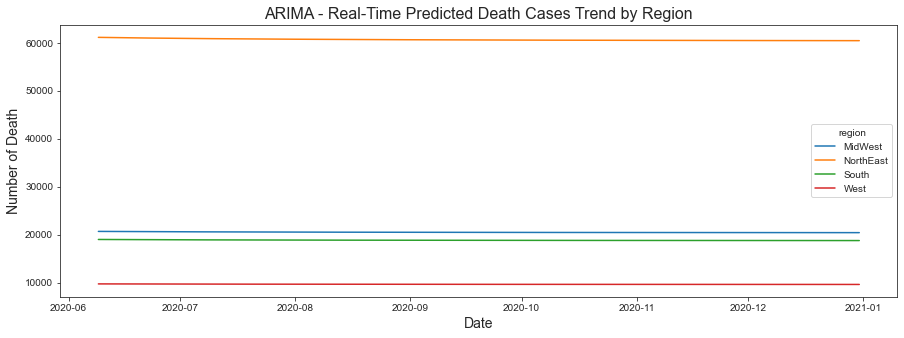

In [22]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=region_Nov, x="date", y="ARIMA", hue="region")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Death', fontsize=14)
plt.title('ARIMA - Real-Time Predicted Death Cases Trend by Region', fontsize=16)

Text(0.5, 1.0, 'HWAAS - Real-Time Predicted Death Cases Trend by Region')

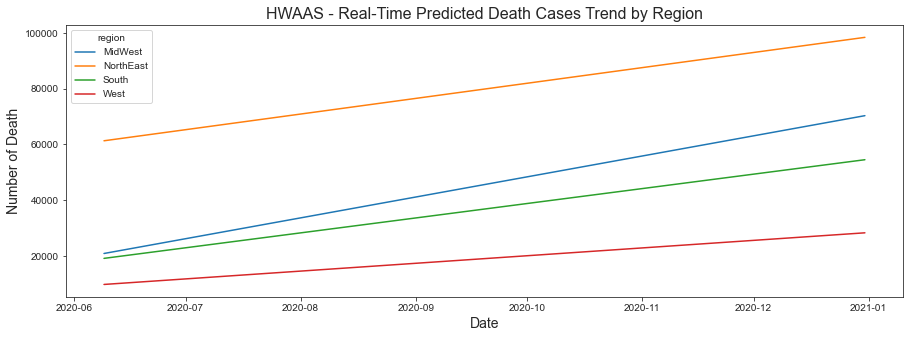

In [23]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=region_Nov, x="date", y="HWAAS", hue="region")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Death', fontsize=14)
plt.title('HWAAS - Real-Time Predicted Death Cases Trend by Region', fontsize=16)

Text(0.5, 1.0, 'Prohphet - Real-Time Predicted Death Cases Trend by Region')

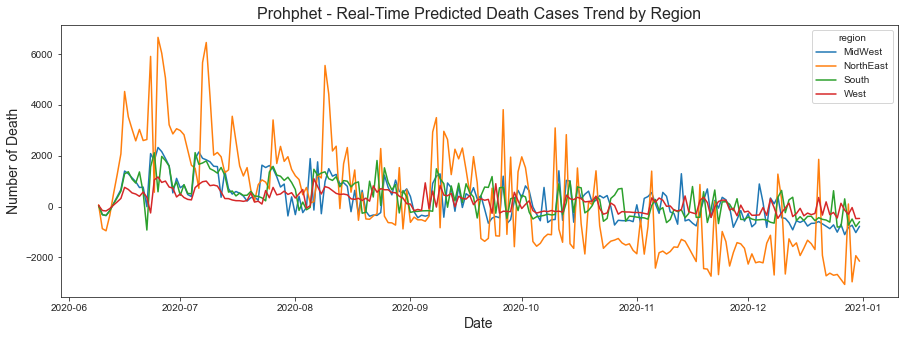

In [24]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=region_Nov, x="date", y="Prohphet", hue="region")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Death', fontsize=14)
plt.title('Prohphet - Real-Time Predicted Death Cases Trend by Region', fontsize=16)

## State Inpatient Bed

In [27]:
data_patient = pd.read_csv('./DATA/COVID-19_Reported_Patient_Impact_and_Hospital_Capacity_by_State_Timeseries.csv')
data_patient = data_patient[['date', 'state', 'inpatient_beds_used_covid']]
data_patient['date'] = pd.to_datetime(data_patient['date'])
data_patient = data_patient[(data_patient['date'] >= '2020-03-08') & (data_patient['date'] < '2021-01-01')]

In [28]:
data_patient_group = data_patient.groupby(['state'], as_index=False).sum()
data_patient_group = data_patient_group.sort_values(by=['inpatient_beds_used_covid'], ascending=False)
top_state = data_patient_group['state'][:5].tolist()
top_state

['CA', 'TX', 'FL', 'NY', 'IL']

In [30]:
data_patient_top = data_patient[data_patient['state'].isin(top_state)].sort_values(by=['date'])

Text(0.5, 1.0, 'Inpatient Beds Used Covid by State')

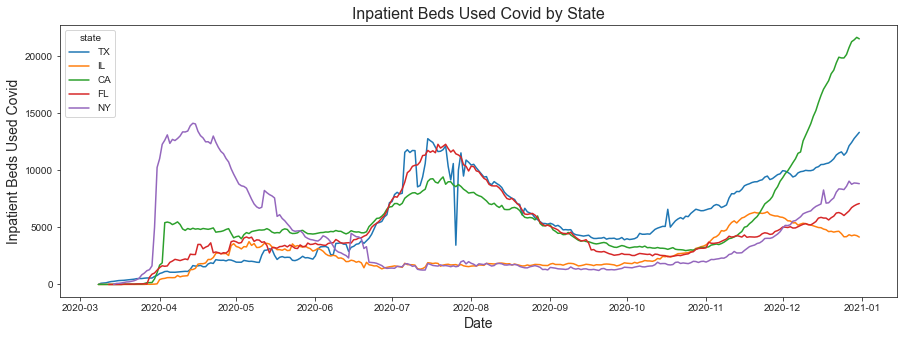

In [31]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=data_patient_top, x="date", y="inpatient_beds_used_covid", hue="state")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Inpatient Beds Used Covid', fontsize=14)
plt.title('Inpatient Beds Used Covid by State', fontsize=16)

In [32]:
# Performance Matrix
state_perform = pd.DataFrame(columns=['state', 'ARIMA', 'HWAAS', 'Prohphet'])
state_perform['state'] = top_state

In [33]:
# Predicted Values
data_patient_train = data_patient_top[(data_patient_top['date'] >= '2020-03-08') & (data_patient_top['date'] < '2020-06-09')].copy()
data_patient_test = data_patient_top[(data_patient_top['date'] >= '2020-06-09') & (data_patient_top['date'] < '2021-01-01')].copy()
state_Nov = data_patient_test.reindex(columns=['date', 'state', 'inpatient_beds_used_covid', 
                                               'ARIMA', 'HWAAS', 'Prohphet'])  
state_Nov['date'] = state_Nov['date'].dt.date.astype(str)

### ARIMA

In [34]:
# forecasting
date_list = data_patient_test['date'].dt.date.astype(str).unique().tolist()

for i in date_list:
    for j in top_state:
        train = data_patient_train[data_patient_train['state'] == j].reset_index()['inpatient_beds_used_covid']
        train = np.array(train)
        model = ARIMA(train, order=(2,0,0))
        model_fit = model.fit()
        output = model_fit.forecast()
        y_hat = output[0]
        state_Nov.loc[(state_Nov['date'] == i) & (state_Nov['state'] == j), 'ARIMA'] = y_hat
        data_patient_train.loc[len(data_patient_train)] = [i, j, y_hat]   

In [35]:
# evaluate forecasts
for j in top_state:
    result = state_Nov[state_Nov['state'] == j]
    rmse = math.sqrt(mean_squared_error(result['inpatient_beds_used_covid'], result['ARIMA'])) 
    state_perform.loc[state_perform['state'] == j, 'ARIMA'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

CA Test RMSE: 5133.5191
TX Test RMSE: 5638.0967
FL Test RMSE: 3421.3126
NY Test RMSE: 2199.9689
IL Test RMSE: 1622.7716


### HWAAS

In [36]:
data_patient_train = data_patient_top[(data_patient_top['date'] >= '2020-03-08') & (data_patient_top['date'] < '2020-06-09')].copy()
# forecasting
for i in date_list:
    for j in top_state:
        train = data_patient_train[data_patient_train['state'] == j].reset_index()['inpatient_beds_used_covid']
        train = np.array(train)
        model = ExponentialSmoothing(endog=train, trend='add', initialization_method='estimated')
        model_fit = model.fit()
        output = model_fit.forecast()
        y_hat = output[0]
        state_Nov.loc[(state_Nov['date'] == i) & (state_Nov['state'] == j), 'HWAAS'] = y_hat
        data_patient_train.loc[len(data_patient_train)] = [i, j, y_hat]   

In [37]:
# evaluate forecasts
for j in top_state:
    result = state_Nov[state_Nov['state'] == j]
    rmse = math.sqrt(mean_squared_error(result['inpatient_beds_used_covid'], result['HWAAS'])) 
    state_perform.loc[state_perform['state'] == j, 'HWAAS'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

CA Test RMSE: 4938.9835
TX Test RMSE: 5410.2842
FL Test RMSE: 3321.4639
NY Test RMSE: 2147.0905
IL Test RMSE: 1665.3859


### Prohphet

In [38]:
data_patient_train = data_patient_top[(data_patient_top['date'] >= '2020-03-08') & (data_patient_top['date'] < '2020-06-09')].copy()
# forecasting
for i in date_list:
    for j in top_state:
        train = data_patient_train[data_patient_train['state'] == j].reset_index()[['date', 'inpatient_beds_used_covid']]
        train = train.rename(columns={'inpatient_beds_used_covid': 'y', 'date': 'ds'})
        model = Prophet(yearly_seasonality=True, daily_seasonality=True)
        model_fit = model.fit(train)
        future_dates=model.make_future_dataframe(periods=1)
        y_hat = model_fit.predict(future_dates).iloc()[0]['yhat']
        state_Nov.loc[(state_Nov['date'] == i) & (state_Nov['state'] == j), 'Prohphet'] = y_hat
        data_patient_train.loc[len(data_patient_train)] = [i, j, y_hat]   


Initial log joint probability = -149.823
Iteration  1. Log joint probability =    61.8969. Improved by 211.72.
Iteration  2. Log joint probability =    94.9778. Improved by 33.0809.
Iteration  3. Log joint probability =    124.499. Improved by 29.5212.
Iteration  4. Log joint probability =    153.384. Improved by 28.8853.
Iteration  5. Log joint probability =    173.022. Improved by 19.6375.
Iteration  6. Log joint probability =    178.195. Improved by 5.17331.
Iteration  7. Log joint probability =    178.956. Improved by 0.760724.
Iteration  8. Log joint probability =    179.342. Improved by 0.385978.
Iteration  9. Log joint probability =     179.36. Improved by 0.0184453.
Iteration 10. Log joint probability =    179.539. Improved by 0.178368.
Iteration 11. Log joint probability =    179.878. Improved by 0.339324.
Iteration 12. Log joint probability =    179.923. Improved by 0.0448773.
Iteration 13. Log joint probability =    179.978. Improved by 0.0547004.
Iteration 14. Log joint pr


Initial log joint probability = -150.536
Iteration  1. Log joint probability =     49.889. Improved by 200.425.
Iteration  2. Log joint probability =    99.0907. Improved by 49.2017.
Iteration  3. Log joint probability =    139.532. Improved by 40.441.
Iteration  4. Log joint probability =     146.94. Improved by 7.40797.
Iteration  5. Log joint probability =    173.205. Improved by 26.2651.
Iteration  6. Log joint probability =    193.183. Improved by 19.9787.
Iteration  7. Log joint probability =    193.491. Improved by 0.307552.
Iteration  8. Log joint probability =    193.493. Improved by 0.00172994.
Iteration  9. Log joint probability =    193.573. Improved by 0.0803973.
Iteration 10. Log joint probability =    193.622. Improved by 0.0491247.
Iteration 11. Log joint probability =    194.167. Improved by 0.544703.
Iteration 12. Log joint probability =    194.186. Improved by 0.0189299.
Iteration 13. Log joint probability =     194.26. Improved by 0.0740152.
Iteration 14. Log joint

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -172.798
Iteration  1. Log joint probability =    29.0745. Improved by 201.872.
Iteration  2. Log joint probability =    82.8473. Improved by 53.7728.
Iteration  3. Log joint probability =    147.582. Improved by 64.7346.
Iteration  4. Log joint probability =    148.578. Improved by 0.995995.
Iteration  5. Log joint probability =     161.01. Improved by 12.432.
Iteration  6. Log joint probability =    161.685. Improved by 0.674952.
Iteration  7. Log joint probability =    161.796. Improved by 0.11145.
Iteration  8. Log joint probability =     161.85. Improved by 0.0537512.
Iteration  9. Log joint probability =    161.871. Improved by 0.0206359.
Iteration 10. Log joint probability =    161.929. Improved by 0.0584728.
Iteration 11. Log joint probability =    162.065. Improved by 0.135843.
Iteration 12. Log joint probability =    162.094. Improved by 0.0285858.
Iteration 13. Log joint probability =    162.129. Improved by 0.0358064.
Iteration 14. Log joint

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.83
Iteration  1. Log joint probability =    47.9612. Improved by 209.791.
Iteration  2. Log joint probability =    65.6208. Improved by 17.6596.
Iteration  3. Log joint probability =    131.943. Improved by 66.3222.
Iteration  4. Log joint probability =     151.18. Improved by 19.2372.
Iteration  5. Log joint probability =    183.438. Improved by 32.2582.
Iteration  6. Log joint probability =    204.466. Improved by 21.0273.
Iteration  7. Log joint probability =    205.359. Improved by 0.893486.
Iteration  8. Log joint probability =    205.823. Improved by 0.463622.
Iteration  9. Log joint probability =    206.254. Improved by 0.431329.
Iteration 10. Log joint probability =    206.287. Improved by 0.0325672.
Iteration 11. Log joint probability =    206.366. Improved by 0.0790809.
Iteration 12. Log joint probability =    206.528. Improved by 0.162593.
Iteration 13. Log joint probability =    206.618. Improved by 0.0893892.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.314
Iteration  1. Log joint probability =   -12.3281. Improved by 149.986.
Iteration  2. Log joint probability =    90.4249. Improved by 102.753.
Iteration  3. Log joint probability =    141.345. Improved by 50.9203.
Iteration  4. Log joint probability =    173.143. Improved by 31.7973.
Iteration  5. Log joint probability =    177.954. Improved by 4.81154.
Iteration  6. Log joint probability =    178.186. Improved by 0.231693.
Iteration  7. Log joint probability =    178.339. Improved by 0.153387.
Iteration  8. Log joint probability =    178.359. Improved by 0.0202872.
Iteration  9. Log joint probability =    178.367. Improved by 0.00786335.
Iteration 10. Log joint probability =    178.373. Improved by 0.00576122.
Iteration 11. Log joint probability =    178.377. Improved by 0.00357611.
Iteration 12. Log joint probability =    178.378. Improved by 0.00153287.
Iteration 13. Log joint probability =    178.381. Improved by 0.00287618.
Iteration 14. Lo

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -155.847
Iteration  1. Log joint probability =    44.1114. Improved by 199.959.
Iteration  2. Log joint probability =    120.182. Improved by 76.0704.
Iteration  3. Log joint probability =    161.153. Improved by 40.9715.
Iteration  4. Log joint probability =    187.291. Improved by 26.1377.
Iteration  5. Log joint probability =    194.914. Improved by 7.62279.
Iteration  6. Log joint probability =    195.099. Improved by 0.185262.
Iteration  7. Log joint probability =    195.315. Improved by 0.21543.
Iteration  8. Log joint probability =    195.351. Improved by 0.0364275.
Iteration  9. Log joint probability =    195.558. Improved by 0.207122.
Iteration 10. Log joint probability =    195.582. Improved by 0.0243153.
Iteration 11. Log joint probability =    195.598. Improved by 0.0151868.
Iteration 12. Log joint probability =    195.623. Improved by 0.0258174.
Iteration 13. Log joint probability =     195.71. Improved by 0.0863186.
Iteration 14. Log joint

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -163.942
Iteration  1. Log joint probability =    42.8246. Improved by 206.766.
Iteration  2. Log joint probability =    124.789. Improved by 81.9648.
Iteration  3. Log joint probability =    176.221. Improved by 51.4314.
Iteration  4. Log joint probability =    218.567. Improved by 42.346.
Iteration  5. Log joint probability =    224.737. Improved by 6.1699.
Iteration  6. Log joint probability =    225.673. Improved by 0.936615.
Iteration  7. Log joint probability =    226.104. Improved by 0.430896.
Iteration  8. Log joint probability =    226.126. Improved by 0.0215306.
Iteration  9. Log joint probability =    226.287. Improved by 0.161043.
Iteration 10. Log joint probability =    226.348. Improved by 0.0616941.
Iteration 11. Log joint probability =     226.42. Improved by 0.0711696.
Iteration 12. Log joint probability =    226.466. Improved by 0.0460185.
Iteration 13. Log joint probability =    226.576. Improved by 0.110631.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -174.322
Iteration  1. Log joint probability =    25.1627. Improved by 199.485.
Iteration  2. Log joint probability =    76.2826. Improved by 51.1198.
Iteration  3. Log joint probability =     131.36. Improved by 55.077.
Iteration  4. Log joint probability =    156.563. Improved by 25.2038.
Iteration  5. Log joint probability =    160.033. Improved by 3.46969.
Iteration  6. Log joint probability =    161.575. Improved by 1.54179.
Iteration  7. Log joint probability =    162.141. Improved by 0.566404.
Iteration  8. Log joint probability =     162.38. Improved by 0.23913.
Iteration  9. Log joint probability =    162.595. Improved by 0.214828.
Iteration 10. Log joint probability =    162.699. Improved by 0.103598.
Iteration 11. Log joint probability =    162.715. Improved by 0.0159274.
Iteration 12. Log joint probability =    162.775. Improved by 0.0604215.
Iteration 13. Log joint probability =    162.899. Improved by 0.123711.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -163.076
Iteration  1. Log joint probability =    47.2636. Improved by 210.34.
Iteration  2. Log joint probability =    94.9652. Improved by 47.7017.
Iteration  3. Log joint probability =    124.907. Improved by 29.9415.
Iteration  4. Log joint probability =    160.691. Improved by 35.7843.
Iteration  5. Log joint probability =    198.509. Improved by 37.8185.
Iteration  6. Log joint probability =    205.417. Improved by 6.90745.
Iteration  7. Log joint probability =    206.247. Improved by 0.82975.
Iteration  8. Log joint probability =    206.624. Improved by 0.376876.
Iteration  9. Log joint probability =    206.658. Improved by 0.034523.
Iteration 10. Log joint probability =    206.703. Improved by 0.0448923.
Iteration 11. Log joint probability =    207.142. Improved by 0.438629.
Iteration 12. Log joint probability =    207.459. Improved by 0.317295.
Iteration 13. Log joint probability =    207.499. Improved by 0.0398436.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -163.756
Iteration  1. Log joint probability =    35.3809. Improved by 199.137.
Iteration  2. Log joint probability =    100.426. Improved by 65.045.
Iteration  3. Log joint probability =    155.742. Improved by 55.3158.
Iteration  4. Log joint probability =    171.588. Improved by 15.846.
Iteration  5. Log joint probability =    175.439. Improved by 3.85183.
Iteration  6. Log joint probability =    177.747. Improved by 2.30728.
Iteration  7. Log joint probability =     178.21. Improved by 0.463267.
Iteration  8. Log joint probability =    178.954. Improved by 0.744099.
Iteration  9. Log joint probability =    179.383. Improved by 0.428509.
Iteration 10. Log joint probability =    179.625. Improved by 0.242817.
Iteration 11. Log joint probability =    179.682. Improved by 0.0565617.
Iteration 12. Log joint probability =    180.038. Improved by 0.356151.
Iteration 13. Log joint probability =    180.083. Improved by 0.0444582.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -156.837
Iteration  1. Log joint probability =    44.7767. Improved by 201.614.
Iteration  2. Log joint probability =    106.991. Improved by 62.2141.
Iteration  3. Log joint probability =    161.854. Improved by 54.863.
Iteration  4. Log joint probability =    192.584. Improved by 30.7305.
Iteration  5. Log joint probability =    197.161. Improved by 4.57645.
Iteration  6. Log joint probability =    197.774. Improved by 0.613324.
Iteration  7. Log joint probability =    198.094. Improved by 0.319554.
Iteration  8. Log joint probability =    198.323. Improved by 0.229211.
Iteration  9. Log joint probability =    198.561. Improved by 0.238102.
Iteration 10. Log joint probability =    198.582. Improved by 0.0205121.
Iteration 11. Log joint probability =    198.585. Improved by 0.00309934.
Iteration 12. Log joint probability =    198.592. Improved by 0.00771926.
Iteration 13. Log joint probability =    198.617. Improved by 0.0247996.
Iteration 14. Log join

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.192
Iteration  1. Log joint probability =    43.0222. Improved by 208.214.
Iteration  2. Log joint probability =    114.332. Improved by 71.3098.
Iteration  3. Log joint probability =    168.076. Improved by 53.7438.
Iteration  4. Log joint probability =    199.601. Improved by 31.5252.
Iteration  5. Log joint probability =    223.518. Improved by 23.9172.
Iteration  6. Log joint probability =    226.961. Improved by 3.44279.
Iteration  7. Log joint probability =    227.217. Improved by 0.255466.
Iteration  8. Log joint probability =    228.038. Improved by 0.821635.
Iteration  9. Log joint probability =    228.263. Improved by 0.224861.
Iteration 10. Log joint probability =    228.634. Improved by 0.370996.
Iteration 11. Log joint probability =    228.743. Improved by 0.109298.
Iteration 12. Log joint probability =    228.866. Improved by 0.122617.
Iteration 13. Log joint probability =    228.909. Improved by 0.0435108.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -175.379
Iteration  1. Log joint probability =    20.5897. Improved by 195.968.
Iteration  2. Log joint probability =    72.3692. Improved by 51.7795.
Iteration  3. Log joint probability =    84.1398. Improved by 11.7706.
Iteration  4. Log joint probability =    116.881. Improved by 32.7414.
Iteration  5. Log joint probability =    157.631. Improved by 40.7501.
Iteration  6. Log joint probability =    162.505. Improved by 4.87323.
Iteration  7. Log joint probability =    163.771. Improved by 1.26661.
Iteration  8. Log joint probability =    163.871. Improved by 0.0997617.
Iteration  9. Log joint probability =    164.044. Improved by 0.173496.
Iteration 10. Log joint probability =    164.334. Improved by 0.289509.
Iteration 11. Log joint probability =     164.35. Improved by 0.0162442.
Iteration 12. Log joint probability =    164.426. Improved by 0.0756955.
Iteration 13. Log joint probability =    164.475. Improved by 0.0490917.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -163.811
Iteration  1. Log joint probability =    46.8689. Improved by 210.68.
Iteration  2. Log joint probability =    95.8371. Improved by 48.9681.
Iteration  3. Log joint probability =    140.725. Improved by 44.8875.
Iteration  4. Log joint probability =    176.804. Improved by 36.0796.
Iteration  5. Log joint probability =    192.502. Improved by 15.6983.
Iteration  6. Log joint probability =     194.27. Improved by 1.76736.
Iteration  7. Log joint probability =     194.84. Improved by 0.570633.
Iteration  8. Log joint probability =    195.113. Improved by 0.272592.
Iteration  9. Log joint probability =    195.719. Improved by 0.606303.
Iteration 10. Log joint probability =    195.722. Improved by 0.00241472.
Iteration 11. Log joint probability =    195.742. Improved by 0.0197906.
Iteration 12. Log joint probability =    195.786. Improved by 0.0446514.
Iteration 13. Log joint probability =    195.789. Improved by 0.00320915.
Iteration 14. Log joint

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.725
Iteration  1. Log joint probability =    36.1825. Improved by 200.908.
Iteration  2. Log joint probability =     105.72. Improved by 69.5377.
Iteration  3. Log joint probability =    143.204. Improved by 37.4837.
Iteration  4. Log joint probability =    166.038. Improved by 22.834.
Iteration  5. Log joint probability =    177.779. Improved by 11.7409.
Iteration  6. Log joint probability =    178.516. Improved by 0.737441.
Iteration  7. Log joint probability =    178.966. Improved by 0.450304.
Iteration  8. Log joint probability =    179.361. Improved by 0.394321.
Iteration  9. Log joint probability =    179.548. Improved by 0.187228.
Iteration 10. Log joint probability =    179.942. Improved by 0.393597.
Iteration 11. Log joint probability =    180.194. Improved by 0.252416.
Iteration 12. Log joint probability =    180.268. Improved by 0.0736099.
Iteration 13. Log joint probability =    180.381. Improved by 0.113271.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.706
Iteration  1. Log joint probability =    45.7106. Improved by 203.417.
Iteration  2. Log joint probability =    116.596. Improved by 70.8857.
Iteration  3. Log joint probability =    163.606. Improved by 47.0092.
Iteration  4. Log joint probability =    175.818. Improved by 12.2122.
Iteration  5. Log joint probability =    179.284. Improved by 3.46592.
Iteration  6. Log joint probability =     185.48. Improved by 6.19662.
Iteration  7. Log joint probability =    188.491. Improved by 3.01014.
Iteration  8. Log joint probability =    188.693. Improved by 0.202135.
Iteration  9. Log joint probability =    188.751. Improved by 0.0580238.
Iteration 10. Log joint probability =    188.975. Improved by 0.223987.
Iteration 11. Log joint probability =    189.085. Improved by 0.109876.
Iteration 12. Log joint probability =    189.309. Improved by 0.224235.
Iteration 13. Log joint probability =     189.41. Improved by 0.101138.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.153
Iteration  1. Log joint probability =    43.8025. Improved by 209.956.
Iteration  2. Log joint probability =    120.208. Improved by 76.405.
Iteration  3. Log joint probability =    144.727. Improved by 24.5195.
Iteration  4. Log joint probability =    175.637. Improved by 30.91.
Iteration  5. Log joint probability =    187.361. Improved by 11.7238.
Iteration  6. Log joint probability =    201.911. Improved by 14.5502.
Iteration  7. Log joint probability =    202.197. Improved by 0.286032.
Iteration  8. Log joint probability =    202.314. Improved by 0.117355.
Iteration  9. Log joint probability =    202.472. Improved by 0.158038.
Iteration 10. Log joint probability =    202.794. Improved by 0.322024.
Iteration 11. Log joint probability =    202.895. Improved by 0.100413.
Iteration 12. Log joint probability =    202.931. Improved by 0.0358663.
Iteration 13. Log joint probability =    202.966. Improved by 0.0348411.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.026
Iteration  1. Log joint probability =    14.7732. Improved by 190.799.
Iteration  2. Log joint probability =    69.3909. Improved by 54.6177.
Iteration  3. Log joint probability =    119.006. Improved by 49.6148.
Iteration  4. Log joint probability =    159.372. Improved by 40.3658.
Iteration  5. Log joint probability =     163.36. Improved by 3.9885.
Iteration  6. Log joint probability =    163.528. Improved by 0.167942.
Iteration  7. Log joint probability =    163.955. Improved by 0.427441.
Iteration  8. Log joint probability =    164.011. Improved by 0.056013.
Iteration  9. Log joint probability =    164.017. Improved by 0.00546082.
Iteration 10. Log joint probability =    164.095. Improved by 0.0777228.
Iteration 11. Log joint probability =    164.125. Improved by 0.0302397.
Iteration 12. Log joint probability =    164.143. Improved by 0.0181687.
Iteration 13. Log joint probability =     164.16. Improved by 0.016575.
Iteration 14. Log joint

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -176.578
Iteration  1. Log joint probability =    9.62858. Improved by 186.207.
Iteration  2. Log joint probability =    66.8909. Improved by 57.2623.
Iteration  3. Log joint probability =    108.287. Improved by 41.3965.
Iteration  4. Log joint probability =    148.572. Improved by 40.2843.
Iteration  5. Log joint probability =    159.891. Improved by 11.3197.
Iteration  6. Log joint probability =    161.783. Improved by 1.89143.
Iteration  7. Log joint probability =    162.499. Improved by 0.716259.
Iteration  8. Log joint probability =    162.645. Improved by 0.146227.
Iteration  9. Log joint probability =    162.913. Improved by 0.26776.
Iteration 10. Log joint probability =    162.952. Improved by 0.0391272.
Iteration 11. Log joint probability =    162.985. Improved by 0.0324617.
Iteration 12. Log joint probability =    163.019. Improved by 0.0348615.
Iteration 13. Log joint probability =    163.037. Improved by 0.0177391.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.143
Iteration  1. Log joint probability =     46.365. Improved by 210.508.
Iteration  2. Log joint probability =     91.399. Improved by 45.034.
Iteration  3. Log joint probability =    131.317. Improved by 39.9185.
Iteration  4. Log joint probability =    146.485. Improved by 15.1678.
Iteration  5. Log joint probability =    170.064. Improved by 23.5793.
Iteration  6. Log joint probability =    171.567. Improved by 1.50283.
Iteration  7. Log joint probability =    173.258. Improved by 1.69045.
Iteration  8. Log joint probability =    174.283. Improved by 1.02571.
Iteration  9. Log joint probability =    174.666. Improved by 0.38299.
Iteration 10. Log joint probability =     175.37. Improved by 0.703613.
Iteration 11. Log joint probability =    175.697. Improved by 0.326582.
Iteration 12. Log joint probability =    175.851. Improved by 0.154702.
Iteration 13. Log joint probability =    175.866. Improved by 0.0142849.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.384
Iteration  1. Log joint probability =    37.5385. Improved by 202.923.
Iteration  2. Log joint probability =    105.066. Improved by 67.5279.
Iteration  3. Log joint probability =     159.49. Improved by 54.4233.
Iteration  4. Log joint probability =    174.101. Improved by 14.6109.
Iteration  5. Log joint probability =    175.911. Improved by 1.81001.
Iteration  6. Log joint probability =    176.919. Improved by 1.0085.
Iteration  7. Log joint probability =     177.13. Improved by 0.211203.
Iteration  8. Log joint probability =    177.175. Improved by 0.0443646.
Iteration  9. Log joint probability =    177.571. Improved by 0.39593.
Iteration 10. Log joint probability =    177.668. Improved by 0.0974001.
Iteration 11. Log joint probability =     177.77. Improved by 0.101505.
Iteration 12. Log joint probability =    177.794. Improved by 0.0249121.
Iteration 13. Log joint probability =    178.114. Improved by 0.319209.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.1
Iteration  1. Log joint probability =    47.0662. Improved by 204.166.
Iteration  2. Log joint probability =    111.971. Improved by 64.905.
Iteration  3. Log joint probability =    161.812. Improved by 49.8406.
Iteration  4. Log joint probability =    174.834. Improved by 13.0226.
Iteration  5. Log joint probability =    190.729. Improved by 15.8944.
Iteration  6. Log joint probability =    193.815. Improved by 3.08638.
Iteration  7. Log joint probability =    194.644. Improved by 0.82918.
Iteration  8. Log joint probability =    194.698. Improved by 0.0539289.
Iteration  9. Log joint probability =    195.086. Improved by 0.387285.
Iteration 10. Log joint probability =    195.147. Improved by 0.0615749.
Iteration 11. Log joint probability =    195.214. Improved by 0.0667461.
Iteration 12. Log joint probability =    195.288. Improved by 0.074381.
Iteration 13. Log joint probability =    195.319. Improved by 0.0305012.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.896
Iteration  1. Log joint probability =      45.07. Improved by 211.966.
Iteration  2. Log joint probability =    57.2806. Improved by 12.2106.
Iteration  3. Log joint probability =    133.643. Improved by 76.3628.
Iteration  4. Log joint probability =    177.991. Improved by 44.3472.
Iteration  5. Log joint probability =    205.102. Improved by 27.1113.
Iteration  6. Log joint probability =    220.338. Improved by 15.236.
Iteration  7. Log joint probability =    221.254. Improved by 0.915784.
Iteration  8. Log joint probability =     221.27. Improved by 0.0160577.
Iteration  9. Log joint probability =    221.642. Improved by 0.372319.
Iteration 10. Log joint probability =    221.643. Improved by 0.0011376.
Iteration 11. Log joint probability =    221.699. Improved by 0.0558419.
Iteration 12. Log joint probability =    221.737. Improved by 0.0381524.
Iteration 13. Log joint probability =     221.79. Improved by 0.0527188.
Iteration 14. Log joint 

In [40]:
# evaluate forecasts
for j in top_state:
    result = state_Nov[state_Nov['state'] == j]
    rmse = math.sqrt(mean_squared_error(result['inpatient_beds_used_covid'], result['Prohphet'])) 
    state_perform.loc[state_perform['state'] == j, 'Prohphet'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

CA Test RMSE: 8559.4820
TX Test RMSE: 7962.8893
FL Test RMSE: 6273.7870
NY Test RMSE: 3257.3244
IL Test RMSE: 3305.4146


### Results

In [41]:
state_perform

,state,ARIMA,HWAAS,Prohphet
0,CA,5133.51915,4938.98353,8559.48199
1,TX,5638.096748,5410.284247,7962.889301
2,FL,3421.312551,3321.463932,6273.787035
3,NY,2199.968877,2147.090471,3257.324433
4,IL,1622.771579,1665.385902,3305.414595


In [42]:
state_Nov['date']= pd.to_datetime(region_Nov['date'])

Text(0.5, 1.0, 'ARIMA - Real-Time Predicted Inpatient Beds Used Covid by State')

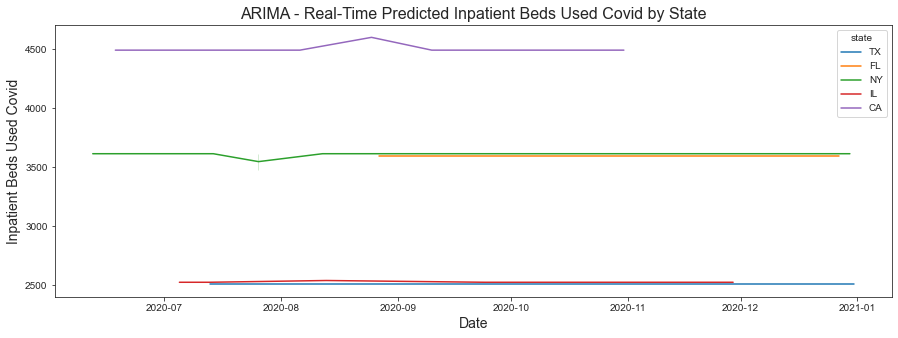

In [43]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=state_Nov, x="date", y="ARIMA", hue="state")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Inpatient Beds Used Covid', fontsize=14)
plt.title('ARIMA - Real-Time Predicted Inpatient Beds Used Covid by State', fontsize=16)

Text(0.5, 1.0, 'HWAAS - Real-Time Predicted Inpatient Beds Used Covid by State')

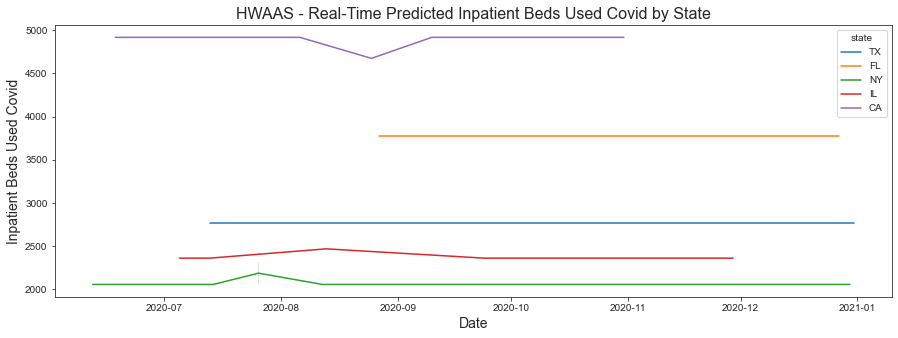

In [44]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=state_Nov, x="date", y="HWAAS", hue="state")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Inpatient Beds Used Covid', fontsize=14)
plt.title('HWAAS - Real-Time Predicted Inpatient Beds Used Covid by State', fontsize=16)

Text(0.5, 1.0, 'Prohphet - Real-Time Predicted Inpatient Beds Used Covid by State')

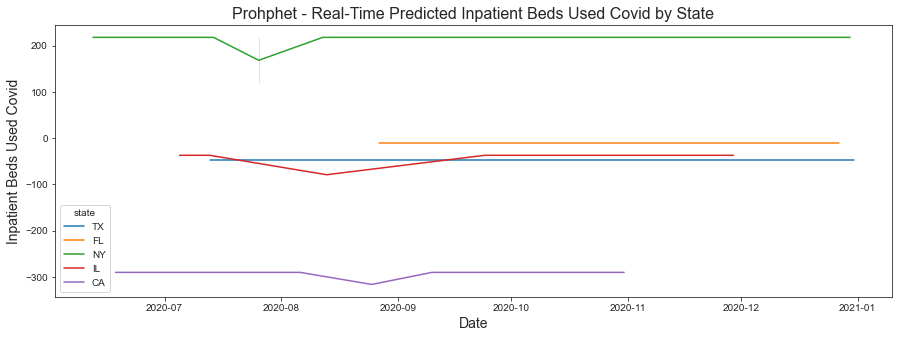

In [45]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=state_Nov, x="date", y="Prohphet", hue="state")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Inpatient Beds Used Covid', fontsize=14)
plt.title('Prohphet - Real-Time Predicted Inpatient Beds Used Covid by State', fontsize=16)

## County Deaths

In [47]:
data_county = pd.read_csv('./DATA/us-counties.csv')
data_county = data_county[['date', 'county', 'deaths']]
data_county['date'] = pd.to_datetime(data_county['date'])
data_county = data_county[(data_county['date'] >= '2020-03-08') & (data_county['date'] < '2021-01-01')]

In [48]:
data_pop = pd.read_csv('./DATA/co-est2020.csv')
data_pop = data_pop[['CTYNAME', 'POPESTIMATE2020']]
data_pop = data_pop.sort_values(by=['POPESTIMATE2020'], ascending=False)
data_pop = data_pop[data_pop['CTYNAME'].str[-6:] == 'County']
top_county = data_pop['CTYNAME'][:5].str[:-7].tolist()
#top_county = ['Washington', 'New York City', 'Los Angeles', 'Ohio', 'Indiana']

In [49]:
data_county_top = data_county[data_county['county'].isin(top_county)]
data_county_top = data_county_top.groupby(['date', 'county'], as_index=False).sum()

Text(0.5, 1.0, 'Death Cases Trend by County')

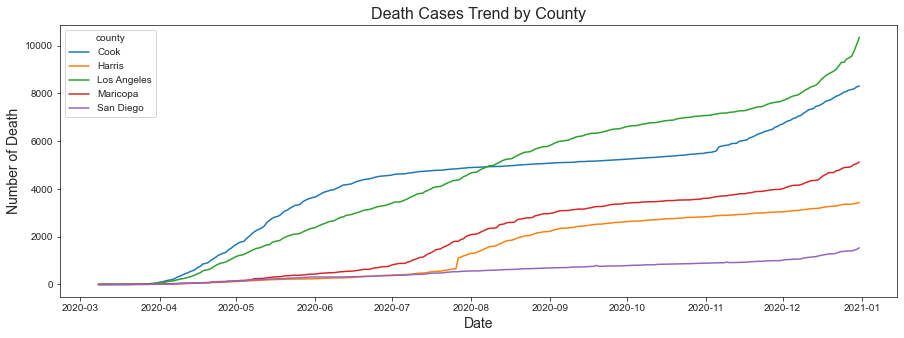

In [50]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=data_county_top, x="date", y="deaths", hue="county")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Death', fontsize=14)
plt.title('Death Cases Trend by County', fontsize=16)

In [51]:
# Performance Matrix
county_perform = pd.DataFrame(columns=['county', 'ARIMA', 'HWAAS', 'Prohphet'])
county_list = data_county_top['county'].unique().tolist()
county_perform['county'] = county_list

In [52]:
# Predicted Values
data_county_train = data_county_top[(data_county_top['date'] >= '2020-03-08') & (data_county_top['date'] < '2020-06-09')].copy()
data_county_test = data_county_top[(data_county_top['date'] >= '2020-06-09') & (data_county_top['date'] < '2021-02-01')].copy()
county_Nov = data_county_test.reindex(columns=['date', 'county', 'deaths', 'ARIMA', 'HWAAS', 'Prohphet'])  
county_Nov['date'] = county_Nov['date'].dt.date.astype(str)

### ARIMA

In [54]:
date_list = data_county_test['date'].dt.date.astype(str).unique().tolist()

for i in date_list:
    for j in county_list:
        train = data_county_train[data_county_train['county'] == j].reset_index()['deaths']
        train = np.array(train)
        model = ARIMA(train, order=(1,0,0))
        model_fit = model.fit()
        output = model_fit.forecast()
        y_hat = output[0]
        county_Nov.loc[(county_Nov['date'] == i) & (county_Nov['county'] == j), 'ARIMA'] = y_hat
        data_county_train.loc[len(data_county_train)] = [i, j, y_hat]

In [56]:
# evaluate forecasts
for j in county_list:
    result = county_Nov[county_Nov['county'] == j]
    rmse = math.sqrt(mean_squared_error(result['deaths'], result['ARIMA'])) 
    county_perform.loc[county_perform['county'] == j, 'ARIMA'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

Cook Test RMSE: 1895.4550
Harris Test RMSE: 2096.9163
Los Angeles Test RMSE: 3854.8639
Maricopa Test RMSE: 2710.2983
San Diego Test RMSE: 537.0620


### HWAAS

In [57]:
data_county_train = data_county_top[(data_county_top['date'] >= '2020-03-08') & (data_county_top['date'] < '2020-06-09')].copy()
# forecasting
for i in date_list:
    for j in county_list:
        train = data_county_train[data_county_train['county'] == j].reset_index()['deaths']
        train = np.array(train)
        model = ExponentialSmoothing(endog=train, trend='add', initialization_method='estimated')
        model_fit = model.fit()
        output = model_fit.forecast()
        y_hat = output[0]
        county_Nov.loc[(county_Nov['date'] == i) & (county_Nov['county'] == j), 'HWAAS'] = y_hat
        data_county_train.loc[len(data_county_train)] = [i, j, y_hat]

In [59]:
# evaluate forecasts
for j in county_list:
    result = county_Nov[county_Nov['county'] == j]
    rmse = math.sqrt(mean_squared_error(result['deaths'], result['HWAAS'])) 
    county_perform.loc[county_perform['county'] == j, 'HWAAS'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

Cook Test RMSE: 2606.6343
Harris Test RMSE: 1707.5306
Los Angeles Test RMSE: 400.8230
Maricopa Test RMSE: 1853.6765
San Diego Test RMSE: 276.3225


### Prohphet

In [60]:
data_county_train = data_county_top[(data_county_top['date'] >= '2020-03-08') & (data_county_top['date'] < '2020-06-09')].copy()
# forecasting
for i in date_list:
    for j in county_list:
        train = data_county_train[data_county_train['county'] == j].reset_index()[['date', 'deaths']]
        train = train.rename(columns={'deaths': 'y', 'date': 'ds'})
        model = Prophet(yearly_seasonality=True, daily_seasonality=True)
        model_fit = model.fit(train)
        future_dates=model.make_future_dataframe(periods=1)
        y_hat = model_fit.predict(future_dates).iloc()[0]['yhat']
        county_Nov.loc[(county_Nov['date'] == i) & (county_Nov['county'] == j), 'Prohphet'] = y_hat
        data_county_train.loc[len(data_county_train)] = [i, j, y_hat]


Initial log joint probability = -145.911
Iteration  1. Log joint probability =    78.5056. Improved by 224.416.
Iteration  2. Log joint probability =    142.225. Improved by 63.719.
Iteration  3. Log joint probability =    211.563. Improved by 69.3387.
Iteration  4. Log joint probability =    268.445. Improved by 56.882.
Iteration  5. Log joint probability =    307.994. Improved by 39.5487.
Iteration  6. Log joint probability =    385.058. Improved by 77.0644.
Iteration  7. Log joint probability =    400.183. Improved by 15.1251.
Iteration  8. Log joint probability =    411.641. Improved by 11.4575.
Iteration  9. Log joint probability =    428.821. Improved by 17.1803.
Iteration 10. Log joint probability =    435.964. Improved by 7.14244.
Iteration 11. Log joint probability =    450.376. Improved by 14.4121.
Iteration 12. Log joint probability =    454.322. Improved by 3.94585.
Iteration 13. Log joint probability =    458.202. Improved by 3.87982.
Iteration 14. Log joint probability =


Initial log joint probability = -145.923
Iteration  1. Log joint probability =    79.2172. Improved by 225.14.
Iteration  2. Log joint probability =    139.438. Improved by 60.2207.
Iteration  3. Log joint probability =    216.371. Improved by 76.9332.
Iteration  4. Log joint probability =    254.401. Improved by 38.03.
Iteration  5. Log joint probability =    321.664. Improved by 67.2627.
Iteration  6. Log joint probability =    373.209. Improved by 51.5455.
Iteration  7. Log joint probability =    424.947. Improved by 51.7376.
Iteration  8. Log joint probability =    464.825. Improved by 39.878.
Iteration  9. Log joint probability =    467.281. Improved by 2.45585.
Iteration 10. Log joint probability =     467.63. Improved by 0.349557.
Iteration 11. Log joint probability =    467.681. Improved by 0.0502269.
Iteration 12. Log joint probability =      467.7. Improved by 0.0196488.
Iteration 13. Log joint probability =    467.717. Improved by 0.0168654.
Iteration 14. Log joint probabil


Initial log joint probability = -145.693
Iteration  1. Log joint probability =    75.2994. Improved by 220.992.
Iteration  2. Log joint probability =    161.107. Improved by 85.8075.
Iteration  3. Log joint probability =    182.593. Improved by 21.4862.
Iteration  4. Log joint probability =     278.46. Improved by 95.8671.
Iteration  5. Log joint probability =    332.376. Improved by 53.9158.
Iteration  6. Log joint probability =    365.816. Improved by 33.4403.
Iteration  7. Log joint probability =    371.275. Improved by 5.45849.
Iteration  8. Log joint probability =    371.641. Improved by 0.366053.
Iteration  9. Log joint probability =    372.106. Improved by 0.464708.
Iteration 10. Log joint probability =    372.314. Improved by 0.207976.
Iteration 11. Log joint probability =    372.329. Improved by 0.0154081.
Iteration 12. Log joint probability =    372.332. Improved by 0.00275915.
Iteration 13. Log joint probability =    372.361. Improved by 0.0294652.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.777
Iteration  1. Log joint probability =    53.9291. Improved by 211.706.
Iteration  2. Log joint probability =    92.1974. Improved by 38.2682.
Iteration  3. Log joint probability =    105.628. Improved by 13.4305.
Iteration  4. Log joint probability =    136.693. Improved by 31.0656.
Iteration  5. Log joint probability =    171.695. Improved by 35.0019.
Iteration  6. Log joint probability =    194.859. Improved by 23.1641.
Iteration  7. Log joint probability =    212.503. Improved by 17.6434.
Iteration  8. Log joint probability =    213.588. Improved by 1.08516.
Iteration  9. Log joint probability =    213.697. Improved by 0.109154.
Iteration 10. Log joint probability =    213.745. Improved by 0.0482289.
Iteration 11. Log joint probability =    214.029. Improved by 0.283225.
Iteration 12. Log joint probability =    214.533. Improved by 0.504604.
Iteration 13. Log joint probability =     214.59. Improved by 0.0563754.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -158.479
Iteration  1. Log joint probability =    54.0909. Improved by 212.569.
Iteration  2. Log joint probability =    105.085. Improved by 50.9939.
Iteration  3. Log joint probability =    156.138. Improved by 51.0534.
Iteration  4. Log joint probability =    190.707. Improved by 34.5691.
Iteration  5. Log joint probability =     209.21. Improved by 18.5031.
Iteration  6. Log joint probability =    211.387. Improved by 2.17638.
Iteration  7. Log joint probability =    212.108. Improved by 0.72172.
Iteration  8. Log joint probability =    212.423. Improved by 0.314583.
Iteration  9. Log joint probability =    213.017. Improved by 0.594315.
Iteration 10. Log joint probability =    213.069. Improved by 0.0517612.
Iteration 11. Log joint probability =    213.077. Improved by 0.00792118.
Iteration 12. Log joint probability =    213.084. Improved by 0.00715944.
Iteration 13. Log joint probability =    213.086. Improved by 0.00175946.
Iteration 14. Log join

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.192
Iteration  1. Log joint probability =    52.0777. Improved by 209.27.
Iteration  2. Log joint probability =    106.329. Improved by 54.2518.
Iteration  3. Log joint probability =    156.607. Improved by 50.2779.
Iteration  4. Log joint probability =    196.431. Improved by 39.8232.
Iteration  5. Log joint probability =    212.761. Improved by 16.3304.
Iteration  6. Log joint probability =    213.362. Improved by 0.600917.
Iteration  7. Log joint probability =    213.456. Improved by 0.0945486.
Iteration  8. Log joint probability =    213.572. Improved by 0.116083.
Iteration  9. Log joint probability =    213.592. Improved by 0.0192571.
Iteration 10. Log joint probability =    213.603. Improved by 0.0108651.
Iteration 11. Log joint probability =    213.604. Improved by 0.00117212.
Iteration 12. Log joint probability =    213.609. Improved by 0.00503823.
Iteration 13. Log joint probability =    213.611. Improved by 0.00235505.
Iteration 14. Log j

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -155.906
Iteration  1. Log joint probability =    39.8825. Improved by 195.788.
Iteration  2. Log joint probability =    94.8504. Improved by 54.9679.
Iteration  3. Log joint probability =    127.052. Improved by 32.2013.
Iteration  4. Log joint probability =    162.003. Improved by 34.9515.
Iteration  5. Log joint probability =    191.719. Improved by 29.7158.
Iteration  6. Log joint probability =    205.534. Improved by 13.8153.
Iteration  7. Log joint probability =    212.292. Improved by 6.75793.
Iteration  8. Log joint probability =    212.647. Improved by 0.354758.
Iteration  9. Log joint probability =    212.755. Improved by 0.10808.
Iteration 10. Log joint probability =    213.149. Improved by 0.394241.
Iteration 11. Log joint probability =    213.743. Improved by 0.594113.
Iteration 12. Log joint probability =    213.776. Improved by 0.0330607.
Iteration 13. Log joint probability =    213.797. Improved by 0.0204003.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -159.263
Iteration  1. Log joint probability =    53.5435. Improved by 212.807.
Iteration  2. Log joint probability =    102.136. Improved by 48.5927.
Iteration  3. Log joint probability =    139.447. Improved by 37.3109.
Iteration  4. Log joint probability =    167.749. Improved by 28.3023.
Iteration  5. Log joint probability =    185.968. Improved by 18.2186.
Iteration  6. Log joint probability =    212.497. Improved by 26.5291.
Iteration  7. Log joint probability =    213.619. Improved by 1.12228.
Iteration  8. Log joint probability =    214.314. Improved by 0.69498.
Iteration  9. Log joint probability =    214.638. Improved by 0.324079.
Iteration 10. Log joint probability =     214.73. Improved by 0.0919723.
Iteration 11. Log joint probability =    214.937. Improved by 0.206619.
Iteration 12. Log joint probability =    215.026. Improved by 0.0888408.
Iteration 13. Log joint probability =    215.124. Improved by 0.0986059.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -159.185
Iteration  1. Log joint probability =    49.6792. Improved by 208.865.
Iteration  2. Log joint probability =    91.6581. Improved by 41.9789.
Iteration  3. Log joint probability =    130.281. Improved by 38.6231.
Iteration  4. Log joint probability =    166.172. Improved by 35.8905.
Iteration  5. Log joint probability =     200.09. Improved by 33.9187.
Iteration  6. Log joint probability =    214.227. Improved by 14.1369.
Iteration  7. Log joint probability =    215.999. Improved by 1.77185.
Iteration  8. Log joint probability =    217.038. Improved by 1.03864.
Iteration  9. Log joint probability =    217.143. Improved by 0.105135.
Iteration 10. Log joint probability =    217.189. Improved by 0.0462814.
Iteration 11. Log joint probability =    217.207. Improved by 0.0180009.
Iteration 12. Log joint probability =    217.229. Improved by 0.0220058.
Iteration 13. Log joint probability =    217.236. Improved by 0.00688499.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -159.778
Iteration  1. Log joint probability =     51.107. Improved by 210.885.
Iteration  2. Log joint probability =    96.0569. Improved by 44.9499.
Iteration  3. Log joint probability =    136.931. Improved by 40.8738.
Iteration  4. Log joint probability =    182.555. Improved by 45.6242.
Iteration  5. Log joint probability =    212.833. Improved by 30.2781.
Iteration  6. Log joint probability =    213.766. Improved by 0.932658.
Iteration  7. Log joint probability =    214.695. Improved by 0.928859.
Iteration  8. Log joint probability =    214.803. Improved by 0.108005.
Iteration  9. Log joint probability =    214.957. Improved by 0.154432.
Iteration 10. Log joint probability =    215.553. Improved by 0.596333.
Iteration 11. Log joint probability =    215.581. Improved by 0.027524.
Iteration 12. Log joint probability =    215.614. Improved by 0.0331497.
Iteration 13. Log joint probability =    215.642. Improved by 0.0280955.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -158.632
Iteration  1. Log joint probability =    46.3867. Improved by 205.019.
Iteration  2. Log joint probability =    91.1122. Improved by 44.7256.
Iteration  3. Log joint probability =    95.5623. Improved by 4.45011.
Iteration  4. Log joint probability =    117.173. Improved by 21.6104.
Iteration  5. Log joint probability =    153.216. Improved by 36.0428.
Iteration  6. Log joint probability =    181.615. Improved by 28.3995.
Iteration  7. Log joint probability =    183.285. Improved by 1.67002.
Iteration  8. Log joint probability =    183.668. Improved by 0.382954.
Iteration  9. Log joint probability =    183.776. Improved by 0.107588.
Iteration 10. Log joint probability =      184.1. Improved by 0.324463.
Iteration 11. Log joint probability =    184.228. Improved by 0.128357.
Iteration 12. Log joint probability =      184.3. Improved by 0.0711847.
Iteration 13. Log joint probability =    215.421. Improved by 31.1213.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.38
Iteration  1. Log joint probability =    29.3593. Improved by 186.739.
Iteration  2. Log joint probability =    61.0674. Improved by 31.7081.
Iteration  3. Log joint probability =    91.0333. Improved by 29.9659.
Iteration  4. Log joint probability =     124.66. Improved by 33.6264.
Iteration  5. Log joint probability =    166.103. Improved by 41.4437.
Iteration  6. Log joint probability =     189.76. Improved by 23.6564.
Iteration  7. Log joint probability =    214.156. Improved by 24.3957.
Iteration  8. Log joint probability =    214.172. Improved by 0.0160655.
Iteration  9. Log joint probability =    214.223. Improved by 0.051507.
Iteration 10. Log joint probability =    215.364. Improved by 1.14036.
Iteration 11. Log joint probability =    215.557. Improved by 0.193393.
Iteration 12. Log joint probability =    215.657. Improved by 0.100293.
Iteration 13. Log joint probability =    215.761. Improved by 0.103411.
Iteration 14. Log joint probab

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.619
Iteration  1. Log joint probability =    51.2273. Improved by 211.847.
Iteration  2. Log joint probability =    96.2425. Improved by 45.0152.
Iteration  3. Log joint probability =    129.767. Improved by 33.524.
Iteration  4. Log joint probability =    164.093. Improved by 34.3266.
Iteration  5. Log joint probability =    195.609. Improved by 31.5154.
Iteration  6. Log joint probability =    211.746. Improved by 16.1373.
Iteration  7. Log joint probability =    216.866. Improved by 5.12066.
Iteration  8. Log joint probability =    218.239. Improved by 1.37237.
Iteration  9. Log joint probability =    218.249. Improved by 0.00993253.
Iteration 10. Log joint probability =    218.252. Improved by 0.00370513.
Iteration 11. Log joint probability =    218.322. Improved by 0.0693628.
Iteration 12. Log joint probability =    218.336. Improved by 0.0137984.
Iteration 13. Log joint probability =    218.337. Improved by 0.0015932.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.154
Iteration  1. Log joint probability =    44.5269. Improved by 204.681.
Iteration  2. Log joint probability =    77.3177. Improved by 32.7908.
Iteration  3. Log joint probability =    109.364. Improved by 32.0464.
Iteration  4. Log joint probability =    143.703. Improved by 34.339.
Iteration  5. Log joint probability =    179.983. Improved by 36.2796.
Iteration  6. Log joint probability =    182.606. Improved by 2.62357.
Iteration  7. Log joint probability =    186.516. Improved by 3.91004.
Iteration  8. Log joint probability =    186.594. Improved by 0.0775777.
Iteration  9. Log joint probability =    186.858. Improved by 0.26372.
Iteration 10. Log joint probability =    187.504. Improved by 0.646095.
Iteration 11. Log joint probability =    187.505. Improved by 0.00103091.
Iteration 12. Log joint probability =    187.555. Improved by 0.0508048.
Iteration 13. Log joint probability =     210.77. Improved by 23.2149.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.74
Iteration  1. Log joint probability =    47.6986. Improved by 208.439.
Iteration  2. Log joint probability =    91.0264. Improved by 43.3277.
Iteration  3. Log joint probability =    136.047. Improved by 45.0202.
Iteration  4. Log joint probability =    185.495. Improved by 49.4481.
Iteration  5. Log joint probability =    207.792. Improved by 22.2975.
Iteration  6. Log joint probability =    209.052. Improved by 1.25974.
Iteration  7. Log joint probability =     209.84. Improved by 0.787834.
Iteration  8. Log joint probability =    210.484. Improved by 0.644085.
Iteration  9. Log joint probability =    210.527. Improved by 0.0432711.
Iteration 10. Log joint probability =    210.585. Improved by 0.057412.
Iteration 11. Log joint probability =    210.614. Improved by 0.0298754.
Iteration 12. Log joint probability =    210.628. Improved by 0.013525.
Iteration 13. Log joint probability =    210.646. Improved by 0.0180062.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -159.589
Iteration  1. Log joint probability =    38.4681. Improved by 198.057.
Iteration  2. Log joint probability =    88.4625. Improved by 49.9944.
Iteration  3. Log joint probability =    120.644. Improved by 32.1819.
Iteration  4. Log joint probability =    141.911. Improved by 21.2662.
Iteration  5. Log joint probability =    150.272. Improved by 8.36146.
Iteration  6. Log joint probability =    181.401. Improved by 31.1292.
Iteration  7. Log joint probability =    181.673. Improved by 0.271943.
Iteration  8. Log joint probability =    181.724. Improved by 0.0503994.
Iteration  9. Log joint probability =    181.822. Improved by 0.0986584.
Iteration 10. Log joint probability =    182.147. Improved by 0.324626.
Iteration 11. Log joint probability =    182.249. Improved by 0.101846.
Iteration 12. Log joint probability =    182.427. Improved by 0.178608.
Iteration 13. Log joint probability =    182.508. Improved by 0.0806438.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -158.329
Iteration  1. Log joint probability =    10.0186. Improved by 168.347.
Iteration  2. Log joint probability =    70.9739. Improved by 60.9553.
Iteration  3. Log joint probability =    105.505. Improved by 34.5315.
Iteration  4. Log joint probability =    105.611. Improved by 0.105377.
Iteration  5. Log joint probability =    105.685. Improved by 0.0744709.
Iteration  6. Log joint probability =      140.3. Improved by 34.6147.
Iteration  7. Log joint probability =    176.736. Improved by 36.4356.
Iteration  8. Log joint probability =    200.664. Improved by 23.9289.
Iteration  9. Log joint probability =    208.383. Improved by 7.71904.
Iteration 10. Log joint probability =    209.545. Improved by 1.1617.
Iteration 11. Log joint probability =    209.763. Improved by 0.217813.
Iteration 12. Log joint probability =     209.86. Improved by 0.0970865.
Iteration 13. Log joint probability =     209.86. Improved by 0.000169454.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.573
Iteration  1. Log joint probability =     49.066. Improved by 210.639.
Iteration  2. Log joint probability =    91.1813. Improved by 42.1153.
Iteration  3. Log joint probability =    119.575. Improved by 28.3936.
Iteration  4. Log joint probability =    153.714. Improved by 34.1395.
Iteration  5. Log joint probability =    172.019. Improved by 18.3044.
Iteration  6. Log joint probability =    196.946. Improved by 24.9276.
Iteration  7. Log joint probability =     203.26. Improved by 6.31337.
Iteration  8. Log joint probability =    204.024. Improved by 0.764588.
Iteration  9. Log joint probability =    205.029. Improved by 1.00456.
Iteration 10. Log joint probability =    205.311. Improved by 0.282185.
Iteration 11. Log joint probability =    205.623. Improved by 0.311938.
Iteration 12. Log joint probability =    205.952. Improved by 0.329338.
Iteration 13. Log joint probability =    206.059. Improved by 0.106909.
Iteration 14. Log joint probab

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.81
Iteration  1. Log joint probability =    38.4861. Improved by 199.296.
Iteration  2. Log joint probability =    88.5901. Improved by 50.104.
Iteration  3. Log joint probability =    129.645. Improved by 41.0551.
Iteration  4. Log joint probability =    167.142. Improved by 37.497.
Iteration  5. Log joint probability =    186.412. Improved by 19.2703.
Iteration  6. Log joint probability =    199.035. Improved by 12.6231.
Iteration  7. Log joint probability =    200.234. Improved by 1.19833.
Iteration  8. Log joint probability =     200.36. Improved by 0.126022.
Iteration  9. Log joint probability =    200.594. Improved by 0.234495.
Iteration 10. Log joint probability =    201.197. Improved by 0.6023.
Iteration 11. Log joint probability =    201.199. Improved by 0.00224611.
Iteration 12. Log joint probability =    201.207. Improved by 0.00785844.
Iteration 13. Log joint probability =    201.266. Improved by 0.0593827.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.397
Iteration  1. Log joint probability =    43.8567. Improved by 205.254.
Iteration  2. Log joint probability =    75.3683. Improved by 31.5116.
Iteration  3. Log joint probability =    111.176. Improved by 35.8077.
Iteration  4. Log joint probability =     145.01. Improved by 33.8341.
Iteration  5. Log joint probability =    183.896. Improved by 38.8861.
Iteration  6. Log joint probability =    193.138. Improved by 9.24141.
Iteration  7. Log joint probability =    197.738. Improved by 4.60082.
Iteration  8. Log joint probability =    198.175. Improved by 0.436202.
Iteration  9. Log joint probability =    198.658. Improved by 0.483284.
Iteration 10. Log joint probability =    199.188. Improved by 0.530113.
Iteration 11. Log joint probability =    199.294. Improved by 0.106331.
Iteration 12. Log joint probability =    199.372. Improved by 0.0778502.
Iteration 13. Log joint probability =    199.508. Improved by 0.136131.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.241
Iteration  1. Log joint probability =    28.4169. Improved by 188.658.
Iteration  2. Log joint probability =    83.8112. Improved by 55.3944.
Iteration  3. Log joint probability =    104.636. Improved by 20.8252.
Iteration  4. Log joint probability =    109.968. Improved by 5.33193.
Iteration  5. Log joint probability =    161.039. Improved by 51.0703.
Iteration  6. Log joint probability =    173.151. Improved by 12.1124.
Iteration  7. Log joint probability =    173.179. Improved by 0.0281745.
Iteration  8. Log joint probability =    173.742. Improved by 0.562532.
Iteration  9. Log joint probability =    173.827. Improved by 0.0854052.
Iteration 10. Log joint probability =    173.876. Improved by 0.0483578.
Iteration 11. Log joint probability =    174.035. Improved by 0.159667.
Iteration 12. Log joint probability =    174.138. Improved by 0.103122.
Iteration 13. Log joint probability =    174.187. Improved by 0.0482935.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -159.015
Iteration  1. Log joint probability =    46.0725. Improved by 205.087.
Iteration  2. Log joint probability =    117.356. Improved by 71.2836.
Iteration  3. Log joint probability =     150.78. Improved by 33.4239.
Iteration  4. Log joint probability =    168.853. Improved by 18.073.
Iteration  5. Log joint probability =    169.117. Improved by 0.264461.
Iteration  6. Log joint probability =    169.885. Improved by 0.767536.
Iteration  7. Log joint probability =    170.071. Improved by 0.186148.
Iteration  8. Log joint probability =    170.128. Improved by 0.0569923.
Iteration  9. Log joint probability =    170.264. Improved by 0.13597.
Iteration 10. Log joint probability =    196.196. Improved by 25.9314.
Iteration 11. Log joint probability =    196.862. Improved by 0.666375.
Iteration 12. Log joint probability =    197.551. Improved by 0.689417.
Iteration 13. Log joint probability =    198.251. Improved by 0.699939.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.215
Iteration  1. Log joint probability =    47.1586. Improved by 209.374.
Iteration  2. Log joint probability =    89.8425. Improved by 42.6839.
Iteration  3. Log joint probability =     91.881. Improved by 2.03852.
Iteration  4. Log joint probability =    121.121. Improved by 29.2397.
Iteration  5. Log joint probability =    175.027. Improved by 53.906.
Iteration  6. Log joint probability =    175.473. Improved by 0.446655.
Iteration  7. Log joint probability =    175.518. Improved by 0.0440896.
Iteration  8. Log joint probability =     176.21. Improved by 0.692618.
Iteration  9. Log joint probability =    176.315. Improved by 0.10525.
Iteration 10. Log joint probability =    176.414. Improved by 0.0982327.
Iteration 11. Log joint probability =    176.416. Improved by 0.00218169.
Iteration 12. Log joint probability =    176.425. Improved by 0.0089979.
Iteration 13. Log joint probability =    176.458. Improved by 0.0331908.
Iteration 14. Log joint

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.37
Iteration  1. Log joint probability =    32.7157. Improved by 194.086.
Iteration  2. Log joint probability =    87.9776. Improved by 55.262.
Iteration  3. Log joint probability =    109.858. Improved by 21.88.
Iteration  4. Log joint probability =    120.918. Improved by 11.0606.
Iteration  5. Log joint probability =    146.832. Improved by 25.9138.
Iteration  6. Log joint probability =    156.336. Improved by 9.50374.
Iteration  7. Log joint probability =    156.458. Improved by 0.122219.
Iteration  8. Log joint probability =    156.644. Improved by 0.18629.
Iteration  9. Log joint probability =    156.823. Improved by 0.178562.
Iteration 10. Log joint probability =    157.135. Improved by 0.312138.
Iteration 11. Log joint probability =    157.258. Improved by 0.122931.
Iteration 12. Log joint probability =    157.282. Improved by 0.024312.
Iteration 13. Log joint probability =    157.417. Improved by 0.134902.
Iteration 14. Log joint probabili

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.944
Iteration  1. Log joint probability =    40.0117. Improved by 201.956.
Iteration  2. Log joint probability =    90.8793. Improved by 50.8676.
Iteration  3. Log joint probability =    137.438. Improved by 46.5583.
Iteration  4. Log joint probability =    150.049. Improved by 12.6115.
Iteration  5. Log joint probability =    161.311. Improved by 11.2618.
Iteration  6. Log joint probability =    166.766. Improved by 5.45511.
Iteration  7. Log joint probability =    167.163. Improved by 0.397315.
Iteration  8. Log joint probability =    167.183. Improved by 0.0196611.
Iteration  9. Log joint probability =    167.391. Improved by 0.208442.
Iteration 10. Log joint probability =    167.498. Improved by 0.106685.
Iteration 11. Log joint probability =    191.266. Improved by 23.768.
Iteration 12. Log joint probability =    191.832. Improved by 0.566347.
Iteration 13. Log joint probability =    191.969. Improved by 0.136165.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.836
Iteration  1. Log joint probability =    19.1363. Improved by 179.972.
Iteration  2. Log joint probability =    67.7449. Improved by 48.6086.
Iteration  3. Log joint probability =    104.799. Improved by 37.0537.
Iteration  4. Log joint probability =    104.985. Improved by 0.18623.
Iteration  5. Log joint probability =    145.531. Improved by 40.5462.
Iteration  6. Log joint probability =    161.358. Improved by 15.8267.
Iteration  7. Log joint probability =    190.692. Improved by 29.3344.
Iteration  8. Log joint probability =    191.674. Improved by 0.982345.
Iteration  9. Log joint probability =    191.802. Improved by 0.127762.
Iteration 10. Log joint probability =     191.83. Improved by 0.0278089.
Iteration 11. Log joint probability =    192.258. Improved by 0.428455.
Iteration 12. Log joint probability =    192.331. Improved by 0.0728473.
Iteration 13. Log joint probability =    192.981. Improved by 0.649674.
Iteration 14. Log joint pro

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -159.59
Iteration  1. Log joint probability =    49.1472. Improved by 208.737.
Iteration  2. Log joint probability =    125.571. Improved by 76.4236.
Iteration  3. Log joint probability =    173.016. Improved by 47.4456.
Iteration  4. Log joint probability =    184.332. Improved by 11.3157.
Iteration  5. Log joint probability =    189.761. Improved by 5.42936.
Iteration  6. Log joint probability =    190.639. Improved by 0.877441.
Iteration  7. Log joint probability =    190.646. Improved by 0.00686551.
Iteration  8. Log joint probability =    190.755. Improved by 0.109061.
Iteration  9. Log joint probability =    190.803. Improved by 0.0482839.
Iteration 10. Log joint probability =    191.003. Improved by 0.199497.
Iteration 11. Log joint probability =    191.086. Improved by 0.0831599.
Iteration 12. Log joint probability =    191.133. Improved by 0.0472747.
Iteration 13. Log joint probability =    191.385. Improved by 0.25216.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.763
Iteration  1. Log joint probability =    45.7753. Improved by 208.538.
Iteration  2. Log joint probability =    85.7328. Improved by 39.9575.
Iteration  3. Log joint probability =    122.821. Improved by 37.0877.
Iteration  4. Log joint probability =    160.889. Improved by 38.0686.
Iteration  5. Log joint probability =    181.889. Improved by 20.9999.
Iteration  6. Log joint probability =    192.851. Improved by 10.9622.
Iteration  7. Log joint probability =    193.018. Improved by 0.166295.
Iteration  8. Log joint probability =     193.43. Improved by 0.412442.
Iteration  9. Log joint probability =    193.875. Improved by 0.445443.
Iteration 10. Log joint probability =    194.076. Improved by 0.200634.
Iteration 11. Log joint probability =    194.214. Improved by 0.137589.
Iteration 12. Log joint probability =    194.362. Improved by 0.147998.
Iteration 13. Log joint probability =    194.538. Improved by 0.176727.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.983
Iteration  1. Log joint probability =    29.1854. Improved by 191.169.
Iteration  2. Log joint probability =    70.0083. Improved by 40.8229.
Iteration  3. Log joint probability =    110.656. Improved by 40.6475.
Iteration  4. Log joint probability =     163.69. Improved by 53.0343.
Iteration  5. Log joint probability =    178.622. Improved by 14.9319.
Iteration  6. Log joint probability =    188.639. Improved by 10.0172.
Iteration  7. Log joint probability =    189.623. Improved by 0.983327.
Iteration  8. Log joint probability =    189.744. Improved by 0.121539.
Iteration  9. Log joint probability =    189.897. Improved by 0.152567.
Iteration 10. Log joint probability =    190.485. Improved by 0.587956.
Iteration 11. Log joint probability =    190.551. Improved by 0.0664711.
Iteration 12. Log joint probability =    190.558. Improved by 0.00678027.
Iteration 13. Log joint probability =    190.563. Improved by 0.00557602.
Iteration 14. Log joint

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.54
Iteration  1. Log joint probability =    37.6332. Improved by 200.173.
Iteration  2. Log joint probability =    92.9648. Improved by 55.3316.
Iteration  3. Log joint probability =    120.582. Improved by 27.6169.
Iteration  4. Log joint probability =    151.832. Improved by 31.2503.
Iteration  5. Log joint probability =    174.141. Improved by 22.3094.
Iteration  6. Log joint probability =    187.776. Improved by 13.6345.
Iteration  7. Log joint probability =    188.636. Improved by 0.860684.
Iteration  8. Log joint probability =    189.059. Improved by 0.422661.
Iteration  9. Log joint probability =    189.065. Improved by 0.00535813.
Iteration 10. Log joint probability =    189.106. Improved by 0.0411384.
Iteration 11. Log joint probability =    189.124. Improved by 0.0184618.
Iteration 12. Log joint probability =    189.878. Improved by 0.753801.
Iteration 13. Log joint probability =      189.9. Improved by 0.0222618.
Iteration 14. Log joint 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.435
Iteration  1. Log joint probability =    11.8043. Improved by 173.239.
Iteration  2. Log joint probability =    91.0084. Improved by 79.2041.
Iteration  3. Log joint probability =    131.556. Improved by 40.5474.
Iteration  4. Log joint probability =    131.655. Improved by 0.0992415.
Iteration  5. Log joint probability =    131.709. Improved by 0.0538391.
Iteration  6. Log joint probability =    165.297. Improved by 33.5883.
Iteration  7. Log joint probability =    182.776. Improved by 17.4785.
Iteration  8. Log joint probability =    182.849. Improved by 0.0737136.
Iteration  9. Log joint probability =    182.926. Improved by 0.0769647.
Iteration 10. Log joint probability =    187.814. Improved by 4.88751.
Iteration 11. Log joint probability =    187.919. Improved by 0.10506.
Iteration 12. Log joint probability =    187.986. Improved by 0.0668217.
Iteration 13. Log joint probability =    187.998. Improved by 0.0125466.
Iteration 14. Log joint

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.215
Iteration  1. Log joint probability =    51.7663. Improved by 211.982.
Iteration  2. Log joint probability =    126.036. Improved by 74.2693.
Iteration  3. Log joint probability =    174.436. Improved by 48.4007.
Iteration  4. Log joint probability =     187.55. Improved by 13.1133.
Iteration  5. Log joint probability =    187.878. Improved by 0.328446.
Iteration  6. Log joint probability =    187.898. Improved by 0.0203597.
Iteration  7. Log joint probability =    188.072. Improved by 0.173484.
Iteration  8. Log joint probability =     188.08. Improved by 0.00763836.
Iteration  9. Log joint probability =    188.085. Improved by 0.0052727.
Iteration 10. Log joint probability =    188.086. Improved by 0.00102543.
Iteration 11. Log joint probability =    188.089. Improved by 0.0029175.
Iteration 12. Log joint probability =    188.089. Improved by 0.000262515.
Iteration 13. Log joint probability =    188.091. Improved by 0.00158893.
Iteration 14. 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -163.364
Iteration  1. Log joint probability =    45.5632. Improved by 208.927.
Iteration  2. Log joint probability =    97.4601. Improved by 51.8969.
Iteration  3. Log joint probability =    129.691. Improved by 32.2312.
Iteration  4. Log joint probability =    161.665. Improved by 31.9735.
Iteration  5. Log joint probability =    181.608. Improved by 19.9434.
Iteration  6. Log joint probability =    190.282. Improved by 8.67419.
Iteration  7. Log joint probability =    191.096. Improved by 0.813552.
Iteration  8. Log joint probability =    191.535. Improved by 0.439062.
Iteration  9. Log joint probability =    192.296. Improved by 0.76158.
Iteration 10. Log joint probability =      192.3. Improved by 0.00396939.
Iteration 11. Log joint probability =    192.344. Improved by 0.0434766.
Iteration 12. Log joint probability =     192.36. Improved by 0.0161137.
Iteration 13. Log joint probability =    192.364. Improved by 0.00440069.
Iteration 14. Log joint

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4169
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       180.456    0.00200261       110.362      0.6566      0.6566      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       181.154   9.55649e-09       100.838      0.2835      0.2835      182   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9675
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        176.88   2.20582e-08       99.9412      0.2784      0.2784      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       181.001   2.19212e-06       101.301      0.4398      0.4398      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       181.282   0.000420837       99.9187      0.7064      0.7064      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     350        181.35   6.32512e-09       101.728      0.4373      0.4373      422   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8763
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       178.937   5.19938e-08       102.027      0.2578           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       178.937   9.92554e-09       100.068      0.2899      0.2899      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.6539
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       178.919   0.000615691       102.464      0.2728      0.2728      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       179.866   5.99253e-05       98.9343      0.2453           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       179.868   9.72537e-09       97.7655      0.1796           1      279   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8102
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       179.836   5.41414e-06       100.685           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       179.837   9.99786e-09       101.696      0.2734      0.2734      153   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      65       176.247   0.000583557       108.618   5.488e-06       0.001      123  LS failed, Hessian reset 
      99       176.343   8.96653e-06        100.84       0.633       0.633      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       176.344   7.82749e-09       100.974      0.3163      0.3163      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6523
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       175.459   4.71598e-09       99.8201      0.3845      0.3845      112   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.6869
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       175.029    3.1935e-08       96.7654      0.7134      0.7134      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       175.029   6.60149e-09       101.673      0.5713      0.5713      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2021
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       174.713   5.79608e-09       101.565      0.3614      0.3614      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5606
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       174.819    0.00085833       102.223   8.206e-06       0.001      106  LS failed, Hessian reset 
      79        174.94    0.00011619       100.819    1.15e-06       0.001      164  LS failed, Hessian reset 
      99       174.951   2.46977e-07       101.496      0.4156           1      193   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       174.952   1.28761e-06        100.44   1.289e-08       0.001      266  LS failed, Hessian reset 
     145       174.952   6.84341e-09       100.019      0.5662      0.5662      289   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6821
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       174.384   8.35226e-09       100.817      0.1998      0.1998      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3851
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       173.354   7.73999e-09         100.2      0.3887      0.3887      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0541
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      65       173.331   4.62799e-05       99.5912   4.454e-07       0.001      114  LS failed, Hessian reset 
      96       173.335   7.30684e-09       100.253       0.259       0.259      161   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.857
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      73        172.65   4.51338e-06       100.296   4.466e-08       0.001      130  LS failed, Hessian reset 
      99        172.65   2.72436e-08       98.6532      0.3601      0.3601      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103        172.65   2.89402e-09       99.0541      0.1209      0.1209      167   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8059
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      56       173.019   0.000353032       101.873   3.537e-06       0.001      103  LS failed, Hessian reset 
      94       173.077   7.69379e-05       100.026   7.617e-07       0.001      190  LS failed, Hessian reset 
      99       173.082   8.60103e-06        100.12      0.6146      0.6146      196   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       173.083   8.18054e-09        100.78      0.2732      0.2732      229   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        173.84   4.57177e-07       101.475      0.5674      0.5674      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110        173.84   9.11835e-09       100.499      0.2754      0.2754      143   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5614
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       172.877   6.18438e-09       100.147      0.1644           1      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4068
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       173.021   5.77956e-09       100.538      0.1824      0.1824      103   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.1843
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       171.952   5.16651e-07       100.592   5.077e-09       0.001      153  LS failed, Hessian reset 
      95       171.952   2.77895e-09       101.164      0.1661      0.1661      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3224
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       172.532   9.55758e-09       100.179      0.3248           1      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2802
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       174.458   8.23392e-09       101.114      0.3562      0.3562      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       173.571   5.69333e-09       102.216      0.3549      0.3549      100   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6808
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       173.343    8.3853e-09       102.407       0.124       0.124      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.527
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       172.375   2.91392e-07       100.793      0.3025           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       172.375   4.99659e-09        101.58      0.3376           1      152   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5166
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       173.797    0.00171597       100.488      0.4398      0.4398      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       174.819   5.49936e-05       97.8791      0.3702           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       175.774   1.86011e-07       100.563      0.3335      0.3335      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       175.997   0.000177515       102.238      0.7247      0.7247      470   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       176.143   1.54087e-06       102.865      0.7087      0.7087      586   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4707
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       175.878   3.60599e-09       103.206        0.24        0.24      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0447
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       174.616   8.59011e-09       102.794      0.2834      0.2834      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       174.929    5.4099e-09       101.666      0.2681      0.2681      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.7428
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       173.523   1.34848e-07       103.093           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       173.523   8.66456e-09       102.808       0.194       0.194      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.6231
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       175.675    1.1807e-05       106.738      0.5297      0.5297      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       177.395   2.79656e-08       101.297      0.2805           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       177.395   6.49432e-09       103.508        0.49        0.49      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5289
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       178.555    0.00294892       108.949      0.5167      0.5167      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179       180.108   9.69187e-09       95.7235      0.7686      0.7686      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0344
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        176.98   3.60237e-05       102.916           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       178.786   0.000829854       99.1107      0.7745      0.7745      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       178.974   2.93884e-07       101.579      0.2197      0.2197      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     348       178.982   8.05091e-09       105.095      0.2905      0.2905      404   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9119
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       178.186     0.0133091       117.601           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       178.928   2.73404e-08       103.904      0.2379      0.2379      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       178.928   6.17814e-09       102.062      0.5381      0.5381      246   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.7324
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       175.254   0.000610633       103.426           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       177.888    4.2085e-07       100.207   4.128e-09       0.001      262  LS failed, Hessian reset 
     194       177.888   6.78098e-09       102.286      0.3658      0.3658      276   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5253
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       178.749    0.00111607       105.564           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       179.348   4.21616e-05       103.298       0.316       0.316      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        179.51   5.95568e-08       102.548      0.1681       0.409      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     311        179.51   6.89553e-08       100.709   6.721e-10       0.001      403  LS failed, Hessian reset 
     322        179.51    3.5672e-09       101.943      0.5606      0.5606      415   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.8331
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       181.901    0.00387114       102.289           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       181.918   0.000478634       102.767   4.679e-06       0.001      153  LS failed, Hessian reset 
     162        181.98   9.70584e-09       100.345      0.4436      0.4436      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8515
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       180.085     0.0042905       100.813           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       181.032     0.0190551       115.653           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       181.608    3.0429e-05       102.545      0.2798      0.2798      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       183.961   0.000114854       101.974      0.2782      0.7249      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     469       184.945   0.000122703       98.0997   1.205e-06       0.001      571  LS failed, Hessian reset 
     499       184.969    2.8983e-07    

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.5047
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       180.505     0.0512179       106.736           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       181.271   5.76551e-09       100.264           1           1      183   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.3896
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       179.465    0.00153659       104.969   1.187e-05       0.001      135  LS failed, Hessian reset 
      99       179.577   1.51777e-05       101.202        0.34        0.34      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       179.595   7.68366e-05       100.868   7.529e-07       0.001      207  LS failed, Hessian reset 
     145       179.601   7.11955e-09       100.968      0.3833      0.3833      248   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4097
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        180.43   0.000406623       101.462           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       181.754    0.00231537        107.98           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       181.905   7.85588e-09       100.811      0.2873      0.2873      341   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1875
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       183.914   0.000431166       111.733     0.03562           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       184.156   5.13177e-08       101.769      0.4678      0.4678      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       184.156   6.34108e-09       102.799      0.2383      0.2383      246   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2987
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       182.574   0.000397167       98.5687      0.8814      0.8814      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        182.93   0.000746166        103.22      0.5282      0.5282      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        186.51    0.00125115        98.573      0.5995      0.5995      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       187.002    1.8233e-05       100.774       0.562       0.562      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       187.403    0.00616955       106.174       0.737       0.737      572   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.2916
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       183.106   8.77351e-08       100.779      0.3373           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       183.106   2.57099e-09         100.2      0.1979      0.1979      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.3711
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       181.475   9.64051e-09       102.337      0.4522      0.4522      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2578
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       183.053   2.92181e-07       104.391      0.3371      0.9019      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       183.053    8.1493e-09       97.9166      0.3933      0.9601      145   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.8836
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       185.727   5.09951e-07       100.054      0.2228      0.4612      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       185.727   8.31776e-09       104.753      0.4625      0.4625      142   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5669
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       183.813      0.011879        113.95           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       184.712   8.16547e-09       100.252      0.7424      0.7424      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.2429
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80        185.44   0.000818466       97.4511   8.108e-06       0.001      130  LS failed, Hessian reset 
      99       185.511   2.10628e-06       98.4319      0.2789      0.2789      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       185.512   8.21668e-09       101.005      0.5648      0.5648      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.3755
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       183.703    0.00244162       103.742   2.278e-05       0.001      115  LS failed, Hessian reset 
      99       183.869   1.61328e-07       100.862      0.2756      0.2756      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       183.869   7.47355e-09       101.167      0.2958           1      182   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8774
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       185.199   4.55849e-07       100.763      0.4182           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       185.199   6.24956e-09       99.3054      0.2037      0.2037      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1026
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       187.451   0.000891418       99.3495   8.203e-06       0.001      115  LS failed, Hessian reset 
      99       187.858   0.000104469       100.902      0.2526           1      161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144        187.87   3.32289e-09        99.595      0.1237      0.1237      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4879
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       186.587   0.000317344       100.441   3.143e-06       0.001      127  LS failed, Hessian reset 
      99       186.642   4.11997e-06       99.3927      0.2262      0.2262      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       186.644   9.36183e-09         103.3      0.2684           1      195   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.5403
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       187.224    0.00035129       101.619   3.459e-06       0.001      143  LS failed, Hessian reset 
      99       187.245   4.14254e-05       99.1324      0.7413      0.7413      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       187.249   9.19025e-09       101.904      0.3969      0.3969      189   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.4681
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       185.592     1.485e-06       97.0091   1.464e-08       0.001      151  LS failed, Hessian reset 
      99       185.592   5.54433e-07       98.7041           1           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       185.592   8.61646e-09       99.5817      0.1834      0.1834      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1319
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        186.93   9.82617e-07       101.606      0.6234      0.6234      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121        186.93   4.46435e-09       100.695      0.1708      0.1708      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4668
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       188.989   2.12648e-07       101.174      0.4613      0.4613      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       188.989   8.12461e-09       101.692      0.3794      0.3794      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.692
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       188.617   1.64335e-05       100.586      0.2032      0.2032      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       188.622   8.84042e-09       99.6573      0.2538      0.2538      173   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.5203
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       188.461   1.52356e-08       97.7825      0.6598      0.6598      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       188.461   5.00567e-09       100.041        0.34        0.34      128   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.5383
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       186.908    0.00043532        100.62   4.181e-06       0.001      107  LS failed, Hessian reset 
      99       186.956   6.09907e-07       101.003           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       186.956   6.47736e-07        101.99   6.404e-09       0.001      211  LS failed, Hessian reset 
     132       186.956   4.96958e-09       100.993      0.2569      0.2569      234   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6199
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        187.83   6.43558e-06       101.173      0.6535      0.6535      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       187.831    8.9388e-09        102.33      0.4005      0.4005      161   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1933
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       189.971    0.00319585       102.649           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       190.155   8.19018e-09       101.428      0.5396      0.5396      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       189.867    0.00211182       102.971      0.7825      0.7825      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       190.165   5.59416e-06       102.926           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       190.183   2.38669e-07        98.972   2.401e-09       0.001      386  LS failed, Hessian reset 
     299       190.183    9.5916e-08       101.724           1           1      398   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     307       190.183   5.02933e-09       103.475      0.1893      0.1893      409   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.9092
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       189.286   5.99639e-06       97.9427      0.4194           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       189.289   3.88176e-06       102.072   3.881e-08       0.001      185  LS failed, Hessian reset 
     166       189.289   5.58699e-09       99.4883      0.2477      0.2477      229   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.4047
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       187.593    0.00318952       98.1059           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       188.241   2.83146e-09       100.715      0.2377      0.2377      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7038
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       187.816   9.32251e-09       97.6915      0.2223      0.7411      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5477
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       190.724   9.75829e-05       101.575      0.2873           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       190.728   9.76753e-09       100.571        0.44        0.44      164   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0639
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       190.631    5.9065e-08       101.644      0.4298           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       190.631   6.98504e-09       105.032      0.4312      0.4312      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1564
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       189.314   3.08201e-08       99.9243       0.346       0.346      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       189.314   6.42162e-09        102.84      0.4105      0.4105      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.9896
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       188.515   3.92617e-09       100.908     0.07724     0.07724      118   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5237
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       188.147   7.28679e-09       101.158      0.5646      0.5646      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9144
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       190.494   5.62151e-09       106.516       0.289       0.289      103   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8541
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        191.47   0.000230812       101.675       0.136           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       191.482   8.15571e-05       102.728     8.4e-07       0.001      167  LS failed, Hessian reset 
     136       191.489   6.07298e-09       100.433       0.527       0.527      215   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8839
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       189.595    0.00021156       99.3537      0.5981      0.5981      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       189.607   4.62203e-09       100.143      0.5081      0.5081      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.0888
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       188.424   6.64343e-09        103.18      0.3219      0.3219      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7191
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       188.285   8.10246e-09       98.9328      0.2819      0.2819      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7608
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       191.681   9.34423e-09        98.627      0.3303      0.3303      104   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6778
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       192.801   0.000307719       100.506   3.029e-06       0.001      119  LS failed, Hessian reset 
      99       192.827   6.38533e-07       101.276      0.7365      0.7365      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       192.829   7.05369e-09       100.891      0.5563      0.5563      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7255
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       190.545   6.02635e-09       99.1765      0.3353      0.3353      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2183
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       189.652   1.44665e-07       101.567      0.7937      0.7937      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       189.652   6.21363e-09       101.351       0.848       0.848      135   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8252
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       189.033     3.538e-07       99.0085           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       189.108   1.09813e-06       99.7465   1.079e-08       0.001      249  LS failed, Hessian reset 
     191       189.108   6.32127e-07       100.167   6.368e-09       0.001      318  LS failed, Hessian reset 
     199       189.108   9.00819e-07        102.51           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       189.108   3.00872e-09       101.886      0.1287      0.1287      351   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3189
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       192.397   7.32648e-07       100.998   7.215e-09       0.001      151  LS failed, Hessian reset 
      99       192.397   3.47797e-08       100.712      0.3654           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       192.397   3.58054e-07       101.052   3.517e-09       0.001      220  LS failed, Hessian reset 
     121       192.397   9.64026e-09       100.692      0.3642      0.3642      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0556
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81         194.1   5.85208e-05       100.237   5.796e-07       0.001      139  LS failed, Hessian reset 
      99       194.103   1.06577e-06       99.9829           1           1      161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       194.103   3.01662e-09       102.033      0.5316      0.5316      187   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9476
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       191.369   6.04362e-07       100.199   6.043e-09       0.001      170  LS failed, Hessian reset 
      99       191.369   2.40596e-07       98.5396           1           1      172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       191.369   6.00644e-07       99.8558   5.887e-09       0.001      245  LS failed, Hessian reset 
     150        191.37    2.7171e-06       103.082   2.769e-08       0.001      321  LS failed, Hessian reset 
     176        191.37   5.75142e-07       99.9578   5.693e-09       0.001      386  LS failed, Hessian reset 
     199        191.37   1.31085e-07       100.968      0.8265      0.8265      416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205        191.37   5.42209e-07       101.455   5.392e-09   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.7983
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      58       190.563   8.24107e-05       102.257   8.125e-07       0.001      115  LS failed, Hessian reset 
      99       190.572   1.34695e-07        100.52           1           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       190.572    1.9433e-09       100.648      0.1096      0.1096      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7366
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       189.949   6.72033e-09       97.7696      0.2814      0.2814      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7966
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      52       193.486   0.000559022       102.034   5.505e-06       0.001       96  LS failed, Hessian reset 
      91       193.537   1.07197e-06       100.986    1.06e-08       0.001      189  LS failed, Hessian reset 
      99       193.537     2.411e-07       99.8774      0.9125      0.9125      199   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       193.537   8.62298e-09       101.439      0.6072      0.6072      217   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8385
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       195.198   7.48592e-09       101.047      0.4813      0.4813      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1553
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       192.152    2.4428e-09       104.722      0.2686      0.2686      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.8201
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      63       191.374   5.39341e-05       106.574    5.48e-07       0.001      115  LS failed, Hessian reset 
      99       191.379   1.17503e-08       99.7062      0.4917      0.4917      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       191.379    5.8209e-09       104.452      0.6971      0.6971      157   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7881
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       190.876   9.71882e-09       102.067      0.1335      0.1335      128   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5554
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       194.807   8.67859e-06        101.15           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       194.808   7.31412e-09       100.553      0.2406      0.2406      165   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.129
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       196.266   1.11929e-07       99.1199   1.108e-09       0.001      161  LS failed, Hessian reset 
      96       196.266   9.35636e-09       98.0524      0.1642           1      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2937
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       193.315   7.56187e-09       100.975      0.3523      0.3523      116   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.167
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       192.403   1.28002e-08       100.625      0.4411      0.4411      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       192.403   6.30057e-09       100.035      0.4072           1      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0846
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       192.022   0.000458162       101.612   4.825e-06       0.001      111  LS failed, Hessian reset 
      99       192.067   2.44341e-07       99.2569      0.5874      0.5874      152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       192.068   9.19926e-09       100.616      0.3543      0.3543      183   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7982
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       196.369   2.34187e-07       101.319      0.2979           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123        196.37    8.3506e-09       101.042      0.7337      0.7337      162   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2733
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       197.789   3.54526e-07       99.4609           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       197.789   9.78927e-09       98.7812      0.4413           1      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.25
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         198.1     0.0147105       96.1568      0.9113      0.9113      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       198.783   5.64394e-09       102.278      0.2897      0.2897      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1223
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       194.049    1.0293e-05       99.9471      0.1609      0.1609      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       198.231   3.98316e-08       100.597      0.3394      0.3394      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       198.231   6.86337e-09       98.6927      0.5198      0.5198      257   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0954
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       197.937     0.0135692       103.096           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       198.373    7.8265e-09       100.692     0.05747     0.05747      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9017
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       202.214    0.00204146        100.38           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       202.797    0.00213004       103.168   1.919e-05       0.001      188  LS failed, Hessian reset 
     191        202.98   5.82445e-09       102.809      0.1929      0.1929      263   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3538
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       199.776   1.34672e-07       103.454      0.8019      0.8019      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       199.776   9.61689e-09       100.984      0.2151      0.2151      134   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2368
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       201.567    0.00014932       101.283           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       201.574   8.80687e-07       100.927   8.779e-09       0.001      193  LS failed, Hessian reset 
     158       201.575   6.64651e-09       100.598     0.09093     0.09093      235   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.9552
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       195.862   5.47704e-09       101.046      0.4002      0.4002      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3828
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       200.101   6.61266e-06       100.287      0.4299      0.4299      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       200.103   6.89599e-09        102.55      0.7083      0.7083      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.045
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       204.258     0.0038373       151.446   2.938e-05       0.001      136  LS failed, Hessian reset 
      99       204.542   0.000123941       101.242      0.7889      0.7889      149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       204.557   6.47885e-09       102.284      0.1597      0.1597      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4834
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       202.555     0.0150068       146.212           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       204.976    0.00155231       103.597   1.329e-05       0.001      216  LS failed, Hessian reset 
     199       205.165   3.25331e-07        100.34           1           1      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       205.165    1.6807e-07       99.2515    1.66e-09       0.001      335  LS failed, Hessian reset 
     217       205.165   1.03872e-08       101.859      0.8777      0.8777      351   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0724
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       203.604   2.85867e-06       101.053           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       203.625   9.44482e-05       99.5947   9.184e-07       0.001      170  LS failed, Hessian reset 
     140       203.633   5.77179e-09       99.8625      0.3714      0.3714      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4315
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       202.515     0.0004548       97.1348      0.6161      0.6161      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       202.542   3.14683e-09       99.5901       0.175       0.175      174   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.955
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       202.326   5.15107e-05       100.222      0.1922      0.1922      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       202.354   2.90024e-05        100.53   2.896e-07       0.001      195  LS failed, Hessian reset 
     183       202.361   6.75966e-09       101.225      0.4579      0.4579      266   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4994
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       206.009    3.1099e-07       101.618      0.1312      0.1312      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       206.009   8.00621e-09       97.5206      0.5551      0.5551      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9386
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        205.77   6.11795e-06       100.184      0.9254      0.9254      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171        206.42   7.19408e-05        101.96   7.102e-07       0.001      246  LS failed, Hessian reset 
     199       206.428   6.47683e-07       100.072      0.2628           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       206.429   8.18941e-07       100.731   8.082e-09       0.001      330  LS failed, Hessian reset 
     230       206.429   7.27213e-09       102.774      0.8985      0.8985      360   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.9817
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       205.332   1.77883e-05       98.3109           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       205.336   9.71158e-06       100.093   9.669e-08       0.001      199  LS failed, Hessian reset 
     163       205.337   6.27113e-09       101.386     0.05279           1      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.5573
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       203.318   8.21942e-07       99.7304           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       203.455    0.00123445        102.57   1.036e-05       0.001      174  LS failed, Hessian reset 
     142       203.625   0.000126773       100.603   1.272e-06       0.001      252  LS failed, Hessian reset 
     197       203.637   7.61122e-09       99.8286      0.6841      0.6841      324   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6794
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       203.502    0.00249768       100.979   2.308e-05       0.001      156  LS failed, Hessian reset 
      99       203.729   0.000440428       101.591           1           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       203.803   9.59721e-09       101.391      0.3152      0.3152      211   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8166
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       207.352   2.44421e-07       99.7356           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       207.352      8.38e-09       100.407       0.397           1      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       207.985   5.87342e-06       102.701      0.1809      0.6773      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       207.991   9.40863e-09       101.057      0.3445      0.3445      204   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.8583
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       206.942   5.98026e-07       100.697      0.8687      0.8687      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       206.943   1.26627e-05       97.1066     1.2e-07       0.001      160  LS failed, Hessian reset 
     137       206.944   7.55571e-09       104.138      0.4837      0.4837      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.9379
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       204.712    0.00230792       104.675   2.241e-05       0.001      141  LS failed, Hessian reset 
      99       204.923   0.000167816       102.148           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       205.001   5.82011e-05       99.6256   5.705e-07       0.001      240  LS failed, Hessian reset 
     186       205.006   8.53025e-09       102.108       0.268           1      312   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0895
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       205.855   5.10328e-05       100.886    5.04e-07       0.001      137  LS failed, Hessian reset 
      99       205.858   3.42407e-06       99.1464           1           1      151   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       205.858   6.81527e-09       99.5605      0.1938      0.1938      179   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7055
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       208.559   1.55052e-06       100.166      0.2331      0.7232      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       209.271    0.00383127       150.023   2.948e-05       0.001      200  LS failed, Hessian reset 
     199       209.633   2.26931e-08       100.272      0.3915           1      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       209.633   8.58455e-09       101.445      0.3562      0.3562      292   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2062
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       210.064   2.25801e-05        99.164       0.122       0.122      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       210.115   0.000228969       98.5222   2.181e-06       0.001      236  LS failed, Hessian reset 
     199       210.139   2.64274e-08       98.4201      0.7327      0.7327      298   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       210.139   5.47304e-09       102.003       0.376       0.376      301   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1269
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       208.237   3.48844e-08       100.328      0.1844      0.1844      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       208.237   9.84794e-09       97.8554      0.3877      0.3877      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.1919
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       206.732     0.0217413       166.883           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       207.152   8.90195e-09       101.712      0.4401      0.4401      185   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.756
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       207.585   6.27991e-06       100.177           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       207.586   3.11047e-09       96.7258      0.1924      0.1924      156   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2119
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       211.633   0.000306672       101.376   3.129e-06       0.001      176  LS failed, Hessian reset 
      99       211.641   0.000112697       101.247           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       211.678   8.02671e-09       100.161      0.2093      0.2093      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4401
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       211.996    2.9259e-05       99.5076      0.2067      0.7328      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137           212   8.37869e-09       102.828      0.4386      0.4386      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.3124
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       210.614   8.82159e-06       100.163           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       210.615   9.25888e-09       101.405      0.4466      0.4466      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.1173
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       208.732    0.00234389       95.7742      0.4146      0.4146      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       208.991   7.80034e-09       99.7223      0.4095      0.4095      189   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8116
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       209.117   6.23078e-05       101.344      0.6528      0.6528      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       209.222   0.000477019       102.404   4.594e-06       0.001      191  LS failed, Hessian reset 
     147       209.368   2.75991e-05       99.7613   2.727e-07       0.001      280  LS failed, Hessian reset 
     193       209.373   9.12218e-07       100.589   9.044e-09       0.001      377  LS failed, Hessian reset 
     199       209.373   2.18228e-07       99.9576      0.2978           1      384   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     234       209.373   4.26406e-09       99.5725      0.5009      0.5009      428   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9242
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       213.442   2.34661e-06       101.242           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       213.443   8.88159e-09       102.526      0.6436      0.6436      154   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5867
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       213.081   2.37864e-06       99.1999      0.2344           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       214.081   1.92567e-06       101.646      0.5396      0.5396      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       214.081   6.82301e-09       101.558      0.2489           1      285   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1857
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       211.135    0.00687101        102.66           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       212.492   2.25868e-05       100.684   2.237e-07       0.001      251  LS failed, Hessian reset 
     199       212.493   4.67209e-09       101.227      0.6307      0.6307      290   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.2647
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84        209.41   9.06151e-09       101.865      0.2824      0.2824      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1745
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       209.659   1.25965e-08       99.7135      0.8624      0.8624      118   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3791
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       214.395   9.25349e-09       101.002      0.2706      0.2706      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5842
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       215.375   9.70991e-09       101.641      0.5432      0.5432      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2927
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       213.314   4.06855e-07       101.786      0.7395      0.7395      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       214.404   8.11558e-07       101.278   8.101e-09       0.001      267  LS failed, Hessian reset 
     199       214.404    1.0683e-07         100.6      0.2148           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       214.404   9.61058e-09       102.168      0.7336      0.7336      290   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2811
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       212.131   4.07909e-07       101.656      0.2032      0.6394      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       212.131   9.25216e-09       101.254      0.1828      0.1828      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.537
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       212.813   2.35926e-05       101.821   2.326e-07       0.001      144  LS failed, Hessian reset 
      99       212.814   2.50832e-07       100.937      0.2287      0.2287      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       212.814   4.12226e-09       99.7071      0.1879      0.1879      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0007
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       216.776   4.92932e-05       98.8618   4.732e-07       0.001      129  LS failed, Hessian reset 
      99       216.779     5.129e-08       99.7484      0.4025           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       216.779   9.62451e-09         100.3      0.5414      0.5414      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3323
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       217.887    0.00024117       101.452    2.25e-06       0.001      145  LS failed, Hessian reset 
      99       217.906   1.36691e-05       101.163           1           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       217.907   2.13124e-05       101.165   2.103e-07       0.001      201  LS failed, Hessian reset 
     133       217.908   1.29327e-06       99.1164   1.288e-08       0.001      284  LS failed, Hessian reset 
     156       217.909   5.52098e-09       99.0588      0.5094      0.5094      310   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5199
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        215.74   5.60408e-07       99.2553           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110        215.74   7.36266e-07       103.379   7.349e-09       0.001      179  LS failed, Hessian reset 
     131       215.741   8.57873e-09       104.207        0.28        0.28      204   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1165
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       214.294   9.38004e-09       101.647      0.4502      0.4502      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9485
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       214.379    0.00122412       102.432   1.113e-05       0.001      135  LS failed, Hessian reset 
      99       214.461   3.24236e-06       100.389      0.6153      0.6153      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       214.462    2.9886e-09       102.606       0.121       0.121      195   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9844
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       218.594   9.68048e-09       101.098      0.2098      0.2098      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1232
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       219.451    3.9366e-07       100.008   4.006e-09       0.001      154  LS failed, Hessian reset 
      99       219.451    9.2962e-08       102.623           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       219.451   3.44745e-09       101.861      0.1849      0.1849      170   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2664
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       217.752   7.87674e-09       100.047      0.4246      0.4246      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0681
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       215.988   1.42729e-07       101.211        0.34           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       215.988   5.36865e-09       100.618      0.1886      0.1886      151   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2347
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       216.308   6.77963e-08        100.47      0.2455           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       216.308   7.65676e-09       100.326      0.2229      0.2229      130   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9263
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       220.317   9.43894e-09       102.384      0.3862      0.3862      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3532
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79        221.44    0.00051977       115.298   5.798e-06       0.001      147  LS failed, Hessian reset 
      99       221.492   2.01961e-06       100.157      0.3458           1      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       221.492   7.82142e-09       98.4902      0.2058      0.2058      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2475
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       219.529   3.76065e-09        100.26      0.2798      0.2798      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0665
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       217.832   0.000133469       104.732   1.342e-06       0.001      147  LS failed, Hessian reset 
      99       217.855   2.69705e-06       102.476      0.1124      0.6006      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127        217.86    1.9837e-05       100.946   1.922e-07       0.001      233  LS failed, Hessian reset 
     149       217.864   3.90744e-06       101.934   3.867e-08       0.001      296  LS failed, Hessian reset 
     178       217.864   8.75976e-08       102.306   8.767e-10       0.001      374  LS failed, Hessian reset 
     181       217.864   6.29405e-09       99.7679      0.3342      0.3342      378   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2388
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       218.206   1.65941e-09       99.4029     0.05362     0.05362      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       222.262   6.27674e-08       100.384       0.514       0.514      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       222.262    9.2749e-08       100.296   8.978e-10       0.001      186  LS failed, Hessian reset 
     121       222.262   9.74814e-09       100.663      0.6106      0.6106      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2767
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84        223.28   8.91151e-09       100.599       0.303       0.303      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3269
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       221.456   7.21787e-05       100.961   7.097e-07       0.001      148  LS failed, Hessian reset 
      99       221.464   1.13224e-05       99.8886           1           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       221.467   3.42426e-07       101.829   3.417e-09       0.001      258  LS failed, Hessian reset 
     154       221.467   7.40984e-09       99.8475      0.4105      0.4105      274   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0664
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      63       219.723   0.000393168       102.235   3.941e-06       0.001      112  LS failed, Hessian reset 
      99       219.756    1.8273e-07       99.4526      0.3162           1      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       219.756   9.61822e-09       101.864      0.2628      0.2628      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0717
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       219.845   0.000172635       99.9674           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       219.845   8.99322e-06       100.537   8.996e-08       0.001      174  LS failed, Hessian reset 
     127       219.864   5.95183e-05       99.6514    5.97e-07       0.001      238  LS failed, Hessian reset 
     167       219.872   7.24982e-07       99.5183   7.183e-09       0.001      331  LS failed, Hessian reset 
     191       219.872   5.49116e-07       102.005   5.489e-09       0.001      397  LS failed, Hessian reset 
     199       219.872   5.30817e-08       103.309      0.8386      0.8386      406   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       219.872   9.64753e-09       100.115      0.2759   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9843
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97        224.26   7.33453e-09       100.068      0.5835      0.5835      128   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3845
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       225.378   0.000291243       100.923   2.811e-06       0.001      157  LS failed, Hessian reset 
      99       225.395   6.31755e-05       101.659      0.7702      0.7702      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       225.402   3.34266e-09        99.687      0.2254      0.2254      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4073
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       223.537   4.75335e-09       100.615       0.468       0.468      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0509
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       221.396   4.21352e-06       100.513        2.63       0.263      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       221.396   9.04959e-07        101.32   8.954e-09       0.001      175  LS failed, Hessian reset 
     118       221.397   9.51535e-09       100.273      0.4132      0.4132      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      57       221.401   0.000505167       99.3451   4.671e-06       0.001      105  LS failed, Hessian reset 
      99       221.479   7.19781e-08       101.059      0.3685      0.3685      161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       221.479   2.96141e-09       101.419      0.3311      0.3311      179   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9789
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       226.224   6.42007e-09       101.207      0.3401      0.3401      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.436
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       227.419   5.11162e-09       99.8819      0.3697      0.3697      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3241
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       225.486   5.36274e-05       101.534    5.31e-07       0.001      145  LS failed, Hessian reset 
      99       225.489   2.13619e-06       101.353      0.6576      0.6576      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       225.491   4.98051e-06        99.972   4.952e-08       0.001      219  LS failed, Hessian reset 
     140       225.492   4.44384e-06       100.689   4.451e-08       0.001      287  LS failed, Hessian reset 
     172       225.493   7.20899e-07        101.01   7.149e-09       0.001      372  LS failed, Hessian reset 
     186       225.493   7.38711e-09       101.245      0.2896      0.2896      390   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2509
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       223.204   5.63623e-08       99.5328       1.401      0.1401      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       223.204   7.98341e-09       101.724      0.5095      0.5095      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4275
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       223.374   1.26686e-07       100.434      0.3502      0.3502      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       223.374   8.76632e-09       101.047      0.2449      0.2449      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0203
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       228.275   8.04386e-09       102.138      0.4339      0.4339      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5701
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75       229.433    0.00012891       100.204   1.259e-06       0.001      125  LS failed, Hessian reset 
      99       229.456   0.000128671       103.659           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       229.459   4.56661e-05       102.947   4.532e-07       0.001      190  LS failed, Hessian reset 
     162       229.464   4.74605e-09       101.314      0.3064      0.3064      271   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3659
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       227.371   8.78476e-09       100.672      0.4703      0.4703      114   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       225.513   4.92477e-09       101.205      0.3143      0.3143      106   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4739
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       225.237   1.92642e-07       101.886           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       225.237   4.69468e-09       101.361      0.2152      0.2152      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0197
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       230.339   3.30005e-08       102.399       0.286           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       230.339   7.79993e-09       101.022      0.5707      0.5707      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3984
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       231.614   3.93356e-09       102.058      0.2319      0.2319      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.362
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       229.693   6.83926e-09       105.376      0.1834      0.1834      134   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2549
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75        227.57   4.43894e-06       100.285   4.409e-08       0.001      133  LS failed, Hessian reset 
      97       227.571   7.19822e-07       98.8017   7.162e-09       0.001      196  LS failed, Hessian reset 
      99       227.571   5.64325e-07       102.488           1           1      198   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       227.571   6.32762e-07       100.441   6.238e-09       0.001      262  LS failed, Hessian reset 
     132       227.571   5.50217e-09       103.261      0.3854      0.3854      281   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4544
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       227.477   6.88324e-06       98.7184      0.3919      0.3919      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       227.478    2.9608e-09       100.948      0.2431      0.2431      192   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.07
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       232.851    0.00234956       126.831      0.8405      0.8405      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       234.423    0.00321753       106.409           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       234.708   4.38418e-07       101.203      0.3194      0.3194      368   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     312       234.708   7.86932e-09       102.288      0.2227      0.2227      384   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5001
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       233.749   7.85545e-06       100.692       0.175           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       233.749   9.90819e-09        100.05      0.1294      0.1294      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3771
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       231.393   6.19468e-07       101.044      0.9711      0.9711      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       233.303    8.8129e-09       100.826      0.6016      0.6016      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2619
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       229.659   1.73295e-05       105.932           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       231.421   0.000163619       103.008   1.606e-06       0.001      211  LS failed, Hessian reset 
     189       231.447   9.58107e-09       102.837      0.3791      0.3791      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4379
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       229.665   9.17208e-09       97.7633      0.8777      0.8777      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4171
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         236.4   3.07604e-06       100.276           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       236.527   0.000568221       102.864   5.499e-06       0.001      171  LS failed, Hessian reset 
     162       236.583   1.07819e-07        101.14   1.044e-09       0.001      284  LS failed, Hessian reset 
     168       236.583    1.8569e-09       101.648      0.2562      0.2562      292   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5448
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       236.152   2.35062e-07       101.454           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       236.152   7.25192e-07        102.25   7.223e-09       0.001      192  LS failed, Hessian reset 
     137       236.152   9.84188e-09        99.239      0.3413      0.3413      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4656
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      70       232.281   8.64208e-09       101.811      0.3228      0.3228       90   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.0277
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       234.258   3.41454e-06       99.6119      0.1935           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       234.259    9.9188e-09       98.3518      0.3044      0.3044      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5903
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       231.714    3.9215e-06       101.431           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       234.262   1.39197e-06       101.541      0.2247           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     260       234.324     6.038e-05       103.005   6.123e-07       0.001      367  LS failed, Hessian reset 
     299       234.332    2.4125e-08        98.067       0.297       0.297      416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     305       234.332   7.97145e-09       97.4136      0.2374      0.2374      424   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1884
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       238.534   2.80093e-06       101.008      0.3672           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       238.534   9.02215e-09       103.404      0.4041      0.4041      151   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5422
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       238.229   2.37255e-07        102.94      0.7175      0.7175      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       238.229   2.23577e-09       103.104      0.2262      0.2262      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9752
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       235.972   2.11331e-07       103.288   2.077e-09       0.001      161  LS failed, Hessian reset 
      99       235.972    1.5665e-07       102.336           1           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       235.972   1.54621e-07       99.8144   1.498e-09       0.001      231  LS failed, Hessian reset 
     125       235.972   6.44445e-09       98.0448      0.4422      0.4422      240   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.0963
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       236.382   0.000168385       100.244      0.2702           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       236.445   6.25087e-09       100.394      0.4353      0.4353      239   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4808
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       235.521   1.32002e-06       103.949      0.8435      0.8435      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       235.521   5.95509e-09       100.748      0.4687      0.4687      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.199
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       241.289   9.08717e-05       106.926    0.009721      0.7536      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       241.307   0.000420647       101.374   3.934e-06       0.001      171  LS failed, Hessian reset 
     141       241.352   8.97654e-09       100.813      0.3466      0.3466      222   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6859
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       240.561   1.29955e-06        101.33      0.1666      0.8431      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       240.561   2.48021e-09       102.774      0.1851      0.1851      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6059
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       239.679    0.00468841       100.185      0.3248           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       239.804   5.48295e-09       102.498       0.581       0.581      198   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -10.9756
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       238.409   0.000142901       100.713           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       238.456   0.000281089       100.149   2.729e-06       0.001      172  LS failed, Hessian reset 
     127       238.484   5.11087e-05       101.964   5.068e-07       0.001      249  LS failed, Hessian reset 
     161       238.488   2.44145e-06       100.212   2.453e-08       0.001      331  LS failed, Hessian reset 
     187       238.489   8.61988e-08        101.11   8.546e-10       0.001      404  LS failed, Hessian reset 
     195       238.489   6.16807e-09       99.3492       0.579       0.579      415   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.746
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       238.038    0.00678783       101.763           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       238.706   9.43431e-09        100.84      0.7327      0.7327      195   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0833
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       242.939   0.000121905        100.04      0.2356           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       242.942   9.63343e-09       100.299      0.3898      0.3898      165   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6772
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       242.625   8.87476e-09       100.748      0.2278           1      118   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2921
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       241.536   2.60342e-08       102.385      0.4367      0.4367      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       241.536   6.52173e-09       101.809      0.3156           1      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.3605
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       240.179   5.49417e-07        101.01           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       240.179   4.03886e-09       100.435      0.3069      0.3069      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.064
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       239.371   7.40304e-06       103.065      0.4313           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       240.596   6.29846e-09       106.095      0.5156      0.5156      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2712
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       244.859   0.000331609       102.845   3.152e-06       0.001      175  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       244.893   7.43617e-09       100.363      0.5014      0.5014      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7129
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       244.721   8.37174e-09       102.578      0.1895      0.1895      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9562
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         243.9    0.00012452       93.1942        0.44           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       243.927   6.54749e-05       104.303   6.502e-07       0.001      199  LS failed, Hessian reset 
     155       243.933   8.04511e-09       98.3191      0.2235           1      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.2346
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       241.834   0.000102682        99.559   9.899e-07       0.001      158  LS failed, Hessian reset 
      99       241.841    2.6752e-05       99.3681      0.1588           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       241.843   7.90105e-09       100.599      0.4328      0.4328      202   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8496
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       240.907   1.03303e-05       101.548       0.579       0.579      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       242.336   5.19192e-07       101.326      0.9224      0.9224      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       242.336   3.83541e-07       101.083   3.874e-09       0.001      284  LS failed, Hessian reset 
     211       242.336   9.50789e-09       100.419      0.2341      0.2341      291   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4982
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       246.364   1.59856e-06       99.9523      0.4429           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       246.364   7.76424e-09       100.237       0.247           1      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7127
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92        246.92   9.89445e-09       101.239      0.3227      0.3227      116   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7169
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       245.553   6.21875e-08           101      0.5925      0.5925      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       245.553   9.20881e-09       102.349      0.5775      0.5775      142   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.5059
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       243.296   1.97376e-07       101.313      0.4104      0.4104      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       243.296   3.67894e-09       99.6798     0.05896     0.05896      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5765
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       243.921   9.92754e-08       99.8755      0.6477      0.6477      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       243.921   3.54464e-09       100.013      0.3799      0.3799      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3221
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       248.171    0.00031004       101.993   3.132e-06       0.001      132  LS failed, Hessian reset 
      99       248.194   2.05056e-07         99.67      0.2292      0.3893      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       248.194   9.82271e-09       101.134      0.4482      0.4482      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5876
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       249.048   1.07253e-07        100.71      0.3697           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       249.049   6.91139e-09       100.499       0.173       0.173      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7004
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       247.721   4.86931e-05       102.805      0.4576      0.4576      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       247.729   8.46155e-09        102.31      0.3581           1      176   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.6483
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       245.071   8.41045e-07       101.943      0.9037      0.9037      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       245.071   7.65824e-09       100.991       0.258       0.258      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6485
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       245.676   1.91996e-08       98.8228           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       245.676    9.4593e-09       101.636      0.6915      0.6915      128   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3539
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       249.929   1.68802e-05        97.217      0.5058      0.5058      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       249.933   7.19732e-09       100.328      0.6894      0.6894      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4883
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       251.374    0.00270301        99.545           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       251.477   7.20383e-07       99.6547   7.222e-09       0.001      221  LS failed, Hessian reset 
     155       251.478   8.81331e-09       98.8773      0.2032      0.2032      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9799
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       249.398   0.000306194       100.352   2.989e-06       0.001      139  LS failed, Hessian reset 
      99       249.423   1.76901e-06        98.524      0.6442      0.6442      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       249.426   5.81801e-06       98.7651   6.099e-08       0.001      234  LS failed, Hessian reset 
     153       249.426   5.67507e-09       99.8259      0.1039      0.1039      262   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.4858
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       245.966   8.07912e-06       100.944      0.8626      0.8626      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       245.967   8.37759e-09       100.203      0.1433      0.1433      157   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6577
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       247.197   0.000276481       101.103   2.728e-06       0.001      142  LS failed, Hessian reset 
      99       247.228   1.38519e-05       100.344      0.8276      0.8276      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       247.231   6.26575e-07       99.4449   6.326e-09       0.001      244  LS failed, Hessian reset 
     144       247.231    6.9251e-09       100.656      0.5343      0.5343      258   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.591
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        251.33   0.000592277       99.5256      0.6014      0.6014      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       251.377   8.59003e-09       101.031      0.3864      0.3864      195   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1162
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       252.992   5.61852e-05        102.85   5.511e-07       0.001      159  LS failed, Hessian reset 
      99       252.995   9.76396e-06        100.34      0.7044      0.7044      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       252.996    6.7427e-09       100.456      0.5014      0.5014      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9927
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       251.057   2.85071e-08       99.0907      0.8676      0.8676      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       251.057   5.87058e-09       102.639       0.485       0.485      131   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5795
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       247.792   0.000158578       103.057           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107         247.8   4.87549e-05       101.461   4.854e-07       0.001      166  LS failed, Hessian reset 
     141       247.803   7.09107e-09       103.201      0.5218      0.5218      215   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7324
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       248.535   2.86842e-07       102.065           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       248.535   8.48102e-09       101.449      0.4409      0.4409      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7244
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       252.766   2.01936e-06       104.558           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       252.891   1.27004e-06       101.432           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     264       252.917   7.87553e-09       100.625      0.2026      0.2026      323   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8779
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       255.164   4.09152e-07       99.2568      0.2879      0.8263      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       255.164    9.8697e-09       100.016      0.4465      0.4465      151   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0296
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       252.597   1.63301e-06       102.006      0.7399      0.7399      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       252.597   6.93639e-09       101.947      0.4649      0.4649      151   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.7848
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       249.333     0.0002419        102.34      0.4234      0.4234      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       249.424   1.82672e-05       108.426      0.5507      0.5507      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     252       249.436   5.57697e-09       101.359      0.3615      0.3615      304   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8916
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       249.914    0.00247156       97.8969      0.8443      0.8443      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       250.045   4.64158e-09       101.081      0.1268      0.1268      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8968
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       253.549   9.20946e-06       100.552   9.176e-08       0.001      126  LS failed, Hessian reset 
      99       253.551   8.57478e-08        102.01      0.7841      0.7841      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       254.739   1.85397e-06        101.14       1.188      0.1188      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       254.883   1.47634e-05       104.723      0.5634      0.5634      405   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       255.661   5.87868e-05       100.162      0.3409      0.3409      524   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     431       255.668    6.1173e-09    

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5353
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       256.665   9.55986e-09       99.3323      0.1927      0.5166       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0121
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       253.098   6.66127e-09       101.666      0.4005      0.4005      103   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.8503
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75       250.056    5.9616e-09       100.101      0.5887      0.5887      100   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1457
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       251.574   0.000652922       101.322      0.4296      0.4296      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       253.144   0.000152801       104.593      0.6322      0.6322      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     277       253.219   2.14168e-05       98.6415   2.124e-07       0.001      360  LS failed, Hessian reset 
     299        253.22   2.03673e-08       99.1131      0.2386      0.2386      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     316        253.22   5.32931e-07       100.779   5.288e-09       0.001      446  LS failed, Hessian reset 
     335        253.22   9.88034e-09       100.369      0.3426      0.3426      469   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0165
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       255.057   8.36553e-09       95.6612       0.435       0.435      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9538
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       258.342    0.00035341       98.0549   3.439e-06       0.001      129  LS failed, Hessian reset 
      99       258.362   7.20903e-07       101.392      0.4916      0.4916      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       258.362   4.74742e-07       96.3701   4.825e-09       0.001      225  LS failed, Hessian reset 
     156       258.362   1.75402e-07       101.758   1.735e-09       0.001      298  LS failed, Hessian reset 
     165       258.362   2.73063e-09       102.359      0.2442      0.2442      309   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1586
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83        254.62    7.2117e-09       100.167      0.3965      0.3965      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7081
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82        251.65   9.14455e-09       98.8804       0.533       0.533      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1986
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       251.943   9.79883e-07       103.076           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       255.507   0.000947729       103.476           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       255.608   0.000362877       105.249      0.9012      0.9012      359   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     340       255.616   5.40804e-09       100.178      0.2494      0.2494      411   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7275
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       260.407     0.0113025       117.171           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196        261.85   7.83093e-09        101.35      0.4861      0.4861      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9935
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       260.087    4.0919e-06       101.328   4.058e-08       0.001      147  LS failed, Hessian reset 
      99       260.087   5.63001e-08       98.5494      0.2986           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       260.087   8.66043e-09       101.444      0.3751      0.3751      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       258.292    0.00329577       97.6388           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       259.479   3.28215e-05       102.879      0.2588      0.7106      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226        259.48   6.83474e-09       101.553      0.3447      0.3447      281   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7746
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       253.126   8.36293e-09       99.3479      0.2764           1      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2469
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      60       253.213   6.53399e-06       98.8755    6.42e-08       0.001      111  LS failed, Hessian reset 
      99       253.219   1.02145e-05       106.216           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       259.112   0.000496526       102.091      0.5719      0.5719      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     251       259.134   8.42865e-09       103.952       0.327       0.327      342   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.572
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       260.765     0.0025513       103.651      0.8457      0.8457      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       262.956   0.000384483       112.678   3.635e-06       0.001      257  LS failed, Hessian reset 
     199       262.994   6.40654e-06       99.5895      0.3412           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       262.994   8.16091e-09       100.475      0.5271      0.5271      317   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8753
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78        262.12   4.24467e-09       100.294       0.407       0.407      103   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1531
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       262.774   2.72218e-06       102.223      0.4224      0.4224      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       262.778   5.10371e-09       100.268      0.1799      0.5742      202   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7006
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       259.636     0.0106115       108.573           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       260.481   9.23722e-09       98.5074      0.2923      0.2923      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9492
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       259.901    0.00881967       108.361           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       260.312   0.000466342       106.303   4.547e-06       0.001      194  LS failed, Hessian reset 
     165       260.347   9.75307e-09       101.782      0.6323      0.6323      245   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2692
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       265.263   0.000339305       96.7378      0.5026      0.5026      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       265.283   4.04929e-06        98.938   4.092e-08       0.001      211  LS failed, Hessian reset 
     172       265.283   4.79067e-09       101.435      0.4576      0.4576      251   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       264.299   4.24816e-09       101.167      0.1809      0.1809       95   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5944
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      49       260.131   0.000294847       111.807   2.983e-06       0.001       92  LS failed, Hessian reset 
      94       260.166   5.44483e-09       103.659      0.4031           1      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.1342
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       261.657   0.000316309       102.366      0.3549      0.3549      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        261.78   8.03577e-08       101.286       0.312      0.7272      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207        261.78   4.96342e-09       103.064      0.2836      0.6245      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2256
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       262.784   0.000283196       100.275      0.5042      0.5042      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       262.805   4.22783e-05       101.737   4.316e-07       0.001      210  LS failed, Hessian reset 
     178       262.808   4.98064e-07       100.538   4.884e-09       0.001      301  LS failed, Hessian reset 
     199       262.808   1.41878e-07       97.7216       0.446       0.446      325   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       262.808   7.51944e-09       99.3107      0.1244      0.2875      334   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.205
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       267.291   5.10487e-05       100.252      0.5615      0.5615      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       267.305    4.9536e-09       99.5512      0.4447      0.4447      173   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9178
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       266.428   6.93502e-09        99.971      0.4398      0.4398      106   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9374
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       266.662    0.00345529       108.278        0.88        0.88      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       266.923    7.7281e-09       102.011       0.653       0.653      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.346
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       262.585    0.00095005       107.995      0.4597      0.4597      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       263.447   7.09207e-09       100.888      0.3746      0.3746      240   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5426
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       264.955   0.000244472       100.961      0.5737      0.5737      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       265.007   0.000210825        107.25   1.973e-06       0.001      224  LS failed, Hessian reset 
     163       265.039   2.08604e-05       99.6856   2.074e-07       0.001      304  LS failed, Hessian reset 
     199       265.041   5.65711e-08       100.154   5.518e-10       0.001      389  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       265.041   8.55855e-09       100.932      0.3661      0.3661      393   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3144
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       269.005   0.000125634       101.077      0.3327           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       269.022   5.13119e-09       101.388      0.2526      0.2526      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9373
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       270.895   0.000316685       104.531      0.3899      0.3899      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       271.113   9.61723e-09       103.453      0.3492      0.3492      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.3095
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       268.722   1.01809e-05       99.1284      0.7517      0.7517      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       268.723    8.2017e-09       100.056      0.3013      0.3013      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.6011
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       265.349   9.93752e-05       100.622      0.3343         0.9      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       265.364   5.18353e-05       101.453   5.155e-07       0.001      184  LS failed, Hessian reset 
     155       265.371   4.39772e-06       100.108   4.394e-08       0.001      273  LS failed, Hessian reset 
     182       265.372   1.05769e-06       101.098   1.054e-08       0.001      350  LS failed, Hessian reset 
     199       265.373     6.284e-08       100.372       0.283       0.283      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222       265.373   7.37918e-09       103.397      0.3991      0.3991      400   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       267.104   6.17271e-05       101.125      0.8999      0.8999      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       267.106    6.4941e-09       99.0656      0.4545           1      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8488
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       271.588   6.91933e-05        99.091   6.895e-07       0.001      164  LS failed, Hessian reset 
      99       271.591   8.41311e-06       100.662      0.4933      0.4933      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       271.592   7.24018e-09       100.491      0.2943      0.2943      200   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4275
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       272.663   3.78503e-05       100.676      0.4278      0.4278      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       273.574   4.83183e-09       98.3233      0.1572      0.1572      228   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7512
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       270.845   5.09805e-07        101.85      0.2351      0.2351      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       270.846   5.93236e-09       100.064      0.2833      0.2833      179   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.6287
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        267.29   3.88074e-05       100.998      0.4808      0.4808      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       267.292   6.33845e-09       101.309      0.3065      0.3065      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5187
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       268.889   0.000667868       105.527   6.905e-06       0.001      164  LS failed, Hessian reset 
      99       268.905   0.000325732       91.6295           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       269.039   8.07919e-09         100.5      0.2891      0.2891      230   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2596
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       273.421    1.0535e-06        97.264      0.2387      0.5845      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       273.424   1.75276e-05       100.336   1.719e-07       0.001      177  LS failed, Hessian reset 
     138       273.425   8.32771e-09        101.84       0.271       0.271      209   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4243
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       275.585     0.0118764       112.164           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       275.957   4.65625e-06       100.814   4.707e-08       0.001      218  LS failed, Hessian reset 
     169       275.957   7.75265e-09       101.623      0.2805      0.2805      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7062
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       272.524   0.000325477       101.417   3.238e-06       0.001      162  LS failed, Hessian reset 
      99       272.542   3.36592e-06        99.988      0.3039           1      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       272.559   7.26839e-09       98.5218      0.2531      0.2531      295   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.5157
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       269.081   0.000513312       99.0838      0.5887      0.5887      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       269.452   1.67876e-07       100.697           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       269.452   7.13575e-09       101.724      0.8001      0.8001      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0835
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        270.97      6.48e-06       101.277           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       270.971   9.70348e-09       103.004      0.6233      0.6233      152   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1374
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       275.268   0.000114576       98.3613      0.3359      0.3359      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       275.382   5.03785e-05       99.3143    4.87e-07       0.001      242  LS failed, Hessian reset 
     198       275.392   2.48174e-05       99.8852   2.433e-07       0.001      328  LS failed, Hessian reset 
     199       275.392   8.75861e-06       101.622           1           1      329   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       275.394   8.17076e-07        100.52   8.136e-09       0.001      408  LS failed, Hessian reset 
     249       275.395     1.156e-06       100.792   1.146e-08       0.001      476  LS failed, Hessian reset 
     268       275.395   5.28954e-09       100.377      0.2109   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0075
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       277.475   7.84365e-06       98.6649           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       277.752    0.00273195       116.835   2.607e-05       0.001      170  LS failed, Hessian reset 
     173        277.97   7.27452e-09       100.829      0.7692      0.7692      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4181
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       274.172   1.99933e-05       101.054           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       274.189    4.9725e-09       101.275      0.3512           1      190   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.6806
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         271.6   2.48879e-07       100.398       0.166           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105         271.6   4.76708e-09       99.9052       0.238       0.238      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7062
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       273.094   8.00893e-07       99.5515      0.3324           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       273.094   8.18293e-09       100.382      0.1783           1      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4343
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       276.815   5.69515e-05       99.2563      0.3496           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       277.058   0.000753916       104.076   7.067e-06       0.001      168  LS failed, Hessian reset 
     172       277.162   7.93695e-09       100.499      0.2954      0.2954      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1158
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       279.629    0.00637853        101.87      0.7008      0.7008      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       279.701   7.16841e-06       99.7138   7.146e-08       0.001      244  LS failed, Hessian reset 
     199       279.702   8.19323e-07       100.097   8.194e-09       0.001      352  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       279.703   3.87083e-06        100.12   3.862e-08       0.001      429  LS failed, Hessian reset 
     281       279.704   2.08292e-08       99.9076   2.058e-10       0.001      547  LS failed, Hessian reset 
     284       279.704   5.05074e-09       100.131      0.5957      0.5957      550   
Optimization terminated normally: 
  Convergence detected: absolu

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2035
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       275.851   2.10846e-05       97.8521           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       276.282    0.00248058       104.943   2.206e-05       0.001      192  LS failed, Hessian reset 
     182       276.632   8.94776e-08       102.808   9.104e-10       0.001      335  LS failed, Hessian reset 
     191       276.632   1.03954e-08       101.186           1           1      347   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.6852
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       273.252   1.66032e-06       101.353           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       273.252   9.74459e-09       100.484      0.5438      0.5438      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7333
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       274.834   1.62961e-07       101.083      0.2303      0.9982      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       274.834   4.18782e-09       100.819      0.4308      0.4308      145   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4371
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       278.942   1.51552e-05       101.215      0.2124           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       278.945   4.90477e-09       96.5449      0.3968      0.3968      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2063
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       281.695   2.62287e-05        101.51           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       281.707   5.56255e-05       99.9966   5.498e-07       0.001      193  LS failed, Hessian reset 
     168       281.718   7.45553e-09       100.071      0.3913      0.3913      255   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.02
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       278.494   0.000195801       100.437   1.986e-06       0.001      127  LS failed, Hessian reset 
      99       278.508   2.24072e-07       101.786           1           1      161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       278.508    7.6678e-09        98.926      0.2791      0.2791      174   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.8021
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       275.241   6.82789e-06       100.001           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       275.242   1.22322e-06       100.347   1.208e-08       0.001      172  LS failed, Hessian reset 
     145       275.242   1.02046e-07       102.456   1.002e-09       0.001      250  LS failed, Hessian reset 
     153       275.242   3.85193e-09       100.337      0.2198      0.2198      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8672
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       276.644   3.03713e-08       100.537      0.4206           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       276.645   8.04007e-09       102.101      0.3412      0.3412      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8879
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       280.923    0.00115518       97.5239   1.099e-05       0.001      153  LS failed, Hessian reset 
      99       281.015   0.000102167       101.317      0.5847      0.5847      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117        281.05   0.000112161       101.315   1.102e-06       0.001      226  LS failed, Hessian reset 
     152       281.067   3.87976e-06       100.531   3.926e-08       0.001      312  LS failed, Hessian reset 
     195       281.067   3.79484e-08        99.881   3.756e-10       0.001      424  LS failed, Hessian reset 
     198       281.067   8.02202e-09       100.567      0.5095      0.5095      427   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3143
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       283.704   0.000812914       100.035           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       283.832    3.4839e-05        101.37           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       283.835   1.74461e-08       102.672      0.5763      0.5763      280   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1383
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       280.475   3.00468e-06       101.549      0.6789      0.6789      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       280.476   8.57456e-09       101.911      0.1834      0.1834      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.8835
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       277.356   7.34828e-06       101.376      0.5734      0.5734      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       277.357   8.05834e-09       100.232      0.4489      0.4489      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0135
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       278.771   5.06114e-06       100.488       0.238      0.6755      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       278.772    3.0252e-09       100.114      0.1728      0.1728      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8342
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       282.588   0.000652282       104.865      0.6836      0.6836      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       283.249    7.8782e-09       100.046      0.1702           1      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.34
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       285.496   1.95998e-05       100.341   1.922e-07       0.001      143  LS failed, Hessian reset 
      99       285.498   5.80411e-07        101.15      0.2799           1      161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       285.499   7.10561e-09        100.19       0.415       0.415      195   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.938
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       282.216   1.84959e-05       102.567      0.8124      0.8124      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       282.535    0.00124546       102.809   1.172e-05       0.001      172  LS failed, Hessian reset 
     132       282.614   5.13629e-05       101.208   5.128e-07       0.001      231  LS failed, Hessian reset 
     155       282.617   6.90572e-09       98.9527      0.3196      0.3196      262   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.9679
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        279.42   1.01457e-06       99.7081      0.2416           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       279.421   7.95818e-07       101.851   7.965e-09       0.001      186  LS failed, Hessian reset 
     156       279.421   8.45599e-08        101.25   8.733e-10       0.001      270  LS failed, Hessian reset 
     181       279.421   6.39403e-07       100.876   6.375e-09       0.001      329  LS failed, Hessian reset 
     199       279.421   6.82982e-08         101.8      0.4316      0.4316      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       279.421   7.26753e-09        105.23      0.3845      0.3845      355   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       280.349   4.49209e-05       103.138           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       280.539    0.00124665       96.3849   1.121e-05       0.001      177  LS failed, Hessian reset 
     156       280.688   4.02303e-09       98.5758       0.338       0.338      229   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5908
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       285.102   1.19238e-06       96.6882           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       285.102   9.93271e-09       101.457      0.4664      0.4664      152   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6941
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       288.074   2.59678e-07       102.013      0.4893      0.4893      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       288.074   3.94433e-09       101.057      0.2052      0.2052      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2542
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       284.615   0.000257062       103.887   2.444e-06       0.001      155  LS failed, Hessian reset 
      99       284.632   7.06677e-05       100.228       1.165      0.2363      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       284.638   8.00023e-09       100.977      0.2373           1      209   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.9351
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       281.452   0.000115392       102.767       0.331           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       281.479   7.88111e-08       102.347   7.827e-10       0.001      215  LS failed, Hessian reset 
     165       281.479   8.67447e-09       102.519      0.7977      0.7977      227   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9323
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       282.355   3.42681e-07       101.637      0.9671      0.9671      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       282.355   1.46234e-09       100.122      0.1965      0.1965      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7689
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       287.099    0.00122744       102.769   1.163e-05       0.001      173  LS failed, Hessian reset 
      99       287.155     0.0005445       102.136      0.6868           1      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       287.229   0.000111139       98.8961    1.11e-06       0.001      243  LS failed, Hessian reset 
     162       287.238   8.97995e-09       102.975      0.4659      0.4659      289   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6159
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       290.375   0.000881631       100.562           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       290.383   8.57447e-05       101.422   8.472e-07       0.001      159  LS failed, Hessian reset 
     150       290.394   6.87013e-09       99.5209      0.3117           1      224   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2169
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       286.616   4.64554e-05        101.21           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       286.792   4.41602e-09       100.758      0.2399      0.2399      193   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.97
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       283.452   4.80524e-06       98.7092      0.3538      0.3538      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       283.452   5.29301e-09       99.4599      0.2721      0.2721      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.162
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       284.403   7.65046e-09       101.223      0.5281      0.5281      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8436
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        289.12    0.00117064       103.639      0.5184      0.5184      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       289.189   3.19411e-09       102.866      0.2046      0.2046      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4536
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       292.068   6.66775e-05       100.801   6.591e-07       0.001      145  LS failed, Hessian reset 
      99       292.073   8.51234e-07       99.3523     0.06505           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       292.074   8.86748e-09       100.434      0.2303     0.02303      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.198
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       288.691   1.47542e-08       99.0116      0.4414      0.4414      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       288.691   4.95994e-09       98.3288      0.3625           1      130   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2243
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       284.686   4.73958e-09       103.289      0.1204      0.1204       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3348
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       286.412   2.90008e-08       100.499           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       286.412   7.64737e-09       100.873      0.5355      0.5355      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9184
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       290.433   2.20397e-07       102.293      0.5124      0.5124      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       290.433   8.27749e-09       99.8827      0.7862      0.7862      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0443
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       293.925   1.63863e-08       101.328      0.7079      0.7079      101   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3214
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       289.786   9.61063e-09        101.11      0.2613      0.2613      104   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8986
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       287.244     0.0132993       102.503           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       287.748   0.000264578       102.111   2.639e-06       0.001      190  LS failed, Hessian reset 
     196       287.769   7.08635e-09       99.9975      0.6471      0.6471      274   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2777
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       288.295   6.84731e-06       104.361           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       288.298   5.70059e-09       98.0339      0.2186      0.2186      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6416
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       292.383   9.04862e-09       101.217      0.4601      0.4601      105   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1744
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       296.364   4.16103e-09       101.574      0.2354      0.2354      101   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1408
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       292.514     0.0103935       103.926           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       293.771   4.80831e-06       101.522      0.6822      0.6822      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233       293.772   7.99325e-09       101.918      0.4784      0.4784      290   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1066
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       289.568    0.00116792       103.324      0.6291      0.6291      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       289.896    0.00128779       98.0565      0.7855      0.7855      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     298       290.451   1.83029e-07        101.07   1.813e-09       0.001      419  LS failed, Hessian reset 
     299       290.451   1.23429e-07       102.116           1           1      420   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     302       290.451    9.0134e-09       100.128      0.2509      0.2509      424   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2765
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        290.18   0.000631835       99.4163       0.878       0.878      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       290.283   7.22857e-09       102.942      0.6359      0.6359      207   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7969
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       295.809    0.00162145       101.789       2.178      0.4722      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       297.717   3.32555e-07        98.397      0.2741           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       297.717    1.5291e-08       101.091           1           1      257   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1044
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       298.622   9.09185e-09       102.239      0.4165      0.4165      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4975
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       294.004   6.59762e-09        100.66      0.1922      0.1922       95   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.3928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       291.198   5.57615e-09       104.065      0.3659      0.3659      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3865
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       292.729    0.00389442       107.313           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       293.619   7.69933e-09       98.4571      0.3413      0.3413      195   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6537
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       297.904      0.028691        111.14           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180       300.015   9.75663e-09        99.829           1           1      211   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0937
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       300.867   3.10604e-08       102.083      0.8194      0.8194      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       300.867   9.83689e-09       104.464      0.8273      0.8273      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0403
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       297.353    0.00159504        97.259       0.871       0.871      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       299.396   0.000106096       99.9177   1.047e-06       0.001      231  LS failed, Hessian reset 
     199       299.409   3.99918e-07       100.965      0.3323           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       299.413   4.98909e-09       100.031      0.3259      0.3259      384   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7786
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       293.311   3.20327e-09       102.357      0.1582      0.1582      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.675
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       296.755     0.0103642       111.953           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       297.445   3.65145e-09       98.3084      0.1707      0.1707      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9977
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        301.65   0.000599751       102.879      0.6844      0.6844      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       302.379   6.04694e-09         100.3      0.2557           1      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1037
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       303.133   3.15422e-09       99.0618      0.3005      0.3005      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8807
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       297.994   5.43681e-09       102.972      0.1689      0.1689      100   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8151
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       295.554   1.12684e-06       101.689           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       296.966   5.31511e-09        97.538      0.2334      0.2334      215   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5425
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       299.236    0.00375456       111.495           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       299.671   1.49528e-07       102.157   1.484e-09       0.001      241  LS failed, Hessian reset 
     178       299.671   9.20338e-09       98.3006      0.2233      0.6422      250   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5182
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       303.561    0.00190638       102.843           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       304.344   3.83691e-09       101.259      0.1386      0.1386      198   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0725
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       305.682   9.06309e-09       101.386      0.2748           1      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2255
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       300.338   6.26302e-09       100.929      0.3543           1      104   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.9966
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       297.666   8.94195e-07       103.219      0.3942      0.3942      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       300.111      0.011827        106.36           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       300.422   2.03269e-06       100.391           1           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     352       300.424    6.8666e-09       100.885      0.2208      0.2208      427   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9411
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        301.41    0.00101203       106.506      0.5172      0.5172      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       301.812   1.18102e-05       96.9541      0.5228      0.5228      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237       301.815   4.94477e-09       100.996      0.1584      0.1584      271   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.72
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       306.307    0.00206859       100.944           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       306.418   0.000908168       108.548   8.896e-06       0.001      163  LS failed, Hessian reset 
     172        306.53   9.85241e-09       100.759      0.3021      0.3021      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9807
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       307.766   1.75381e-07       103.086           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       307.766   3.01733e-09       100.888      0.3827      0.3827      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0869
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       302.642   6.81107e-09       98.4865      0.3424      0.3424      105   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.6765
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       299.939   8.66604e-09       102.269      0.2067      0.2067      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.453
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       304.176    8.0825e-05       100.232   8.083e-07       0.001      151  LS failed, Hessian reset 
      99       304.186   2.93134e-05       100.595      0.2745           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130        304.19   5.77842e-09       98.9963      0.2169      0.2169      199   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       308.666   0.000471181       99.8485           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       308.692   4.71373e-09       100.703      0.2824      0.2824      174   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0634
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        310.17   1.27372e-08       101.254      0.2038      0.5458      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104        310.17   6.33528e-09       97.3438       0.469       0.469      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1459
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       306.879    0.00338152       101.995      0.5759      0.5759      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       307.408   0.000502086       101.003   4.996e-06       0.001      266  LS failed, Hessian reset 
     199       307.469   4.83371e-07        100.09      0.4009           1      314   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       307.469   8.19182e-09        100.45      0.3744      0.3744      354   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7923
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       304.403    0.00104421       112.028       0.123           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       304.598   1.26793e-06       99.6817      0.4281      0.4281      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       304.601   9.36329e-09        100.42      0.6598      0.6598      299   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8709
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         306.3   1.37634e-07       97.4782      0.3202      0.3202      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111         306.3   4.08307e-09       99.2195      0.3295      0.3295      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5682
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       310.519   0.000603073       106.708      0.8922      0.8922      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       310.741   9.68727e-09       99.3323      0.8379      0.8379      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9929
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       312.377   0.000217368       104.897      0.4385      0.4385      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       313.867    6.2263e-09       99.6052      0.3921      0.3921      221   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6864
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       309.888   0.000150131       101.485      0.4611      0.4611      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       309.949   0.000306179       100.577   3.009e-06       0.001      178  LS failed, Hessian reset 
     158       309.972   6.77795e-09       100.069      0.3437           1      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.9716
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       304.901   4.40677e-09       101.559      0.3166      0.3166      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6912
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       308.181    6.1502e-06       100.738      0.8163     0.08163      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       308.181   7.71082e-07       100.335   7.618e-09       0.001      197  LS failed, Hessian reset 
     149       308.181   1.74244e-08       99.5437           1           1      222   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4677
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       312.605   4.94126e-07       101.158      0.3647      0.3647      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       312.605   1.23454e-08       101.689      0.2899      0.2899      176   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1861
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       315.587     0.0123437       114.026           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       316.086   0.000334767       104.309      0.4606      0.4606      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       316.114   8.75595e-09       101.589       0.723       0.723      294   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8464
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       312.177   2.10952e-05       99.4821       0.488       0.488      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131        312.18   7.88085e-09        99.449      0.6668      0.6668      164   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7748
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       308.472   0.000879127       101.539           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       308.584    0.00075978       103.465   6.117e-06       0.001      156  LS failed, Hessian reset 
     137       308.664   6.02079e-05       101.386   6.057e-07       0.001      233  LS failed, Hessian reset 
     175        308.67   9.25179e-09        100.16      0.6609      0.6609      281   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0881
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       309.834   0.000251408        103.15   2.347e-06       0.001      148  LS failed, Hessian reset 
      99       309.853   6.28649e-05       99.2035      0.9242      0.9242      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       309.856   9.77536e-09       99.9392      0.3107      0.3107      195   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6999
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       314.351   9.12259e-08       100.783      0.5474      0.5474      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       314.351   4.20059e-09       105.838      0.1997      0.1997      135   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5494
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       317.147   8.00831e-09       101.818       0.592       0.592      114   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7411
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       314.139   7.19342e-05       101.344   7.138e-07       0.001      150  LS failed, Hessian reset 
      99       314.145    6.9119e-06       101.116      0.3327           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151        314.15   3.67186e-09       100.612       0.103       0.103      228   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.9758
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      41       309.115    0.00163107       110.303   1.498e-05       0.001       86  LS failed, Hessian reset 
      99       309.512   9.40546e-08       101.247           1           1      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       309.512   9.01908e-09       101.034      0.3403      0.3403      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9603
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       311.046    0.00171029       126.721     0.05083      0.8629      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       311.069    0.00372601        212.53    2.94e-05       0.001      146  LS failed, Hessian reset 
     157       311.441   8.75607e-08       101.219   8.578e-10       0.001      259  LS failed, Hessian reset 
     161       311.441   6.13929e-09       100.344      0.3232      0.3232      264   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9625
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       315.893   0.000296147       99.8054      0.3544      0.3544      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       315.946   5.88713e-05       103.792   5.944e-07       0.001      201  LS failed, Hessian reset 
     161       315.952   7.39432e-09       101.313      0.2317      0.2317      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9629
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       319.205   5.79368e-09       101.952       0.205      0.5388      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.083
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       316.114   4.98232e-06       100.369      0.9594      0.9594      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       316.127   4.65245e-09        101.08       0.336      0.7015      194   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7157
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        312.08    0.00131849       103.268           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       312.408   9.34892e-09       100.479      0.4428           1      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3246
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       312.874   2.82242e-08       103.569      0.9537      0.9537      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       312.874   5.75093e-09       102.346      0.2214           1      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9177
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       317.491    0.00940583       101.185      0.8796      0.8796      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       317.639   0.000339176       101.661   3.392e-06       0.001      196  LS failed, Hessian reset 
     174       317.658    6.7194e-07       101.924   6.669e-09       0.001      287  LS failed, Hessian reset 
     199       317.658   2.76249e-08       98.6115      0.7599      0.7599      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       317.658    6.3002e-08       98.4442   6.213e-10       0.001      372  LS failed, Hessian reset 
     208       317.658   4.53946e-09       98.5511       0.335           1      381   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1218
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       321.364   6.86774e-09       101.007      0.4547      0.4547      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.283
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         317.8   1.86662e-05       102.598      0.5743      0.5743      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       317.864   0.000293019       104.194   2.767e-06       0.001      202  LS failed, Hessian reset 
     174       317.895   6.99866e-09       100.698      0.2413      0.2413      264   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0516
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       313.719      6.57e-08       99.5458      0.6261      0.6261      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       313.719   1.83587e-08       100.812      0.8029      0.8029      162   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       314.228   0.000396674       103.326      0.7049      0.7049      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       314.363   0.000472013       105.071   4.333e-06       0.001      165  LS failed, Hessian reset 
     168       314.441   6.75534e-09        93.076      0.6173      0.6173      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9331
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       319.035   0.000154216       99.6011      0.5139      0.5139      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       319.064   1.04884e-06       95.9693   1.053e-08       0.001      207  LS failed, Hessian reset 
     164       319.065   5.09495e-09       96.0874      0.3879      0.3879      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0251
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       323.484   8.68417e-08       101.036      0.4878      0.4878      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       323.484     9.309e-09       101.421      0.7458      0.7458      158   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1897
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        319.23   0.000643794       101.339           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       319.449    0.00114765       108.738   1.029e-05       0.001      171  LS failed, Hessian reset 
     166        319.58   6.65365e-09       101.838      0.6715      0.6715      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7119
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       316.024   2.40124e-05        100.61      0.3907           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     197       316.239   4.83916e-09       100.238      0.1735      0.1735      239   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3931
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       314.471   8.13589e-09       101.477      0.3049      0.3049      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3569
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       320.299   7.28084e-07       101.751      0.2303           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       320.299   9.35289e-09        101.14       0.461       0.461      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0847
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       325.686   5.85574e-09       101.845       0.414       0.414      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0463
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       320.693   5.75153e-09       101.203      0.4089      0.4089      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1717
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       317.448    0.00201772       115.653   1.828e-05       0.001       92  LS failed, Hessian reset 
      99       317.866   4.95414e-07       102.246           1           1      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       317.866   8.33198e-09       101.135      0.6139      0.6139      174   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3871
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       316.142    7.2452e-09       101.387      0.5432      0.5432      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6547
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       322.083   9.91582e-09         99.28      0.3633      0.3633      100   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       327.886   9.01924e-07        101.68      0.2777           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       327.886   4.76971e-09       101.528      0.2505      0.2505      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1459
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       322.888   0.000253404       101.165       0.329           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       322.893   7.47967e-09       101.514      0.2236      0.2236      162   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7418
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       319.441   1.02269e-08       99.3632      0.2672           1      106   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3676
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      58       317.861   0.000303597        104.73   2.866e-06       0.001      116  LS failed, Hessian reset 
      99       317.893   5.95777e-08       103.097      0.3865           1      172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       317.893   5.61655e-09       101.769      0.2235      0.2235      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.718
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       323.887   4.40561e-09       104.424      0.2137      0.9037      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       330.116   8.13237e-09       100.088      0.2674      0.2674      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3429
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       324.061   4.74973e-09       100.412      0.4638      0.4638      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7757
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       321.397   1.42085e-06       100.778   1.404e-08       0.001      121  LS failed, Hessian reset 
      80       321.397   5.27829e-09        102.33      0.1016      0.1016      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3336
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       319.632   4.06942e-09       99.8954      0.1988      0.1988       97   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       325.734   9.32291e-09       100.719      0.1614      0.1614      128   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9832
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       332.135   5.20488e-09       100.943      0.1113      0.1113      114   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0504
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       325.816    0.00143492       108.148           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       330.253   0.000445767       100.533           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     284       330.319    9.8909e-09       103.308      0.2827      0.2827      340   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7758
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61        323.35   0.000239649       102.338   2.306e-06       0.001      119  LS failed, Hessian reset 
      97       323.371   1.63224e-08       101.399           1           1      167   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3064
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       321.617   5.15172e-09       102.393      0.3785      0.3785      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7038
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       331.277    0.00332068       103.427           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       333.298   6.88264e-09       99.7762      0.4694      0.4694      204   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9308
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      73       334.349   4.62537e-06       101.056   4.645e-08       0.001      138  LS failed, Hessian reset 
      99       334.353   2.16721e-05       100.384   2.161e-07       0.001      210  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       334.355   1.04195e-08       99.0152           1           1      246   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7556
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       329.647    0.00175776       100.336           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       332.442   9.24269e-09       101.505      0.2699      0.2699      221   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       325.463   2.53193e-07       99.1938      0.4224      0.4224      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       325.463   8.51244e-09       98.6997      0.3072           1      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.1787
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       325.207      0.108896       169.267           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199           330   7.72294e-07        100.22       0.289           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       330.015   7.20062e-05       99.3345   7.192e-07       0.001      296  LS failed, Hessian reset 
     292       330.029   7.92275e-09       100.659      0.3122      0.3122      402   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4822
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       333.829    0.00250401       110.502      0.3112      0.3112      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       334.972   2.81823e-07       99.3767      0.2824           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       334.973   1.95375e-09       100.516     0.06733     0.06733      273   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9644
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       336.458   2.90147e-07       100.494   2.921e-09       0.001      158  LS failed, Hessian reset 
      99       336.458   4.96203e-08       100.254           1           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       336.458   9.86767e-09       104.366      0.2587      0.2587      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.536
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       334.007   0.000913162       100.052      0.7148      0.7148      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       334.183   0.000542586       101.352   5.349e-06       0.001      182  LS failed, Hessian reset 
     180       334.255   1.04166e-08       101.338      0.3559       0.962      263   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6858
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       327.503   0.000523836       101.827      0.2772           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       331.769   1.63858e-05       101.795      0.8659      0.8659      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     275       331.818   6.72313e-09       101.926      0.5142      0.5142      336   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8467
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       331.388    0.00834312       108.503           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       331.764   8.94809e-05       100.724   8.848e-07       0.001      187  LS failed, Hessian reset 
     169       331.774   1.28412e-08       98.0943       0.985       0.985      236   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3462
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       336.124    0.00595887       100.236      0.8309      0.8309      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       336.737   8.97445e-09       100.928      0.2342      0.2342      179   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0104
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      55        338.66    0.00148926       114.993   1.237e-05       0.001      104  LS failed, Hessian reset 
      93       338.813   4.08752e-06       103.173   4.072e-08       0.001      189  LS failed, Hessian reset 
      99       338.813   3.40098e-07        100.84      0.5614      0.5614      196   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       338.813   8.62777e-09       100.895      0.2445      0.2445      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6427
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       331.961   3.70105e-06       98.8122           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       336.337    0.00349841       166.694   3.128e-05       0.001      266  LS failed, Hessian reset 
     199       336.544   0.000153943       100.844       4.122      0.4122      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237       336.549   1.24503e-06       100.081    1.24e-08       0.001      383  LS failed, Hessian reset 
     259        336.55    8.3215e-09       100.954      0.5149      0.5149      411   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.6704
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       329.478   4.78988e-09       101.038        0.47        0.47      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7521
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        329.24     0.0110385       111.285           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       333.234   0.000710699       103.474   5.923e-06       0.001      234  LS failed, Hessian reset 
     192       333.293   5.15554e-05        103.74   5.163e-07       0.001      312  LS failed, Hessian reset 
     199       333.297   8.78293e-06       101.062      0.8308      0.8308      323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       333.298   8.50224e-08       101.777    8.33e-10       0.001      413  LS failed, Hessian reset 
     256       333.298   1.45643e-08       100.593           1           1      435   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3834
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       337.432    0.00543849       98.2774      0.6389      0.6389      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       337.915   2.60782e-07       103.026       0.398       0.398      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       337.915   7.83236e-09       101.221       0.453       0.453      251   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0652
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       340.829   5.71117e-08       103.513      0.1641      0.1641      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       340.829   9.77038e-09       99.6609      0.1468      0.1468      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9641
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       338.397    0.00117253       100.546      0.6661      0.6661      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152         338.7   0.000300085       120.155   3.682e-06       0.001      225  LS failed, Hessian reset 
     199       338.756   2.48074e-05       100.604           1           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       338.757    8.1146e-09       100.384      0.2781      0.2781      318   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7788
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       332.048   0.000732364        102.84          10           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       335.359   9.94498e-07       100.149      0.4765      0.4765      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       335.359   1.14588e-06       99.8813   1.147e-08       0.001      292  LS failed, Hessian reset 
     241        335.36    9.5342e-09       97.8995      0.1722      0.1722      325   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8768
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       331.716   3.16654e-05       101.123           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129        331.72   8.52911e-09       101.555      0.2978      0.2978      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.655
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       339.902    0.00254104       103.353           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       340.313   3.15644e-08       100.282           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       340.313   9.21361e-09       100.174       0.905       0.905      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0552
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       343.532   9.03929e-07       104.099           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       345.665   7.84972e-05       101.947   7.772e-07       0.001      270  LS failed, Hessian reset 
     199       345.671   6.55379e-06       101.332      0.7708      0.7708      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       345.673   8.68312e-09       100.421      0.4178           1      316   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8935
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       340.701   7.40645e-05       96.0965           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       340.866    5.8075e-05       101.105   5.736e-07       0.001      221  LS failed, Hessian reset 
     194        340.87   2.49361e-09       100.379      0.1562      0.1562      264   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.7852
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       337.086   0.000116869       103.374      0.2527      0.2527      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141         337.1   4.99947e-09       102.892      0.2425      0.2425      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.0905
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       337.084    0.00031066       100.197      0.2231           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       337.148   3.60203e-05        99.824   3.519e-07       0.001      220  LS failed, Hessian reset 
     186       337.151   5.05446e-07       101.929   5.078e-09       0.001      300  LS failed, Hessian reset 
     199       337.151   2.42488e-07       100.942      0.6883      0.6883      316   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       337.151   1.64306e-07       98.3935   1.635e-09       0.001      367  LS failed, Hessian reset 
     223       337.151   4.64273e-09       100.641      0.2321      0.9245      386   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5849
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       342.125    0.00605071        97.345      0.3069           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       342.292   0.000354524       103.664   3.397e-06       0.001      177  LS failed, Hessian reset 
     164        342.32   6.42426e-09       100.318      0.2223      0.2223      234   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2893
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       345.898   1.75239e-07        100.84           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       347.769   7.07273e-09       99.8177      0.2118      0.2118      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1002
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       342.731   0.000468354       100.441      0.1789           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       342.754   6.39323e-09       98.2984       0.097       0.097      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0107
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       338.745     0.0230782       102.896           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       339.375     0.0018273       106.391           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       339.422   6.37213e-09       102.685      0.1939      0.1939      280   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0519
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        338.71   0.000289761       101.785           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       339.025    0.00014656       107.154   1.421e-06       0.001      265  LS failed, Hessian reset 
     199       339.035   2.46539e-05       100.509      0.8752      0.8752      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        339.05   4.98324e-09       99.9747      0.3274      0.3274      398   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5453
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       344.168   2.33098e-05       98.3715      0.2699      0.7356      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       344.415    0.00106774       111.873   7.872e-06       0.001      176  LS failed, Hessian reset 
     198       344.574   1.89657e-08       102.378   1.869e-10       0.001      317  LS failed, Hessian reset 
     199       344.574   1.10971e-08       100.188           1           1      318   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       344.574   1.92108e-08       98.5203           1           1      319   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        348.26   2.72371e-08       102.175      0.2838      0.2838      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106        348.26   6.02993e-09       103.183      0.5442      0.5442      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9353
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       345.062   1.33408e-06       102.647      0.4373           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157        345.18    8.5527e-09       95.0147      0.3957      0.3957      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.9556
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       341.502   0.000182366       92.4296      0.5559      0.5559      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       341.564   1.93242e-05       104.038   1.925e-07       0.001      210  LS failed, Hessian reset 
     169       341.565   4.75317e-09       103.672      0.2081           1      244   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.806
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       340.522   0.000273678       100.482      0.5691      0.5691      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       340.536   1.05199e-08       103.349      0.9879      0.9879      173   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       346.662    0.00027989       109.846      0.4844      0.4844      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       346.763   8.97503e-08       101.217   8.801e-10       0.001      231  LS failed, Hessian reset 
     159       346.763   9.31488e-09       100.976      0.2677           1      238   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1195
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.087     0.0262348       131.052           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148        352.21   3.97415e-09       98.9244      0.1075      0.1075      173   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0489
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        347.38   2.03019e-06       102.394      0.8429      0.8429      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126        347.38   1.20617e-08       101.446      0.4345      0.4345      159   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.8948
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       343.558   0.000158728        101.15      0.2647           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       343.577   6.57981e-05       102.164   6.546e-07       0.001      185  LS failed, Hessian reset 
     153       343.584   9.80493e-07       104.683   9.806e-09       0.001      269  LS failed, Hessian reset 
     183       343.584   7.96743e-09       100.725      0.6248      0.6248      305   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2026
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       342.708    0.00287697        105.94           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       342.788   7.74318e-09       101.514       0.511       0.511      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8191
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      48       346.686    0.00494785        233.95   3.966e-05       0.001       97  LS failed, Hessian reset 
      68       347.393   0.000920026       102.185    8.25e-06       0.001      151  LS failed, Hessian reset 
      99       347.462   8.72263e-08       101.365      0.1512      0.1512      191   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       347.462   9.15156e-09        100.46      0.7742      0.7742      227   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2938
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       353.367    0.00672061       110.129           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       354.094   9.66369e-09       101.718      0.4005      0.4005      193   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1044
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85        349.52   5.87877e-05       100.459   5.814e-07       0.001      134  LS failed, Hessian reset 
      99       349.524   2.19846e-06       100.637           1           1      151   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       349.524   1.38157e-06       100.389    1.38e-08       0.001      207  LS failed, Hessian reset 
     138       349.524   9.86425e-09       100.273      0.2939      0.2939      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0253
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       345.675   0.000290875       101.431      0.8395      0.8395      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       345.794   3.93456e-07       101.775           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       345.803    9.3786e-09       98.6819      0.6459      0.6459      286   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.24
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       344.988    0.00117219       107.558           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       345.041   5.69361e-09       101.322      0.3758      0.3758      188   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7079
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.032     1.302e-06       100.527      0.2884           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       351.032   9.76609e-08       103.282   9.614e-10       0.001      208  LS failed, Hessian reset 
     137       351.032   1.00869e-08       99.9923      0.2354           1      215   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       355.606   1.80526e-05       100.945   1.746e-07       0.001      150  LS failed, Hessian reset 
      99       355.607   6.98452e-06       100.344       1.651      0.4327      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       355.609   4.68471e-06         100.2   4.706e-08       0.001      210  LS failed, Hessian reset 
     176       355.613   7.88211e-09        101.32      0.1808      0.5334      293   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1167
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.728    1.0233e-07       98.4504           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       351.728   7.05438e-09       100.655      0.4429      0.4429      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0126
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       347.982   1.62126e-05       100.221      0.2875      0.2875      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       347.986   6.95308e-06       98.0124   6.903e-08       0.001      189  LS failed, Hessian reset 
     156       347.989   8.46476e-06       100.858   8.413e-08       0.001      263  LS failed, Hessian reset 
     179        347.99   1.85314e-07       99.2577   1.877e-09       0.001      331  LS failed, Hessian reset 
     198        347.99   2.74655e-08       103.114      0.2443           1      352   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0583
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       347.054   8.44747e-06       101.238      0.2058      0.2058      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       347.058   9.85204e-09        100.03      0.2305           1      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9469
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       352.771   3.97648e-05       100.759      0.6121      0.6121      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       353.034   5.31822e-06       100.984           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       353.035   3.40966e-06       100.849   3.459e-08       0.001      271  LS failed, Hessian reset 
     225       353.035   6.30579e-09       102.298      0.4942      0.4942      299   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1374
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       357.822    0.00212256       123.555           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       358.687    2.5601e-06       100.972   2.457e-08       0.001      238  LS failed, Hessian reset 
     187       358.687   8.52401e-09       104.268      0.2447      0.2447      262   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2674
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       353.681    2.1309e-05       101.547      0.4137           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118        353.69   5.02578e-05       102.533     4.9e-07       0.001      181  LS failed, Hessian reset 
     149       353.694   4.66259e-09       99.1735      0.4112      0.4112      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1914
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       349.701    0.00893424       104.346           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       350.084   2.29039e-06       102.578           1           1      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       350.085   8.45092e-09       102.344      0.1214      0.1214      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1298
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       348.788    0.00218365       102.198      0.3661           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       348.856   0.000336147       102.195   3.329e-06       0.001      165  LS failed, Hessian reset 
     154       348.882   6.08544e-09       98.1246      0.1856      0.1856      222   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1439
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       355.147   3.08382e-05       100.838           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132        355.15   5.11238e-07        100.06   5.102e-09       0.001      193  LS failed, Hessian reset 
     151        355.15   1.63012e-07       102.464   1.598e-09       0.001      255  LS failed, Hessian reset 
     169        355.15   6.10963e-09       99.7788      0.1604      0.1604      277   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5693
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       360.694   2.41387e-05        97.599           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       360.696   4.71235e-09       99.3766      0.1807      0.1807      164   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.287
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       355.532   2.89153e-07        101.68      0.2897           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       355.532   1.03371e-08       101.983      0.8537      0.8537      137   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1692
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.971    0.00361652        105.58      0.2848           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179       352.244   2.07326e-08       101.134     0.09411           1      223   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0932
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       350.281   2.38434e-06       100.589      0.1825           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       350.281   8.01962e-09       102.656      0.3703      0.3703      153   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2497
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       355.898   6.98576e-09       105.781      0.1686      0.1686       99   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8958
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86        362.29   4.42558e-09       102.242      0.4102      0.4102      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3073
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       357.592   9.36627e-08       101.518      0.4977      0.4977      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       357.592   2.99461e-07       101.748   3.023e-09       0.001      174  LS failed, Hessian reset 
     136       357.592   3.01664e-09       101.315    0.006407      0.3142      204   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       354.172   3.53603e-05       103.877           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152        354.26   9.72849e-09       101.269      0.5323      0.5323      187   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.7567
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       352.995    0.00593555       102.858       0.298           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       353.122   9.08148e-09       101.157      0.2993      0.2993      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9257
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       359.519   5.39657e-05       97.2346      0.5393      0.5393      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129        359.58   0.000547347       99.6713   4.876e-06       0.001      210  LS failed, Hessian reset 
     170       359.619   5.10942e-09       100.027      0.1451      0.1451      265   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2281
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       364.811    2.0578e-06       102.466       0.334      0.8984      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       365.544   9.94869e-09       101.035      0.2207      0.2207      222   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3889
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       359.229   4.89171e-07       101.946      0.1129      0.1129      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       359.229   1.28836e-08        100.88      0.4224      0.4224      164   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.544
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      53       355.606    0.00218512       151.909    1.41e-05       0.001      104  LS failed, Hessian reset 
      80       356.102   0.000122316       100.535   1.206e-06       0.001      168  LS failed, Hessian reset 
      99       356.115   1.48863e-06       100.765           1           1      194   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       356.122   5.40941e-05       101.689   5.343e-07       0.001      246  LS failed, Hessian reset 
     160       356.126   9.62082e-09       102.066      0.2001      0.2001      308   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2819
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       355.133    0.00264833       102.092   2.595e-05       0.001      147  LS failed, Hessian reset 
      99       355.308    0.00018344       101.258           1           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       355.339   0.000237303       104.237      0.5291      0.5291      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       355.352   2.01716e-08       100.345      0.1511      0.9519      341   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.107
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       361.609   0.000829122       104.781   6.978e-06       0.001      155  LS failed, Hessian reset 
      99       361.629   0.000363608       102.423           1           1      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       361.691   6.75381e-05       101.232   6.761e-07       0.001      211  LS failed, Hessian reset 
     143       361.699   3.63995e-06       102.079   3.583e-08       0.001      283  LS failed, Hessian reset 
     161       361.699   5.51902e-09       100.211      0.1618      0.1618      306   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.533
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       367.549   0.000965328       112.144           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       367.653    8.3548e-09       100.153      0.2465      0.2465      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8308
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        361.61   0.000677869       101.541      0.6988      0.6988      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       362.087   2.21013e-06       103.666           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       362.089   5.46996e-09       99.3593      0.2168      0.2168      268   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6038
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47        357.94    0.00324567       121.729   2.824e-05       0.001       89  LS failed, Hessian reset 
      99       358.484   1.15622e-06       99.7823      0.1608           1      152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       358.488   1.28361e-08       100.564           1           1      223   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4437
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       356.057   5.96114e-09       103.778      0.4383      0.4383      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1451
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       362.673    0.00479378        143.95           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       363.629    0.00216434       105.048   1.737e-05       0.001      198  LS failed, Hessian reset 
     199       363.851   1.81144e-07       100.847      0.9072      0.9072      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     253       363.887   9.42314e-07       101.656   9.579e-09       0.001      378  LS failed, Hessian reset 
     282       363.887    9.1048e-09       97.3538      0.4788      0.4788      412   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.864
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       369.283    5.6178e-09       101.673       0.576       0.576      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4622
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        363.59    6.2054e-08       100.728      0.6639      0.6639      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104        363.59   8.67887e-09        102.46      0.3854           1      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7034
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       360.265   1.35995e-08       101.464       0.297           1      102   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5893
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       358.576   1.00999e-07       103.368       0.851       0.851      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       358.576   9.71374e-09        102.43      0.6976      0.6976      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2081
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       365.146   8.68237e-09       101.281      0.3847      0.3847      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2553
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       371.935   9.81568e-09       97.7062      0.5096      0.5096      106   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.848
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       366.025   0.000763033       106.773       0.781       0.781      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       366.412   6.92643e-09       100.799      0.4391      0.4391      204   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9693
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       362.804   6.44797e-09       100.287      0.3926      0.3926      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3738
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       361.846   8.35362e-05           101      0.4832      0.4832      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       361.871   9.96995e-09       100.058      0.3001      0.3001      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8717
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       367.603     8.965e-07       100.672     0.05729           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       367.603   6.61279e-07       102.968   6.569e-09       0.001      168  LS failed, Hessian reset 
     109       367.603   4.20123e-09       101.986     0.09321     0.09321      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       374.146   1.20502e-08       100.002       0.768       0.768      114   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4691
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       367.833   3.42258e-05       101.554      0.7768      0.7768      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       369.821   0.000435973       100.726      0.2751           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       371.004   9.76488e-09       101.087      0.5825      0.5825      338   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.853
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95        364.88   2.11216e-08       102.455      0.2799           1      125   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.57
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       362.874    4.0302e-09       100.156      0.1874      0.4845      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7059
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88        369.88     9.374e-09       100.586       0.618       0.618      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1121
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       376.433    4.3323e-09       101.659      0.1648      0.1648      120   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0293
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       370.957    0.00173379       109.903      0.6442      0.6442      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       373.275    0.00168257       125.402   1.272e-05       0.001      191  LS failed, Hessian reset 
     199       373.451    5.3667e-08       100.211           1           1      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       373.451   4.78028e-09        100.45      0.3669      0.3669      284   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8927
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       367.243   9.94682e-09       101.965      0.3408      0.3408      103   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3685
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98         365.2   8.02471e-09       102.407      0.1885           1      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7257
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       372.136   6.33318e-05       100.111   6.276e-07       0.001      119  LS failed, Hessian reset 
      99       372.141   1.41132e-08       101.177      0.2082           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       372.141   7.94971e-09        100.52      0.1726           1      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1179
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       378.767    6.5004e-09       101.641      0.3879      0.3879      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8006
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       375.604    0.00144751         100.8      0.5176      0.5176      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       375.647    7.8404e-09       99.2501      0.4859           1      184   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.865
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       369.445   2.88016e-05       100.561   2.832e-07       0.001      127  LS failed, Hessian reset 
      99       369.449   6.31641e-08       101.514      0.4264      0.4264      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       369.449   9.05806e-09       101.143      0.4838      0.4838      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.258
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       367.469   1.18178e-08       103.165      0.3783      0.3783      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       367.469   1.69164e-08       100.272      0.4141           1      130   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7286
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       374.445    1.2325e-08        99.896      0.3534      0.9697      129   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0933
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       381.112   3.53489e-06       100.354      0.3419      0.3419      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       381.112   5.85379e-09       102.612      0.4852      0.4852      161   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7508
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         378.1   0.000136783       100.816           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       378.111   7.83581e-09       100.658      0.3879      0.3879      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8583
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       371.745   4.11277e-05       105.529       1.636      0.1636      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       371.753   1.43997e-07        103.23   1.417e-09       0.001      226  LS failed, Hessian reset 
     152       371.753   6.61658e-09       102.326      0.2594      0.2594      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.2694
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       369.796   5.36203e-07       100.156   5.305e-09       0.001      150  LS failed, Hessian reset 
      99       369.796   3.15857e-08       103.704      0.3182           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       369.796   9.93696e-09       103.093      0.2749      0.2749      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7217
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       378.646    0.00139752       105.409      0.6169      0.6169      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       379.273   6.93157e-07       99.4152      0.3904      0.3904      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       379.273   1.37308e-08       103.332      0.3935           1      265   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0919
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       383.437   6.17329e-09       100.824      0.3825      0.3825      102   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9516
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       379.942   5.35224e-05       100.394           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       380.091    0.00180399       109.487   1.687e-05       0.001      201  LS failed, Hessian reset 
     185       380.213   4.39612e-06       103.858    4.27e-08       0.001      319  LS failed, Hessian reset 
     199       380.214   1.80095e-06       101.012           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       380.214   6.81078e-09       99.2964      0.5008      0.5008      368   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8018
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      60        374.35    0.00227583         127.3   1.796e-05       0.001      112  LS failed, Hessian reset 
      99        374.73   2.28825e-07       101.278      0.5812      0.5812      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111        374.73   8.00672e-09       100.333       0.373       0.373      184   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.2736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       372.058   8.34836e-09       104.942      0.5218      0.5218      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9959
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       381.182   0.000254331       105.227           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       381.748   3.56913e-06       99.7285   3.512e-08       0.001      243  LS failed, Hessian reset 
     199       381.749   1.34126e-07       102.414      0.3305      0.8195      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       381.749    3.5263e-07       98.2703   3.381e-09       0.001      350  LS failed, Hessian reset 
     244       381.749   1.32016e-07       99.5434   1.309e-09       0.001      427  LS failed, Hessian reset 
     252       381.749   4.48756e-09        97.278     0.07327     0.07327      437   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1138
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       385.937   1.75546e-05       102.323   1.783e-07       0.001      122  LS failed, Hessian reset 
      99       385.938   3.75166e-08       99.2417       2.633      0.2633      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       385.938   7.84794e-09       96.5641      0.2267           1      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9384
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       381.621   0.000314436        104.31           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       381.697   0.000552929       100.321   4.807e-06       0.001      181  LS failed, Hessian reset 
     133        381.76   9.17845e-05       100.155   9.211e-07       0.001      250  LS failed, Hessian reset 
     165       381.768   8.77873e-09       101.046      0.1904      0.1904      290   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6749
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       377.726     0.0239882         136.9           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       378.376   7.61995e-09       99.5393      0.3333      0.3333      190   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.2844
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       374.358   2.27699e-07       101.457        0.91        0.91      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       377.187   7.06512e-08       101.586      0.3859           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     251       377.218   4.28568e-05       103.379   4.125e-07       0.001      346  LS failed, Hessian reset 
     284       377.222   7.73891e-09       102.112       0.374       0.374      386   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8663
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       383.733   0.000491441       104.798      0.5842      0.5842      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       384.001   0.000237706       101.776      0.8669      0.8669      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     235        384.01   9.99111e-09       101.186      0.7134      0.7134      274   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0429
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      58       388.144   6.02719e-05       101.699   5.819e-07       0.001      111  LS failed, Hessian reset 
      91       388.153    3.5966e-09       101.114      0.1147      0.1147      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4149
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       383.649    0.00149267       102.559      0.4333      0.4333      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       383.711   8.16067e-08       101.409   8.193e-10       0.001      239  LS failed, Hessian reset 
     167       383.711   9.24271e-09       99.8886      0.4698      0.4698      252   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.176
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       380.487   0.000798607       122.431      0.4561      0.4561      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       380.886   3.85402e-07       99.6046   3.741e-09       0.001      237  LS failed, Hessian reset 
     172       380.886   8.08472e-09       99.8907      0.5478      0.5478      247   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2793
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       379.062   1.80663e-06       101.443      0.3015      0.3015      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       379.063   7.76691e-09       103.878      0.5083      0.5083      152   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9157
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       386.183   6.61219e-07       101.266      0.2197      0.2197      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       386.183    8.1645e-09       100.514      0.4449      0.4449      165   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.116
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       390.724   1.14236e-08       101.235      0.9062      0.9062      115   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1764
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        385.45    5.4484e-07       104.099      0.5697      0.5697      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       385.618   0.000596008       112.381   5.026e-06       0.001      212  LS failed, Hessian reset 
     172       385.747   6.16874e-05       101.254   6.335e-07       0.001      296  LS failed, Hessian reset 
     199       385.754   1.32206e-07       100.084      0.2142           1      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       385.754   8.87353e-09        97.412      0.5585      0.5585      360   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       383.162   0.000137129       101.889        2.78       0.278      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       383.238   5.30017e-06       101.209    5.25e-08       0.001      205  LS failed, Hessian reset 
     165       383.239   5.26272e-07        100.97   5.186e-09       0.001      270  LS failed, Hessian reset 
     179       383.239   9.89738e-09       100.413      0.6709      0.6709      291   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5447
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       381.521    2.9837e-06       103.621      0.6036      0.6036      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       381.793    8.7918e-09       100.711      0.4554      0.4554      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8394
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       388.473   9.90547e-05       100.139      0.5601      0.5601      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       388.483   4.24375e-09       100.511     0.07779     0.07779      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0759
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       393.145   5.72505e-06       102.581           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       393.146   3.78934e-09       100.864      0.3345      0.3345      164   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1854
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       387.586   1.30992e-07       100.374      0.3127      0.3127      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       387.587   2.99148e-06       100.769   2.998e-08       0.001      193  LS failed, Hessian reset 
     149       387.587   7.39191e-09       99.8044      0.4787      0.4787      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.118
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       385.504   2.18329e-06       100.708           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       385.504   7.17247e-09       102.141      0.1513      0.1513      143   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3382
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       383.967   7.19443e-07       99.0289      0.4641      0.4641      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       383.967    5.2457e-09       101.005       0.406       0.406      153   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8287
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       390.616   1.98942e-07       98.3941      0.3925       0.844      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       390.616   7.97782e-09       100.372      0.3599      0.3599      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0854
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       396.138    0.00264907       103.792      0.5042      0.5042      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       396.529   4.37508e-09        101.62      0.3864      0.3864      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2646
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       388.844   2.47658e-06       101.569      0.4831      0.4831      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       388.844   8.62656e-09       99.9094      0.4116      0.4116      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0637
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       387.691   1.80865e-06       103.673           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       387.716   0.000154887       113.675   1.475e-06       0.001      214  LS failed, Hessian reset 
     163       387.727   3.35794e-09       99.3574      0.1944      0.1944      261   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2224
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       385.971    3.2933e-06       100.313      0.5741      0.5741      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       385.972   4.61777e-09       101.478      0.2586           1      151   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.946
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       391.863   0.000396938       107.483      0.5377      0.5377      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       392.025   2.51768e-06       100.973      0.2192      0.2192      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       392.026   9.63022e-09       99.1676      0.6007      0.6007      275   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4945
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       398.518    1.5519e-05        104.53      0.3505           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       398.763   1.79414e-08       101.062      0.7046      0.7046      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       398.763    2.0526e-07       102.103   2.034e-09       0.001      282  LS failed, Hessian reset 
     227       398.763   8.40737e-08         100.6   8.297e-10       0.001      346  LS failed, Hessian reset 
     232       398.763   5.17235e-09       100.449      0.4797      0.4797      351   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       389.873   1.12928e-05       100.949           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       390.998   1.72017e-07       102.162      0.4013           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     264       391.027   4.36205e-09       101.093      0.3238      0.3238      322   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1395
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       389.696    0.00141298       103.303      0.3195           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       389.738   8.02422e-09       98.3159      0.2413      0.2413      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2731
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       388.119   2.76287e-06        97.096      0.2461      0.6268      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128        388.12   7.00198e-09       97.0137      0.1251      0.1251      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       393.581    1.8232e-05         104.8           1           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       393.582    8.2208e-09       103.452      0.5684      0.5684      185   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7364
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       400.964   6.00883e-05       97.2143           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       401.102   2.90344e-07       101.099      0.3546           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       401.102   6.03764e-07       100.272   5.939e-09       0.001      287  LS failed, Hessian reset 
     221       401.102   6.99706e-09       101.162      0.5105      0.5105      303   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1969
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       392.675    0.00234535       101.526      0.3967           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151        392.74    6.6327e-09       101.503      0.4392      0.4392      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1924
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86        391.48   0.000222179       102.779   2.073e-06       0.001      133  LS failed, Hessian reset 
      99       391.494   1.61936e-05       103.633           1           1      149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       391.529   0.000158793       98.9365   1.304e-06       0.001      200  LS failed, Hessian reset 
     166       391.548   5.23074e-09       95.5384      0.2583      0.2583      273   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5556
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       389.332    0.00198303       92.3805           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       390.088    3.4229e-05       103.308      0.5299      0.5299      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       390.143    2.2714e-07       100.683      0.8839      0.8839      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     305       390.144   3.64615e-06       100.203   3.612e-08       0.001      393  LS failed, Hessian reset 
     326       390.145   1.22339e-08       98.3344        0.33           1      421   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6448
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       394.531   3.57416e-08        101.53      0.2383           1      110   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7047
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       403.145    0.00266947       113.791      0.4695      0.4695      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161        403.24     1.279e-08       100.254      0.3782           1      210   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       394.467    0.00394627       105.504      0.2399           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       394.591   0.000149809        98.376   1.426e-06       0.001      190  LS failed, Hessian reset 
     172       394.602   6.71398e-07       101.298   6.906e-09       0.001      287  LS failed, Hessian reset 
     199       394.602   1.17393e-07       98.6478           1           1      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       394.602   6.62243e-09       100.698      0.1619      0.1619      328   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.3738
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       393.371   2.93653e-06       101.846      0.3915      0.3915      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       393.372   6.15497e-09       101.258      0.3572      0.3572      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3842
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       391.817   4.52041e-05       96.1965      0.5476      0.5476      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       391.851   8.10836e-09       101.705      0.4242      0.4242      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.845
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       396.253   6.74366e-07       102.844      0.1023           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       396.253   5.50911e-09       102.502    0.004413           1      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7927
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       404.572    7.5418e-09       101.552      0.2669      0.2669      108   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5744
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       395.096   8.70404e-09       101.535      0.2522      0.2522      112   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84        394.09   8.65297e-09       102.107      0.2929           1      112   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.561
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       392.513    0.00423343       209.485   2.923e-05       0.001       99  LS failed, Hessian reset 
      88        392.91   0.000389378       101.546   3.176e-06       0.001      180  LS failed, Hessian reset 
      99       392.948   1.29469e-05       100.875      0.2841           1      196   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127        392.95   3.61729e-09       102.324      0.2884      0.2884      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8434
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       398.271   1.19005e-07       99.0408      0.8432      0.8432      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       398.271   8.01302e-09       98.1253      0.3195      0.3195      134   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1888
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       407.085   8.21905e-09       100.609      0.4777      0.4777      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3183
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       398.203     0.0169897       123.959           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       402.924   0.000105522       101.648           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       402.932   8.99447e-09       101.249      0.2545           1      282   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9718
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      53       396.244    0.00439841       249.767   3.583e-05       0.001      103  LS failed, Hessian reset 
      99        396.75   9.77559e-07       99.2897      0.3681           1      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114        396.75   7.63403e-09       101.001      0.2563      0.2563      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.1687
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       394.368   2.10537e-08       100.695           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       394.368   1.41873e-08       100.963           1           1      132   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8157
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        400.33    1.6908e-07       102.398      0.4576           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129        400.33   1.76778e-08       100.853      0.2728           1      173   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1231
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       409.594   0.000117229       103.689   1.163e-06       0.001      153  LS failed, Hessian reset 
      99       409.603   5.24728e-06       100.985      0.3732      0.3732      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       409.604   9.11927e-09       101.403      0.4082      0.4082      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6692
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       399.054    0.00163807        118.34           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       401.786   0.000705713       102.201           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255       401.807   5.54171e-09       103.708      0.2733      0.2733      301   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7529
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       398.131   1.03684e-08        101.01       0.287           1      117   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3189
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      59       396.099    0.00019755       103.529   1.766e-06       0.001      111  LS failed, Hessian reset 
      99       396.122   2.34769e-08       100.287      0.6567      0.6567      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       396.122   1.40847e-08       101.655         0.3           1      173   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7357
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       402.349   8.53994e-08       102.529           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       402.349   1.09091e-08       99.9822      0.1554           1      137   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9783
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      49       411.356   5.11434e-05       104.238   5.017e-07       0.001       88  LS failed, Hessian reset 
      78        411.36   6.33413e-09       100.312      0.3729      0.3729      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9144
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       401.287   1.92385e-08        100.04           1           1      114   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8794
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       400.548    9.3287e-09       94.1795      0.2374      0.2374      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3344
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       399.215     0.0714537       148.514           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       402.846   9.33317e-09       103.492      0.3531      0.3531      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7328
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       407.084     0.0362733       116.709           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       409.874   0.000152003       106.806      0.6613      0.6613      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     236       410.157   0.000146574       109.297   1.343e-06       0.001      308  LS failed, Hessian reset 
     299        410.17   3.16488e-09       98.7685       0.151       0.151      396   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1411
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       413.871   9.20207e-06       102.063           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       414.041   0.000175844       114.464           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       416.283   8.44821e-09       101.016      0.2785      0.2785      342   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2459
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       403.145   0.000232704       105.234   2.232e-06       0.001      118  LS failed, Hessian reset 
      99       403.186   1.61662e-06        104.18      0.3161      0.3161      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       403.187   1.67281e-08       106.206           1           1      210   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7674
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95        402.14   1.06688e-08       101.975      0.3476           1      125   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6601
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      59       399.919    0.00112553       106.683    9.52e-06       0.001      106  LS failed, Hessian reset 
      99       400.289   1.62329e-05       97.0053      0.1764           1      161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       403.826    0.00128011       98.5756           1           1      276   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     270        404.52   7.69234e-05       103.134   7.487e-07       0.001      395  LS failed, Hessian reset 
     299       404.529   3.10431e-08       96.9081      0.3052      0.3052      432   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318       404.529   1.47935e-07        100.02   1.478e-09       0.001      501  LS failed, Hessian rese

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6943
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       409.799    0.00125819       103.179      0.5555      0.7908      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       410.748   9.44244e-09       103.025      0.4271      0.4271      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4379
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      55       415.813    0.00059007       96.8078   5.146e-06       0.001       98  LS failed, Hessian reset 
      99       415.867   4.08591e-07       96.2172           1           1      149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       417.733    0.00219377       104.032      0.2666           1      267   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274       418.375   8.51231e-09       101.552      0.3991      0.3991      361   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2121
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       410.306     0.0183584       109.168           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       411.421    9.0567e-06       99.8958   8.884e-08       0.001      219  LS failed, Hessian reset 
     176       411.422   6.37873e-09       100.195      0.6007      0.6007      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8323
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       404.228    2.9572e-08       98.5437       0.252       0.252      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       404.228    1.9963e-08        98.827           1           1      135   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2696
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       406.428      0.029209       125.256           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194       407.049   3.95651e-09        101.83      0.1288      0.1288      246   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0817
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       410.753   0.000869099       114.954       0.941       0.941      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       412.711    0.00123212       116.159   1.055e-05       0.001      209  LS failed, Hessian reset 
     199       413.137   0.000146388       100.798           1           1      266   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     287       413.376   7.07228e-09       100.113      0.4516      0.4516      372   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       418.209   0.000292388       100.651   2.788e-06       0.001      133  LS failed, Hessian reset 
      99       418.297    3.3929e-05       99.5123      0.3486           1      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       418.321   6.47014e-09       101.954      0.3329      0.3329      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7434
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       412.104   0.000728861       112.086           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       412.178   8.71863e-09       101.541      0.4984      0.4984      182   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8099
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       408.311    0.00899767       115.963           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       411.163   7.88022e-09       102.533        0.32        0.32      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2115
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       407.045      0.017621       137.304           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       409.401   1.06644e-08        99.204      0.8242      0.8242      248   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9598
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       414.899   0.000442692       99.7229      0.9018      0.9018      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       415.145   0.000799038        103.49   6.704e-06       0.001      170  LS failed, Hessian reset 
     154       415.441    0.00134091       116.736   1.123e-05       0.001      263  LS failed, Hessian reset 
     199       415.586   8.07239e-08        99.434      0.2011      0.9673      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       415.586   4.77709e-09       99.5589      0.1961      0.1961      330   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0995
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       420.963   1.23691e-06       100.853      0.6692      0.6692      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136        420.97    3.1824e-09       100.136      0.1772      0.1772      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1846
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       414.354   0.000666376       101.187      0.5703      0.5703      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       414.471   9.99474e-09       100.652      0.5032      0.5032      184   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.9064
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       412.161    0.00395084       113.076      0.5623      0.5623      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       413.021   8.04442e-09       98.9159      0.2223      0.2223      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0881
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       408.122      0.050737       121.129           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       410.855   0.000343404       102.259           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       410.875   1.68402e-07       99.4859   1.642e-09       0.001      337  LS failed, Hessian reset 
     249       410.875    6.2308e-09       101.982      0.2532      0.2532      350   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0029
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       417.172   0.000292435       99.0613      0.2596           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       417.469    0.00119463       94.6023   9.084e-06       0.001      217  LS failed, Hessian reset 
     199       417.573   5.43158e-08       101.544      0.7958      0.7958      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       417.573   1.65303e-07       99.6529   1.644e-09       0.001      339  LS failed, Hessian reset 
     215       417.573   8.62007e-09       100.493      0.3795           1      355   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1036
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      56       422.637    0.00372575       243.807   2.889e-05       0.001      106  LS failed, Hessian reset 
      99       423.511   0.000235929       102.154           1           1      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       423.525   9.91413e-09       100.024      0.2079           1      211   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.112
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       415.762   0.000909622        100.11      0.3064           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       416.106    0.00169681       105.659    1.38e-05       0.001      188  LS failed, Hessian reset 
     169       416.241   6.51756e-09       98.5542      0.2919      0.2919      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -11.9886
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       412.596    0.00156139       122.829       0.999       0.999      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       414.191    4.3717e-09       100.689      0.3367      0.3367      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3613
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       412.639   4.18053e-05       99.8649           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       412.727   5.22015e-05       101.557   5.145e-07       0.001      196  LS failed, Hessian reset 
     186       412.738   6.49518e-09       100.596      0.3832      0.3832      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9759
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       419.557   0.000166922       99.8278      0.3227           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140        419.57    1.1725e-07       100.814   1.168e-09       0.001      212  LS failed, Hessian reset 
     147        419.57    8.7598e-09          98.2       0.693       0.693      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0517
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       426.269    0.00221445       113.282      0.9133      0.9133      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       427.828   3.18935e-05       102.265      0.2138      0.2138      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       427.906   0.000112994       100.271      0.5454      0.5454      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     376       427.949   6.85732e-09       101.621      0.1847      0.1847      431   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0929
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       418.011   3.20373e-05       100.789      0.3353           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       418.142   0.000429054       104.907   4.688e-06       0.001      201  LS failed, Hessian reset 
     199       418.219    9.6767e-05       102.778      0.8027      0.8027      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       418.225   4.93332e-06       101.195   4.936e-08       0.001      352  LS failed, Hessian reset 
     263       418.225   8.11779e-07       100.036   8.135e-09       0.001      442  LS failed, Hessian reset 
     286       418.225   1.03117e-08       100.659      0.2632           1      469   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1312
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      56       413.626    0.00172422       108.358   1.509e-05       0.001       98  LS failed, Hessian reset 
      99       413.934    0.00542292       110.837           1           1      148   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       416.613   1.02226e-08        103.74      0.1856      0.1856      266   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       416.613   7.08672e-09       99.5599      0.3476      0.3476      270   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       415.015     0.0025836       99.4906      0.9616      0.9616      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       416.005   1.23398e-08       101.078      0.3206      0.8168      220   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8498
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       421.102    0.00182376       108.338      0.3335           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       421.318   6.77696e-09       100.874      0.3859      0.3859      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4654
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       428.869    0.00399555       106.641      0.9557      0.9557      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       429.935   8.34962e-05       99.9557   8.052e-07       0.001      241  LS failed, Hessian reset 
     197        429.94    6.0725e-09       100.721      0.4376      0.4376      277   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2705
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       420.192   3.52271e-06       101.666      0.3663           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       420.193   1.32247e-08       98.6285      0.2357      0.2357      153   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       416.605     0.0147085       102.094           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       418.537   0.000423577       105.331           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       418.675   5.89331e-05       98.1731   5.798e-07       0.001      295  LS failed, Hessian reset 
     269       418.678   8.93706e-09       100.973      0.3898      0.9005      343   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2162
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       417.817    0.00184238       97.4409      0.8656      0.8656      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       417.848   7.40252e-09       101.366      0.4188      0.4188      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2977
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       422.288     0.0099536       140.293      0.8465      0.8465      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       424.043   9.22257e-09       99.9039      0.2835           1      206   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5157
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       430.131   6.26165e-09       100.554      0.2986           1      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2341
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       421.825    0.00604623       116.314           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       422.402    5.0213e-06       98.8351    4.92e-08       0.001      220  LS failed, Hessian reset 
     181       422.405   5.36475e-06       99.2483   5.316e-08       0.001      291  LS failed, Hessian reset 
     199       422.406   3.47007e-08       100.232      0.2744      0.2744      316   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220        422.41   1.61817e-05       100.242   1.584e-07       0.001      376  LS failed, Hessian reset 
     255       422.412   1.40326e-08       99.2279      0.6109      0.9859      419   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0552
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       420.338    0.00074099       103.878           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151        420.81   7.40191e-06       100.637   7.301e-08       0.001      219  LS failed, Hessian reset 
     180       420.811   1.50028e-08        99.645      0.6738      0.6738      253   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1965
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       420.026   5.03336e-06       100.524           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       420.027    5.7661e-07       100.065   5.763e-09       0.001      179  LS failed, Hessian reset 
     137       420.027   1.37371e-08       101.001      0.7271      0.7271      195   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0293
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         426.1    7.4715e-05       101.403           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       426.151   0.000273947       106.447   2.647e-06       0.001      166  LS failed, Hessian reset 
     165       426.206   9.22322e-09       102.928      0.4957      0.4957      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2505
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       433.785   9.32029e-07       101.481      0.3322      0.9066      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       433.791   5.04996e-05       100.309   4.933e-07       0.001      173  LS failed, Hessian reset 
     138       433.795   5.42307e-09       98.7539      0.3331      0.3331      211   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.193
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       424.279    0.00240363        106.91      0.3719           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       424.465   5.46148e-09       97.3122      0.2005      0.2005      234   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1786
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       422.119    0.00907398       106.085      0.6456      0.6456      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       422.867   2.38055e-08        100.13      0.5421      0.5421      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       422.867   8.66192e-09       99.1788      0.2745      0.2745      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2925
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       422.035   2.38318e-05       101.402      0.2878      0.2878      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       422.041   4.33363e-09       100.614      0.1342      0.3795      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.103
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       428.359   3.17385e-05       100.242      0.2546           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       428.361   1.16688e-07       102.743   1.156e-09       0.001      216  LS failed, Hessian reset 
     146       428.361   8.79872e-09       91.8171      0.3725      0.3725      221   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8848
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       436.869   0.000269336       100.199       0.252           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       436.882   6.16207e-09       97.9101       0.284       0.284      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4696
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       426.476    0.00347086       106.137           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       426.799   2.92354e-09       103.724      0.1592      0.1592      224   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2494
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       424.722   0.000193018       100.869      0.4904      0.4904      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       424.739   1.16126e-08       102.599      0.2737           1      194   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5663
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       424.054    1.8651e-06       99.0677      0.1452      0.1452      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       424.057   1.09625e-06       99.6652   1.097e-08       0.001      207  LS failed, Hessian reset 
     163       424.057   2.10348e-06       101.207   2.105e-08       0.001      278  LS failed, Hessian reset 
     183       424.057   9.59371e-09       98.4442      0.4732      0.4732      308   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0868
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        430.42    0.00120744       93.3252           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135        430.65   0.000300154       102.126   3.145e-06       0.001      209  LS failed, Hessian reset 
     199       430.694   1.42015e-08       100.673      0.2186      0.2186      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233       430.695   8.23197e-09       102.517      0.3572      0.3572      340   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6176
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75       437.257   7.28281e-09       102.487       0.324       0.324      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4264
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        428.83   0.000775901       104.797      0.3851           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       428.965   5.47957e-09       100.485      0.3866      0.3866      189   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6131
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       427.104    0.00167782       109.025           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162         427.6   1.06175e-08       97.8925      0.3302      0.8436      188   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.7417
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       425.946    0.00225033       102.737           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       426.532   9.64671e-05       95.0417   9.735e-07       0.001      234  LS failed, Hessian reset 
     199        426.58   8.12378e-08        100.33      0.6753      0.6753      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211        426.58   5.81704e-09       100.082      0.4056      0.4056      308   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1624
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       432.392   0.000185801       100.035      0.7708      0.7708      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       432.406   1.71449e-08       100.531      0.6328      0.6328      175   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4073
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       440.059   5.14015e-09       101.795      0.2859      0.2859      113   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2771
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       430.916    0.00971316       100.634      0.4491           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       430.992   2.08613e-08       98.8006      0.2733           1      171   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1797
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       429.223   2.14359e-06        100.24           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       429.441   5.66671e-09       101.771      0.1882      0.1882      229   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       428.204   0.000439302       108.892      0.2415           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       428.317    2.7049e-05       101.516   2.716e-07       0.001      199  LS failed, Hessian reset 
     162        428.32   1.16415e-06       102.413    1.14e-08       0.001      272  LS failed, Hessian reset 
     188        428.32   8.70345e-08           100   8.677e-10       0.001      343  LS failed, Hessian reset 
     194        428.32   4.46729e-09       101.511      0.2809      0.2809      351   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6071
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       434.451   4.98282e-05       100.294      0.3176           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       434.455    2.2859e-09       101.775      0.1185      0.1185      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.253
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       443.291   5.33603e-07       101.435           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       443.291   9.38589e-08       100.265   9.263e-10       0.001      190  LS failed, Hessian reset 
     127       443.291   2.47882e-08       101.589           1           1      199   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5675
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       432.938   4.30253e-05       98.9078      0.3079           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       433.077   0.000392761         105.3   3.685e-06       0.001      189  LS failed, Hessian reset 
     199       433.283   2.85625e-05       102.656      0.1056           1      268   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       433.283   1.41832e-05       98.1522   1.382e-07       0.001      302  LS failed, Hessian reset 
     228       433.285    7.8461e-09       98.6114      0.4006      0.4006      338   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4797
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       430.424   7.66438e-09       102.145      0.4865      0.4865      105   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6692
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       430.147   0.000404168       101.324   3.217e-06       0.001      135  LS failed, Hessian reset 
      99       430.181   0.000105174       99.4972           1           1      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       430.221   9.91652e-09       100.109      0.5815      0.5815      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6042
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       436.821   2.93658e-07       102.532      0.3501      0.3501      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       436.899   2.07928e-05       101.293      0.6769      0.6769      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        437.37    0.00115464       105.166           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     363       437.643    6.4839e-09       103.419      0.3218      0.3218      425   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9635
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       445.352   0.000261253       103.127      0.5568      0.5568      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       445.897   5.74143e-05       99.6768   5.633e-07       0.001      210  LS failed, Hessian reset 
     199       445.905    6.5642e-09       102.441      0.2514      0.2514      279   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5754
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        434.99    0.00151791       107.887      0.7922      0.7922      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       435.377   1.74049e-08       98.5183           1           1      189   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.073
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       433.636   3.90483e-08       101.722      0.4299      0.4299      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       433.636   6.49441e-09       101.953      0.5585      0.5585      132   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.8306
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       432.095   0.000281671       110.082     0.05712           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       432.098   0.000130534         97.56   1.186e-06       0.001      162  LS failed, Hessian reset 
     144       432.118   8.62793e-09       101.982      0.5084      0.5084      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1703
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       438.443   1.27645e-08        100.47      0.3113      0.3113      122   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7557
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       447.947   0.000673345       104.444      0.7999      0.7999      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       448.009    6.4146e-09       101.365       0.195       0.195      173   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7907
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       437.482   1.11581e-05       102.312      0.5876      0.5876      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       437.483   3.93701e-09       102.337      0.1249      0.1249      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8886
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       436.203    0.00314709       106.809       0.626       0.626      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       436.332   8.78879e-09       100.862      0.4711      0.4711      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.0638
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        434.61    0.00295997       125.133           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       434.805   1.78526e-08       98.8589      0.3088           1      178   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.938
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        440.94   1.68682e-07       101.439           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113        440.94   9.41988e-09       100.572      0.5541      0.5541      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7074
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       449.718   9.14781e-05       103.929           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       450.284   5.37219e-05       100.586   5.341e-07       0.001      219  LS failed, Hessian reset 
     175       450.288   8.98219e-09       99.1158      0.1619      0.1619      246   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6138
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       438.748   0.000527248       100.521      0.8254      0.8254      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       439.971   1.47161e-08       100.859      0.7609      0.7609      224   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6624
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       437.835   6.84867e-09       101.598      0.2809           1      105   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.8195
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      47       435.697    0.00147035       141.174   1.122e-05       0.001       89  LS failed, Hessian reset 
      81       436.338    0.00135974       139.726   8.169e-06       0.001      169  LS failed, Hessian reset 
      99       436.451   3.79035e-06       98.6856      0.1848      0.5262      192   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       436.452    6.6371e-09       97.3138      0.1815      0.1815      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8698
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       443.369   9.86219e-07       100.093      0.5224      0.5224      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       443.369   3.24767e-09       100.095      0.2485      0.2485      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8235
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       451.862   1.96729e-07       101.369           1           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       451.862   1.37801e-08       101.152       0.384       0.384      184   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5677
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       442.036   0.000125712       101.842           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       442.571   0.000368634       100.928       0.438       0.438      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       443.033   1.27516e-08         100.3      0.2573           1      350   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0387
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       440.589   1.27547e-06       101.892           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125        440.59   1.10845e-09       101.037     0.03315     0.03315      156   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.1257
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       438.114   6.87153e-09       101.243      0.2818      0.2818      118   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7966
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       445.765   2.14888e-08       102.586      0.3384           1      135   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2733
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      55       454.292    0.00176148       134.046   1.559e-05       0.001      107  LS failed, Hessian reset 
      99       454.665   2.01481e-05       94.7302      0.3416           1      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       454.687    6.1136e-08       102.285      0.8134      0.8134      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       454.687   2.92621e-08       101.256      0.7478      0.7478      279   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7081
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       443.432    0.00103426        94.114           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       446.656    0.00618952       104.719      0.9281      0.9281      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     279       447.145   3.79826e-08       102.048           1           1      321   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7148
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       442.573   1.62493e-07       102.161   1.606e-09       0.001      159  LS failed, Hessian reset 
      99       442.573   7.35476e-08       98.4217      0.2976           1      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       442.573   8.89282e-09       104.201      0.6788      0.6788      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.4309
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        440.66   1.24076e-07         101.3      0.6646      0.6646      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108        440.66   4.32711e-09        100.97      0.1974      0.1974      135   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8048
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       448.001   3.37281e-06       102.059   3.353e-08       0.001      146  LS failed, Hessian reset 
      98       448.002   7.49261e-09       101.284      0.1799      0.1799      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0514
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       456.637   1.68576e-08       99.9264           1           1      107   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.128
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       445.405   2.31986e-08       102.126           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       445.405   4.20245e-08       101.525           1           1      129   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.957
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      73       444.745   5.02857e-09       101.184      0.2535      0.2535       95   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       443.897   0.000219872       102.771      0.2686      0.9666      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       443.912   1.64239e-08       102.516      0.6342      0.6342      183   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8068
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       450.304   0.000890602       100.122           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       452.944   2.13689e-06       99.0838       2.309      0.2309      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       452.944   7.47704e-09       100.227     0.05792     0.05792      246   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1898
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      63       459.046   5.59251e-05       103.752   5.489e-07       0.001      120  LS failed, Hessian reset 
      99       459.052   1.19764e-08       100.883      0.3022           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       459.052   7.34333e-09       101.261      0.3497           1      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3305
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       447.761   0.000296584       102.763      0.8915      0.8915      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       451.489   0.000340051       102.957   3.377e-06       0.001      257  LS failed, Hessian reset 
     199       451.521   5.96992e-06       101.474      0.2115      0.2115      274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222       451.524   3.81571e-06        97.668   3.873e-08       0.001      338  LS failed, Hessian reset 
     245       451.524   6.22282e-09       99.2638      0.2939      0.2939      369   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0032
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       447.077    9.5484e-06       102.066      0.2453           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       449.667   0.000443778       101.296           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       449.795   0.000342913       100.747           1           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     367       449.982   9.91744e-09        102.24      0.3778      0.3778      445   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.7555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83        444.52   6.38179e-09       102.121      0.3398      0.3398      106   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1537
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       453.504    0.00963803       116.518       0.835       0.835      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       455.801   4.86869e-07       101.077      0.6674      0.6674      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       455.801   5.21208e-09       100.882      0.2781      0.2781      248   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      70        461.49   2.23403e-05       102.613   2.223e-07       0.001      129  LS failed, Hessian reset 
      99       461.492   5.99051e-07       100.844      0.4866      0.4866      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       461.492   9.30773e-09       100.152      0.3064      0.8267      185   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0495
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       450.025   5.20462e-05       100.903           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       453.783   1.83497e-07       101.518           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       453.783   3.64105e-09       102.241      0.1981      0.1981      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0371
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       448.662   8.60133e-09       99.7592      0.3261      0.3261      107   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.4969
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       447.236    0.00318838       118.175           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       451.078   5.40582e-05       100.412   5.355e-07       0.001      243  LS failed, Hessian reset 
     199       451.081     5.365e-08       101.491      0.6479      0.6479      274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       451.081   4.15223e-09       99.8719      0.3663      0.3663      285   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8114
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       455.605      0.107999       154.043           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       457.638    9.9196e-09       102.692       0.351       0.351      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1566
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       463.881   3.94615e-06       101.584   3.884e-08       0.001      131  LS failed, Hessian reset 
      99       463.882   6.25918e-07       101.173           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       463.883   2.43816e-06       101.351   2.423e-08       0.001      210  LS failed, Hessian reset 
     120       463.883   6.56955e-09       101.624      0.1355      0.1355      228   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0922
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       456.072    0.00029638       102.683      0.5446      0.5446      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       456.131   1.69715e-08       99.7465      0.6613      0.6613      174   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0347
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       451.763     0.0469954       106.588           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       454.351   1.52436e-06       101.465      0.6449      0.6449      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       454.354   1.94573e-05       101.645   1.929e-07       0.001      310  LS failed, Hessian reset 
     271       454.356    8.1502e-08       100.395   8.134e-10       0.001      418  LS failed, Hessian reset 
     275       454.356    7.7611e-09       100.723       0.322           1      425   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5265
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       453.345    0.00187928       105.212           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       453.597   5.49867e-09       101.012      0.2813      0.2813      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0609
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       459.472    0.00191302       103.495      0.8216      0.8216      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        460.36   3.46571e-05       103.243      0.4734      0.4734      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       460.361   1.39365e-05       102.636   1.433e-07       0.001      281  LS failed, Hessian reset 
     227       460.362    9.6889e-09       98.0787      0.2903      0.2903      315   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1565
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       466.321    1.0155e-06       100.682      0.5128      0.5128      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       467.845   6.08934e-09       102.203     0.06964     0.06964      225   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3554
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       457.782    0.00488924       105.307           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       458.237    1.4317e-08       100.171      0.9926      0.9926      192   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1161
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       455.951     0.0125784       91.6357      0.6837      0.6837      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       456.736   6.54193e-09       101.113      0.4732      0.4732      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2591
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       455.824    0.00415262       100.773           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       456.026   6.31403e-05       101.334    6.33e-07       0.001      212  LS failed, Hessian reset 
     173       456.033    1.8163e-08       100.213      0.7309      0.7309      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0869
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       460.537   6.75829e-06       102.403      0.7632      0.7632      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180       461.601   7.92801e-09       101.581      0.4566      0.4566      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7115
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        468.71   2.87422e-08       101.762      0.8188      0.8188      129   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4264
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       456.591   3.72299e-06       102.619           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       460.148   7.64424e-05       100.971    7.58e-07       0.001      260  LS failed, Hessian reset 
     199       460.155   1.21929e-06       100.044      0.5168      0.5168      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       460.155   7.70951e-09        100.63      0.4533      0.4533      306   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1162
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       458.446   0.000407335       101.412       0.494       0.494      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       458.602   0.000593965       103.782   4.903e-06       0.001      197  LS failed, Hessian reset 
     199       458.723   1.20683e-06       97.6316           1           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       458.723   9.74437e-09       100.568      0.3147      0.3147      308   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3623
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       457.548   3.02607e-05       100.589      0.4858      0.4858      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       457.553   7.34121e-09       98.8957      0.3917       0.937      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4359
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       463.646   0.000732766       106.005      0.4496           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       464.359   6.92365e-05       98.6767   6.984e-07       0.001      193  LS failed, Hessian reset 
     172       464.375   4.00345e-05       99.1868   4.003e-07       0.001      274  LS failed, Hessian reset 
     195       464.378   7.96101e-09       100.491      0.1265      0.1265      305   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1671
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       471.153   8.76256e-09       101.887      0.3301      0.3301      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5213
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       459.065    0.00025126       103.357   2.462e-06       0.001      133  LS failed, Hessian reset 
      99       459.085   2.15052e-06       103.368      0.3278           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       459.085     6.588e-09        101.06      0.3167      0.3167      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.3276
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       458.178   1.22533e-08       100.534      0.3277           1      118   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6264
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       460.026   0.000292214       101.849      0.3619           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       460.086   2.02669e-08       98.5876      0.3116           1      192   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0392
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       466.268   8.46161e-06       101.668      0.3646      0.3646      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128        466.27   8.22476e-09       102.293      0.3714      0.3714      162   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2039
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       473.665   1.62841e-08       100.388           1           1      123   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4148
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       461.884     0.0229355       183.399           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       463.642   2.83344e-07       99.7268      0.3169           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       463.642   4.63105e-09       100.071      0.2493      0.2493      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0657
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       462.592   5.37454e-05       101.267      0.3602      0.3602      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       462.806   4.35692e-07       99.4158       0.535       0.535      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       462.806   1.17076e-08       100.858      0.2826      0.6842      266   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       462.116   3.07961e-05       100.164           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       462.217   0.000524991        104.46   4.549e-06       0.001      169  LS failed, Hessian reset 
     138       462.322   6.02641e-05       101.148   5.992e-07       0.001      248  LS failed, Hessian reset 
     167       462.329    8.0597e-06       100.616   7.996e-08       0.001      323  LS failed, Hessian reset 
     199        462.33   9.02289e-08       102.162   8.929e-10       0.001      402  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206        462.33   2.43525e-08       99.5998      0.6745      0.6745      411   
Optimization terminated normally: 
  Convergence detected: relati

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1644
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       466.374   8.72496e-09       102.917      0.3569      0.3569      114   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2137
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       477.386    0.00471768       101.853       0.634       0.634      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       477.444    3.1558e-06       100.887   3.099e-08       0.001      220  LS failed, Hessian reset 
     164       477.445   1.73517e-08       100.068           1           1      243   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6385
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       464.696    1.3681e-05       102.946      0.2872           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       464.697    9.5734e-09       101.863      0.5866      0.5866      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.406
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       464.442   6.17391e-06       100.729      0.5287      0.5287      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       464.979   2.10328e-08       99.3458      0.6571      0.6571      210   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4245
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       464.106   1.95908e-06        101.64      0.2608      0.9732      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       464.117   8.73254e-09        101.85      0.2402      0.2402      198   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.021
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       468.639    0.00715462       114.631           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       469.843    0.00311013       106.319           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       469.988   9.72827e-09       100.255      0.4652      0.4652      291   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6283
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       479.247    0.00303367       105.129           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       479.843    3.6266e-09       101.922      0.1907      0.1907      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9301
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       467.313   0.000479088       102.927      0.3139      0.3139      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       467.382   9.25645e-09       102.069      0.2018      0.9836      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        466.36   7.10666e-06       103.962           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       466.784   8.19404e-09        100.67      0.5405      0.5405      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6787
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       465.573   0.000327698       89.0064      0.8555      0.8555      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       465.949   6.24051e-09       95.3679      0.2711      0.2711      193   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3727
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      69       470.765   5.70735e-05       101.361   5.554e-07       0.001      124  LS failed, Hessian reset 
      99       470.775   8.76052e-07       101.837      0.7116      0.7116      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       470.775   4.61483e-09       102.417      0.1917      0.1917      182   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6135
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       481.617   8.46962e-06       99.4306      0.2558           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       481.618   5.49236e-09        102.88       0.287       0.287      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6565
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       468.279    8.4409e-05       102.045   8.366e-07       0.001      114  LS failed, Hessian reset 
      99        468.29   5.99156e-08        103.67      0.4221      0.4221      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       469.104   1.31563e-08       102.318      0.8819      0.8819      254   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.495
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       468.704   0.000354342       102.372      0.8202      0.8202      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       468.843   0.000214141       102.661           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       469.012   3.63809e-05       99.7603      0.7932      0.7932      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     329       469.013   2.15798e-08       100.985     0.07193      0.9693      392   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4946
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       467.579    4.1176e-06       100.685           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121        467.58    9.9294e-09       100.063      0.2463      0.8256      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9388
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       472.647   2.50527e-05       102.063   2.472e-07       0.001      157  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       472.649   8.82294e-09       100.697      0.2887      0.2887      211   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9296
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       483.814   5.64721e-05       104.545           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196        484.08   9.02113e-09       100.556      0.3425      0.3425      239   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9057
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        470.83    0.00424125        105.08           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       471.847   7.17006e-09        101.42       0.206       0.206      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4758
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       469.754   1.89038e-08       101.047      0.1726           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       469.754    1.5033e-08       101.977      0.3291           1      134   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5983
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       467.288   1.17459e-08       101.265      0.4418           1      113   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8987
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       474.637   1.54215e-08       101.703      0.4719      0.4719      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       474.637   1.43628e-08       99.2516      0.5881      0.5881      128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0463
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       485.935    0.00121563       99.2019           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       486.411   1.77024e-06       100.006           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       486.412   7.38392e-07       101.376   7.268e-09       0.001      288  LS failed, Hessian reset 
     224       486.412   1.34614e-08       103.559      0.6199      0.6199      304   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6729
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       472.879   8.72791e-09       99.0854      0.3687      0.3687      112   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0164
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       471.697   1.92377e-08       99.7113      0.4886      0.4886      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       471.697   1.03144e-08       102.437      0.4416           1      128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.6609
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       469.426   0.000180737       101.184      0.8761      0.8761      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       469.438   8.97307e-09       101.314      0.2113      0.2113      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8668
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       476.359    0.00326516       174.379   2.565e-05       0.001      112  LS failed, Hessian reset 
      99       477.171   6.77974e-05       102.591      0.3828      0.3828      152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       477.215   8.88653e-09        99.333      0.2249      0.2249      225   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       488.137   1.16228e-05       98.3912      0.4195      0.4195      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       488.458   6.58731e-07       102.484   6.552e-09       0.001      279  LS failed, Hessian reset 
     199       488.458   2.36644e-07       100.926           1           1      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       488.458   8.96582e-09       103.778      0.1889      0.1889      287   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4524
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       474.986    9.4253e-09       102.442      0.1723      0.1723      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0675
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       473.583   8.50319e-07         100.6           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       474.025    0.00279445       99.2934           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       474.085   9.07284e-09       92.7968      0.2527           1      296   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.1415
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       470.676   0.000600647       104.766           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       474.017    0.00572968       110.112           1           1      222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     258       476.629   0.000138827       102.462   1.337e-06       0.001      334  LS failed, Hessian reset 
     299       476.702   1.55571e-05        101.32           1           1      387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       477.053   0.000253765       98.5992      0.6484      0.6484      503   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     431       477.104     0.0001624    

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5998
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      56       478.905   0.000446852       97.6321   3.916e-06       0.001       99  LS failed, Hessian reset 
      99       478.949   0.000189974       95.9028           1           1      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       478.951   2.34288e-05       101.124    2.37e-07       0.001      191  LS failed, Hessian reset 
     135       478.953   7.85505e-09       100.947      0.6821      0.6821      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0398
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       490.442   3.48409e-07       99.6577           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       490.447   4.59678e-05       99.5494   4.549e-07       0.001      160  LS failed, Hessian reset 
     130       490.449   1.92292e-08       102.944      0.1752           1      196   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3018
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       477.157   1.95204e-08       99.9034      0.5029      0.5029      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       477.157    9.9415e-09       101.602      0.4952      0.4952      128   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8578
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       475.848   1.10514e-07         101.9      0.6019      0.6019      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       477.255    0.00632034       108.374           1           1      257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     288       478.925   6.84998e-09       102.383      0.3816      0.3816      368   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4053
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       472.921   3.21251e-05        102.87    3.16e-07       0.001      136  LS failed, Hessian reset 
      99       472.924    8.0913e-07       101.239           1           1      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       472.924   7.30236e-09       103.055      0.3763      0.7902      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8229
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62       481.074    0.00137979       115.809   4.943e-06       0.001      109  LS failed, Hessian reset 
      95       481.618   0.000194524       105.862   1.798e-06       0.001      191  LS failed, Hessian reset 
      99        481.63   9.30515e-05        102.42      0.9992      0.9992      195   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       481.648   1.79687e-08       102.903      0.4199           1      256   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1821
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       492.622   3.69824e-08       95.0482           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       492.622   3.37257e-09       98.2044      0.1361      0.1361      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3081
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       479.494    0.00342218       103.696           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       484.077   2.66888e-05       105.746      0.4867      0.4867      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       484.565   1.02974e-07       99.1737      0.6292      0.6292      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     307       484.565   1.28495e-08       97.8708      0.8011      0.8011      359   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.2274
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       478.155    2.4184e-05       99.9036   2.421e-07       0.001      135  LS failed, Hessian reset 
      99       478.158   3.34513e-07       100.696      0.2987           1      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       478.159   2.27706e-05       102.269   2.256e-07       0.001      221  LS failed, Hessian reset 
     152       478.162   8.63424e-09       100.175      0.2896           1      278   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5562
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       475.034   1.58076e-07       102.126      0.6966      0.6966      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       475.034   7.34081e-09       101.614      0.2081      0.2081      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6716
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       484.524    0.00863338       121.618           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       487.852   9.98453e-08       102.429           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       487.852   1.06809e-08       100.394      0.3617      0.3617      253   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2123
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       494.704   1.69606e-08       102.106      0.3193           1      130   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3164
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       481.696    4.6861e-06       97.7166       0.858       0.858      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       486.095   0.000911489       109.008   8.389e-06       0.001      261  LS failed, Hessian reset 
     199       486.144   6.28002e-05       98.4022      0.2313      0.2313      265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255       486.185   4.92629e-09       101.376      0.1507      0.1507      337   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9483
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       480.489   6.10971e-05       103.282           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        484.11     0.0125365        101.62      0.5673      0.5673      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       484.886   3.83833e-07       101.954      0.1554      0.1554      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     318       484.886   1.64005e-08       101.321           1           1      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3941
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       476.881   8.14156e-07       102.501      0.2463      0.8787      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       482.814   0.000186097       102.176           1           1      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     281        483.58   1.83989e-05       98.5489   1.861e-07       0.001      392  LS failed, Hessian reset 
     299       483.582   1.44508e-06       98.5879           1           1      415   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       483.582   6.84621e-09       99.6586      0.1752      0.7635      442   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2632
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       486.619    0.00949019       123.361           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       488.996   5.33975e-06       102.005      0.5296      0.5296      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       488.997   2.40435e-08       101.481      0.5794      0.5794      265   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1843
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       497.052   5.67115e-05       101.821           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       499.062    0.00928985       111.914           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        499.45   6.18827e-05       101.599       0.574       0.574      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     333       499.459    3.9256e-05       101.677   3.783e-07       0.001      439  LS failed, Hessian reset 
     370       499.463   3.55272e-09       104.464       0.232       0.232      488   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1742
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       483.979   3.39395e-07       100.925           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       483.979   1.97568e-08       101.028           1           1      144   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.0555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       482.421    0.00177256       189.497   1.545e-05       0.001      115  LS failed, Hessian reset 
      99        482.62   1.85874e-06       100.401      0.2096      0.2096      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       482.622   2.60102e-08       100.874       0.369      0.7825      229   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4366
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       479.257     0.0021751       111.325      0.7741      0.7741      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179       485.134   0.000114325       101.942   1.067e-06       0.001      243  LS failed, Hessian reset 
     199       485.145   2.38241e-06       100.655           1           1      268   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       485.146   2.21497e-08       99.9896      0.8126      0.8126      303   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       488.632   1.44677e-06       104.016           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       489.084   0.000613748       106.443           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     251       492.438   0.000371271       104.309   3.421e-06       0.001      338  LS failed, Hessian reset 
     294       492.505   3.82998e-06       101.334   3.755e-08       0.001      442  LS failed, Hessian reset 
     299       492.505   2.98966e-07       100.459      0.4976      0.4976      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     313       492.505   7.93695e-09       102.275      0.3695      0.3695      465   
Optimization terminate

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.807
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       499.407   6.80001e-08       98.8846      0.3063           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       499.407   2.30128e-08       99.4902      0.8862      0.8862      146   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2799
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       486.136   3.16059e-07       95.5326      0.4814      0.4814      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       490.311   0.000267803       105.726   2.735e-06       0.001      253  LS failed, Hessian reset 
     199       490.326   1.16057e-05       98.3367      0.1686      0.1686      257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     293       490.437   2.11136e-08       99.2941      0.2072      0.9219      369   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8885
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       484.944   0.000682902       103.625      0.5078      0.5078      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       488.148     9.773e-05        99.532   9.821e-07       0.001      284  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240        488.16   1.41522e-05       101.969    1.44e-07       0.001      374  LS failed, Hessian reset 
     272       488.161   9.18402e-09       101.427      0.3114           1      412   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.583
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       483.432     0.0213509       119.899           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       487.162    4.4109e-05       100.431   4.315e-07       0.001      242  LS failed, Hessian reset 
     199       487.169   1.07731e-06        103.21      0.6184      0.6184      276   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       487.169   6.01182e-09       100.277      0.2859      0.2859      310   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1395
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       490.874   1.76436e-08       99.0671      0.2114           1      108   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1428
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       501.728   2.00793e-08       98.3706           1           1      124   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1975
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       488.875    0.00710405       109.724      0.8992      0.8992      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       492.065    8.1778e-05       100.437   8.051e-07       0.001      245  LS failed, Hessian reset 
     199       492.072   2.50743e-08        101.27      0.3222      0.3222      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       492.072   7.22333e-09       100.999      0.2321      0.2321      290   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.422
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       487.361   0.000548964           103           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        491.24    0.00123012       104.389      0.2634           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237       491.252   6.91753e-09       101.709      0.2304      0.2304      275   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       488.909      0.009284        107.12      0.3845      0.3845      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       489.789   8.09653e-09       100.855      0.2394      0.2394      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7681
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       493.296   1.59577e-06       103.585           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       497.142   5.91293e-06       102.056      0.5244      0.5244      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       497.143      4.39e-06       100.665    4.36e-08       0.001      309  LS failed, Hessian reset 
     252       497.144   5.28046e-09       100.919      0.1773      0.1773      348   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1964
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       505.029    0.00199714       104.992   1.767e-05       0.001      145  LS failed, Hessian reset 
      99       505.193   0.000916813        106.95           1           1      152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       506.045   4.36146e-08       100.593      0.5546      0.5546      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       506.045   3.78399e-08       96.3695           1           1      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4344
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       490.809   5.17955e-09       100.227      0.1813      0.1813      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.1923
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       489.406   9.96847e-09       101.994      0.2254      0.2254      102   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3503
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       486.437   4.48902e-09        101.52      0.2624      0.2624      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9669
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       495.842   3.38121e-07       104.214           1           1      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       495.842   8.44867e-09       101.547      0.4515      0.4515      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       506.718   4.48218e-07       94.3289      0.3544           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       506.718   7.89018e-09       93.2137      0.1383      0.1383      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2588
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       493.279   1.16638e-07        102.58      0.5407      0.5407      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       496.369   6.05907e-08       100.724      0.4244           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       496.369   1.03195e-08       100.479      0.7094      0.7094      252   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.941
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       493.359    0.00796109       102.343      0.2671           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       495.432   0.000698634       106.455   5.853e-06       0.001      239  LS failed, Hessian reset 
     199       495.523   1.74273e-05       100.344      0.2516           1      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       495.529   9.43953e-09       103.178      0.3351      0.3351      340   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.462
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       488.967    1.8969e-08       100.128      0.6726      0.6726      115   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8372
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       498.365     9.141e-09       103.664      0.5267      0.5267      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.241
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       509.265   1.12916e-07       102.437      0.7052      0.7052      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       511.631   0.000127088       98.1358      0.7313      0.7313      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     279       511.887   9.09312e-09       98.1391      0.1789      0.1789      344   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7346
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       495.761   4.09514e-08       101.645      0.5783      0.5783      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       495.761     2.568e-08         98.98      0.6229      0.6229      130   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.3141
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       495.728    0.00124816       111.261      0.7269      0.7269      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       497.475   0.000486646       102.471   4.434e-06       0.001      207  LS failed, Hessian reset 
     199       497.503   2.96266e-08        100.79      0.4264           1      275   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5638
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       495.943     0.0104671       108.896           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       496.113   1.18452e-08        101.37      0.6795      0.6795      180   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0453
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      51       500.673   0.000680757       109.617   5.495e-06       0.001       94  LS failed, Hessian reset 
      99       500.907   6.74395e-05       101.897           1           1      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       503.377   3.06764e-07       101.658   3.027e-09       0.001      300  LS failed, Hessian reset 
     198       503.377   8.02536e-09       95.4937      0.4167      0.4167      312   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6927
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       511.799   4.44932e-09       101.685      0.1785      0.1785      104   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3468
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       500.254    0.00186304        105.38           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105        500.66    0.00220984       229.239    1.86e-05       0.001      160  LS failed, Hessian reset 
     159        500.89   1.04223e-08       99.0858      0.2919           1      233   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.3816
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      48        497.12     0.0007141       113.266   5.324e-06       0.001       97  LS failed, Hessian reset 
      99       497.606   2.23542e-06       100.432      0.6764      0.6764      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       497.608   8.80146e-06       101.623   8.693e-08       0.001      206  LS failed, Hessian reset 
     175       497.612   9.71832e-09       101.232       0.412       0.412      290   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2633
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       496.804     0.0019178       109.506           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       497.141   0.000244867       102.447   2.423e-06       0.001      201  LS failed, Hessian reset 
     182        497.17   1.04052e-08       100.763      0.5019      0.5019      263   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0563
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       503.014   8.73501e-05       103.863           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       504.971   2.46387e-05       100.234      0.2256           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       504.972   4.22969e-06       101.203   4.188e-08       0.001      295  LS failed, Hessian reset 
     227       504.972   9.98436e-09       101.693      0.2254      0.2254      313   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2671
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       514.203   7.62067e-09       100.641      0.2189      0.2189      110   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8253
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       503.382    0.00455472       96.2585      0.3209           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       503.469    0.00057112       98.4643   5.567e-06       0.001      160  LS failed, Hessian reset 
     154       503.533   2.99323e-08       102.282           1           1      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0524
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       499.812    0.00431415       108.767           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        502.09   5.22679e-07       100.572      0.4298      0.4298      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225        502.09   6.23478e-09       100.698      0.2691      0.2691      274   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6007
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       498.458   1.25728e-06       102.282      0.4564      0.4564      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       499.125   0.000437564       102.553   4.421e-06       0.001      276  LS failed, Hessian reset 
     199         499.2   5.14915e-06       99.4899      0.1976      0.1976      293   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       499.202   6.71223e-07       101.527   6.721e-09       0.001      370  LS failed, Hessian reset 
     244       499.202   1.30487e-08        101.92      0.3172           1      385   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4732
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       505.335   8.96504e-09       101.886      0.0799      0.0799      101   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4119
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       517.862   1.90222e-05       102.875      0.6399      0.6399      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       518.564   8.23384e-05       100.016           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       518.756   2.95487e-06       101.114   2.911e-08       0.001      374  LS failed, Hessian reset 
     299       518.756   2.46142e-07       102.743      0.1909      0.7767      389   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     312       518.756   5.95974e-09       100.779      0.2766      0.2766      405   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3564
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       503.159   2.79185e-08       101.257           1           1      120   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.3367
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       503.368    0.00109768       105.166      0.8139      0.8139      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       503.418   8.16009e-09       100.927      0.3076      0.3076      215   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.7246
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       500.805    0.00130643       102.679      0.8296      0.8296      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192        500.99   1.81108e-08       98.9492       0.406       0.406      230   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0821
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       508.311    0.00821662       113.508           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       509.766   0.000388664       99.9365   3.856e-06       0.001      229  LS failed, Hessian reset 
     199       509.825   1.22624e-05       98.6247      0.2164           1      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       509.826   9.76765e-09        101.03      0.5099      0.5099      312   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.77
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       519.687   4.19448e-06       103.163      0.4031      0.4031      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198        520.02   6.32521e-09       100.274      0.2598      0.2598      248   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4115
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       506.777    0.00605285       104.706      0.7431      0.7431      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       507.769   1.75729e-07       100.656   1.729e-09       0.001      260  LS failed, Hessian reset 
     199       507.769   1.07492e-07       102.726      0.8411      0.8411      271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       507.769   3.68066e-07        100.66   3.732e-09       0.001      324  LS failed, Hessian reset 
     234       507.769   3.93254e-07       100.833   3.826e-09       0.001      399  LS failed, Hessian reset 
     255       507.769   7.66086e-07       100.152   7.596e-09       0.001      466  LS failed, Hessian reset 
     282       507.769   5.36151e-07       102.575   5.353e-09   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6224
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       504.351    0.00640419       152.454           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       505.644   0.000106823       101.988   1.018e-06       0.001      248  LS failed, Hessian reset 
     191       505.657   2.42485e-05       101.964   2.323e-07       0.001      306  LS failed, Hessian reset 
     199       505.658   1.67327e-06       100.418      0.3381           1      317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       505.659   9.38852e-09       100.265      0.3055      0.3055      343   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.9171
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       503.352    0.00231464       109.622           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       503.489   7.10089e-07       98.4406   6.951e-09       0.001      222  LS failed, Hessian reset 
     172       503.489   9.33126e-09       99.6972      0.2877      0.2877      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2844
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       510.206   1.37728e-08       101.845      0.5112      0.5112      108   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2059
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       522.294    0.00121849       108.569       0.533       0.533      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       523.119   4.89663e-08       101.377           1           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       523.119   2.00087e-08        99.768      0.3084      0.8512      253   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4772
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       508.362   0.000107691       112.027       0.498       0.498      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189        509.78   0.000202139       102.705   1.977e-06       0.001      260  LS failed, Hessian reset 
     199       509.797   3.46165e-06       99.8286      0.7363      0.7363      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       509.797   4.54584e-09       99.9689      0.2391      0.2391      306   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7166
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       506.908   4.44079e-09       102.132      0.1853      0.1853      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6122
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       505.317   0.000231229       94.1956           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       505.361   0.000589913       112.343           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     266       505.508   5.17922e-09       101.292      0.3302      0.3302      325   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.015
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       513.026    0.00026429       99.0016      0.2567      0.2567      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160        513.18    2.4792e-08        98.962      0.3582           1      201   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.699
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       523.978    6.4144e-08       101.629      0.7521      0.7521      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       523.978   7.20576e-09       101.722      0.2322      0.2322      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6113
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       510.386   2.06653e-07       102.553           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       510.386   1.31311e-08       102.461      0.2512      0.7917      142   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1295
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        510.12   0.000530277       111.175      0.6757      0.6757      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       510.815   1.06861e-05       101.339   1.079e-07       0.001      238  LS failed, Hessian reset 
     195       510.816   1.54666e-08       98.6545       0.462       0.462      269   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6943
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       506.968   0.000756805       103.827      0.6661      0.6661      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       507.006    9.8162e-09       100.894      0.4341      0.4341      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6966
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        515.13   2.11332e-08       101.332      0.3993      0.3993      124   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2316
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       526.486    0.00220276       107.047           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       526.975   1.84746e-07       100.889      0.4958      0.4958      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       526.975   2.52248e-08       98.7039      0.6176      0.6176      249   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2051
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        513.15   9.09355e-07       96.5327       0.627       0.627      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118        513.15   1.55282e-08       98.5071      0.8112      0.8112      152   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4415
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       511.679   2.01066e-08       100.644      0.6743      0.6743      112   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.9425
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       508.593   0.000473472       102.928      0.8825      0.8825      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        509.43    0.00327755       103.586           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     265       509.462   1.74163e-08       101.395      0.2881           1      318   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9587
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       517.959   2.24504e-05       98.1587           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       517.961   9.70361e-09       101.118       0.312       0.312      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9986
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       528.963   0.000239646       101.805      0.8782      0.8782      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       529.002   9.82576e-09        108.65      0.2474      0.8345      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3317
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       515.166   6.21523e-09       102.524      0.2285      0.2285      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0169
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       514.499   7.84464e-05       101.267      0.6753      0.6753      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       514.901   9.53757e-05       100.175       6.951      0.6951      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        515.17   5.61442e-08       100.834       0.553       0.553      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     312        515.17   1.95215e-08       102.552      0.7254      0.7254      373   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.8993
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       510.403   4.38223e-06       101.552      0.2671           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       510.403   7.25966e-09       101.678      0.2405           1      165   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7074
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72           520   6.85006e-05       97.2442   6.756e-07       0.001      130  LS failed, Hessian reset 
      99       520.011   2.75655e-06       102.169           1           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       520.012   9.08298e-09        102.74      0.1212      0.1212      199   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1268
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       531.292    1.5326e-06       102.546   1.504e-08       0.001      153  LS failed, Hessian reset 
      99       531.292   4.65467e-08        99.227           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       531.292   8.79269e-09       100.733      0.4585      0.4585      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.36
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       518.196    0.00116922       105.749      0.6949      0.6949      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       518.561   1.34568e-07       101.553      0.1488      0.3148      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     234       518.562   3.59004e-08       101.089      0.5836      0.5836      274   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4806
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       516.402    1.5269e-07       102.049      0.2618      0.2618      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       516.402    1.1534e-08       100.254      0.4885      0.4885      139   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.6001
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       513.017   1.70827e-05       100.116   1.664e-07       0.001      135  LS failed, Hessian reset 
      99       513.019   4.83691e-08       100.606       0.386       0.386      161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       513.019   2.31511e-08        102.28      0.3884           1      175   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9263
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       522.666   1.56219e-05       102.655      0.3543           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       522.748    0.00097726       141.951   6.215e-06       0.001      166  LS failed, Hessian reset 
     141       522.804   4.24369e-06       101.161   4.265e-08       0.001      249  LS failed, Hessian reset 
     174       522.805   2.19731e-06       99.6675   2.153e-08       0.001      329  LS failed, Hessian reset 
     199       522.806   7.38204e-07       100.945           1           1      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       522.806   5.60781e-09       100.018     0.03061     0.03061      367   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2321
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       533.748   2.15826e-06       99.9498   2.109e-08       0.001      169  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       533.748   9.03971e-07       99.9393   8.919e-09       0.001      239  LS failed, Hessian reset 
     150       533.748   7.28306e-07       101.282    7.15e-09       0.001      304  LS failed, Hessian reset 
     175       533.749   4.49883e-08       101.619           1           1      332   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7987
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       519.881   0.000174067       96.2205           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     193       520.755   8.85793e-09       98.7559      0.4079      0.4079      240   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0047
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       518.764   1.54585e-07       102.499           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       518.764   8.40974e-09       101.854      0.2717      0.2717      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5328
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       515.447   9.31489e-09       103.212      0.3569      0.3569      114   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7159
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       524.755   7.94923e-09       101.828      0.4614      0.4614      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2534
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       536.328   2.43336e-08       101.494      0.1705           1      123   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8878
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       522.267   9.35863e-09       103.576     0.09793     0.09793      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.998
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       521.142   1.41151e-07        101.53           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       521.144    3.9814e-06       101.214   3.829e-08       0.001      179  LS failed, Hessian reset 
     137       521.145   1.20217e-08       99.7341       0.638       0.638      209   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5192
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87        517.84   2.30944e-09       100.777      0.1123      0.1123      111   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9147
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       527.334   0.000140085       104.003   1.306e-06       0.001      126  LS failed, Hessian reset 
      99       527.348   1.70582e-06       101.863      0.5159      0.5159      145   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       527.351   7.38989e-06       101.287   7.307e-08       0.001      206  LS failed, Hessian reset 
     129       527.352   2.79312e-06       100.735   2.743e-08       0.001      256  LS failed, Hessian reset 
     168       527.353   4.92321e-08       100.625   4.848e-10       0.001      345  LS failed, Hessian reset 
     171       527.353   5.79456e-09       100.605      0.1952      0.7448      350   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2447
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       538.801   2.68854e-07       99.6898   2.718e-09       0.001      165  LS failed, Hessian reset 
      99       538.801   4.97017e-08       100.473      0.3232           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       538.801   1.16499e-08       100.396       0.223      0.8212      178   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4238
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         524.9   4.14016e-05       104.156      0.6339      0.6339      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       525.348   0.000200009       101.559      0.5735      0.5735      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       527.486     0.0192028         132.9           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     376       527.952   1.94878e-08       103.388      0.2703           1      425   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9996
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       523.634   3.95371e-08       103.015           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       523.634   9.57842e-09       102.202       0.463       0.463      131   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5284
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       520.245   9.26415e-08       100.289      0.1739      0.5267      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       520.245   5.80845e-09       103.055      0.1692      0.1692      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      70       529.444   2.69506e-05       101.631   2.649e-07       0.001      127  LS failed, Hessian reset 
      94       529.449   5.32793e-06       102.015   5.286e-08       0.001      198  LS failed, Hessian reset 
      99       529.449   5.38115e-07       100.595      0.7277      0.7277      204   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       529.449   1.21995e-06       99.9136   1.195e-08       0.001      265  LS failed, Hessian reset 
     145        529.45   5.24066e-07        100.59   5.041e-09       0.001      337  LS failed, Hessian reset 
     159        529.45     6.278e-09       99.9284      0.3076      0.3076      353   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2227
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       541.151   5.26867e-09       101.056      0.3087      0.3087      119   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3808
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       526.336   1.12184e-08       101.397      0.3933           1      110   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       525.839   4.76325e-06       98.5018   4.681e-08       0.001      143  LS failed, Hessian reset 
      99        525.84   4.93219e-06       104.016      0.6197      0.6197      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       525.841   2.59007e-08       102.467      0.3767      0.8239      213   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.4975
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       522.412   1.13224e-06        100.91           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       522.412   2.47486e-08       100.393           1           1      154   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8682
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        531.87   9.20369e-07           100      0.3559      0.3559      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116        531.87   4.56921e-09       99.9255      0.1761      0.1761      154   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2392
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       543.544   1.55782e-08       102.499      0.7721      0.7721      107   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3454
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        529.25   6.07717e-05       104.092    0.004511      0.9318      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134        529.27   5.34522e-09        100.57      0.3272      0.3272      190   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9943
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       528.225   3.14795e-08        101.82           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       528.225   2.45979e-08       101.748      0.3968      0.3968      132   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.477
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       524.706   1.13789e-08       102.256      0.7139      0.7139      111   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8777
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       534.224   1.02385e-06       101.222      0.3421           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       534.225   8.82155e-09       100.457      0.2989      0.2989      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2585
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       545.994    9.1684e-09       101.933      0.1631      0.1631      113   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2719
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       531.521   0.000105105       101.045   1.012e-06       0.001      151  LS failed, Hessian reset 
      99       531.526   2.04867e-05        99.621      0.4245           1      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       531.527   5.59843e-09       101.281      0.2199           1      193   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0024
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       530.617   4.57904e-09       97.5598      0.1391      0.1391      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.4759
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       527.033   8.55761e-09       97.1382      0.2938      0.2938      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8627
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      53       536.707   0.000309261       103.918   2.968e-06       0.001      107  LS failed, Hessian reset 
      99       536.757   7.24789e-06       101.725      0.4572           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       539.471   4.22224e-06       101.652      0.5204      0.5204      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       539.787   0.000102737       94.0375       0.935       0.935      386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     361       539.823   2.25269e-08       94.1867       0.369           1      457   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.28
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       548.582   8.49347e-06       102.518      0.3408           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       548.584   1.28283e-08       101.493      0.4468      0.4468      164   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2803
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       533.971   2.00264e-06       101.318      0.1718      0.5512      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       533.972   1.61018e-08       101.542      0.7974      0.7974      165   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0038
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       533.055   4.92971e-09       101.147      0.2053      0.2053      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5149
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       530.418    0.00157857       109.383           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     191       533.446   1.72137e-08       101.876      0.2691           1      234   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2788
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       539.098   5.05349e-09       100.641      0.1806      0.1806      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2137
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       551.051   1.34042e-08       102.942      0.3144      0.8451      118   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.342
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      37       535.179    0.00151971       179.555   1.188e-05       0.001       78  LS failed, Hessian reset 
      99       536.632   1.20025e-05       102.575      0.9356      0.9356      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       537.494   7.16251e-05       107.083      0.8199      0.8199      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     279       537.972   9.70251e-09       100.721      0.3241           1      379   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9946
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       535.512   3.11936e-06        103.58   2.979e-08       0.001      144  LS failed, Hessian reset 
      95       535.513   5.20996e-09       100.061      0.2277      0.2277      165   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.367
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       533.199    0.00603328       144.443      0.5999      0.5999      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       535.683   9.00254e-07       97.0452           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       535.684   1.14856e-05       100.011   1.171e-07       0.001      313  LS failed, Hessian reset 
     249       535.685   5.51437e-09       97.7816       0.196           1      350   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.916
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       541.525    2.8942e-08       100.511      0.3825      0.3825      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       543.724    0.00176557       110.633           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     263       544.039   9.19058e-09       99.5113      0.4199      0.4199      323   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.262
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       553.546   0.000406263       97.2586   3.063e-06       0.001      118  LS failed, Hessian reset 
      88       553.621   0.000114815       99.8394   1.086e-06       0.001      186  LS failed, Hessian reset 
      99        553.63   3.58704e-06       99.9912      0.6286      0.6286      199   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123        553.63   9.00809e-09       100.359      0.2767           1      228   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0144
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      65       538.531   7.22648e-05       100.617   7.093e-07       0.001      120  LS failed, Hessian reset 
      99        538.55   2.78206e-06       102.003       2.849      0.2849      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118        538.55   6.62737e-09       101.065      0.4266      0.4266      189   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0296
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       537.957   2.25228e-08       100.696       0.217           1      104   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6669
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       537.023     0.0180427       122.602       0.286           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       538.082   6.51409e-09       99.6406      0.3292      0.3292      215   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.382
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       544.012   9.25461e-09        100.81      0.3058           1      112   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.255
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       556.042   1.18869e-08       102.921      0.2713           1      125   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3673
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        541.81    0.00270064       100.626           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       542.012   9.41922e-09       102.321      0.6244      0.6244      190   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0435
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       540.392   0.000291858       99.3239           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       542.583   1.29428e-05       101.325           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       542.584    2.0827e-08        101.75      0.4112           1      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.7457
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        539.14     0.0178485       131.331           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171         540.2   1.19293e-08       97.6781      0.3846           1      213   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9564
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       546.494   1.26872e-06        102.51      0.3825      0.3825      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       546.495   1.23389e-07       100.601   1.216e-09       0.001      210  LS failed, Hessian reset 
     140       546.495   5.15149e-09       101.362      0.1892      0.1892      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2696
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       558.656   0.000844647       97.6406           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       559.324   0.000534007       100.652           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     252       559.352   1.01928e-08       103.417      0.2037           1      299   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1204
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       543.516   5.86825e-09       99.0573       0.299       0.299      116   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5321
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      65       542.571    0.00107784       151.239   6.463e-06       0.001      110  LS failed, Hessian reset 
      99       543.118   5.06362e-05       99.4004       0.312           1      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       543.182   0.000257725       96.1744   2.488e-06       0.001      202  LS failed, Hessian reset 
     199       544.331   0.000953875       95.9896           1           1      303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       544.552   0.000552977       112.745    4.81e-06       0.001      344  LS failed, Hessian reset 
     252       544.686   5.38596e-05       104.986   5.372e-07       0.001      437  LS failed, Hessian reset 
     282       544.692    4.2565e-06       100.911   4.221e-08   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.6432
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       541.665    0.00437661       102.248           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       541.975   1.39819e-08       100.894      0.2338           1      230   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9994
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       549.159   8.42269e-08       100.827      0.7286      0.7286      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       549.159    1.2779e-08       101.108      0.5086      0.5086      130   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1406
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       561.164   1.87908e-08       101.544      0.8892      0.8892      116   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4493
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       545.992   2.00821e-08       101.384      0.2093           1      124   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.514
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       545.159   5.99287e-08       99.6312      0.8162      0.8162      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       546.931     0.0040437       107.108           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243       547.151   0.000125033       101.489   1.241e-06       0.001      335  LS failed, Hessian reset 
     278        547.16   6.11159e-07       100.748   6.138e-09       0.001      424  LS failed, Hessian reset 
     299        547.16   4.89048e-08       100.959      0.4796      0.4796      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     308        547.16    3.4392e-07       101.218   3.454e-09       0.001      500  LS failed, Hessian reset

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.8572
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       542.299    0.00213259       107.426      0.7567      0.7567      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       543.987   0.000535532       104.066   4.843e-06       0.001      218  LS failed, Hessian reset 
     172       544.032    6.9661e-05       103.169   6.937e-07       0.001      290  LS failed, Hessian reset 
     199       544.037   3.61402e-09        101.36      0.1937      0.1937      327   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9819
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       551.285    2.4173e-08       102.057           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       551.285    1.6435e-08       101.087       0.209           1      139   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3652
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        563.85     1.806e-05        105.25      0.0756      0.0756      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       563.875   6.15181e-09       103.566      0.2803      0.2803      201   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.457
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       548.829   0.000324067       99.2618      0.2361      0.2361      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       549.749    9.0538e-05       103.567           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255       549.754   8.61787e-09        103.58      0.4466      0.4466      303   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6438
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       548.198    0.00178286       99.4904      0.8373      0.8373      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         549.5   6.68511e-07       98.8201      0.2644      0.2644      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217         549.5   1.04937e-08       99.4015      0.5091      0.5091      255   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.8694
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       543.333   9.92415e-09       102.776      0.2713      0.2713      113   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0042
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       553.805   1.78506e-06       101.902      0.6862      0.6862      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       553.879   0.000189507       99.4283   1.757e-06       0.001      162  LS failed, Hessian reset 
     160       553.925   5.72391e-09       101.692      0.2335      0.7588      221   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.036
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       566.288    0.00113253       100.684           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       566.446   2.56917e-06       109.097       0.415      0.9189      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     270       566.541   2.28116e-05       101.991   2.232e-07       0.001      345  LS failed, Hessian reset 
     299       566.543   8.85037e-09       100.138      0.4023      0.4023      383   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9725
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       551.212   0.000204717       99.1397           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       552.083   1.04689e-08       101.761      0.4593      0.4593      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       552.083   2.71641e-08       99.7666           1           1      249   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4705
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       550.777    0.00101759       104.063           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     197       551.564   1.16755e-08       100.338      0.4775      0.4775      245   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.7841
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       545.623   6.74725e-05       102.576           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       546.771   4.03971e-05       100.519      0.2255      0.8238      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       546.772   8.51993e-09       99.4822      0.4012      0.4012      266   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7581
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       555.939   5.36851e-09       102.572       0.297       0.297      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1652
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       568.609    4.4123e-05        101.06           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       568.764   3.02253e-08       102.971      0.3869           1      205   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0042
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       553.691    1.8241e-05       102.745      0.6477      0.6477      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       553.859   1.48012e-06       100.551           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       553.859   1.45556e-08       100.476      0.2519           1      259   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6894
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         552.5   9.53124e-08       101.852      0.7989      0.7989      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109         552.5   5.21788e-09       103.653      0.2493      0.2493      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.7936
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       547.687   0.000199611       102.446      0.4721      0.4721      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179       548.421   5.01432e-09       102.692      0.3045      0.3045      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9624
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       558.259   6.05391e-07       102.677   6.044e-09       0.001      160  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       558.259   2.23648e-07       99.9376   2.148e-09       0.001      230  LS failed, Hessian reset 
     127       558.259   6.55703e-09       100.426      0.1445      0.1445      238   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0913
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       571.062   1.49266e-08       89.6323      0.4382      0.4382      119   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1669
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       555.783    0.00133066       105.534           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       556.577   7.79266e-07       100.465      0.1847           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       556.577   1.85096e-08       99.7541           1           1      257   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1176
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       554.542   1.64678e-07       101.043      0.7237      0.7237      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       554.542   8.36925e-09       100.761      0.2736      0.2736      145   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.2413
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       549.747   1.11729e-06       102.692           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       549.747   6.55064e-09       101.964      0.1673      0.1673      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8291
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       560.503   1.03526e-05        98.168           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       560.504   1.95894e-08       99.9018      0.8462      0.8462      167   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2458
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         573.3   4.00981e-08       102.087           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101         573.3   1.42665e-08       101.765      0.3614           1      129   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8554
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       558.212   0.000121582       105.677           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       558.221   9.73566e-05       102.362   9.386e-07       0.001      161  LS failed, Hessian reset 
     143       558.231   4.45083e-07       101.562   4.435e-09       0.001      248  LS failed, Hessian reset 
     152       558.232   7.98031e-09       100.557       0.236       0.236      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0968
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       556.578   8.36793e-09       102.664      0.3109      0.3109      114   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3641
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       551.404   1.71089e-08       99.6108      0.4725           1      112   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8649
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        562.91   8.53541e-08       97.0678      0.6658      0.6658      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107        562.91   8.82392e-07       101.324   8.815e-09       0.001      176  LS failed, Hessian reset 
     125       562.911   6.11149e-09       100.092      0.3257      0.3257      199   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2476
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       575.845   0.000351692        101.83      0.7649      0.7649      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       575.859   6.80654e-09       97.2203      0.2777      0.2777      174   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2147
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       560.504   2.03696e-08       101.929       0.782       0.782      124   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9482
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       558.783   3.56914e-05       103.775      0.9817      0.9817      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       559.024    1.1264e-08       100.751      0.7114      0.7114      220   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5272
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       553.518   1.40741e-05        103.93   1.352e-07       0.001      158  LS failed, Hessian reset 
      99       553.519   2.45352e-06       105.257      0.7956      0.7956      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128        553.52   3.44231e-06       100.536   3.394e-08       0.001      238  LS failed, Hessian reset 
     151        553.52   1.43717e-08       101.778      0.7134      0.7134      268   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8149
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       565.314   1.77328e-06       97.2557      0.3149           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       565.329   8.52215e-09       98.9733      0.3274      0.3274      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1483
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       578.262   5.33466e-05       96.7342   5.289e-07       0.001      157  LS failed, Hessian reset 
      99       578.267    7.1128e-06       99.0447      0.4931       0.901      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       578.267   1.19961e-07       96.9915   1.178e-09       0.001      247  LS failed, Hessian reset 
     140       578.267   1.73737e-08       100.199       0.283           1      257   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3371
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       562.876   8.62794e-06       98.9162       0.261           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       562.879   2.40847e-05       100.803   2.424e-07       0.001      178  LS failed, Hessian reset 
     141       562.882   1.62123e-08       99.5944      0.3746           1      218   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.777
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       561.126   1.40414e-08       97.3305       0.587       0.587      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       561.126   2.16961e-08       101.937      0.2893           1      126   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.466
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       555.628   1.73647e-08       97.5537      0.6989      0.6989      111   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.72
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       567.681   5.30003e-05       98.1843       0.468       0.468      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       567.706   1.40113e-08        96.078      0.2107           1      189   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1565
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       580.557   8.83858e-06       101.848      0.6771           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       580.557   8.01548e-09        101.16      0.3814      0.3814      156   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1695
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79        565.03    0.00011961       99.6548   1.148e-06       0.001      140  LS failed, Hessian reset 
      99       565.037   4.15288e-07       104.899      0.5247      0.5247      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       565.037   8.21677e-09       98.7022      0.5224      0.5224      192   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9714
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       563.334    1.8643e-05       104.115   1.892e-07       0.001      165  LS failed, Hessian reset 
      99       563.334   6.03719e-06       92.5223           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       563.336   6.62486e-09       98.5892      0.3753      0.3753      229   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.4254
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       557.882   0.000579951       101.235           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       557.979   8.98294e-06       94.3037      0.7794      0.7794      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289        558.01   3.20669e-05       108.582   3.049e-07       0.001      377  LS failed, Hessian reset 
     299       558.014   2.71502e-06       101.691      0.4588      0.4588      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     353       558.015   3.27449e-08       101.091      0.8069      0.8069      461   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6997
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       569.981   5.90695e-09       101.468      0.2231      0.2231      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0702
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       583.036   7.82035e-05       103.533   7.284e-07       0.001      150  LS failed, Hessian reset 
      99       583.045    1.0173e-05       99.0738           1           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       583.046   5.16236e-06       101.446   5.142e-08       0.001      219  LS failed, Hessian reset 
     133       583.047    1.5445e-08       100.178      0.8261      0.8261      246   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2707
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       567.252   2.02222e-08       99.6217      0.4379           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       567.252   2.84755e-08       99.9859           1           1      129   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9258
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98        565.59   1.83705e-08       98.2899           1           1      127   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3356
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       560.146    1.7652e-06       100.891      0.6896      0.6896      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       560.146    9.7351e-09       97.8239      0.1799      0.1799      143   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7687
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       572.368   4.27289e-08       91.7838      0.2576           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       572.368   5.33092e-08        105.08           1           1      135   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1216
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       585.417   0.000344146       105.155      0.7297      0.7297      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       585.452   1.32265e-05       101.014   1.297e-07       0.001      268  LS failed, Hessian reset 
     199       585.453   5.40898e-06       98.3912           1           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       585.453    1.3953e-06       102.763   1.381e-08       0.001      328  LS failed, Hessian reset 
     220       585.453   1.66179e-08       101.078      0.5773      0.5773      347   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2299
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       569.425   9.25207e-08       99.6073      0.4921      0.4921      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       569.425   2.22538e-09        102.02     0.08967     0.08967      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9308
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       567.898   5.67936e-07       100.845           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       567.898   4.50452e-09       100.413     0.06871     0.06871      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.3319
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       562.727   2.90775e-08       101.991      0.2404      0.2404      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       562.727    9.7063e-09       101.473       0.393       0.393      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.7631
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       574.802   4.23041e-08       99.0998      0.1919       0.507      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       574.802    8.1799e-09       98.0764      0.2596      0.2596      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1319
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        587.75   1.24535e-07       100.659           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111        587.75   7.41394e-07       102.302   7.329e-09       0.001      186  LS failed, Hessian reset 
     135       587.751    1.1417e-06       104.601   1.173e-08       0.001      253  LS failed, Hessian reset 
     157       587.751   7.45184e-07       101.846   7.245e-09       0.001      321  LS failed, Hessian reset 
     194       587.751   4.76707e-09       99.7076       0.289       0.289      371   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2314
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       571.763   2.50897e-08       102.358           1           1      120   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       570.626    0.00992798       107.716           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       574.909    2.8161e-05       101.437           1           1      223   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       574.911   2.48132e-05       99.5358   2.456e-07       0.001      258  LS failed, Hessian reset 
     235       574.912   1.42778e-07       103.501   1.426e-09       0.001      345  LS failed, Hessian reset 
     243       574.912   1.47643e-08       100.655      0.2211      0.7126      355   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.4344
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       564.585    0.00215962       133.407           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       571.117   0.000667699       110.015           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       571.186   0.000257831       101.819   2.519e-06       0.001      297  LS failed, Hessian reset 
     272       571.203   1.86069e-08       98.2325   1.857e-10       0.001      397  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.789
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       577.199    0.00987654       126.276           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       580.458    0.00660753       113.955      0.2844           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     287       581.184   5.51835e-09       99.2777      0.1795      0.1795      351   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1697
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       590.172   0.000130753       102.294   1.279e-06       0.001      121  LS failed, Hessian reset 
      99       590.186   4.07301e-06       101.931           1           1      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       590.186   9.87545e-09       102.192      0.3103      0.3103      183   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3032
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       574.773    6.6791e-05        102.63           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       575.358   1.18257e-06       99.7701           1           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       575.358   9.77742e-09       99.6092      0.3732      0.3732      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.3617
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       572.801   9.58769e-09       101.477      0.4819      0.4819      123   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.5085
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       567.075   9.43238e-09       103.602      0.2309      0.7095      127   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2069
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       579.542   3.16222e-07       100.158      0.1273      0.1273      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190        580.04   1.72135e-08       102.427      0.4137           1      244   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2037
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       592.868   7.76656e-05       101.509   7.373e-07       0.001      141  LS failed, Hessian reset 
      99       592.875   9.14093e-07       98.5287      0.4325      0.4325      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       592.876   3.41494e-06       104.814   3.342e-08       0.001      218  LS failed, Hessian reset 
     131       592.876   9.93565e-09       101.473      0.2513      0.2513      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2265
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       576.645   3.90949e-09       98.5645     0.07878     0.07878      115   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9469
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       575.344   7.55507e-09       103.581    0.007949      0.8052      113   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5513
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       570.366    0.00173183       103.248        0.24           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       572.967   2.35711e-07       102.423      0.4084      0.4084      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     292       573.453   7.58245e-09       99.1273      0.5344      0.5344      353   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.833
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       582.193    0.00833129       107.485           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       582.225   0.000583607       106.922    5.43e-06       0.001      160  LS failed, Hessian reset 
     126       582.319   6.52588e-05       101.094   6.533e-07       0.001      226  LS failed, Hessian reset 
     172       582.327   2.02209e-06       99.6053   2.039e-08       0.001      320  LS failed, Hessian reset 
     187       582.327   1.72656e-08       97.9292      0.3182           1      342   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.2176
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       595.496   1.50847e-08       100.962       0.056           1      125   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3372
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       579.211   4.43277e-07        101.55        0.98        0.98      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       583.062   2.11812e-06         99.73        1.09      0.2332      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       583.062   8.34516e-09       100.621      0.2201      0.2201      261   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       577.878   3.60757e-08       102.557      0.7588      0.7588      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       577.878   2.27162e-08       101.593      0.5859      0.5859      128   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.9528
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       572.113    2.3074e-08       101.975        1.27      0.4871      124   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8847
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       585.105    0.00077617       98.4742           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       585.253   9.57488e-09       102.419      0.3489      0.3489      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3063
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       598.016    0.00041691       107.985   3.107e-06       0.001      127  LS failed, Hessian reset 
      99       598.085   3.79198e-06       100.999      0.2852      0.6101      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       598.085   9.51519e-09       101.382      0.3882      0.3882      188   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5706
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       581.495   2.33818e-08       95.1892      0.3075           1      129   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0269
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       580.383   9.99998e-05       104.785   9.441e-07       0.001      125  LS failed, Hessian reset 
      99       580.391   4.81083e-08       100.196       0.403           1      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       580.391   1.45461e-08       100.757      0.3698           1      173   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.6047
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       574.727   1.75013e-08       102.794      0.7942      0.7942      122   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.9223
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       587.272   0.000391669       103.703   3.538e-06       0.001      114  LS failed, Hessian reset 
      96         587.3   9.28309e-07       101.386   9.086e-09       0.001      197  LS failed, Hessian reset 
      99         587.3   6.03779e-07       100.857           1           1      200   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111         587.3   5.77933e-09       101.253      0.2402      0.2402      215   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.3511
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       600.503   1.44028e-08       102.466      0.1951           1      125   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.4301
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        584.33    0.00730637       93.5902           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       585.638   1.20475e-06       102.654           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       585.638   1.68673e-08       101.142      0.2599           1      257   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1277
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       582.919    8.8025e-06       100.716   8.658e-08       0.001      153  LS failed, Hessian reset 
      99        582.92   9.75698e-08       101.613      0.2773      0.2773      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112        582.92   1.13719e-08       101.515      0.4256           1      183   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.8033
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62       577.265   0.000979603       119.228   8.196e-06       0.001      116  LS failed, Hessian reset 
      99       577.492    2.4675e-05        98.898      0.2309           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       577.516    0.00147375       107.685           1           1      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       580.566    0.00107298       100.763      0.7592      0.7592      403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     343       580.604   1.41783e-08       103.833      0.3611      0.3611      458   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0252
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       589.896   1.74918e-08       100.412      0.3165           1      112   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       603.551    1.0377e-05       88.5063      0.2076      0.2076      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       603.556   1.34138e-08       99.7113      0.4231      0.4231      170   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2766
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       587.143    0.00138471       111.517           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       588.337   0.000328906       106.479           1           1      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       589.122   4.87499e-05       103.853           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     352       589.149   8.60151e-07       99.4291   8.621e-09       0.001      444  LS failed, Hessian reset 
     370       589.149   8.06687e-09       102.208      0.2285      0.2285      468   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1648
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       585.553   2.75351e-06       99.4924      0.5731      0.5731      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       585.553   4.90585e-06       101.743     4.9e-08       0.001      171  LS failed, Hessian reset 
     128       585.554   1.99453e-07       96.1776   2.015e-09       0.001      238  LS failed, Hessian reset 
     132       585.554   7.14464e-09       106.214      0.1339      0.1339      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.7377
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72        579.42    0.00049193       105.697   4.714e-06       0.001      124  LS failed, Hessian reset 
      92       579.484   4.96847e-05       101.273   5.072e-07       0.001      181  LS failed, Hessian reset 
      99       579.488   1.52217e-06       98.4214      0.2577      0.2577      190   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       579.491   1.03632e-05       98.5726   9.977e-08       0.001      252  LS failed, Hessian reset 
     157       579.492   3.39371e-08       94.6347      0.7945      0.7945      294   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.0336
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       592.818   0.000154269       101.108      0.3547           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       593.291   2.98389e-06       102.438           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       593.649   6.08026e-08       102.974           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     304       593.649   3.50314e-08       102.245      0.8039      0.8039      356   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1469
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       605.701   2.26399e-06       104.613      0.4942      0.4942      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       606.066   2.22577e-07        101.84      0.2025           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       606.066   2.46682e-08       99.1591      0.2159           1      254   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.804
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       588.862   1.03465e-08       100.501      0.4292           1      116   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.161
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       587.953   1.27475e-07       102.729      0.4631      0.4631      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       587.953    1.0968e-07       103.636   1.096e-09       0.001      178  LS failed, Hessian reset 
     123       587.953   6.66018e-09       99.8281      0.2016      0.2016      183   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.7449
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       582.275    0.00161495       102.743      0.9222      0.9222      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       583.472    0.00229474       106.794           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     288       583.934   8.85846e-09       101.703       0.253       0.253      346   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.6066
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       595.007   0.000603807       97.2433      0.6485      0.6485      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       596.259   1.27282e-06       93.7367      0.2689           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       596.259   2.88834e-08       103.701      0.5903      0.5903      260   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1498
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       608.317    0.00133482       106.412      0.4893      0.4893      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       608.518   9.83381e-09       100.929      0.5344      0.5344      197   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.5099
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       592.162   1.20535e-07       100.868      0.4296           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       592.162    6.5146e-07       100.442   6.492e-09       0.001      183  LS failed, Hessian reset 
     131       592.163   1.00642e-07       102.161   1.024e-09       0.001      257  LS failed, Hessian reset 
     136       592.163   2.20531e-08       101.465      0.3598           1      263   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2507
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       590.892    0.00148824       104.084      0.4245      0.4245      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       591.461   7.79997e-07       100.013      0.3716           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       591.638   3.05764e-08       100.998        0.42           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     301       591.638   1.42886e-08       100.903      0.2703           1      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.0118
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       584.256   4.49696e-09       102.758      0.1932      0.1932      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3484
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      65       596.694    0.00152469       136.087   1.432e-05       0.001      120  LS failed, Hessian reset 
      99       597.098   3.51557e-06       99.0305      0.5181      0.5181      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       597.102   1.87395e-05       100.739   1.874e-07       0.001      245  LS failed, Hessian reset 
     156       597.103   7.36479e-09       97.4003      0.3006      0.3006      272   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.1713
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       610.588    2.2215e-08       102.705      0.6898      0.6898      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       610.588   2.67625e-08        101.62      0.8927      0.8927      129   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3373
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       594.421   5.20458e-05       102.384      0.8253      0.8253      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       594.425   1.93481e-08       101.783      0.2945           1      185   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8625
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       592.611   9.42594e-06       103.058           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       593.346    0.00133854       111.059      0.6985      0.6985      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     261        593.47   5.12895e-07       99.9603   5.153e-09       0.001      358  LS failed, Hessian reset 
     274        593.47   2.86946e-08       102.424           1           1      374   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.8261
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       586.938   9.16047e-08        101.22      0.5882      0.5882      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       586.938   1.21931e-08       101.925      0.0706      0.4563      137   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.8397
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       599.338   2.30765e-06       103.128           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     193       599.545   8.21665e-09       102.125      0.3683      0.3683      237   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -15.4219
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       613.251   7.48104e-07       101.386   7.507e-09       0.001      154  LS failed, Hessian reset 
      99       613.251   1.52223e-07        101.45      0.4787      0.4787      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       613.251   4.30608e-07       101.901   4.247e-09       0.001      209  LS failed, Hessian reset 
     123       613.251   1.56454e-08        101.56      0.3969           1      222   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1926
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       596.445   7.15601e-07       101.793   6.958e-09       0.001      162  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       596.445   9.18202e-09       100.276      0.3306      0.3306      178   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9497
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       594.977   6.57297e-09       100.111      0.1018      0.1018      118   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.7314
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       589.358   0.000274874        95.428   2.633e-06       0.001      118  LS failed, Hessian reset 
      99       589.381   2.77737e-07       102.302      0.4537      0.4537      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       589.696    0.00278694       116.359           1           1      271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       590.263    0.00187781       103.998      0.3969           1      389   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     395       590.353    4.5709e-07       101.015   4.626e-09       0.001      541  LS failed, Hessian reset 
     399       590.353   1.57501e-07       98.0096           1           1      546   
    Iter      log pro

In [62]:
# evaluate forecasts
for j in county_list:
    result = county_Nov[county_Nov['county'] == j]
    rmse = math.sqrt(mean_squared_error(result['deaths'], result['Prohphet'])) 
    county_perform.loc[county_perform['county'] == j, 'Prohphet'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

Cook Test RMSE: 5562.5099
Harris Test RMSE: 2327.4747
Los Angeles Test RMSE: 6244.9573
Maricopa Test RMSE: 3140.8461
San Diego Test RMSE: 802.8289


### Results

In [65]:
county_Nov

,date,county,deaths,ARIMA,HWAAS,Prohphet
465,2020-06-09,Cook,4011.0,3901.841024,3996.521867,11.537048
466,2020-06-09,Harris,268.0,262.349975,271.462550,0.344930
467,2020-06-09,Los Angeles,2707.0,2615.727088,2688.544350,6.849871
468,2020-06-09,Maricopa,504.0,479.406242,498.162661,2.753323
469,2020-06-09,San Diego,312.0,299.899909,314.233299,0.370827
470,2020-06-10,Cook,4054.0,3901.773782,4033.043730,-62.098243
471,2020-06-10,Harris,273.0,262.332513,274.720212,-3.397918
472,2020-06-10,Los Angeles,2768.0,2615.681051,2722.088628,-46.883890
473,2020-06-10,Maricopa,519.0,479.392200,505.325310,-8.626830
474,2020-06-10,San Diego,312.0,299.864292,316.346110,-4.514391


In [66]:
county_perform

,county,ARIMA,HWAAS,Prohphet
0,Cook,1895.454952,2606.63428,5562.509873
1,Harris,2096.916346,1707.530591,2327.474678
2,Los Angeles,3854.863928,400.823034,6244.957283
3,Maricopa,2710.29833,1853.676535,3140.846056
4,San Diego,537.062046,276.322467,802.828874


In [67]:
county_Nov['date']= pd.to_datetime(county_Nov['date'])

Text(0.5, 1.0, 'ARIMA - Real-Time Predicted Number of Death by County')

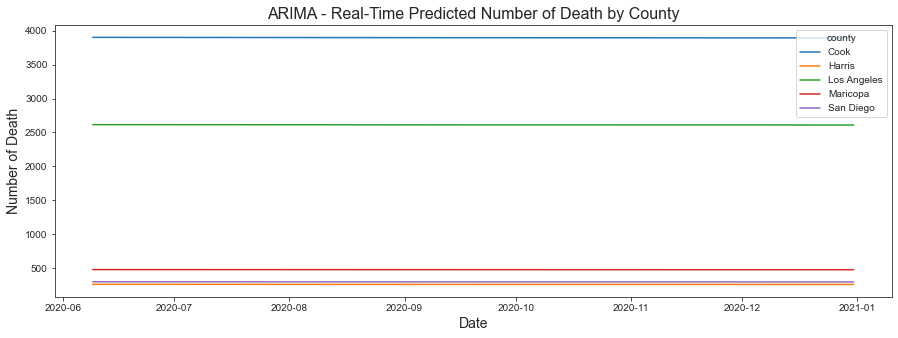

In [68]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=county_Nov, x="date", y="ARIMA", hue="county")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Death', fontsize=14)
plt.title('ARIMA - Real-Time Predicted Number of Death by County', fontsize=16)

Text(0.5, 1.0, 'HWAAS - Real-Time Predicted Number of Death by County')

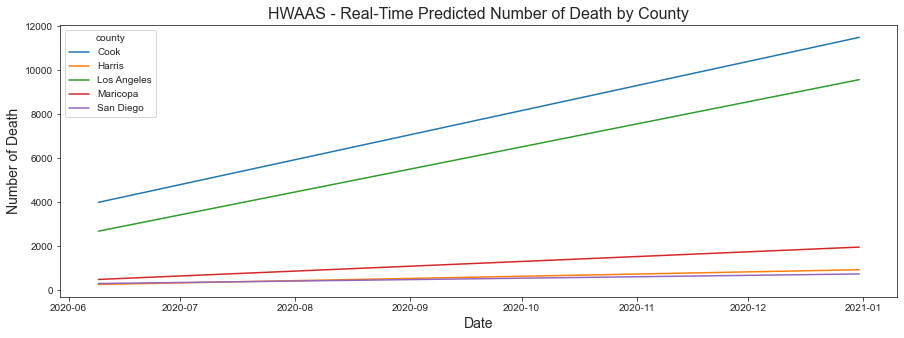

In [69]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=county_Nov, x="date", y="HWAAS", hue="county")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Death', fontsize=14)
plt.title('HWAAS - Real-Time Predicted Number of Death by County', fontsize=16)

Text(0.5, 1.0, 'Prohphet - Real-Time Predicted Number of Death by County')

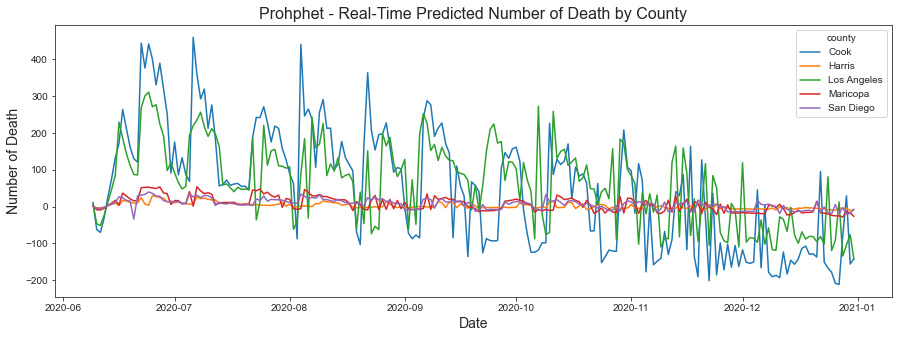

In [70]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=county_Nov, x="date", y="Prohphet", hue="county")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Death', fontsize=14)
plt.title('Prohphet - Real-Time Predicted Number of Death by County', fontsize=16)

## RT

In [109]:
rt_df = pd.read_csv('./DATA/rt.csv')
rt_df['date'] = pd.to_datetime(rt_df['date'])
rt_df = rt_df[(rt_df['date'] >= '2020-03-08') & (rt_df['date'] <= '2020-12-31')]
rt_df = rt_df[['date','region','mean']]

st_code = pd.read_csv('./DATA/state_code.csv')
st_code = st_code[['State','Code']]

NE_region = ['Maine', 'New Hampshire', 'Vermont', 'Massachusetts', 'Rhode Island', 'Connecticut', 'New York', 
             'New Jersey', 'Pennsylvania']
MW_region = ['Ohio', 'Michigan', 'Indiana', 'Wisconsin', 'Illinois', 'Minnesota', 'Iowa', 'Missouri', 'North Dakota', 
           'South Dakota', 'Nebraska', 'Kansas']
S_region = ['Delaware', 'Maryland', 'Virginia', 'West Virginia', 'Kentucky', 'North Carolina', 'South Carolina', 
         'Tennessee', 'Georgia', 'Florida', 'Alabama', 'Mississippi', 'Arkansas', 'Louisiana', 'Texas', 'Oklahoma']
W_region = ['Montana', 'Idaho', 'Wyoming', 'Colorado', 'New Mexico', 'Arizona', 'Utah', 'Nevada', 'California', 
        'Oregon', 'Washington', 'Alaska', 'Hawaii']

for index, row in rt_df.iterrows():
    code = rt_df.loc[index, 'region']
    state = st_code[st_code['Code'] == code]['State'].values[0]
    if state in NE_region:
        rt_df.loc[index, 'section'] = 'NorthEast'
    if state in MW_region:
        rt_df.loc[index, 'section'] = 'MidWest'
    if state in S_region:
        rt_df.loc[index, 'section'] = 'South'
    if state in W_region:
        rt_df.loc[index, 'section'] = 'West'
        
data_section = rt_df.dropna()
data_section = data_section.groupby(['date', 'section'], as_index=False).sum()

Text(0.5, 1.0, 'RT Trend by Section')

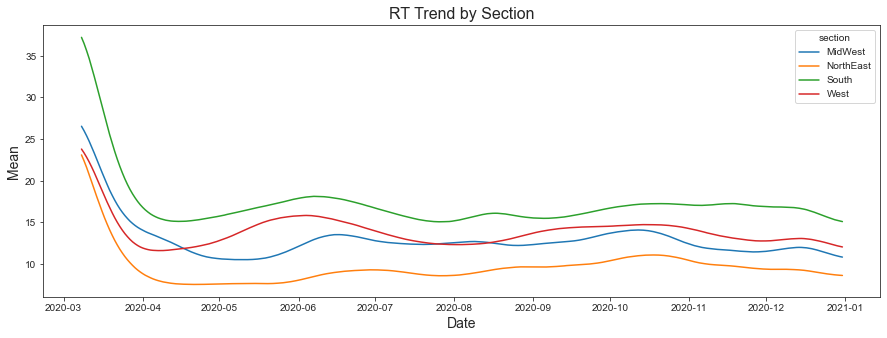

In [110]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=data_section, x="date", y="mean", hue="section")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Mean', fontsize=14)
plt.title('RT Trend by Section', fontsize=16)

In [111]:
# Performance Matrix
region_mean_perform = pd.DataFrame(columns=['section', 'ARIMA', 'HWAAS', 'Prohphet'])
region_mean_perform['section'] = ['NorthEast', 'MidWest', 'South', 'West']

In [128]:
# Predicted Values
data_region_mean_train = data_section[(data_section['date'] >= '2020-03-08') & (data_section['date'] < '2020-06-09')].copy()
data_region_mean_test = data_section[(data_section['date'] >= '2020-06-09') & (data_section['date'] < '2021-01-01')].copy()
region_mean_Nov = data_region_mean_test.reindex(columns=['date', 'section', 'mean', 'ARIMA', 'HWAAS', 'Prohphet'])  
region_mean_Nov['date'] = region_mean_Nov['date'].dt.date.astype(str)

### ARIMA

In [129]:
# forecasting
section_list = ['MidWest', 'NorthEast', 'South', 'West']
date_list = data_region_mean_test['date'].dt.date.astype(str).unique().tolist()

for i in date_list:
    for j in section_list:
        train = data_region_mean_train[data_region_mean_train['section'] == j].reset_index()['mean']
        train = np.array(train)
        model = ARIMA(train, order=(1,0,0))
        model_fit = model.fit()
        output = model_fit.forecast()
        y_hat = output[0]
        region_mean_Nov.loc[(region_mean_Nov['date'] == i) & (region_mean_Nov['section'] == j), 'ARIMA'] = y_hat
        data_region_mean_train.loc[len(data_region_mean_train)] = [i, j, y_hat]

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chester/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chester/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chester/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chester/opt/anaconda3/lib/python3.9/s

In [133]:
# evaluate forecasts
for j in section_list:
    result = region_mean_Nov[region_mean_Nov['section'] == j]
    rmse = math.sqrt(mean_squared_error(result['mean'], result['ARIMA'])) 
    region_mean_perform.loc[region_mean_perform['section'] == j, 'ARIMA'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

MidWest Test RMSE: 1.2434
NorthEast Test RMSE: 0.8259
South Test RMSE: 2.5201
West Test RMSE: 2.8216


### HWAAS

In [136]:
data_region_mean_train = data_section[(data_section['date'] >= '2020-03-08') & (data_section['date'] < '2020-06-09')].copy()
# forecasting
for i in date_list:
    for j in section_list:
        train = data_region_mean_train[data_region_mean_train['section'] == j].reset_index()['mean']
        train = np.array(train)
        model = ExponentialSmoothing(endog=train, trend='add', initialization_method='estimated')
        model_fit = model.fit()
        output = model_fit.forecast()
        y_hat = output[0]
        region_mean_Nov.loc[(region_mean_Nov['date'] == i) & (region_mean_Nov['section'] == j), 'HWAAS'] = y_hat
        data_region_mean_train.loc[len(data_region_mean_train)] = [i, j, y_hat]

In [144]:
# evaluate forecasts
for j in region_list:
    result = region_mean_Nov[region_mean_Nov['section'] == j]
    rmse = math.sqrt(mean_squared_error(result['mean'], result['HWAAS'])) 
    region_mean_perform.loc[region_mean_perform['section'] == j, 'HWAAS'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

MidWest Test RMSE: 13.7073
NorthEast Test RMSE: 7.9241
South Test RMSE: 1.2728
West Test RMSE: 2.6683


### Prohphet

In [147]:
data_region_mean_train = data_section[(data_section['date'] >= '2020-03-08') & (data_section['date'] < '2020-06-09')].copy()

# forecasting
for i in date_list:
    for j in section_list:
        train = data_region_mean_train[data_region_mean_train['section'] == j].reset_index()[['date', 'mean']]
        train = train.rename(columns={'mean': 'y', 'date': 'ds'})
        model = Prophet(yearly_seasonality=True, daily_seasonality=True)
        model_fit = model.fit(train)
        future_dates = model.make_future_dataframe(periods=1)
        y_hat = model_fit.predict(future_dates).iloc()[0]['yhat']
        region_mean_Nov.loc[(region_mean_Nov['date'] == i) & (region_mean_Nov['section'] == j), 'Prohphet'] = y_hat
        data_region_mean_train.loc[len(data_region_mean_train)] = [i, j, y_hat]


Initial log joint probability = -147.774
Iteration  1. Log joint probability =     65.506. Improved by 213.28.
Iteration  2. Log joint probability =     124.49. Improved by 58.9841.
Iteration  3. Log joint probability =    194.069. Improved by 69.579.
Iteration  4. Log joint probability =    250.543. Improved by 56.4743.
Iteration  5. Log joint probability =    350.075. Improved by 99.5313.
Iteration  6. Log joint probability =    403.112. Improved by 53.0374.
Iteration  7. Log joint probability =    482.414. Improved by 79.3016.
Iteration  8. Log joint probability =    524.954. Improved by 42.5406.
Iteration  9. Log joint probability =     586.13. Improved by 61.1755.
Iteration 10. Log joint probability =    629.369. Improved by 43.2394.
Iteration 11. Log joint probability =    673.479. Improved by 44.1095.
Iteration 12. Log joint probability =    691.959. Improved by 18.4805.
Iteration 13. Log joint probability =    758.894. Improved by 66.9347.
Iteration 14. Log joint probability =


Initial log joint probability = -148.199
Iteration  1. Log joint probability =    61.9164. Improved by 210.115.
Iteration  2. Log joint probability =    127.583. Improved by 65.6667.
Iteration  3. Log joint probability =    184.787. Improved by 57.2039.
Iteration  4. Log joint probability =    293.968. Improved by 109.181.
Iteration  5. Log joint probability =    327.289. Improved by 33.3215.
Iteration  6. Log joint probability =    369.142. Improved by 41.8526.
Iteration  7. Log joint probability =    427.994. Improved by 58.8521.
Iteration  8. Log joint probability =    497.478. Improved by 69.4836.
Iteration  9. Log joint probability =    505.627. Improved by 8.14915.
Iteration 10. Log joint probability =    517.541. Improved by 11.9144.
Iteration 11. Log joint probability =    548.042. Improved by 30.5004.
Iteration 12. Log joint probability =    573.554. Improved by 25.5119.
Iteration 13. Log joint probability =    659.286. Improved by 85.7319.
Iteration 14. Log joint probability

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.73
Iteration  1. Log joint probability =    52.5049. Improved by 210.235.
Iteration  2. Log joint probability =     111.52. Improved by 59.0152.
Iteration  3. Log joint probability =    159.777. Improved by 48.2573.
Iteration  4. Log joint probability =    192.749. Improved by 32.9718.
Iteration  5. Log joint probability =    217.662. Improved by 24.9127.
Iteration  6. Log joint probability =    247.464. Improved by 29.8022.
Iteration  7. Log joint probability =    267.155. Improved by 19.6911.
Iteration  8. Log joint probability =    269.796. Improved by 2.64061.
Iteration  9. Log joint probability =    271.867. Improved by 2.07102.
Iteration 10. Log joint probability =    272.347. Improved by 0.480107.
Iteration 11. Log joint probability =    272.564. Improved by 0.216971.
Iteration 12. Log joint probability =    272.913. Improved by 0.348823.
Iteration 13. Log joint probability =    272.957. Improved by 0.0442258.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.761
Iteration  1. Log joint probability =    45.5359. Improved by 208.297.
Iteration  2. Log joint probability =    127.965. Improved by 82.4291.
Iteration  3. Log joint probability =    174.861. Improved by 46.8957.
Iteration  4. Log joint probability =    230.433. Improved by 55.5718.
Iteration  5. Log joint probability =    260.566. Improved by 30.1336.
Iteration  6. Log joint probability =    261.788. Improved by 1.22219.
Iteration  7. Log joint probability =    262.122. Improved by 0.333601.
Iteration  8. Log joint probability =    262.131. Improved by 0.00943572.
Iteration  9. Log joint probability =    262.142. Improved by 0.0106674.
Iteration 10. Log joint probability =    262.145. Improved by 0.00342603.
Iteration 11. Log joint probability =    262.153. Improved by 0.00795967.
Iteration 12. Log joint probability =    262.156. Improved by 0.00235932.
Iteration 13. Log joint probability =    262.156. Improved by 0.000231673.
Iteration 14. Lo

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.958
Iteration  1. Log joint probability =    52.7368. Improved by 210.695.
Iteration  2. Log joint probability =    110.606. Improved by 57.8692.
Iteration  3. Log joint probability =     119.72. Improved by 9.11402.
Iteration  4. Log joint probability =    147.087. Improved by 27.3671.
Iteration  5. Log joint probability =    171.802. Improved by 24.7148.
Iteration  6. Log joint probability =    220.881. Improved by 49.0796.
Iteration  7. Log joint probability =    250.279. Improved by 29.3974.
Iteration  8. Log joint probability =    276.936. Improved by 26.6576.
Iteration  9. Log joint probability =    279.907. Improved by 2.97037.
Iteration 10. Log joint probability =    280.785. Improved by 0.878708.
Iteration 11. Log joint probability =    281.076. Improved by 0.29046.
Iteration 12. Log joint probability =    281.395. Improved by 0.319183.
Iteration 13. Log joint probability =    281.483. Improved by 0.0877015.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -153.443
Iteration  1. Log joint probability =    53.4388. Improved by 206.882.
Iteration  2. Log joint probability =    97.5127. Improved by 44.0739.
Iteration  3. Log joint probability =     180.99. Improved by 83.4771.
Iteration  4. Log joint probability =    185.618. Improved by 4.6283.
Iteration  5. Log joint probability =    233.149. Improved by 47.5306.
Iteration  6. Log joint probability =     266.83. Improved by 33.681.
Iteration  7. Log joint probability =    296.621. Improved by 29.7909.
Iteration  8. Log joint probability =    320.319. Improved by 23.6982.
Iteration  9. Log joint probability =    322.337. Improved by 2.01838.
Iteration 10. Log joint probability =    322.951. Improved by 0.613686.
Iteration 11. Log joint probability =    323.081. Improved by 0.129672.
Iteration 12. Log joint probability =    323.298. Improved by 0.217826.
Iteration 13. Log joint probability =     323.36. Improved by 0.0611205.
Iteration 14. Log joint probabil

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -158.651
Iteration  1. Log joint probability =    51.4191. Improved by 210.07.
Iteration  2. Log joint probability =    108.144. Improved by 56.7249.
Iteration  3. Log joint probability =    159.857. Improved by 51.7132.
Iteration  4. Log joint probability =    207.362. Improved by 47.5052.
Iteration  5. Log joint probability =    239.939. Improved by 32.577.
Iteration  6. Log joint probability =     275.27. Improved by 35.3303.
Iteration  7. Log joint probability =    286.631. Improved by 11.3611.
Iteration  8. Log joint probability =    286.952. Improved by 0.321044.
Iteration  9. Log joint probability =     287.08. Improved by 0.128335.
Iteration 10. Log joint probability =    287.243. Improved by 0.162715.
Iteration 11. Log joint probability =    287.332. Improved by 0.0886853.
Iteration 12. Log joint probability =    287.509. Improved by 0.177919.
Iteration 13. Log joint probability =    287.578. Improved by 0.0688808.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -163.645
Iteration  1. Log joint probability =    46.3673. Improved by 210.012.
Iteration  2. Log joint probability =    117.241. Improved by 70.8734.
Iteration  3. Log joint probability =    117.765. Improved by 0.524065.
Iteration  4. Log joint probability =    154.867. Improved by 37.1027.
Iteration  5. Log joint probability =    158.228. Improved by 3.36052.
Iteration  6. Log joint probability =    202.004. Improved by 43.7759.
Iteration  7. Log joint probability =    234.936. Improved by 32.932.
Iteration  8. Log joint probability =    253.221. Improved by 18.2854.
Iteration  9. Log joint probability =     254.36. Improved by 1.13902.
Iteration 10. Log joint probability =    254.827. Improved by 0.46668.
Iteration 11. Log joint probability =    255.284. Improved by 0.457339.
Iteration 12. Log joint probability =    255.542. Improved by 0.258082.
Iteration 13. Log joint probability =    255.657. Improved by 0.114226.
Iteration 14. Log joint probabil

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -158.877
Iteration  1. Log joint probability =    51.8383. Improved by 210.716.
Iteration  2. Log joint probability =    107.063. Improved by 55.225.
Iteration  3. Log joint probability =    107.842. Improved by 0.778779.
Iteration  4. Log joint probability =    133.113. Improved by 25.2705.
Iteration  5. Log joint probability =    177.588. Improved by 44.4755.
Iteration  6. Log joint probability =    210.153. Improved by 32.565.
Iteration  7. Log joint probability =    242.017. Improved by 31.8641.
Iteration  8. Log joint probability =    281.431. Improved by 39.414.
Iteration  9. Log joint probability =    283.709. Improved by 2.27779.
Iteration 10. Log joint probability =    284.301. Improved by 0.591613.
Iteration 11. Log joint probability =    284.583. Improved by 0.28256.
Iteration 12. Log joint probability =    284.633. Improved by 0.0496753.
Iteration 13. Log joint probability =    284.703. Improved by 0.0704901.
Iteration 14. Log joint probabil

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -154.294
Iteration  1. Log joint probability =    55.1938. Improved by 209.487.
Iteration  2. Log joint probability =    128.906. Improved by 73.7127.
Iteration  3. Log joint probability =    179.706. Improved by 50.7995.
Iteration  4. Log joint probability =    209.886. Improved by 30.1796.
Iteration  5. Log joint probability =    244.239. Improved by 34.3531.
Iteration  6. Log joint probability =    271.753. Improved by 27.5145.
Iteration  7. Log joint probability =    290.803. Improved by 19.0502.
Iteration  8. Log joint probability =    291.893. Improved by 1.08999.
Iteration  9. Log joint probability =    292.261. Improved by 0.367735.
Iteration 10. Log joint probability =    292.309. Improved by 0.0482829.
Iteration 11. Log joint probability =    292.577. Improved by 0.267556.
Iteration 12. Log joint probability =    292.693. Improved by 0.116295.
Iteration 13. Log joint probability =    292.747. Improved by 0.0536632.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -159.57
Iteration  1. Log joint probability =    50.6098. Improved by 210.179.
Iteration  2. Log joint probability =        107. Improved by 56.3906.
Iteration  3. Log joint probability =    152.346. Improved by 45.3459.
Iteration  4. Log joint probability =    160.549. Improved by 8.20254.
Iteration  5. Log joint probability =    230.825. Improved by 70.2765.
Iteration  6. Log joint probability =    262.955. Improved by 32.1299.
Iteration  7. Log joint probability =    277.258. Improved by 14.3033.
Iteration  8. Log joint probability =    277.888. Improved by 0.629624.
Iteration  9. Log joint probability =    277.922. Improved by 0.0341638.
Iteration 10. Log joint probability =    277.929. Improved by 0.00645698.
Iteration 11. Log joint probability =    278.012. Improved by 0.0833145.
Iteration 12. Log joint probability =    278.414. Improved by 0.401765.
Iteration 13. Log joint probability =    278.953. Improved by 0.539513.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -164.549
Iteration  1. Log joint probability =    47.0856. Improved by 211.634.
Iteration  2. Log joint probability =     118.41. Improved by 71.3248.
Iteration  3. Log joint probability =    141.197. Improved by 22.787.
Iteration  4. Log joint probability =    151.397. Improved by 10.2.
Iteration  5. Log joint probability =    182.115. Improved by 30.7174.
Iteration  6. Log joint probability =    213.724. Improved by 31.6088.
Iteration  7. Log joint probability =    230.725. Improved by 17.0018.
Iteration  8. Log joint probability =    231.416. Improved by 0.690497.
Iteration  9. Log joint probability =    231.492. Improved by 0.0758054.
Iteration 10. Log joint probability =    231.517. Improved by 0.0253714.
Iteration 11. Log joint probability =    254.301. Improved by 22.7841.
Iteration 12. Log joint probability =     254.33. Improved by 0.0292646.
Iteration 13. Log joint probability =    254.813. Improved by 0.482407.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -159.794
Iteration  1. Log joint probability =    51.1404. Improved by 210.934.
Iteration  2. Log joint probability =     106.51. Improved by 55.3693.
Iteration  3. Log joint probability =    153.674. Improved by 47.164.
Iteration  4. Log joint probability =    185.579. Improved by 31.9058.
Iteration  5. Log joint probability =    238.415. Improved by 52.8354.
Iteration  6. Log joint probability =    270.485. Improved by 32.0702.
Iteration  7. Log joint probability =     275.52. Improved by 5.03504.
Iteration  8. Log joint probability =    276.405. Improved by 0.884913.
Iteration  9. Log joint probability =    276.647. Improved by 0.242389.
Iteration 10. Log joint probability =    276.774. Improved by 0.126766.
Iteration 11. Log joint probability =    277.484. Improved by 0.709804.
Iteration 12. Log joint probability =    277.521. Improved by 0.0373966.
Iteration 13. Log joint probability =    277.521. Improved by 5.81699e-05.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -155.219
Iteration  1. Log joint probability =    56.3036. Improved by 211.523.
Iteration  2. Log joint probability =    62.0901. Improved by 5.7865.
Iteration  3. Log joint probability =    147.056. Improved by 84.9659.
Iteration  4. Log joint probability =    175.526. Improved by 28.4704.
Iteration  5. Log joint probability =    237.599. Improved by 62.0722.
Iteration  6. Log joint probability =    243.985. Improved by 6.38686.
Iteration  7. Log joint probability =    274.843. Improved by 30.8574.
Iteration  8. Log joint probability =    290.681. Improved by 15.8387.
Iteration  9. Log joint probability =    290.946. Improved by 0.264181.
Iteration 10. Log joint probability =    291.158. Improved by 0.2124.
Iteration 11. Log joint probability =    291.321. Improved by 0.162897.
Iteration 12. Log joint probability =    291.372. Improved by 0.0509621.
Iteration 13. Log joint probability =    291.575. Improved by 0.203254.
Iteration 14. Log joint probabil

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.489
Iteration  1. Log joint probability =    50.4418. Improved by 210.93.
Iteration  2. Log joint probability =    107.409. Improved by 56.9674.
Iteration  3. Log joint probability =    166.346. Improved by 58.9369.
Iteration  4. Log joint probability =    178.434. Improved by 12.0884.
Iteration  5. Log joint probability =    210.973. Improved by 32.5384.
Iteration  6. Log joint probability =    237.896. Improved by 26.9228.
Iteration  7. Log joint probability =    239.373. Improved by 1.4773.
Iteration  8. Log joint probability =    239.569. Improved by 0.196303.
Iteration  9. Log joint probability =    240.225. Improved by 0.655756.
Iteration 10. Log joint probability =     240.31. Improved by 0.0852213.
Iteration 11. Log joint probability =    240.351. Improved by 0.0409035.
Iteration 12. Log joint probability =    268.587. Improved by 28.2354.
Iteration 13. Log joint probability =    268.874. Improved by 0.287921.
Iteration 14. Log joint probab

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -165.428
Iteration  1. Log joint probability =    47.8956. Improved by 213.324.
Iteration  2. Log joint probability =    67.9686. Improved by 20.0731.
Iteration  3. Log joint probability =    96.4544. Improved by 28.4858.
Iteration  4. Log joint probability =    150.828. Improved by 54.3734.
Iteration  5. Log joint probability =    179.295. Improved by 28.467.
Iteration  6. Log joint probability =    211.541. Improved by 32.2462.
Iteration  7. Log joint probability =    223.424. Improved by 11.8834.
Iteration  8. Log joint probability =    223.736. Improved by 0.311502.
Iteration  9. Log joint probability =    223.747. Improved by 0.0107201.
Iteration 10. Log joint probability =    224.107. Improved by 0.360209.
Iteration 11. Log joint probability =    224.313. Improved by 0.206562.
Iteration 12. Log joint probability =    224.427. Improved by 0.113876.
Iteration 13. Log joint probability =    224.496. Improved by 0.0685504.
Iteration 14. Log joint prob

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -160.714
Iteration  1. Log joint probability =    51.0135. Improved by 211.728.
Iteration  2. Log joint probability =    107.527. Improved by 56.5137.
Iteration  3. Log joint probability =    165.611. Improved by 58.0834.
Iteration  4. Log joint probability =    195.562. Improved by 29.9514.
Iteration  5. Log joint probability =    247.016. Improved by 51.4541.
Iteration  6. Log joint probability =    263.802. Improved by 16.7855.
Iteration  7. Log joint probability =    266.305. Improved by 2.50359.
Iteration  8. Log joint probability =    266.903. Improved by 0.597665.
Iteration  9. Log joint probability =    267.135. Improved by 0.23207.
Iteration 10. Log joint probability =    267.196. Improved by 0.0612827.
Iteration 11. Log joint probability =    267.946. Improved by 0.749529.
Iteration 12. Log joint probability =    267.964. Improved by 0.01808.
Iteration 13. Log joint probability =    267.976. Improved by 0.0118306.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -156.186
Iteration  1. Log joint probability =    57.0544. Improved by 213.24.
Iteration  2. Log joint probability =    104.616. Improved by 47.5618.
Iteration  3. Log joint probability =    165.818. Improved by 61.2017.
Iteration  4. Log joint probability =    209.632. Improved by 43.8145.
Iteration  5. Log joint probability =    259.819. Improved by 50.1862.
Iteration  6. Log joint probability =    268.885. Improved by 9.06636.
Iteration  7. Log joint probability =    301.536. Improved by 32.6513.
Iteration  8. Log joint probability =     306.43. Improved by 4.89352.
Iteration  9. Log joint probability =    306.917. Improved by 0.486936.
Iteration 10. Log joint probability =    307.053. Improved by 0.135984.
Iteration 11. Log joint probability =    307.397. Improved by 0.343812.
Iteration 12. Log joint probability =    307.733. Improved by 0.336752.
Iteration 13. Log joint probability =    307.912. Improved by 0.178505.
Iteration 14. Log joint probabi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.393
Iteration  1. Log joint probability =    50.7967. Improved by 212.189.
Iteration  2. Log joint probability =    108.568. Improved by 57.7716.
Iteration  3. Log joint probability =    171.446. Improved by 62.8773.
Iteration  4. Log joint probability =    207.598. Improved by 36.1521.
Iteration  5. Log joint probability =    250.369. Improved by 42.7715.
Iteration  6. Log joint probability =    258.203. Improved by 7.83406.
Iteration  7. Log joint probability =    263.351. Improved by 5.1481.
Iteration  8. Log joint probability =     264.32. Improved by 0.968613.
Iteration  9. Log joint probability =    264.564. Improved by 0.243842.
Iteration 10. Log joint probability =    264.601. Improved by 0.0367782.
Iteration 11. Log joint probability =    264.623. Improved by 0.0224227.
Iteration 12. Log joint probability =    264.635. Improved by 0.0115777.
Iteration 13. Log joint probability =    264.636. Improved by 0.00187961.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -166.255
Iteration  1. Log joint probability =    48.8841. Improved by 215.139.
Iteration  2. Log joint probability =    115.653. Improved by 66.7689.
Iteration  3. Log joint probability =    158.377. Improved by 42.7244.
Iteration  4. Log joint probability =     206.67. Improved by 48.2927.
Iteration  5. Log joint probability =    239.619. Improved by 32.9487.
Iteration  6. Log joint probability =    240.017. Improved by 0.398148.
Iteration  7. Log joint probability =     240.96. Improved by 0.943404.
Iteration  8. Log joint probability =    241.951. Improved by 0.990178.
Iteration  9. Log joint probability =    242.029. Improved by 0.0783475.
Iteration 10. Log joint probability =    242.134. Improved by 0.105368.
Iteration 11. Log joint probability =     242.28. Improved by 0.145786.
Iteration 12. Log joint probability =    242.456. Improved by 0.175762.
Iteration 13. Log joint probability =    242.536. Improved by 0.0799879.
Iteration 14. Log joint p

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -161.624
Iteration  1. Log joint probability =    51.3897. Improved by 213.013.
Iteration  2. Log joint probability =    109.157. Improved by 57.7677.
Iteration  3. Log joint probability =     175.79. Improved by 66.6329.
Iteration  4. Log joint probability =    205.826. Improved by 30.0359.
Iteration  5. Log joint probability =    245.678. Improved by 39.852.
Iteration  6. Log joint probability =    256.748. Improved by 11.0695.
Iteration  7. Log joint probability =    261.906. Improved by 5.15818.
Iteration  8. Log joint probability =    263.162. Improved by 1.25582.
Iteration  9. Log joint probability =    263.166. Improved by 0.00449178.
Iteration 10. Log joint probability =    263.249. Improved by 0.0825943.
Iteration 11. Log joint probability =    263.252. Improved by 0.00275668.
Iteration 12. Log joint probability =    263.264. Improved by 0.0121884.
Iteration 13. Log joint probability =    263.272. Improved by 0.00792525.
Iteration 14. Log joint

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -157.123
Iteration  1. Log joint probability =    57.9543. Improved by 215.077.
Iteration  2. Log joint probability =    126.983. Improved by 69.0283.
Iteration  3. Log joint probability =    174.178. Improved by 47.1954.
Iteration  4. Log joint probability =    219.162. Improved by 44.984.
Iteration  5. Log joint probability =     266.52. Improved by 47.3583.
Iteration  6. Log joint probability =    296.311. Improved by 29.7911.
Iteration  7. Log joint probability =    301.661. Improved by 5.34992.
Iteration  8. Log joint probability =    303.783. Improved by 2.12157.
Iteration  9. Log joint probability =    304.667. Improved by 0.884545.
Iteration 10. Log joint probability =    305.017. Improved by 0.350013.
Iteration 11. Log joint probability =    305.073. Improved by 0.0559983.
Iteration 12. Log joint probability =    305.286. Improved by 0.212795.
Iteration 13. Log joint probability =    305.357. Improved by 0.0708987.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.293
Iteration  1. Log joint probability =    51.5182. Improved by 213.811.
Iteration  2. Log joint probability =    110.067. Improved by 58.5492.
Iteration  3. Log joint probability =    150.591. Improved by 40.5233.
Iteration  4. Log joint probability =    226.482. Improved by 75.8912.
Iteration  5. Log joint probability =    258.807. Improved by 32.3252.
Iteration  6. Log joint probability =     262.14. Improved by 3.3333.
Iteration  7. Log joint probability =    262.582. Improved by 0.442004.
Iteration  8. Log joint probability =    263.828. Improved by 1.24526.
Iteration  9. Log joint probability =    264.064. Improved by 0.236622.
Iteration 10. Log joint probability =    264.113. Improved by 0.0489902.
Iteration 11. Log joint probability =    264.173. Improved by 0.0600056.
Iteration 12. Log joint probability =    264.211. Improved by 0.0378933.
Iteration 13. Log joint probability =    264.285. Improved by 0.0735537.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -167.1
Iteration  1. Log joint probability =    49.9088. Improved by 217.009.
Iteration  2. Log joint probability =    116.358. Improved by 66.4493.
Iteration  3. Log joint probability =    177.251. Improved by 60.8929.
Iteration  4. Log joint probability =    217.195. Improved by 39.9442.
Iteration  5. Log joint probability =    240.621. Improved by 23.426.
Iteration  6. Log joint probability =    242.034. Improved by 1.41244.
Iteration  7. Log joint probability =    242.331. Improved by 0.297569.
Iteration  8. Log joint probability =    242.359. Improved by 0.0274223.
Iteration  9. Log joint probability =    242.377. Improved by 0.0184203.
Iteration 10. Log joint probability =    242.386. Improved by 0.00861954.
Iteration 11. Log joint probability =    242.391. Improved by 0.00565493.
Iteration 12. Log joint probability =    242.392. Improved by 0.00040702.
Iteration 13. Log joint probability =    242.395. Improved by 0.00351232.
Iteration 14. Log joi

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -162.52
Iteration  1. Log joint probability =    52.0898. Improved by 214.61.
Iteration  2. Log joint probability =    110.907. Improved by 58.8177.
Iteration  3. Log joint probability =    179.517. Improved by 68.6093.
Iteration  4. Log joint probability =    226.411. Improved by 46.8945.
Iteration  5. Log joint probability =    256.499. Improved by 30.0873.
Iteration  6. Log joint probability =    261.347. Improved by 4.84855.
Iteration  7. Log joint probability =    262.326. Improved by 0.978664.
Iteration  8. Log joint probability =    262.411. Improved by 0.0853945.
Iteration  9. Log joint probability =    262.464. Improved by 0.0527174.
Iteration 10. Log joint probability =    262.675. Improved by 0.211249.
Iteration 11. Log joint probability =     263.15. Improved by 0.474646.
Iteration 12. Log joint probability =    263.216. Improved by 0.0659755.
Iteration 13. Log joint probability =     263.26. Improved by 0.0440439.
Iteration 14. Log joint pr

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()



Initial log joint probability = -158.045
Iteration  1. Log joint probability =    58.9242. Improved by 216.969.
Iteration  2. Log joint probability =    134.588. Improved by 75.6638.
Iteration  3. Log joint probability =     153.09. Improved by 18.5016.
Iteration  4. Log joint probability =    177.961. Improved by 24.8718.
Iteration  5. Log joint probability =    227.115. Improved by 49.1534.
Iteration  6. Log joint probability =    256.396. Improved by 29.2814.
Iteration  7. Log joint probability =    284.281. Improved by 27.8851.
Iteration  8. Log joint probability =    305.776. Improved by 21.4947.
Iteration  9. Log joint probability =    306.575. Improved by 0.798773.
Iteration 10. Log joint probability =    306.876. Improved by 0.301619.
Iteration 11. Log joint probability =    306.894. Improved by 0.0176789.
Iteration 12. Log joint probability =    307.008. Improved by 0.114427.
Iteration 13. Log joint probability =     307.07. Improved by 0.061618.
Iteration 14. Log joint proba

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0714
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        254.05    0.00195323       111.868      0.1693           1      110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       254.405   0.000307513       102.568    2.18e-06       0.001      189  LS failed, Hessian reset 
     171       254.424   7.66692e-09       102.229      0.4105           1      247   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.791
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       232.323   0.000624874       101.639   6.143e-06       0.001      176  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       232.528    0.00036494       100.658   3.554e-06       0.001      253  LS failed, Hessian reset 
     158       232.578   7.32559e-05       99.0078   7.344e-07       0.001      338  LS failed, Hessian reset 
     191       232.594   4.59108e-05       100.686   4.545e-07       0.001      415  LS failed, Hessian reset 
     199       232.597   2.58387e-06       99.5677      0.3631      0.8348      425   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       232.597   8.72747e-09       100.232      0.2378      0.2378      450   
Optimization terminated normally: 
  Convergence detected: absolut

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2971
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       252.681   0.000587015        101.79   5.735e-06       0.001      153  LS failed, Hessian reset 
      99        252.75   0.000628991       102.749           1           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       252.803   8.15369e-07       100.584   8.092e-09       0.001      266  LS failed, Hessian reset 
     164       252.803   9.24053e-09       101.461      0.2733      0.2733      283   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.82156
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       295.808    0.00261009       125.726           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       296.375   8.92035e-09       101.409      0.3111      0.3111      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0996
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       250.892   5.48098e-05       102.566      0.9661      0.9661      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       251.096   0.000786087       113.186   5.873e-06       0.001      166  LS failed, Hessian reset 
     140       251.213    3.0213e-05       100.353   3.034e-07       0.001      242  LS failed, Hessian reset 
     172       251.216   9.54461e-09       100.469      0.4446      0.4446      287   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.7918
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       227.544   2.14372e-05       99.9179      0.1789           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       227.546    9.4762e-09        100.84      0.3575      0.3575      167   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.3187
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       250.265   4.41064e-05       100.941           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       250.279   5.30122e-09       101.151      0.1595      0.1595      189   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.8289
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       294.251    0.00091634       104.207           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       294.425   7.68447e-09       100.031      0.6495      0.6495      199   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.8435
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       249.946   3.13976e-06       98.9805           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       249.946   9.31286e-09        101.18      0.3787      0.3787      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.3255
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       225.888   1.83247e-06       101.977      0.2539      0.2539      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       225.888   8.27482e-09       99.3129      0.6011      0.6011      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.9647
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       248.357   3.70934e-05        101.33      0.3983           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       248.459   7.73929e-09       102.988      0.6911      0.6911      195   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.72785
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       293.683   9.40182e-05       103.581      0.9235      0.9235      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       294.916   0.000151882       110.716      0.5671      0.5671      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       295.718   2.75455e-06       100.082           1           1      376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       295.724   7.30037e-05       105.154   6.967e-07       0.001      426  LS failed, Hessian reset 
     371       295.738    1.4091e-08       99.8659      0.9929      0.9929      508   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       249.651   0.000597003       102.394           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       252.834    0.00227236       100.611      0.8007      0.8007      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     267       252.897   7.15111e-09       98.0949      0.5232      0.5232      322   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9957
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       225.517   3.04862e-07       102.325       0.166       0.166      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       225.532   0.000126093       100.588   1.208e-06       0.001      183  LS failed, Hessian reset 
     144       225.543   7.69279e-06       101.799   7.526e-08       0.001      249  LS failed, Hessian reset 
     177       225.544   9.83432e-07       100.392   9.812e-09       0.001      328  LS failed, Hessian reset 
     194       225.544    5.5559e-09       101.964      0.4453      0.4453      349   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7666
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       248.509    9.0383e-05        100.31           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       248.538   1.80999e-05       107.214   1.829e-07       0.001      192  LS failed, Hessian reset 
     160       248.539   2.10552e-09       95.9919      0.1677      0.1677      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.70223
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       295.092   0.000582537       108.073           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       298.247   1.14129e-06       101.127      0.2259      0.5191      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       298.247   3.29349e-09       99.9865      0.2482      0.2482      276   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.7241
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       251.899   0.000274396       102.982           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       251.975   4.19224e-09       98.7838      0.1906      0.1906      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.8249
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       226.915     0.0173534        116.81           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       237.323   2.26061e-05       101.668       1.814      0.1814      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       237.327   2.22133e-05       100.784    2.22e-07       0.001      276  LS failed, Hessian reset 
     231       237.331   6.43192e-06       100.188   6.341e-08       0.001      337  LS failed, Hessian reset 
     274       237.332   4.18022e-09       98.7105      0.1196      0.1196      401   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5935
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       249.747   2.17532e-06       105.557      0.4031      0.4031      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       258.946   6.20481e-05       101.093      0.2694           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       258.972   0.000235062       99.5433   2.023e-06       0.001      288  LS failed, Hessian reset 
     257       258.984    8.4877e-09       104.104      0.4507      0.4507      341   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.81031
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       297.477     0.0554104       257.248           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       303.887   0.000306717        129.55      0.4403      0.4403      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         304.5   9.91814e-06       103.113      0.4505      0.4505      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     324         304.5   7.65426e-09       101.847      0.2164      0.2164      373   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3053
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       254.682    0.00620894       175.908           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        263.21   2.00188e-06       100.601      0.7312      0.7312      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220        263.21   4.13384e-09       99.5862      0.1468      0.1468      256   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.9341
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       230.789   5.30979e-07       104.101       0.519       0.519      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       230.789   8.20439e-09       98.2468      0.7285      0.7285      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.272
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       257.611    0.00172948       109.549      0.3499           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       262.064   0.000104803       100.925       0.376       0.376      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     260       262.096   5.55005e-09       102.636      0.3928      0.3928      312   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.84996
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       304.846     0.0101602       204.999      0.9636      0.9636      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       308.828    0.00133971       302.044   1.122e-05       0.001      240  LS failed, Hessian reset 
     199       309.035   3.64634e-06       96.6601      0.1836      0.1836      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       309.036   4.11249e-07       101.428   4.109e-09       0.001      352  LS failed, Hessian reset 
     246       309.036    5.4684e-09       100.427      0.2767      0.2767      369   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.0474
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        261.15   4.86315e-06       102.521      0.4558      0.4558      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       261.151   9.86849e-09       97.7779      0.4706      0.4706      179   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.9638
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       234.964   0.000263785       104.045      0.8558      0.8558      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       243.395   0.000791588       105.213   7.348e-06       0.001      253  LS failed, Hessian reset 
     199       243.478   0.000350021       100.588           1           1      264   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       243.537   0.000289527       104.182   2.899e-06       0.001      312  LS failed, Hessian reset 
     247       243.557   7.42113e-09       100.153      0.2504      0.2504      360   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.1702
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       258.053   3.51604e-07       101.866      0.2547      0.2547      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       264.829    0.00116961       100.035           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     258       265.089   4.32859e-05       103.194    4.15e-07       0.001      335  LS failed, Hessian reset 
     299       265.095    8.6855e-07       102.034      0.2831           1      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     309       265.095    1.4331e-09       100.007      0.0034           1      407   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.71672
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       306.666    0.00538371       147.637           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       309.049    0.00105267       181.714   1.024e-05       0.001      184  LS failed, Hessian reset 
     165       309.781   0.000505711       100.547   5.307e-06       0.001      269  LS failed, Hessian reset 
     196       309.932   0.000144545       105.392   1.048e-06       0.001      339  LS failed, Hessian reset 
     199        309.94   3.77684e-05       99.4087       0.586       0.586      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247        309.95   8.83887e-06       104.248   8.448e-08       0.001      437  LS failed, Hessian reset 
     275       309.951   8.90307e-09        101.37      0.3551   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.4355
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       264.145   6.41914e-06       101.945           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        269.63    1.5169e-06       102.686      0.4375      0.4375      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224        269.63   7.98049e-09        102.66      0.3698           1      261   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.8995
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       236.359   4.25627e-07       100.799      0.2674      0.2674      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       236.359   8.26048e-09       99.7666      0.2198      0.2198      131   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -14.2371
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       262.519   2.88159e-05       101.806      0.3884           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       262.522   4.59598e-09        99.503       0.249       0.249      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.40137
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       311.103      0.063108        279.98           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       313.998   0.000313138       126.746   1.887e-06       0.001      244  LS failed, Hessian reset 
     199        314.04   7.51896e-05       109.709           1           1      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       314.047   4.80513e-09       101.192      0.3495      0.3495      333   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6075
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       267.551   6.43824e-05       96.0852      0.4457      0.4457      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       267.559   3.74436e-09       101.883      0.2677      0.2677      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.6652
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       238.875   8.12717e-09       100.167      0.2726      0.2726      122   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8098
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      57       263.091    0.00100972       161.446   7.041e-06       0.001      119  LS failed, Hessian reset 
      99       266.903    0.00265726       176.284   1.102e-05       0.001      203  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       267.683   3.47584e-09       102.745       0.285       0.285      303   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.51964
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       315.418     0.0113498       177.005           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       317.059   1.59961e-06       103.011   1.603e-08       0.001      246  LS failed, Hessian reset 
     199       317.059   9.15343e-08       102.352      0.9213      0.9213      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       317.061   1.45212e-05       100.638   1.471e-07       0.001      328  LS failed, Hessian reset 
     247       317.062   2.73826e-06       99.8717   2.683e-08       0.001      426  LS failed, Hessian reset 
     278       317.063    6.8023e-08       99.5808   6.794e-10       0.001      503  LS failed, Hessian reset 
     284       317.063   5.05731e-09       101.785      0.4466   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5749
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       270.139   4.89311e-06       101.912      0.6318      0.6318      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126        270.16   8.58302e-05       105.927   7.849e-07       0.001      200  LS failed, Hessian reset 
     199       272.374     0.0111484       133.093           1           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274        273.12   1.89231e-05       102.041   1.893e-07       0.001      408  LS failed, Hessian reset 
     299       273.121   1.60959e-07       100.866      0.9829      0.9829      440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     309       273.121   1.39383e-07       99.9888   1.391e-09       0.001      492  LS failed, Hessian rese

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.564
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       242.377     0.0031238       121.363       0.451       0.451      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       247.481    0.00131045        177.22     1.1e-05       0.001      211  LS failed, Hessian reset 
     199       247.591   5.65847e-08       98.7435      0.4788      0.4788      268   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       247.591    6.6089e-09       102.107      0.6114      0.6114      281   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1902
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       268.218   0.000305561       106.588      0.2728           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       271.165    0.00118842       95.4248           1           1      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       271.457   0.000254289       105.291           1           1      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     356       271.478    9.4209e-09       103.305      0.6796      0.6796      406   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.57611
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       318.105     0.0100142       164.188           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       318.779   8.05321e-09       101.161      0.2871      0.2871      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2791
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       271.661   5.39634e-06       100.259      0.7755      0.7755      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       271.665   4.14964e-07        100.28   3.997e-09       0.001      210  LS failed, Hessian reset 
     143       271.665   6.83246e-09       99.6914      0.1659      0.1659      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2911
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       243.974   0.000130968       101.068      0.1847           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       244.669   0.000224711       103.261           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       246.478    0.00182075       104.768           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     376       246.538   3.49068e-09       102.644       0.211       0.211      434   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4481
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       270.127    0.00215966       137.381   1.806e-05       0.001      149  LS failed, Hessian reset 
      99       270.395   0.000321069       92.7965           1           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       270.517   2.51135e-09       101.432      0.1524      0.1524      252   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.46142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       319.245   3.33655e-05         98.28      0.6538      0.6538      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       320.442   0.000349422       130.346   2.952e-06       0.001      230  LS failed, Hessian reset 
     199       320.526   8.82452e-05         99.82           1           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       320.529   6.88397e-05       105.239   6.677e-07       0.001      324  LS failed, Hessian reset 
     237       320.536   8.22547e-09       105.146      0.3726      0.3726      367   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5783
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       273.884   5.39975e-05       103.684      0.3667           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       273.889   7.51732e-09       100.601      0.5367      0.5367      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2657
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       243.905   2.84138e-06       104.648           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       243.905    4.0668e-09       102.717      0.3654      0.9948      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9017
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       272.408   5.33505e-05       98.1836           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       272.833   7.63226e-09       102.573      0.2441      0.2441      204   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.46239
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       321.398   3.69696e-05        99.697      0.1919           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138         321.4   3.79738e-09        99.388      0.4795      0.4795      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7994
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       274.983    0.00110276       112.071   1.009e-05       0.001      135  LS failed, Hessian reset 
      99       275.177   2.33676e-05       99.8928      0.7339      0.7339      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       275.181   5.61926e-06       102.583   5.624e-08       0.001      205  LS failed, Hessian reset 
     137       275.182   8.00862e-07       103.868    7.99e-09       0.001      275  LS failed, Hessian reset 
     154       275.182   7.06948e-09       102.031      0.3046      0.3046      299   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.7156
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         246.3   1.44637e-05       100.856      0.5245      0.5245      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       246.353   0.000305716       101.082   2.972e-06       0.001      174  LS failed, Hessian reset 
     163       246.376   3.15761e-09       99.1323      0.2289      0.2289      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9277
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        274.09   0.000422801       102.402           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       274.362    9.4933e-09       98.9571      0.3404      0.3404      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28073
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       323.406   2.10549e-05       103.254      0.5712      0.5712      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143        323.43   0.000103746       103.318   9.666e-07       0.001      211  LS failed, Hessian reset 
     185        323.44   3.18263e-06        100.97   3.251e-08       0.001      298  LS failed, Hessian reset 
     199       323.441   8.10577e-08       98.5315       0.586       0.586      316   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       323.441   5.77467e-07        99.352   5.953e-09       0.001      380  LS failed, Hessian reset 
     244       323.441   8.61536e-09       100.788      0.2711      0.2711      399   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7554
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       276.884   4.32912e-06       100.276       0.658       0.658      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       276.885   5.58252e-06        100.47   5.542e-08       0.001      171  LS failed, Hessian reset 
     132       276.887   1.14746e-05       100.068    1.11e-07       0.001      234  LS failed, Hessian reset 
     172        276.89   9.30375e-09       98.9425        0.22        0.22      287   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.9828
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       247.896   0.000117843       100.422      0.3882           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       247.935    0.00016352        97.598   1.547e-06       0.001      197  LS failed, Hessian reset 
     170       247.967   5.89414e-06        100.48   5.716e-08       0.001      300  LS failed, Hessian reset 
     199       247.967   3.41413e-08       98.9972           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       247.967   4.76086e-07       100.248   4.806e-09       0.001      385  LS failed, Hessian reset 
     213       247.967    5.9047e-09       100.327      0.4077      0.4077      397   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9446
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       275.615    8.8283e-07       99.9731      0.3634      0.3634      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165        275.83   8.02578e-09       98.2399      0.3417           1      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28863
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       324.913   9.50922e-06       102.741           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       324.987   0.000356071       134.068   1.755e-06       0.001      172  LS failed, Hessian reset 
     144       325.058   5.75904e-05       101.474   5.769e-07       0.001      243  LS failed, Hessian reset 
     194       325.067   4.48819e-08       99.6982   4.366e-10       0.001      351  LS failed, Hessian reset 
     197       325.067   3.38857e-09       97.5362      0.2519      0.2519      355   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8133
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       278.326   0.000653363       110.548   5.055e-06       0.001      156  LS failed, Hessian reset 
      99       278.447   0.000184737       107.853      0.4466           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       278.493   5.99538e-07       101.812   6.007e-09       0.001      276  LS failed, Hessian reset 
     168       278.493   4.85067e-09        101.57      0.3017      0.3017      299   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2989
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       248.953    8.0708e-08       100.639           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       248.953   9.57167e-09       101.558      0.2334      0.2334      131   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1574
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       276.704    0.00147398       109.267   1.264e-05       0.001      152  LS failed, Hessian reset 
      99       276.875   0.000159078       99.7965      0.2226      0.6212      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       276.978   0.000885513       147.554   6.464e-06       0.001      223  LS failed, Hessian reset 
     164       277.043   6.39636e-09       101.659      0.2198      0.2198      285   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.27565
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       327.055   3.28705e-05       99.9642      0.6342      0.6342      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       327.063   8.76841e-09       97.7184      0.1966      0.1966      165   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7976
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       280.979   0.000503437        101.42   4.748e-06       0.001      159  LS failed, Hessian reset 
      99       281.009   2.02242e-05       103.833      0.3112      0.3112      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       281.019   5.44628e-09        100.06      0.1102      0.1102      222   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2132
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       250.946    0.00152827       112.112   1.044e-05       0.001      161  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144        251.08   9.24067e-09       103.004      0.4644      0.4644      220   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0697
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       279.017    6.6342e-06       102.595      0.5709      0.5709      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       279.023   8.98216e-09       96.9366      0.2469      0.6739      193   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.29901
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       329.559   0.000494347       102.364           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       331.109   0.000866365        133.33    8.14e-06       0.001      223  LS failed, Hessian reset 
     199       331.366   0.000157352       99.0021      0.3827           1      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216         331.4   0.000277719       105.136    2.59e-06       0.001      309  LS failed, Hessian reset 
     251       331.415   3.99485e-09       99.8759      0.2473      0.2473      356   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8215
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       283.323    0.00179137       227.157   1.287e-05       0.001      155  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       283.513   9.22588e-09       104.567      0.5889      0.5889      246   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2432
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       252.895    0.00694187       135.823      0.2872           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100        252.92    0.00211691        181.56   1.559e-05       0.001      148  LS failed, Hessian reset 
     132       253.182   8.94863e-05       100.992   8.761e-07       0.001      218  LS failed, Hessian reset 
     185       253.194   1.11728e-08       100.815      0.3433           1      281   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.081
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        281.39   0.000166011       104.166      0.3229           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       281.405   2.20972e-05       100.726   2.195e-07       0.001      179  LS failed, Hessian reset 
     164       281.407   6.73964e-09        100.44      0.5026      0.5026      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.23899
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       333.537   9.49152e-05       105.869      0.1826      0.1826      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       333.673   5.15497e-09       100.352      0.4897      0.4897      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8289
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       286.243    8.6063e-06       96.6371       2.383      0.2383      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       288.323   0.000660921       117.027      0.3987      0.3987      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       290.412   2.02717e-05       104.159      0.3811      0.3811      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     328       290.413   6.67438e-09       98.0288      0.3542      0.3542      391   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2176
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       255.347   3.79049e-07       101.168      0.3094      0.3094      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       255.347   3.23646e-06       97.9704   3.123e-08       0.001      182  LS failed, Hessian reset 
     143       255.348   5.85053e-07       98.0969    5.81e-09       0.001      251  LS failed, Hessian reset 
     167       255.348   1.14014e-06       102.216   1.155e-08       0.001      330  LS failed, Hessian reset 
     188        255.35   4.51214e-06       98.4819   4.393e-08       0.001      393  LS failed, Hessian reset 
     199       255.352   7.41839e-06       103.432      0.3731           1      405   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       255.352    6.6502e-09       100.214      0.3324   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0444
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       283.652   1.90767e-05        99.213      0.4872      0.4872      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       285.257   3.30745e-07       97.6995           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       285.257   9.40942e-09       101.511      0.4478      0.4478      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.24687
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        335.73   2.15935e-05       100.352      0.3015      0.3015      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       341.739   0.000811615       116.716      0.7459      0.7459      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     279       342.611   0.000103981       104.809   1.002e-06       0.001      362  LS failed, Hessian reset 
     299       342.623   1.09719e-06       98.3721      0.1406      0.6082      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     380       342.729   5.49475e-09       104.917      0.3275      0.3275      491   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1352
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       289.115   4.05743e-06       100.116      0.6479      0.6479      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       289.116   7.43699e-09       97.4499      0.3317      0.3317      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2215
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       258.398    1.1164e-05       102.053      0.4438           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       258.398   1.00383e-07       100.727   9.902e-10       0.001      207  LS failed, Hessian reset 
     139       258.398   6.85587e-09       99.2329           1           1      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7818
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         287.2   3.97052e-05       101.521      0.5494      0.5494      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       287.206   8.25604e-09       98.2112       0.755       0.755      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.72583
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       339.373   0.000861287       100.951       0.948       0.948      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       345.571    0.00274941       158.191      0.6403      0.6403      222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       346.273    2.7766e-05       99.4835      0.9016      0.9016      334   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     361       346.299    6.3411e-09       103.241      0.4093           1      415   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5884
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       292.243   4.39311e-06       101.382      0.3069           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       292.249   9.29459e-09          97.6      0.6978      0.6978      186   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.1174
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       260.432    0.00333497       223.555   2.074e-05       0.001      133  LS failed, Hessian reset 
      99       260.925   0.000891484       107.615           1           1      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       261.082    0.00144395       104.602   1.373e-05       0.001      188  LS failed, Hessian reset 
     173       261.263   8.20582e-09       99.4286      0.9365      0.9365      279   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7853
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       290.128   0.000545106       104.606      0.2175           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       290.195   7.08656e-09       101.664    0.007857      0.1533      215   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.70184
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        342.53    0.00461877       162.759      0.2052           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       348.593   3.01132e-05       97.1901      0.5895      0.5895      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     234       348.596   6.83019e-09       103.534       0.171       0.171      283   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5048
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       295.055   3.62391e-06       100.387      0.4713      0.4713      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       295.057   9.00815e-09       101.454      0.3357      0.3357      165   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.0283
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       264.325   0.000220511       106.404      0.3569      0.3569      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       264.509   7.33483e-09       101.805      0.4019      0.4019      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8046
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        292.69   4.13441e-07       99.1642      0.6102      0.6102      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121        292.69   9.30765e-09        101.55      0.6342      0.6342      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.5914
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       345.744   0.000479445       116.248      0.4872      0.4872      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       351.825   0.000114038       106.833      0.4922      0.4922      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     235       351.983   0.000615343       185.289   3.989e-06       0.001      325  LS failed, Hessian reset 
     280       352.067   3.45199e-09       97.2664      0.2311      0.2311      381   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5144
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       298.085   1.04299e-05       101.908           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       298.087   9.46342e-09       104.045      0.2237      0.9752      166   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.5943
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       266.176   1.65896e-07       103.792      0.2211           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       266.176   3.91392e-09       98.1616      0.4505      0.4505      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.778
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       295.292    0.00259236       142.291           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       300.893   3.63848e-05       100.268      0.1744      0.1744      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     254       300.907   5.24047e-09       100.016     0.04773           1      310   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.70059
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       348.968   0.000564977       108.205      0.3535           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       354.125   7.15003e-05        107.26      0.2847      0.2847      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       354.484   6.85715e-05       100.932      0.5479      0.5479      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     351       354.488   1.80154e-08       101.755           1           1      424   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5583
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       301.056   4.23704e-05       99.5156      0.7999      0.7999      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       301.059   7.72944e-09       100.582      0.4152      0.4152      179   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.0117
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       269.183    0.00109592        99.989           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       269.301   0.000648759       104.433   5.657e-06       0.001      165  LS failed, Hessian reset 
     150       269.396    9.1551e-09       99.7552      0.4715      0.4715      222   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3682
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       299.371   3.16076e-06       102.827      0.6609      0.6609      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       299.376   2.83815e-05       99.9941   2.796e-07       0.001      189  LS failed, Hessian reset 
     157       299.381   5.32234e-09       97.8454      0.4645      0.4645      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.47019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.553    0.00216587       140.827           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       354.618   9.29021e-08       97.7083      0.1786      0.7353      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       354.618   9.11926e-09       99.5956      0.1689      0.4823      255   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5024
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       303.811   4.02097e-05        106.93      0.2599      0.2599      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       303.834   4.80696e-09       100.763      0.1732      0.4538      187   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.6907
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       271.774   3.70974e-05       101.333       0.659       0.659      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       271.778   1.25642e-06       103.735   1.256e-08       0.001      198  LS failed, Hessian reset 
     140       271.778   6.89319e-09       102.004      0.3321      0.3321      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8608
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       302.113   4.89746e-05        101.37           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       302.162   0.000219513       97.3408   2.003e-06       0.001      174  LS failed, Hessian reset 
     157       302.194   3.13995e-07       99.6717    3.11e-09       0.001      284  LS failed, Hessian reset 
     179       302.194   3.25917e-08       101.187   3.206e-10       0.001      350  LS failed, Hessian reset 
     180       302.194   9.09871e-09       98.7718      0.8429      0.8429      351   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.36715
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       353.992   0.000351473       105.188       0.505       0.505      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189         356.1    0.00021938       101.543   2.195e-06       0.001      255  LS failed, Hessian reset 
     199       356.125   2.99373e-05       97.5916      0.2806           1      268   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       356.133   1.54223e-05       100.966    1.53e-07       0.001      334  LS failed, Hessian reset 
     245       356.134   8.62209e-09       97.3763         0.4         0.4      359   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6289
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       306.082     0.0018777       117.361      0.1211           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       306.104   0.000510074         107.3   4.346e-06       0.001      169  LS failed, Hessian reset 
     131       306.167    5.8433e-05       103.449   5.725e-07       0.001      250  LS failed, Hessian reset 
     185       306.177   7.39322e-09       97.3757      0.3309      0.3309      324   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.0054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       274.098   2.45545e-08       100.024      0.1801       0.647      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       274.098   4.49443e-09       99.7838      0.1627      0.1627      128   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8397
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       304.051    1.1134e-06       102.383      0.3573      0.3573      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       304.051   1.71996e-08       99.9693      0.6245      0.6245      151   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.42962
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       356.704    0.00107286       117.688           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       356.932   9.80939e-09       101.138       0.588       0.588      217   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5987
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       309.107   1.30161e-05       98.2768      0.2206           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       309.115   1.22728e-08        101.21      0.8766      0.8766      210   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -16.9953
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      73        276.04    0.00521222       206.587   3.465e-05       0.001      126  LS failed, Hessian reset 
      99       276.696   3.31769e-05       97.5371      0.5127           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       276.797   0.000527414       100.408   4.529e-06       0.001      219  LS failed, Hessian reset 
     159       276.831   7.80842e-09       101.585      0.3502      0.3502      271   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7035
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       306.965   7.39038e-05       102.673      0.9446      0.9446      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       307.061   0.000483987       107.953   4.297e-06       0.001      187  LS failed, Hessian reset 
     167       307.105   8.28372e-09       96.7035      0.2719      0.2719      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.17827
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       358.462    0.00095988       101.611           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       358.912   0.000307585       100.702   3.062e-06       0.001      189  LS failed, Hessian reset 
     193       358.957   1.03889e-06       106.065   1.016e-08       0.001      314  LS failed, Hessian reset 
     199       358.957   1.97218e-07       98.0725      0.2252      0.7367      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       358.957   5.58245e-09       101.562      0.3977      0.3977      334   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7981
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        311.95   1.85716e-05        98.726      0.2527      0.2527      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       311.961   2.33019e-06       101.704   2.333e-08       0.001      211  LS failed, Hessian reset 
     154       311.961   8.50992e-09       101.836      0.3425      0.3425      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.0778
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       278.142   9.89389e-08       99.4178      0.3386      0.3386      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       278.142    7.4635e-09       102.146      0.1928      0.1928      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9387
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       309.476   0.000136526       101.565      0.3099      0.3099      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       309.679    0.00310356       166.926   2.426e-05       0.001      200  LS failed, Hessian reset 
     179       309.922   5.57488e-05       99.0165   4.774e-07       0.001      302  LS failed, Hessian reset 
     199       309.927    4.2374e-07       95.5737      0.6397      0.6397      325   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       309.927   8.19183e-09       101.587      0.2137      0.9464      350   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.17076
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       360.707   9.48187e-08       102.443      0.3422      0.3422      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       360.707   7.07861e-09       101.494      0.3206      0.3206      145   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.697
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       314.576   8.78394e-05       101.626           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       314.592   3.16807e-05       103.026   3.073e-07       0.001      196  LS failed, Hessian reset 
     154       314.595   9.61689e-09       99.1586       0.388       0.388      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.0564
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       281.022    5.5363e-09       95.6255      0.6057      0.6057      126   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0244
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       312.374   0.000235335       115.175      0.5182      0.5182      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       312.459   0.000672641       122.905   4.689e-06       0.001      222  LS failed, Hessian reset 
     199       312.514    8.3333e-08       102.467           1           1      285   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       312.514   9.29336e-09       96.9266      0.4372      0.4372      292   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.10419
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       363.355   0.000580224       206.893   3.994e-06       0.001      137  LS failed, Hessian reset 
      99       363.412   3.40005e-06       99.8825      0.2835           1      164   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       363.413   5.19072e-09       100.239      0.2578      0.2578      190   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7918
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       317.365   3.53192e-05       101.518      0.5364      0.5364      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       317.371    3.5514e-06         101.9   3.569e-08       0.001      186  LS failed, Hessian reset 
     152       317.371   8.58404e-09       99.3784      0.5794      0.5794      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.0176
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       283.953    0.00210892       190.251   1.642e-05       0.001      130  LS failed, Hessian reset 
      99       284.183   1.19003e-05       99.0443      0.2847      0.8854      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       284.196   5.74377e-05       100.104   5.732e-07       0.001      229  LS failed, Hessian reset 
     169       284.201   1.03201e-07       98.4401    1.03e-09       0.001      324  LS failed, Hessian reset 
     176       284.201   6.36667e-09       98.1839      0.3356           1      334   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.987
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       315.014   0.000633296       100.716   6.296e-06       0.001      140  LS failed, Hessian reset 
      99       315.061   2.57594e-05        99.554      0.2346      0.7206      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       315.065   3.64925e-06       98.9849   3.693e-08       0.001      241  LS failed, Hessian reset 
     175       315.067   1.08552e-05       98.1389   1.049e-07       0.001      350  LS failed, Hessian reset 
     199       315.068     1.028e-05       101.013      0.1671           1      379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       315.069   3.09934e-07         97.88   3.085e-09       0.001      441  LS failed, Hessian reset 
     227       315.069    8.8085e-09        99.167      0.3508    

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.15499
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       366.438   1.35869e-07       101.606      0.3187           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       366.438   8.86464e-09       97.9594      0.4826      0.4826      146   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       319.793   0.000586652       108.008     0.01519           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       319.961    5.7235e-09        98.508      0.6207      0.6207      194   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.1693
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       285.863    0.00355566       134.271   2.554e-05       0.001      155  LS failed, Hessian reset 
      99       286.143   0.000301434       107.157      0.7954      0.7954      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       286.397   0.000526783       107.339   4.914e-06       0.001      241  LS failed, Hessian reset 
     181       286.488   8.22344e-09        94.473      0.2011           1      307   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0048
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       316.376   0.000118537       99.3304           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       316.968    0.00143599       250.809    7.61e-06       0.001      202  LS failed, Hessian reset 
     199       317.548   7.63823e-07       100.133      0.3658           1      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       317.548   9.20704e-09       99.1335      0.1633      0.1633      304   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.18386
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       369.335   9.80965e-09       103.276      0.4338      0.4338      125   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7051
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       322.373   3.31422e-05        101.33      0.6151      0.6151      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       322.463   0.000405622       106.078   3.217e-06       0.001      178  LS failed, Hessian reset 
     139       322.504   2.12759e-06       98.7359   2.087e-08       0.001      246  LS failed, Hessian reset 
     159       322.505   8.01151e-09       102.743      0.4791           1      274   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2211
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       287.533   1.14754e-05       98.6828      0.2935           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       288.484    0.00477543       225.516   3.999e-05       0.001      189  LS failed, Hessian reset 
     199        289.02   1.51502e-08       101.249      0.6733      0.6733      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200        289.02   9.51137e-09       101.822      0.3567           1      297   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0745
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75       319.129    0.00275938       181.725   1.614e-05       0.001      126  LS failed, Hessian reset 
      99       320.044   0.000122184       97.1894      0.2162           1      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       320.116   4.18924e-09       101.205      0.2877      0.2877      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.1993
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       372.518    1.0012e-05       103.292           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       372.518    8.5335e-06       102.393   8.688e-08       0.001      162  LS failed, Hessian reset 
     133        372.52   3.33095e-09       95.1658      0.1787      0.1787      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7468
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       325.428    0.00076152       99.5795      0.7266      0.7266      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       325.528   3.59932e-05       102.672   3.623e-07       0.001      223  LS failed, Hessian reset 
     178        325.53   8.71164e-09        96.241      0.2553      0.2553      261   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.3013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       291.528   5.52706e-06       100.774      0.1984           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       291.528   3.47527e-06       101.769   3.448e-08       0.001      190  LS failed, Hessian reset 
     149        291.53   4.98964e-06       105.413   5.071e-08       0.001      269  LS failed, Hessian reset 
     197        291.53   7.82785e-09       101.749      0.5371      0.5371      336   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9761
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       321.382   0.000217616       105.707      0.3296      0.3296      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       322.204    0.00268161       153.724    1.43e-05       0.001      174  LS failed, Hessian reset 
     180       323.131   7.60736e-09       99.6245       0.378       0.378      257   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.20949
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       375.763   1.53467e-05       97.3869           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       377.331   2.98529e-05       100.477   2.974e-07       0.001      238  LS failed, Hessian reset 
     199       377.339    2.2883e-07       103.545       0.317           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     293       378.526   7.94437e-09       102.799      0.4392      0.4392      392   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7502
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       326.913   6.27403e-06       97.6666      0.3239      0.3239      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       328.117    0.00091573       154.323   3.239e-06       0.001      192  LS failed, Hessian reset 
     199       328.773   3.26773e-05       100.517           1           1      276   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       328.774   6.38219e-09       99.2804      0.2173      0.2173      316   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.1825
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       292.788    1.1545e-06       97.2391      0.6015      0.6015      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       293.643     0.0019242       219.749   8.962e-06       0.001      196  LS failed, Hessian reset 
     183       294.266   9.27467e-09       101.044      0.1809      0.1809      257   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9957
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        325.74   8.59139e-05       100.991      0.7078      0.7078      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       325.746   8.47241e-07        96.213   8.376e-09       0.001      205  LS failed, Hessian reset 
     154       325.746   9.27145e-09       99.0659      0.2247           1      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.25559
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       380.247    0.00161687       102.547           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       381.302   7.65232e-07       101.782      0.2031      0.2031      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       381.302   8.52225e-09       101.714      0.2889      0.2889      257   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7817
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       331.436   0.000228946       101.838      0.9979      0.9979      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       331.516   6.25078e-09       103.313      0.2187      0.2187      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.3325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       296.957   0.000269799       101.132       0.376           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       296.981   6.23648e-09       101.354      0.4515      0.4515      182   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9413
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       328.112    0.00129197        229.58   1.113e-05       0.001      148  LS failed, Hessian reset 
      99       328.644    0.00542405        113.88           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       328.944   7.65498e-07       101.378   7.547e-09       0.001      275  LS failed, Hessian reset 
     174       328.944   9.38792e-09       98.1143      0.3067      0.7671      295   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.24287
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       382.947   1.69358e-05       98.9617           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       382.949   3.01833e-09       99.7137      0.1904      0.1904      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7199
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       333.709   0.000883684       182.445   4.309e-06       0.001      147  LS failed, Hessian reset 
      99       333.765   0.000429507       157.596           1           1      148   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       334.818   9.96944e-09       102.985      0.4959      0.4959      248   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.4308
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       299.643   0.000500152       107.237      0.4509      0.4509      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       299.924   0.000196572       97.2653   1.855e-06       0.001      182  LS failed, Hessian reset 
     151        299.94   9.68059e-06       104.139   9.372e-08       0.001      248  LS failed, Hessian reset 
     184       299.941   3.72649e-09       102.469      0.3113      0.3113      286   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9697
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       331.843   0.000631235       101.726           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       332.003   0.000329256       100.117   2.809e-06       0.001      190  LS failed, Hessian reset 
     156        332.04   7.55614e-09       98.0464      0.3103      0.3103      238   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.17407
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       386.433   0.000354337       102.077      0.3726           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       386.514    1.8466e-06       106.972           1           1      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       389.013     0.0090881       110.162           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       389.683   2.66751e-06       97.0503      0.8047      0.8047      476   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     424       389.684   5.77279e-09        97.438      0.2567      0.2567      508   
Optimization terminated normally: 
  Convergence detected: absol

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7668
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       335.733   1.13474e-05       101.469           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       337.663   3.03549e-08       99.8402      0.3091      0.6889      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       337.663    5.1497e-09       100.323        0.25        0.25      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.3365
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       301.681     0.0055558       274.504   5.035e-05       0.001      158  LS failed, Hessian reset 
      99       302.196    0.00299041       107.736           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       302.435   9.14263e-09       97.6499      0.3434           1      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9446
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       334.178    0.00103363       205.266   4.743e-06       0.001      152  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179       335.188   8.68837e-09       101.753      0.3462           1      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.42828
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       389.151   6.33705e-06        103.64      0.3447      0.9501      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       389.152   1.54165e-08       102.408      0.5694      0.5694      168   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6304
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       338.609   0.000261154       96.9212      0.2682           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114        339.97    0.00375122       247.284   2.004e-05       0.001      174  LS failed, Hessian reset 
     164       340.585   4.73659e-09       100.016      0.2987      0.2987      234   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2936
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       304.734    0.00252707       223.122   2.068e-05       0.001      157  LS failed, Hessian reset 
      99       304.884   0.000664245       107.886           1           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       305.165    1.1393e-08       94.6359      0.2464           1      233   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8844
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       336.011   3.21855e-05       98.3473           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       337.001    0.00118643       204.055   6.372e-06       0.001      178  LS failed, Hessian reset 
     183       338.148   3.68505e-06       103.039   3.697e-08       0.001      297  LS failed, Hessian reset 
     199       338.148    1.6525e-06        100.88           1           1      315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       338.149    6.7841e-09       100.907      0.2337           1      347   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.19048
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       392.685    3.7973e-05       101.723      0.4863      0.4863      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       392.698   3.87676e-05       102.651   3.738e-07       0.001      161  LS failed, Hessian reset 
     138       392.704   4.97091e-06       99.0269   4.821e-08       0.001      225  LS failed, Hessian reset 
     163       392.705   5.98352e-09       100.612     0.03599     0.03599      258   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6398
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       341.481   9.57615e-07       101.374       0.542       0.542      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       341.481   4.13037e-09       99.1827      0.3335      0.3335      152   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2509
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       307.366    0.00121615       142.475   5.105e-06       0.001      147  LS failed, Hessian reset 
      99       307.989   0.000472253       99.9102           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       308.053   0.000154175       109.471   1.582e-06       0.001      235  LS failed, Hessian reset 
     188       308.072   3.54968e-06       103.659   3.529e-08       0.001      344  LS failed, Hessian reset 
     199       308.073   1.61622e-07       100.208      0.3305      0.6761      359   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       308.073   8.64509e-09       101.021      0.2607      0.5054      372   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8796
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       338.953   4.96149e-06       95.8484           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       340.144    0.00123085       240.045   4.554e-06       0.001      183  LS failed, Hessian reset 
     185       341.052   8.52001e-09       100.253      0.2856           1      276   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.15076
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       396.241   0.000184441       98.9853           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       396.289   0.000200543       107.675   1.767e-06       0.001      184  LS failed, Hessian reset 
     153       396.305    9.8151e-06       99.6267   9.498e-08       0.001      257  LS failed, Hessian reset 
     199       396.306   7.59124e-08       102.824      0.2297           1      312   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       396.306   9.38248e-09       98.6283      0.3426      0.3426      316   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       344.738     0.0505759       160.458           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       345.225     0.0042322       264.179   3.731e-05       0.001      178  LS failed, Hessian reset 
     133       346.095   0.000437226       116.951   4.162e-06       0.001      252  LS failed, Hessian reset 
     153       346.154   5.50718e-05        99.437   5.242e-07       0.001      313  LS failed, Hessian reset 
     178       346.164   1.64568e-05       98.2946   1.629e-07       0.001      378  LS failed, Hessian reset 
     197       346.165   5.85879e-09       102.684      0.2004      0.2004      404   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2763
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       309.874    0.00526949       203.557    3.33e-05       0.001      152  LS failed, Hessian reset 
      99       310.293   0.000291985       99.2781      0.7284      0.7284      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       310.535     0.0024824       188.215   1.696e-05       0.001      251  LS failed, Hessian reset 
     193       310.737   1.80326e-06       99.5467   1.749e-08       0.001      366  LS failed, Hessian reset 
     199       310.737   7.87062e-08       100.252      0.3559      0.3559      374   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       310.738   5.96059e-09       98.5728      0.2277      0.2277      397   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9372
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       343.303    0.00024196       99.8843   2.191e-06       0.001      145  LS failed, Hessian reset 
      99       343.316   1.47009e-05       100.866       0.318           1      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140        343.32   1.37643e-07       99.0512   1.326e-09       0.001      247  LS failed, Hessian reset 
     151        343.32   6.88934e-09       101.253      0.5131      0.5131      259   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.14541
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         399.2   2.45046e-06       99.7057      0.7495      0.7495      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       399.358   0.000821081         218.4   4.472e-06       0.001      183  LS failed, Hessian reset 
     178       399.481   8.37663e-09       99.0056      0.4627      0.4627      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8618
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       347.097    0.00133604       236.428   1.105e-05       0.001      123  LS failed, Hessian reset 
      99        348.36   0.000577628       103.888      0.8814      0.8814      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       348.523   2.30052e-09       98.3093      0.1558      0.1558      234   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2845
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      73       312.138    0.00137773       178.075   1.026e-05       0.001      157  LS failed, Hessian reset 
      99       312.991   2.19927e-05       101.598      0.4174      0.4174      188   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       312.997   9.60119e-09       102.421      0.1924      0.1924      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9312
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       344.821   0.000879633       181.312   3.781e-06       0.001      170  LS failed, Hessian reset 
      99       345.075    0.00318854       154.955           1           1      172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       345.724   0.000349129       104.327   3.451e-06       0.001      233  LS failed, Hessian reset 
     161       346.057   0.000954792       104.428   8.064e-06       0.001      335  LS failed, Hessian reset 
     199       346.181   7.79939e-08       99.3148           1           1      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       346.181   8.09582e-09       100.531      0.6348      0.6348      392   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.16762
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       402.189   6.68941e-06       96.1783           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132        402.19   2.54057e-08       104.209      0.1434      0.6201      170   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.768
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       348.826    0.00273547       126.108           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       350.946   0.000305389       97.7059   2.665e-06       0.001      208  LS failed, Hessian reset 
     170       350.988   9.63169e-09       101.163     0.06599     0.06599      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2749
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       314.872    0.00270432       120.565   2.608e-05       0.001      170  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       315.344   0.000507478       107.303   4.679e-06       0.001      287  LS failed, Hessian reset 
     174       315.482   0.000248164       101.758   2.468e-06       0.001      361  LS failed, Hessian reset 
     199       315.498   5.04857e-07       103.324      0.8436      0.8436      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       315.499   4.57266e-06       100.083   4.692e-08       0.001      444  LS failed, Hessian reset 
     238         315.5   8.66626e-09       99.2053       0.507       0.507      484   
Optimization terminated normally: 
  Convergence detected: absolu

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0347
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        346.97    0.00907453       170.711           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       348.376   1.79168e-08       97.6252      0.1883           1      198   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.17307
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       405.122   0.000310245       102.622   3.044e-06       0.001      146  LS failed, Hessian reset 
      99       405.148   6.79901e-05       98.2354      0.5846      0.5846      151   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       405.278    0.00068484       117.702   5.543e-06       0.001      248  LS failed, Hessian reset 
     170       405.422   0.000244292       113.025   2.142e-06       0.001      312  LS failed, Hessian reset 
     199       405.455   2.00799e-07       99.4494           1           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       405.455   6.73945e-09       101.066      0.2331      0.2331      360   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8518
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       352.055     0.0193417       160.812           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       352.448    0.00150994       269.461   1.105e-05       0.001      179  LS failed, Hessian reset 
     135       353.353   0.000753682       113.102   7.054e-06       0.001      244  LS failed, Hessian reset 
     187       353.405   1.07044e-07       102.406    1.05e-09       0.001      352  LS failed, Hessian reset 
     193       353.405   8.48643e-09       102.268      0.5635      0.5635      359   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.3259
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       316.015   1.70842e-06       101.239      0.4395      0.4395      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129           317    0.00529392       202.995    3.91e-05       0.001      191  LS failed, Hessian reset 
     198       317.695   6.29875e-09       99.7392      0.2108      0.2108      278   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1138
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       349.711     0.0265549       166.336           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       350.028    0.00543155       363.691   3.808e-05       0.001      151  LS failed, Hessian reset 
     162       350.652   1.76621e-05       96.9357   1.739e-07       0.001      260  LS failed, Hessian reset 
     189       350.653   7.51136e-09       102.862      0.4266      0.4266      293   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.21201
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       407.707   0.000519009       101.631           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       407.795   0.000599125       213.506   5.101e-06       0.001      167  LS failed, Hessian reset 
     180       407.917   7.34289e-09       104.706      0.1993      0.1993      248   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       354.696    0.00394879       117.979      0.7333      0.7333      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       355.161   0.000914713        141.24   2.717e-06       0.001      182  LS failed, Hessian reset 
     165       355.637    0.00106154       218.486   7.363e-06       0.001      297  LS failed, Hessian reset 
     188        355.79   6.79374e-05       103.042   6.625e-07       0.001      361  LS failed, Hessian reset 
     199       355.794   5.59668e-06       99.1477      0.2349      0.9279      376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       355.795   9.03417e-09       96.3704      0.3735      0.3735      406   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.497
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       319.653   1.03924e-06       100.422           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       319.654   3.50141e-06       98.1008   3.511e-08       0.001      190  LS failed, Hessian reset 
     166       319.656   3.69175e-06        100.38   3.665e-08       0.001      296  LS failed, Hessian reset 
     197       319.657   1.67855e-06       98.4216   1.678e-08       0.001      368  LS failed, Hessian reset 
     199       319.657   7.27426e-07       99.0055      0.3677           1      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       319.657   6.39925e-07       101.296   6.291e-09       0.001      445  LS failed, Hessian reset 
     239       319.657   1.79094e-09        98.806      0.1232    

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1334
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       352.252    0.00106734       184.042   7.622e-06       0.001      148  LS failed, Hessian reset 
      99       352.593   0.000211143       88.8936      0.6981      0.6981      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       352.887    0.00112738       115.572   1.097e-05       0.001      248  LS failed, Hessian reset 
     199       353.053   8.46134e-05       101.568      0.4553      0.4553      329   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     249       353.069   6.72922e-09       101.479      0.1452      0.3965      393   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.23675
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       410.876   3.90331e-05       99.3779      0.4911      0.4911      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       410.884    1.4913e-06        96.475    1.47e-08       0.001      217  LS failed, Hessian reset 
     155       410.884   5.57174e-09        92.881      0.1884      0.1884      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8506
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       358.074   2.66515e-06       95.9521           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       358.115   5.73623e-09       97.6918      0.3114      0.3114      199   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.2964
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       321.934    0.00542541       177.903   3.712e-05       0.001      130  LS failed, Hessian reset 
      99       322.351   1.09531e-05       93.0783      0.2945      0.7134      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       322.353   4.06309e-09       97.1047      0.3151      0.3151      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1093
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       355.241   2.44824e-08       98.8258      0.1794      0.1794      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       355.241    4.5216e-09       96.1189      0.4237      0.4237      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.2317
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       413.954   1.76592e-05       97.1927           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       414.363   1.65995e-08       101.487      0.3276      0.9149      211   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9354
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       360.873   2.90776e-06       100.034      0.3076      0.3076      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       360.874   3.57623e-06       103.163   3.552e-08       0.001      187  LS failed, Hessian reset 
     132       360.874   5.86725e-09       100.469      0.3235      0.3235      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.464
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       324.493   0.000744316       114.518   6.847e-06       0.001      145  LS failed, Hessian reset 
      99       324.639   5.05538e-05       98.5633           1           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       324.689   0.000369372       102.946   3.653e-06       0.001      251  LS failed, Hessian reset 
     175       324.744   5.67641e-05       96.7956    5.61e-07       0.001      355  LS failed, Hessian reset 
     199       324.749   1.76087e-06       94.5365      0.4301           1      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       324.751   2.08548e-05       100.344   2.061e-07       0.001      456  LS failed, Hessian reset 
     243       324.753   3.22771e-06       98.4221   3.175e-08    

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2364
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       357.918   8.45447e-07       95.0521           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       357.918   9.45801e-08       101.553   9.183e-10       0.001      187  LS failed, Hessian reset 
     128       357.918   1.26471e-08        102.46      0.6327      0.6327      193   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.24021
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       417.428   8.32353e-05       91.6197      0.2349           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       417.463   7.50789e-09       100.054      0.3328      0.3328      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.913
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       363.884   0.000265602        101.41   2.548e-06       0.001      142  LS failed, Hessian reset 
      99       363.895    2.3959e-05       100.799           1           1      149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156        363.91   2.59875e-09       97.1757      0.1645      0.1645      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.5492
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        326.92   1.64194e-07       101.576           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108        326.92   8.48635e-09        103.04      0.1902      0.1902      135   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1808
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         360.2   1.93882e-05       101.291           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       361.493   2.17555e-08       101.152           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       361.493   9.89349e-09       97.3546      0.6766      0.6766      240   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.23615
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       420.577   3.13108e-05       93.2862      0.9749      0.9749      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       421.094   0.000160263       105.443      0.9977      0.9977      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     296       422.149   6.41967e-09       98.0531      0.2125      0.2125      368   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9276
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       366.893   0.000457918       103.597           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111        367.31    0.00111086       145.146   1.044e-05       0.001      172  LS failed, Hessian reset 
     169        367.65   2.04155e-05       103.053   2.008e-07       0.001      292  LS failed, Hessian reset 
     199       367.653   9.53523e-07       101.534      0.7999      0.7999      329   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       367.653   1.35294e-08       97.9471      0.6157      0.6157      349   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.5941
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       329.499   3.31741e-07       101.064       0.789       0.789      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       329.535   0.000384541       102.091   3.488e-06       0.001      181  LS failed, Hessian reset 
     150       329.553   7.81465e-09        101.36      0.2781      0.2781      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1083
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       363.452    0.00102764       101.833           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       363.777    7.1071e-05        99.361           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     284       364.956   3.62007e-08       102.621           1           1      328   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.16269
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       423.879    4.7242e-06       100.515      0.4498      0.4498      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       425.249    3.6679e-06       98.1624      0.3406      0.3406      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218        425.25   7.36546e-09       98.0001      0.1807      0.1807      262   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8432
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       370.679   0.000653868       100.784      0.5513      0.5513      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       370.979   0.000563566       128.252   4.881e-06       0.001      177  LS failed, Hessian reset 
     188       371.358   8.29893e-09       99.3852      0.2683      0.2683      271   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.603
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       331.945   1.31288e-06       100.662      0.3459           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       332.355    8.0837e-09       99.1772      0.3999           1      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9567
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       366.966   2.63987e-06       97.6739      0.6714      0.6714      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       366.968   1.48569e-08       98.0786      0.2404      0.9334      188   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.17816
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       427.605   0.000543002        104.22    4.79e-06       0.001      148  LS failed, Hessian reset 
      99       427.641   2.23174e-05       102.926       0.365       0.365      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145         427.7    9.9574e-09       105.858      0.2126      0.2126      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6298
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       374.079   0.000224683       104.533      0.2695           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       374.133   1.93986e-08       99.9999      0.8983      0.8983      187   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.4625
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       335.162   2.56534e-05       99.4943      0.2346      0.4983      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190       335.846   8.90895e-09       101.966      0.3048      0.7151      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1889
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       370.644   0.000521767        107.72      0.9286      0.9286      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       370.801   0.000791028       123.517   6.742e-06       0.001      158  LS failed, Hessian reset 
     170       370.948   4.24297e-09       99.1835      0.4112      0.4112      239   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.23658
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        431.48   1.19545e-05       101.652           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       431.481   4.68458e-09       103.737      0.1301      0.1301      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.5975
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       377.139    4.4861e-05       98.9719      0.2081      0.2081      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       377.176   1.74564e-06       99.3935   1.715e-08       0.001      205  LS failed, Hessian reset 
     161       377.176   2.21437e-07       96.7639   2.217e-09       0.001      278  LS failed, Hessian reset 
     186       377.176   3.66806e-06        102.48   3.645e-08       0.001      350  LS failed, Hessian reset 
     199       377.176   1.31159e-07       97.1365      0.6321      0.6321      365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       377.177   6.65609e-09       103.496      0.2807      0.2807      393   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.597
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       338.027    0.00190038       104.014      0.6778      0.6778      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       338.894   0.000320643       97.6545           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274       338.914   8.91305e-09       104.469      0.4588      0.4588      334   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9326
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       373.625   0.000447067       110.766      0.7253      0.7253      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160        373.94   7.78585e-09       101.112       0.454       0.454      194   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.20228
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       434.545   1.72445e-05       98.1457      0.3078           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       435.479   6.42738e-09       97.6525      0.3841      0.3841      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.6548
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       379.477   5.98988e-05       101.044      0.3158           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       379.478   1.92726e-05       103.077   1.907e-07       0.001      157  LS failed, Hessian reset 
     149       379.482   5.60772e-09       99.6897      0.3589      0.3589      220   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.4856
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       340.627   0.000111199       103.749   1.144e-06       0.001      135  LS failed, Hessian reset 
      99        340.64   9.25107e-05       100.906           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       340.655   7.97336e-09       99.2893      0.3241      0.3241      254   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9935
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       376.628   0.000107991       99.8308       2.479      0.2479      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       376.635    9.3574e-09       99.4972      0.5032      0.5032      187   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.12325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       435.237   0.000968287       136.852           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       439.011    0.00141282       160.659      0.6156      0.6156      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     273       439.143   1.38176e-08       96.3987      0.6086      0.6086      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7915
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       382.777   0.000379556        105.93      0.2544      0.2544      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       382.928   2.16313e-06       103.342      0.1473           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       382.929   6.42255e-09       108.378      0.4408      0.4408      271   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6801
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       343.355   0.000490865       114.622           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       344.339   6.43753e-05       100.751   6.294e-07       0.001      235  LS failed, Hessian reset 
     191       344.348   5.19838e-09       100.971      0.2777      0.2777      284   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0845
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       379.753   7.08365e-06       97.4387      0.6197      0.6197      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       379.754   4.68886e-09       96.5581      0.1981      0.1981      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.19264
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       438.425    0.00112789       116.681       0.365           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       442.062    0.00144143       103.321           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       442.067   0.000288542       99.4502   2.793e-06       0.001      267  LS failed, Hessian reset 
     242       442.084   9.37686e-09        104.73      0.3191      0.3191      321   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7962
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       385.658   3.35988e-06       99.8747      0.5268      0.5268      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       385.797   0.000530633       140.427   3.322e-06       0.001      179  LS failed, Hessian reset 
     185       385.906   7.03431e-07       102.185   6.904e-09       0.001      286  LS failed, Hessian reset 
     193       385.906   9.88972e-09       100.177      0.2377      0.2377      297   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.3704
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       346.244   6.42933e-05       101.008      0.2999           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       346.247   7.89676e-09       100.086      0.4809      0.4809      164   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8989
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       382.112    0.00134931       104.312      0.5253      0.5253      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194       382.643   5.58898e-09       98.1371      0.2329           1      235   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.25342
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        441.65    0.00144585       215.062      0.8602      0.8602      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       445.569   1.39276e-07       101.555       0.286      0.6976      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       445.569   8.75443e-09       100.242      0.4208      0.4208      256   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.765
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       388.842   0.000445589       122.729      0.8282      0.8282      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138        388.87    1.1204e-05       100.595   1.108e-07       0.001      199  LS failed, Hessian reset 
     163       388.871   4.97871e-07        98.624   5.021e-09       0.001      267  LS failed, Hessian reset 
     178       388.871   5.54293e-09       101.039      0.5138      0.5138      289   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6281
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        349.06   6.34325e-07       99.2708      0.4399      0.4399      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126        349.06   1.42895e-07       102.208   1.415e-09       0.001      193  LS failed, Hessian reset 
     134        349.06   6.56852e-09       98.5231        0.24           1      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9782
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       385.432    0.00537368       138.172           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       385.555   1.41288e-07       100.371       0.132       0.132      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       385.555   5.01703e-09       97.7563      0.4314           1      261   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.23524
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       446.703    0.00346221       155.688      0.3885      0.9483      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       448.061   0.000252565       150.224   1.704e-06       0.001      199  LS failed, Hessian reset 
     199       448.756   4.44252e-06       99.5688      0.9297      0.9297      269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212        448.87   0.000287653       147.226   2.031e-06       0.001      331  LS failed, Hessian reset 
     299       448.956   1.06342e-08       99.0938      0.7386      0.7386      441   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300       448.956   1.78212e-08       95.7904           1           1      442   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7124
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       391.407   6.31539e-07       104.291      0.8047      0.8047      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       391.408   7.94298e-09        104.28      0.1408      0.1408      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6787
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       351.916   8.94716e-08       97.7641      0.2054           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       351.916   6.55749e-09       99.3293      0.3204           1      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0255
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       388.369    1.7935e-06       97.4354           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       388.369   6.61834e-07        100.45   6.504e-09       0.001      190  LS failed, Hessian reset 
     137       388.369   9.84566e-09       101.198       0.309           1      206   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.23952
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       449.795    0.00306977       119.723           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       450.953   0.000236535        130.68   1.701e-06       0.001      234  LS failed, Hessian reset 
     183       451.844    0.00167319        123.98   1.409e-05       0.001      313  LS failed, Hessian reset 
     199       452.081   0.000185889       125.389           1           1      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     267       452.177   2.37079e-07       103.946   2.371e-09       0.001      457  LS failed, Hessian reset 
     273       452.177   8.89096e-09       100.848      0.4329      0.4329      465   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9049
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       394.426   1.01708e-05       103.969       0.347           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       394.428   3.73663e-08       102.719      0.6374      0.6374      172   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6307
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       354.592   2.07722e-06       101.058      0.5402      0.5402      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       355.073   1.66811e-06       103.214           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     279       355.132   7.11341e-09       98.1901       0.347       0.347      340   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0224
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       390.897    9.5073e-07       103.136      0.3153      0.3153      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173        391.32   8.94951e-09       100.288      0.4126      0.4126      219   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.21017
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       453.013   0.000709796       100.801      0.7216      0.7216      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       455.272   0.000137814       105.798    1.04e-06       0.001      262  LS failed, Hessian reset 
     199        455.28   8.86569e-07       93.0664      0.1546      0.8509      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219        455.28   8.16987e-09       101.557      0.6163      0.6163      307   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9605
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       397.467   1.45311e-08       99.5526      0.1965           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       397.467   9.04091e-09       102.048      0.7025      0.1731      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.3299
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       357.168   0.000106617       103.624   1.021e-06       0.001      152  LS failed, Hessian reset 
      99       357.173   1.82877e-05       99.4455      0.5481      0.5481      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       357.177   3.94947e-09       97.6804      0.2131      0.2131      195   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1183
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       393.945   9.57314e-09       102.485      0.3236           1      121   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.26104
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         456.4    0.00114764       184.269           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       457.692   0.000564485        270.92   3.078e-06       0.001      187  LS failed, Hessian reset 
     160       458.537   0.000576432       107.499   5.474e-06       0.001      264  LS failed, Hessian reset 
     199       458.599   0.000165474       115.071           1           1      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237        458.61   5.52296e-09       101.505      0.2897      0.2897      361   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9338
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       399.748   3.87585e-09       100.311      0.1483      0.1483      118   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6368
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       359.763   2.36572e-06       101.449      0.3313           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       359.826   6.88862e-09         101.4      0.4173      0.4173      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2286
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        396.99   5.01912e-07       100.351           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       396.991   6.51386e-07       98.1859   6.469e-09       0.001      193  LS failed, Hessian reset 
     151       396.991   5.84179e-07       96.9732   5.734e-09       0.001      274  LS failed, Hessian reset 
     162       396.991    1.1507e-08       100.312      0.3613           1      288   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.25795
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       460.287    0.00278763       293.932      0.8069      0.8069      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       461.176   0.000255655       141.228   1.393e-06       0.001      212  LS failed, Hessian reset 
     164        461.65   0.000642348       248.912   5.757e-06       0.001      275  LS failed, Hessian reset 
     199       461.746     3.957e-05       96.6784           1           1      320   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       461.771   0.000125115       103.224   1.063e-06       0.001      405  LS failed, Hessian reset 
     269       461.799   8.51279e-05       108.779   7.846e-07       0.001      512  LS failed, Hessian reset 
     299       461.807   8.33189e-08       96.8188      0.7435   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9714
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91       403.076   5.62619e-05       102.145    5.46e-07       0.001      148  LS failed, Hessian reset 
      99       403.079    7.5129e-06       100.413           1           1      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       403.082   7.53973e-09       100.873      0.5113      0.5113      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.5261
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        362.46   3.28167e-08       100.308      0.5745      0.5745      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102        362.46   8.15298e-09        101.58      0.4394      0.4394      127   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1419
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       399.403   9.46848e-08       100.148      0.5687      0.5687      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       399.403   7.01306e-09       99.0035      0.2895      0.2895      137   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.23322
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        464.09    0.00296079       99.8589           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       464.593   0.000295024       154.011   1.448e-06       0.001      214  LS failed, Hessian reset 
     198       464.781   1.38524e-08       99.6983       0.617       0.617      281   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9462
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       405.916   7.56665e-07       101.734       0.778       0.778      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114        405.92   1.64641e-05       101.313   1.606e-07       0.001      187  LS failed, Hessian reset 
     144       405.923   4.68147e-06       100.026   4.685e-08       0.001      273  LS failed, Hessian reset 
     181       405.924   9.61526e-09       100.848      0.1927      0.1927      320   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.5305
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        365.07   4.09852e-07        100.73      0.1913           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       365.138   1.22924e-06       98.1148   1.224e-08       0.001      245  LS failed, Hessian reset 
     193       365.138   6.45052e-07       99.4321   6.375e-09       0.001      319  LS failed, Hessian reset 
     199       365.138   3.52397e-07       100.064           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       365.138   8.34909e-09       99.4549      0.1189      0.1189      330   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.181
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       402.474   4.83524e-05       101.734   4.813e-07       0.001      157  LS failed, Hessian reset 
      99       402.476   3.86231e-05       100.032      0.2045           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       402.478   2.48275e-08       102.792   2.471e-10       0.001      256  LS failed, Hessian reset 
     144       402.479   1.58947e-08       100.764           1           1      260   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.23453
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        467.32   0.000183797       94.9917           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       467.966   0.000369165       127.895   3.588e-06       0.001      204  LS failed, Hessian reset 
     199       468.385   1.08082e-07       107.743      0.3772      0.3772      276   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       468.385   8.61733e-09       101.007      0.4888      0.4888      298   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9707
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       408.667   1.45613e-08       99.6714      0.8451      0.1986      124   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6112
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       367.402   5.83877e-07       102.906       0.662       0.662      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       367.402   1.12491e-08       101.099      0.4408           1      144   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1746
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       405.356   1.20393e-07       100.005      0.4212      0.4212      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       405.356   7.43896e-09       98.1098      0.2289           1      142   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.20927
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        471.37    0.00122773       109.081           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       471.446   5.68504e-09       95.9617      0.1465      0.1465      200   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9723
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       411.526   3.89116e-06       101.983           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       412.178   3.40478e-07       99.0836      0.6145      0.6145      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       412.178    3.5795e-09       102.826      0.1445      0.1445      254   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.5845
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        370.27   1.55087e-06       100.423      0.2613      0.2613      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       370.391   0.000563924       112.974   4.262e-06       0.001      191  LS failed, Hessian reset 
     156       370.479   7.03975e-09       101.317      0.3633           1      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       408.498   9.62108e-05       97.0399      0.6496      0.6496      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       408.506   6.13877e-07       100.227    6.22e-09       0.001      223  LS failed, Hessian reset 
     187       408.506   3.38169e-08       99.7622       0.238           1      269   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.22233
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       474.388    0.00070131       117.559       0.784       0.784      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       475.426   0.000252452       155.803   1.834e-06       0.001      252  LS failed, Hessian reset 
     199       475.446   7.22989e-07        98.246      0.2441      0.7437      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       475.446   1.76585e-06        101.55   1.732e-08       0.001      344  LS failed, Hessian reset 
     242       475.447   9.46868e-09       99.9761      0.1145      0.1145      375   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.918
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       415.056   6.52464e-06       99.1508      0.1561      0.7441      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       415.056   8.55304e-09       101.256      0.2062      0.2062      144   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.5936
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       372.878   8.07293e-06       103.823      0.2338           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       373.488   5.74848e-09       99.0612      0.2614           1      259   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1653
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       411.461    0.00247157       122.679           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       411.883   6.02801e-05       102.719   5.977e-07       0.001      284  LS failed, Hessian reset 
     199       411.888   5.69012e-06       100.129       0.374           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     235       411.889   8.48509e-09       100.929      0.3116      0.5749      344   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.22362
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       478.364    0.00359175       113.337           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       478.581   2.55259e-08       98.9187      0.3312           1      207   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8898
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       418.146   1.33073e-06       102.008      0.2644      0.2644      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       418.177   0.000129614       104.036   1.241e-06       0.001      184  LS failed, Hessian reset 
     156       418.184   7.09221e-07       101.271   6.801e-09       0.001      269  LS failed, Hessian reset 
     169       418.184   1.92654e-08       104.448      0.3368           1      287   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6893
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       375.492   5.03876e-08       105.636      0.2276           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       375.492   5.44997e-09       101.807      0.2211      0.2211      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1468
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       414.661   3.14851e-05       95.1277      0.5235      0.5235      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       414.703   9.04531e-09       100.072      0.5351      0.5351      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.22463
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       481.476    0.00741654       131.865       1.844       0.449      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180       482.144    4.9905e-05       109.874   4.415e-07       0.001      263  LS failed, Hessian reset 
     199       482.156   1.81981e-06       96.5892      0.5637           1      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       482.156   1.08997e-08       95.0487      0.7117      0.7117      333   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8862
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       421.388   0.000178143       101.862      0.4128           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       421.416   7.08709e-05       101.545   6.727e-07       0.001      182  LS failed, Hessian reset 
     169       421.425   5.41485e-07       102.216   5.452e-09       0.001      276  LS failed, Hessian reset 
     199       421.426   2.16148e-08       101.325      0.2113           1      314   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       421.426   2.85858e-09       103.594     0.03231      0.4812      319   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6735
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       378.725   0.000305055       97.2174   2.982e-06       0.001      130  LS failed, Hessian reset 
      99       378.745   3.74005e-06       103.521           1           1      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       378.745   4.02525e-09       92.4177      0.1467      0.1467      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.17
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       417.735   6.15312e-05       100.441      0.2276      0.2276      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       417.754   2.11143e-08       102.789      0.9043      0.9043      183   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.213
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       484.872    0.00131626       140.134      0.3932           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164        485.47    0.00118251       179.501   8.594e-06       0.001      236  LS failed, Hessian reset 
     199       485.542   1.30281e-06       101.228           1           1      286   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       485.542   1.12808e-08       100.612      0.3578      0.3578      320   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8894
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       424.708   0.000149805       99.4364      0.8013      0.8013      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       424.746   2.26847e-05       101.333   2.332e-07       0.001      199  LS failed, Hessian reset 
     159       424.749   3.42294e-06       99.1049   3.323e-08       0.001      270  LS failed, Hessian reset 
     181       424.749   9.95243e-09       101.778      0.5045      0.5045      295   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.683
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       381.555   0.000377093       104.474   3.798e-06       0.001      152  LS failed, Hessian reset 
      99       381.592   3.23283e-05       103.439           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       381.601    5.4021e-05       100.407   5.251e-07       0.001      227  LS failed, Hessian reset 
     157       381.605   1.43109e-08       101.816      0.7719      0.7719      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1412
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       420.864   0.000121712       101.282      0.6325      0.6325      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       420.887    8.8445e-05       99.8612   8.349e-07       0.001      157  LS failed, Hessian reset 
     161         420.9     1.965e-08       98.4887      0.7226      0.7226      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.22067
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       488.302     0.0034629       134.397           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       488.975   7.30317e-07       95.3214   7.481e-09       0.001      242  LS failed, Hessian reset 
     188       488.975   1.86777e-08       100.405      0.7767      0.7767      263   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8664
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       427.322   3.81348e-06        98.817           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       427.322   1.21021e-08       100.007      0.7624      0.7624      172   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.7186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       384.319   6.32953e-07       93.3963      0.4287      0.4287      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       384.319   1.58261e-08       103.376      0.6608      0.6608      156   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1351
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       423.958   5.90404e-05       100.308           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       423.965   9.00981e-09       100.557      0.5604      0.5604      195   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.2238
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       491.292    0.00301819       193.856      0.4598           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     191       492.168   1.52679e-08       97.3803        0.61        0.61      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.964
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       430.688   5.48616e-05        95.379      0.4107           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       430.691   2.70861e-09       99.0029      0.1326      0.1326      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.7105
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       387.311   0.000553934       109.286           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       387.493   5.41599e-05       94.7108       0.519       0.519      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     296       387.687   2.60808e-09       101.308   0.0006687     0.08763      358   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.146
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         426.8   2.70381e-08       99.9938     0.03961     0.03961      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       426.801   6.90763e-09       101.794      0.4583      0.4583      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.20972
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       495.503   6.09312e-05       101.569           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       495.629    0.00115194       159.857   7.672e-06       0.001      240  LS failed, Hessian reset 
     199       495.706   2.93745e-07       101.716      0.3808           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233       495.718   2.33649e-05       97.7275   2.259e-07       0.001      360  LS failed, Hessian reset 
     291       495.723   2.24112e-08       98.9895      0.8723      0.8723      430   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8607
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       433.395   0.000129066       100.932           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       433.406   1.95086e-08       102.033           1           1      183   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.5324
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       390.012    4.7534e-07       104.185      0.3685           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       390.012   2.69289e-09       100.251      0.1765      0.1765      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1857
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       429.792    0.00028493       106.869   2.577e-06       0.001      166  LS failed, Hessian reset 
      99       429.802   3.27258e-05       95.6084      0.4914      0.4914      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       429.809   6.37597e-09       103.034      0.3104      0.3104      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.21962
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       498.772    0.00114842       109.209      0.9911      0.9911      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       498.864    8.4764e-05       101.848   8.348e-07       0.001      206  LS failed, Hessian reset 
     169       498.874   9.59776e-09       100.349      0.4567      0.4567      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9117
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       436.049   1.81888e-05       99.5898      0.6897      0.6897      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       436.051   7.49483e-09       96.9582      0.2676      0.2676      171   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6312
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       392.537    0.00158578       106.204           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       393.032   3.99509e-07       102.154      0.2885           1      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       393.032   1.27773e-08       101.835      0.2836           1      273   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1698
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       432.589    2.2821e-05        99.136      0.3107      0.3107      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       432.636   0.000290984       109.739   2.785e-06       0.001      180  LS failed, Hessian reset 
     130       432.676   5.89599e-05       100.881   5.888e-07       0.001      241  LS failed, Hessian reset 
     193       432.695   1.26834e-08       103.247      0.1953           1      323   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.23932
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       501.145   7.61189e-05       98.3603      0.5426      0.5426      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       501.743   0.000154927       118.371   1.282e-06       0.001      215  LS failed, Hessian reset 
     199       501.835   0.000114405        99.636           1           1      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       501.959   3.06422e-06       99.1225      0.7772      0.7772      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     330       501.959   4.86213e-09       94.6263      0.1252      0.1252      434   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.931
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       438.867   1.36051e-05       99.7786           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       438.869   8.42466e-06       99.4168    8.19e-08       0.001      173  LS failed, Hessian reset 
     150       438.871    8.3733e-09       99.3351      0.1608      0.1608      230   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6209
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       395.308   7.64849e-08       98.4697      0.5088      0.5088      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       395.308   5.87521e-09       98.5509      0.4725      0.4725      136   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2134
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       435.318   1.52034e-07       98.7007      0.8279      0.8279      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       435.318   2.18387e-08       101.018           1           1      140   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.2311
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       503.528   0.000391359       210.605   1.455e-06       0.001      149  LS failed, Hessian reset 
      99        503.63   0.000936024       143.528           1           1      151   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       505.119   3.93042e-09       100.633      0.1974      0.1974      264   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9431
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       441.819   3.49021e-06       100.744      0.3155           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       441.819   7.44183e-06        98.033    7.18e-08       0.001      167  LS failed, Hessian reset 
     128        441.82   7.50138e-09       101.531      0.4429      0.4429      196   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.7701
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       398.076   8.00162e-07       97.0487      0.5553      0.5553      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       398.076   1.60603e-08       101.501           1           1      155   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1929
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       438.431   3.58633e-05       100.184      0.3399      0.6423      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       438.433   6.90646e-09       98.2986      0.4777      0.4777      162   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.24442
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       508.102   2.13928e-05       101.978           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       508.333   0.000886575       287.838   5.623e-06       0.001      216  LS failed, Hessian reset 
     197       508.417   3.31241e-05       103.108   3.116e-07       0.001      328  LS failed, Hessian reset 
     199       508.419   1.61469e-05        102.84      0.2104           1      331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       508.422   8.07202e-07       100.381   8.028e-09       0.001      413  LS failed, Hessian reset 
     254       508.422   9.56102e-09       103.634      0.2902      0.9926      433   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9364
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       444.386   4.82457e-05       99.7542           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       444.405   0.000163911       99.9859   1.431e-06       0.001      204  LS failed, Hessian reset 
     199       444.419   1.28004e-07       100.303       2.805      0.2805      300   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       444.419    2.0552e-08       104.042           1           1      330   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.782
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       400.562   0.000242559       95.0794   1.983e-06       0.001      145  LS failed, Hessian reset 
      99       400.625   7.35146e-06       99.3666           1           1      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       400.643   5.90351e-05       98.6275   5.949e-07       0.001      253  LS failed, Hessian reset 
     176       400.656   6.19893e-09       103.044      0.2265      0.2265      307   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1798
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       441.265   3.92811e-07       96.7219      0.2497      0.2497      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       441.271   2.99772e-05       101.002    2.93e-07       0.001      188  LS failed, Hessian reset 
     149       441.275   6.65736e-09       99.5627      0.3219      0.3219      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.26342
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       511.157   2.44219e-05        101.56      0.7593      0.7593      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       511.204   0.000317121       118.361   2.798e-06       0.001      201  LS failed, Hessian reset 
     190       511.252   5.99446e-09       103.717      0.2741      0.2741      287   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9766
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       447.465    2.2163e-06       96.1418       1.816      0.1816      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       447.465   5.11421e-09        97.575      0.2839      0.2839      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.7904
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       403.155   6.69926e-06       101.913           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       403.163   4.36144e-05       105.954   4.314e-07       0.001      182  LS failed, Hessian reset 
     170       403.169   1.95395e-08       98.1272           1           1      260   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1814
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       443.965    9.9038e-07       98.4175      0.2532      0.2532      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       443.966   7.98133e-09       101.728      0.2142      0.2142      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28735
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       514.456   0.000322534       108.623      0.8028      0.8028      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       515.032    0.00018055       106.337           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     271       515.089   4.99733e-07       97.9467    4.93e-09       0.001      366  LS failed, Hessian reset 
     289       515.089      4.93e-09       98.5842      0.2706      0.2706      387   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.976
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       449.884   0.000560052       118.599   4.711e-06       0.001      146  LS failed, Hessian reset 
      99       449.943   0.000533027       106.896           1           1      152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       450.014   4.52326e-09        102.03      0.2261      0.2261      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.7949
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       405.769   6.24869e-09       100.995       0.187       0.187      129   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1919
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       446.546   7.00918e-07       98.3851       0.331           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     187       446.552   9.47428e-09       103.026      0.5034      0.5034      222   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.24882
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       517.163     0.0217947       238.788           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       517.214   0.000420026        223.75   1.759e-06       0.001      159  LS failed, Hessian reset 
     169       518.438   0.000135313       113.216   8.951e-07       0.001      283  LS failed, Hessian reset 
     199       518.456   1.00832e-07       97.8404      0.4826      0.4826      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       518.456   9.51109e-09       99.0488      0.5458      0.5458      344   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       452.462   2.33379e-05       98.9297      0.5436      0.5436      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       452.689   0.000565685       166.609    2.67e-06       0.001      165  LS failed, Hessian reset 
     182       452.867   1.47939e-08       101.985      0.2923           1      247   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.8036
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       408.213   0.000591364       98.2099           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       408.225   7.70902e-05       101.885   7.837e-07       0.001      161  LS failed, Hessian reset 
     137       408.233   6.58166e-09       99.5364      0.4553      0.4553      204   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2363
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       449.019   5.13108e-06       100.739           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       449.152   0.000736723       107.809   6.401e-06       0.001      163  LS failed, Hessian reset 
     173       449.235    1.1723e-08       102.113      0.2281           1      236   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.256
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       520.414   0.000438333        230.77   3.936e-06       0.001      131  LS failed, Hessian reset 
      99       521.223   0.000288292       153.271      0.7648      0.7648      147   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       521.867   1.56346e-08        99.588      0.5686      0.5686      250   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0375
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       455.612   4.53748e-06       103.103           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       456.523    0.00349779       111.702           1           1      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     264       457.067   2.19972e-08       97.7633      0.6395      0.6395      310   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.8153
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      97       410.696   9.62501e-09       98.6266      0.2237      0.2237      124   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2812
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        452.08   1.82874e-05       105.333           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       452.084   1.80034e-08       99.6505      0.4044           1      171   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.25512
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       525.231   0.000573028       108.085      0.4164           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       525.353   0.000125991       108.738    1.02e-06       0.001      231  LS failed, Hessian reset 
     199       525.378   1.61181e-06       98.8164      0.3532      0.3532      299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       525.379    2.6027e-09       98.3067     0.07763     0.07763      337   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9669
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       458.629   3.19199e-05       93.5048      0.3919      0.3919      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       458.644   1.43129e-08       99.8095      0.8206      0.8206      168   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.8805
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       413.266   0.000120812       98.1862    1.17e-06       0.001      142  LS failed, Hessian reset 
      99       413.274   2.40243e-07       102.281           1           1      172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121        413.28   2.12574e-05       101.672   2.147e-07       0.001      237  LS failed, Hessian reset 
     153       413.283   3.90467e-06        99.804   3.797e-08       0.001      312  LS failed, Hessian reset 
     192       413.284   7.13181e-07       99.9284    7.36e-09       0.001      394  LS failed, Hessian reset 
     199       413.284   1.13945e-07       100.151      0.4574      0.4574      403   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       413.284   9.78879e-09       102.774      0.0415   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.319
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       454.734   4.54374e-06       100.097           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       454.734   3.14432e-09       98.8923      0.1221      0.1221      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.26473
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       528.379    0.00244364       138.428           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       529.264    0.00817427       147.385           1           1      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     259       529.385   2.22995e-08       99.0883           1           1      298   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0813
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       461.675   0.000764584       133.207           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       462.851   5.17558e-06       100.886      0.3908           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       463.222   1.08976e-07       102.653      0.2269           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300       463.222   7.70352e-09       99.7897      0.1487      0.1487      356   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9119
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       415.906   0.000399833       101.018   3.979e-06       0.001      136  LS failed, Hessian reset 
      99       416.018   3.86964e-05        102.48      0.2221           1      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       416.023   5.63858e-09        102.22      0.4529      0.4529      224   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.331
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       457.804    0.00985031       172.665           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       458.746   1.08831e-08       99.9656      0.5768      0.5768      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       458.746   8.88525e-09       100.037      0.5272      0.5272      239   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.19959
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       531.837   5.17493e-05       100.198      0.5109      0.5109      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138        531.98   8.15856e-05       103.825   7.135e-07       0.001      211  LS failed, Hessian reset 
     187        531.99   1.59175e-08       100.728       0.534       0.534      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9457
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       465.013   1.79633e-05       104.564      0.7214      0.7214      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       465.111   0.000448578       141.867   1.851e-06       0.001      168  LS failed, Hessian reset 
     198       465.218   8.16033e-09         101.1      0.1636           1      289   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9499
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       418.496   1.61311e-07       100.765      0.2698      0.7313      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       418.496   5.46981e-09       101.932      0.2367      0.2367      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2125
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       460.945   4.67668e-05       101.282           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       460.949   9.28362e-09       100.669      0.3653      0.3653      170   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.29563
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       535.439   0.000114517       102.283       0.787       0.787      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179         535.6   8.92128e-09       103.408      0.4811      0.4811      220   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0439
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       468.232   2.11425e-05       102.455           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       468.234   6.42397e-09       99.4954      0.2258      0.4538      167   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9736
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       421.214    3.4312e-07        103.06      0.2904      0.6816      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       421.214   1.63461e-08       101.434      0.7939      0.7939      153   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3607
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       464.007    0.00262858        154.24           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       465.275    7.3617e-09        101.58      0.2232      0.5225      199   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.27664
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       539.218   0.000190975       101.072           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       539.262   8.58734e-09        101.91      0.2549      0.2549      184   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0821
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       471.487   0.000704099       104.757           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       472.644    0.00436313       93.7429           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     268       472.721   1.30549e-05       98.4754    1.27e-07       0.001      353  LS failed, Hessian reset 
     289       472.721   7.30732e-09       99.8816      0.2307      0.2307      381   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9943
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        424.14   0.000882931       98.1934           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       426.425   0.000192053       106.127   1.604e-06       0.001      257  LS failed, Hessian reset 
     199       426.436    6.7491e-07       102.301       0.468       0.468      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       426.436   9.47604e-09       96.9877      0.6156      0.6156      312   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1321
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       467.378    0.00112208       101.445           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       468.661   0.000116788       101.885   1.139e-06       0.001      222  LS failed, Hessian reset 
     189        468.67   5.43506e-09        102.92      0.2806      0.2806      265   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.2706
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       542.606   0.000410044        114.44      0.6538      0.6538      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       542.854   0.000175961       115.247   1.502e-06       0.001      186  LS failed, Hessian reset 
     145       542.891   3.82218e-05       95.9686   3.751e-07       0.001      245  LS failed, Hessian reset 
     199         542.9   4.51395e-08       98.5396           1           1      320   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203         542.9   7.01741e-09       101.551      0.4759      0.4759      324   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8317
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       475.451    0.00482466       181.755           1           1      110   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       475.609   2.30786e-05       100.348   2.274e-07       0.001      183  LS failed, Hessian reset 
     177       475.611   1.58051e-08       100.991      0.9364      0.9364      234   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.4959
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        427.39   4.56869e-08       100.683      0.6578      0.6578      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106        427.39   9.68737e-09       100.702      0.3103           1      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0889
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       470.353   0.000109822       104.424           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       471.635   0.000395103       112.845           1           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     248       471.743    3.8366e-06        99.881   3.829e-08       0.001      344  LS failed, Hessian reset 
     280       471.744   9.61322e-09       98.5256      0.2948      0.2948      389   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.26342
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       546.361   0.000239799       112.871           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       546.453    0.00022047       124.947   2.077e-06       0.001      223  LS failed, Hessian reset 
     165       546.498   9.52938e-05       100.221   9.381e-07       0.001      299  LS failed, Hessian reset 
     199       546.517    7.3657e-07       99.2873      0.3851           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       546.517   7.36201e-09       98.8425       0.284       0.284      369   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.7868
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       477.039   4.11684e-07       99.0728      0.7257      0.7257      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       478.454    3.0985e-05       99.3274   3.099e-07       0.001      262  LS failed, Hessian reset 
     199       478.456   4.61114e-07       99.8356      0.4707           1      285   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       478.456   1.76717e-08       101.231           1           1      304   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9325
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        429.85   2.51471e-08       98.7329      0.6396      0.6396      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106        429.85   7.46897e-09       101.822      0.2537      0.6851      143   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0943
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       474.412    0.00106607       108.153      0.4908      0.4908      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       474.583    0.00028474        103.85   2.627e-06       0.001      200  LS failed, Hessian reset 
     153       474.611   5.65874e-06       101.565   5.667e-08       0.001      264  LS failed, Hessian reset 
     184       474.613   1.26418e-08       99.9137      0.2043           1      302   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.24714
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       549.549     0.0010576       120.465      0.7867      0.7867      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       549.651   2.58114e-08       98.9655      0.2655           1      195   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9294
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       480.412   0.000126206       103.301           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       481.437   9.31399e-09       101.708      0.3806      0.3806      193   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.089
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       433.985     0.0151984       132.504           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       434.607   5.25032e-09       101.407      0.3451      0.3451      190   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1158
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       476.657   1.36995e-05       112.382           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       477.689   5.39505e-09       101.204      0.1931      0.1931      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.25148
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       553.068   0.000561522       101.983      0.6326      0.6326      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       553.269   0.000741423        239.63   5.385e-06       0.001      224  LS failed, Hessian reset 
     186       553.344   5.41432e-05        102.68   5.157e-07       0.001      309  LS failed, Hessian reset 
     199        553.35   8.73746e-06        104.91           1           1      325   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       553.352   1.39797e-05       100.285   1.372e-07       0.001      369  LS failed, Hessian reset 
     232       553.353   1.34595e-08       100.534      0.2233      0.2233      401   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9832
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       483.789   1.81991e-06       102.671      0.2708           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       483.789   1.26606e-08       103.034      0.3291      0.3291      156   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.6979
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       436.095   1.55072e-05       105.048           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       436.935   5.46968e-05         105.6      0.7676      0.7676      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       437.094   1.03293e-07       100.088      0.4148           1      364   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     310       437.094   7.08613e-09       97.3843      0.5073      0.5073      375   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0924
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       480.122     0.0111685       216.288           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       480.396   0.000394944       118.698   3.364e-06       0.001      229  LS failed, Hessian reset 
     199       480.428   1.14649e-06       99.4449      0.4305           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       480.428   7.79985e-09       101.273      0.1622      0.1622      296   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.24082
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       556.101    0.00051888       102.835           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       556.325   0.000682695       226.138   5.294e-06       0.001      207  LS failed, Hessian reset 
     199        556.38   1.28931e-07       100.846      0.3422           1      274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216        556.38   1.53036e-07        102.72   1.504e-09       0.001      336  LS failed, Hessian reset 
     224        556.38   9.40298e-09       102.878      0.2254           1      346   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0746
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       487.249   1.97709e-05       98.1546      0.2194      0.6006      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141        487.27   2.37572e-05       98.5576   2.359e-07       0.001      212  LS failed, Hessian reset 
     177       487.273   1.50909e-05       101.659    1.51e-07       0.001      305  LS failed, Hessian reset 
     199       487.276   3.96619e-07       99.8651      0.5892      0.5892      331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       487.276    9.1384e-09       99.5839      0.5964      0.5964      352   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.7301
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       438.807   5.57969e-07       99.1791           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       438.807    9.8577e-09        98.997       0.239           1      149   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1829
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       482.985   0.000853215       100.103           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       483.149   0.000663118       195.224   4.409e-06       0.001      167  LS failed, Hessian reset 
     168       483.244   1.12425e-08        98.049      0.4946      0.4946      239   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.27427
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       559.336   0.000448018       103.841      0.7712      0.7712      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       559.909   4.70587e-06       95.1661      0.4922           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     287       559.963   8.18026e-09       98.6324      0.2828           1      359   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9744
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       489.527   1.12547e-05       102.439           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       490.262   7.17127e-09       101.803      0.3546      0.3546      212   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9698
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       441.696   6.05932e-06       99.8081           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       441.697   1.05839e-08       100.375     0.05732           1      159   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2737
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       486.236    3.4125e-05       101.523      0.3712     0.03712      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       486.245    7.2805e-09       100.776      0.3012      0.3012      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.27209
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       562.779    0.00189909       118.826      0.9546      0.9546      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       563.207    0.00018937       136.285   9.896e-07       0.001      254  LS failed, Hessian reset 
     199       563.252    5.6655e-06       103.842           1           1      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     253       563.254   2.61273e-08       98.3411      0.3159      0.8228      360   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9072
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       492.782   0.000785944       115.766      0.7837      0.7837      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       493.125   1.47162e-08       101.176      0.3422           1      201   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9929
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       444.546   3.50042e-06       97.8839      0.2912           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       444.547   8.07259e-09       101.394       0.211       0.211      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2754
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       489.066   8.49644e-05       101.615   8.753e-07       0.001      147  LS failed, Hessian reset 
      99       489.071   5.60131e-05       106.685           1           1      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       489.077   1.71937e-07       102.107   1.692e-09       0.001      249  LS failed, Hessian reset 
     161       489.077   7.91341e-07       100.319   7.856e-09       0.001      306  LS failed, Hessian reset 
     198       489.077   8.46009e-09       102.498      0.3551      0.3551      352   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.27019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       566.176   0.000498934       160.243      0.4325           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       566.494   0.000184828       125.895   8.566e-07       0.001      226  LS failed, Hessian reset 
     199       566.567   2.27892e-07       98.8402      0.4561      0.4561      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       566.567   9.29965e-09       98.0913       0.341       0.341      290   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9441
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       495.969   4.09365e-07         98.36      0.2565           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       495.969   7.13708e-09       97.0843      0.2068      0.2068      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9923
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       447.282   5.86942e-07       103.547      0.6351      0.6351      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       448.034   9.76345e-07       102.834      0.4479      0.4479      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       448.034   2.48112e-06       102.936   2.456e-08       0.001      297  LS failed, Hessian reset 
     228       448.034   8.17451e-09       97.2433      0.2986      0.2986      319   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2654
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       492.241   3.08592e-06       103.142      0.3538      0.3538      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       492.257   9.27441e-05       102.046   9.407e-07       0.001      170  LS failed, Hessian reset 
     139       492.264   1.26244e-06       97.9559   1.261e-08       0.001      242  LS failed, Hessian reset 
     159       492.264   2.99583e-09       100.406       0.174       0.174      268   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.25575
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       569.527    0.00177464        104.27           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       569.883   0.000254058       114.635   2.095e-06       0.001      227  LS failed, Hessian reset 
     185       569.914   2.02931e-05       100.883   2.045e-07       0.001      326  LS failed, Hessian reset 
     199       569.916   1.02526e-06       100.361      0.4016           1      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       569.916   7.50829e-09       93.4711      0.2143      0.2143      365   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0015
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       498.774      0.002641       104.287           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       498.853   0.000185839       83.2458       0.681       0.681      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     252       499.191   3.08687e-05       102.877   2.945e-07       0.001      344  LS failed, Hessian reset 
     284       499.194   2.75842e-06        94.833   2.738e-08       0.001      425  LS failed, Hessian reset 
     299       499.194   1.47282e-08       95.4426       0.184       0.184      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       499.194   2.38272e-09       96.8767     0.07073     0.07073      454   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.7038
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       450.373   3.07497e-07       103.176      0.4247           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       450.373   7.78722e-09       98.3467      0.3713      0.3713      147   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2787
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       495.332   5.36465e-06        101.13      0.2984           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       495.333   3.25857e-08        99.203      0.4076      0.9642      200   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.27023
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       572.858    0.00158557       183.463           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       573.226   0.000167556       134.851       1e-06       0.001      198  LS failed, Hessian reset 
     184       573.289    1.0256e-05        101.01    9.98e-08       0.001      305  LS failed, Hessian reset 
     199        573.29   3.05184e-06       99.0489           1           1      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220        573.29   4.90655e-09       99.8735      0.1221      0.1221      351   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9658
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       501.701   1.92683e-06       101.634      0.3543      0.3543      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       501.702   1.04183e-08       100.017      0.2745      0.2745      156   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9323
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89        453.19   0.000180107        102.94   1.731e-06       0.001      158  LS failed, Hessian reset 
      99       453.216   1.29964e-05       97.6882      0.4151      0.4151      172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       453.218   1.03863e-08       101.103      0.2365           1      215   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2789
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       498.085    6.7816e-07       100.339      0.3645           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       498.085   1.07465e-08        102.76      0.5386      0.5386      148   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28671
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       576.438    0.00130957       143.833           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129        576.87   0.000209632       129.844   1.971e-06       0.001      197  LS failed, Hessian reset 
     175       576.926   9.03756e-05       100.616   7.371e-07       0.001      286  LS failed, Hessian reset 
     199       576.931   1.70106e-07       97.8391      0.2662           1      318   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       576.931   7.51934e-09       98.1144      0.2728      0.2728      333   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0342
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       504.797   6.69462e-06       99.4064           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143         504.8   2.64612e-08       97.0508           1           1      177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9169
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        455.74   1.34974e-06       104.411           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       455.855   0.000713053       87.0703    6.05e-06       0.001      171  LS failed, Hessian reset 
     157        455.94   1.11015e-08       99.0934      0.5045           1      231   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2838
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       500.819   0.000662609       102.783           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       500.841   1.30445e-08       99.9175      0.3497           1      175   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28808
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       580.048   0.000224076       127.303      0.7583      0.7583      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       580.262   0.000299541        217.85   1.702e-06       0.001      202  LS failed, Hessian reset 
     184       580.361   5.09161e-07       105.313   5.093e-09       0.001      308  LS failed, Hessian reset 
     199       580.361   4.35619e-08        98.381      0.7812      0.7812      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       580.361   6.25094e-09       95.8047      0.3291      0.3291      330   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0364
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       507.675   2.92832e-06       103.401      0.7907      0.7907      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       507.675   1.29469e-08       96.7851      0.2971      0.8079      153   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.876
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       458.639   3.50013e-07        95.644      0.9778      0.9778      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       458.639   9.39697e-09       99.8462      0.1474      0.1474      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2669
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       503.542   1.50081e-06       103.172      0.4999      0.4999      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       504.271   3.99349e-07       103.085      0.2294      0.2294      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       504.271    7.2382e-09       101.074      0.2819      0.2819      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.30193
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       583.216    0.00128662       213.225           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       583.777   0.000152458       113.325           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     293       584.484   2.09208e-08       100.286           1           1      355   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0464
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       510.946   0.000154694       100.529      0.5695      0.5695      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       511.338   0.000628194       106.891   5.534e-06       0.001      198  LS failed, Hessian reset 
     199       511.829   2.08356e-05       100.019      0.6687      0.6687      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       511.882   0.000172555       111.179   1.556e-06       0.001      329  LS failed, Hessian reset 
     289       511.917   6.58816e-09       100.489      0.2241           1      424   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.8957
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        461.36   2.41024e-07       102.193      0.9294      0.9294      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       461.367   8.63632e-05       99.2321   8.179e-07       0.001      174  LS failed, Hessian reset 
     136       461.372   2.33255e-08       98.4647           1           1      217   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3115
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       506.701   0.000481877       122.241   4.618e-06       0.001      161  LS failed, Hessian reset 
      99       506.711   0.000358201       104.158           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       506.906   5.01611e-09       96.6964      0.2897      0.2897      248   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.24441
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       586.805     0.0026706        103.75           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       587.977   8.58267e-09        102.75      0.2704      0.2704      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9617
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       514.221    0.00137844       128.338           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       514.862   5.48527e-09       97.9929       0.294       0.294      249   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9362
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        464.02   6.25472e-05       101.839      0.6031      0.6031      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     193       464.658   4.44658e-09       100.984       0.231       0.231      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3069
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       509.911   2.18867e-05       101.251           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       509.914   1.10723e-05       100.911   1.091e-07       0.001      170  LS failed, Hessian reset 
     133       509.915   8.91018e-09       100.892      0.4387      0.4387      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.25801
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       589.719   0.000394581       166.864      0.5854      0.5854      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       590.978   3.57474e-06       101.736      0.1937      0.8716      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     296       591.577   6.21489e-09       99.1311        0.24        0.24      365   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0212
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       517.567   1.85015e-05       98.7954      0.2658           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       517.568   7.02053e-09        101.36      0.1595      0.1595      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.8387
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       466.948   1.50499e-08       100.036      0.2283      0.2283      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       466.948   5.37953e-09        100.11      0.3229      0.3229      138   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3284
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       512.774    6.5283e-06        104.09      0.2151           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       512.775   4.03333e-08       96.7426      0.8642      0.8642      164   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.24167
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       593.961    0.00029686       113.648      0.9535      0.9535      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       594.945   9.12372e-08       102.964           1           1      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       595.219   0.000193674        105.02      0.3994           1      359   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     341       595.224   5.10532e-08       96.6941      0.3228           1      409   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0673
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       520.224   1.21959e-05       99.4715       0.273      0.7499      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       520.226   9.04751e-09       101.161      0.4813      0.4813      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9625
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       469.786    5.3623e-07       100.746           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       469.786   9.35329e-09       98.8204      0.2587           1      153   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3494
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       515.837   3.68916e-07       100.453      0.2725           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       515.837   1.04147e-08       102.713      0.5795      0.5795      146   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.23175
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       597.602   0.000625912       102.651           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       598.482   6.89999e-05       102.003   6.245e-07       0.001      244  LS failed, Hessian reset 
     199       598.493   4.23307e-07       97.0601      0.2566           1      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222       598.496   7.92264e-06       102.264   7.679e-08       0.001      350  LS failed, Hessian reset 
     249       598.497   4.15259e-06       100.402   4.032e-08       0.001      417  LS failed, Hessian reset 
     274       598.498   2.17115e-06       101.817   2.166e-08       0.001      486  LS failed, Hessian reset 
     290       598.498   2.46267e-08       99.1773      0.3374   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       523.541    3.7537e-05       98.1279     0.06108           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162        523.55    7.2158e-09       98.7045      0.4013      0.4013      215   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9847
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        472.64   5.51894e-06       100.479      0.3384      0.8689      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       472.641   2.08636e-08       100.564      0.3604      0.9175      178   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3885
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       519.831     0.0004195       105.742      0.4648      0.4648      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       520.002   4.40503e-05       99.4317   4.271e-07       0.001      201  LS failed, Hessian reset 
     175        520.01   1.40301e-06       99.9134   1.427e-08       0.001      281  LS failed, Hessian reset 
     199        520.01   3.19049e-08       102.211      0.8041      0.8041      313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217        520.01   5.38733e-09       100.384      0.2856      0.2856      339   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.25761
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       600.982   0.000689377       103.026           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       601.434    0.00074894       281.178   6.714e-06       0.001      178  LS failed, Hessian reset 
     137        601.61   0.000144015       132.694    1.39e-06       0.001      228  LS failed, Hessian reset 
     194       601.675   1.15406e-09       101.162      0.0468      0.0468      299   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0926
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       526.604    0.00418671        143.25           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       527.565   1.00796e-05       98.7528    9.87e-08       0.001      216  LS failed, Hessian reset 
     173       527.566   6.73642e-09       101.271      0.2575      0.2575      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0087
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       475.421     0.0063092       141.695           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       476.187   0.000828505       105.284   7.661e-06       0.001      218  LS failed, Hessian reset 
     195       476.246    9.9228e-08       103.729   9.893e-10       0.001      328  LS failed, Hessian reset 
     199       476.246    1.0893e-08       92.1512      0.3571      0.3571      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       476.246   1.77915e-08       101.168      0.2547      0.8883      348   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       522.217   0.000359422       140.233       0.735       0.735      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       523.411    0.00069623       121.228    6.57e-06       0.001      205  LS failed, Hessian reset 
     174        523.49   1.91226e-06       101.485   1.854e-08       0.001      287  LS failed, Hessian reset 
     199        523.49   5.82246e-08       97.9113       0.437           1      318   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203        523.49   9.22998e-09        99.899      0.3243           1      324   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.29244
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       604.799    0.00102373        99.303      0.7296      0.7296      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       605.129   2.80755e-05       92.2601   2.808e-07       0.001      263  LS failed, Hessian reset 
     199       605.138   3.66793e-07        100.92       0.262           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       605.138    3.8384e-08       97.7306           1           1      309   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9421
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        529.28    0.00124519       115.481           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       530.427    2.3406e-06       100.096    2.29e-08       0.001      236  LS failed, Hessian reset 
     194       530.427   4.03132e-09       101.595      0.2126      0.2126      281   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.8443
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       478.647   1.81193e-06       101.815           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       478.647   1.21591e-08       102.524      0.3818      0.8428      141   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2669
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       525.624   0.000602553       117.354   1.329e-06       0.001      129  LS failed, Hessian reset 
      99       526.392   0.000344001        99.091      0.9824      0.9824      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       526.432   3.80291e-05       100.771   3.758e-07       0.001      228  LS failed, Hessian reset 
     158       526.435   8.32737e-09       103.035      0.2145      0.2145      265   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.29604
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       608.181    0.00200926       102.199      0.3413           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       608.581    3.5066e-07        93.907           1           1      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     227       608.581   6.17493e-09       97.9341      0.2423      0.2423      292   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.053
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       533.312   0.000633494       128.443      0.5301      0.5301      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       533.544    1.4487e-05       101.145   1.407e-07       0.001      218  LS failed, Hessian reset 
     183       533.546   8.89503e-09       101.883      0.2791      0.2791      280   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9926
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       481.466   0.000195919       99.1854   1.661e-06       0.001      140  LS failed, Hessian reset 
      99        481.48   9.57789e-07       101.917       0.867       0.867      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117        481.48   1.44735e-08       98.7601      0.2433           1      186   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2876
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       529.236   0.000256369       96.7622      0.2054      0.2054      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145       529.499   7.58816e-09       98.6563      0.1244      0.1244      180   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28372
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       611.027    0.00118482       132.793       2.031      0.2031      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       611.796   8.09043e-05       101.304    7.52e-07       0.001      246  LS failed, Hessian reset 
     177       611.807   5.85924e-05       106.067   5.466e-07       0.001      306  LS failed, Hessian reset 
     199       611.811    1.3535e-07       97.5321       0.252      0.9092      331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       611.811   9.97204e-09       99.7213      0.4614      0.4614      343   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0162
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        535.84   0.000943864       181.065      0.4867      0.4867      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       536.451   4.57667e-09       99.4947      0.1431      0.1431      194   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       484.354   0.000207057       100.545       2.632           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       484.354   2.05456e-05       101.168   2.043e-07       0.001      158  LS failed, Hessian reset 
     146       484.358   7.25048e-09       101.719      0.3075      0.3075      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2662
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       531.916    0.00245658       216.072           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       532.469   1.54028e-05       96.6554   1.484e-07       0.001      241  LS failed, Hessian reset 
     199       532.472   3.99002e-07       102.991      0.3427           1      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       532.472   1.92196e-07       100.938   1.936e-09       0.001      355  LS failed, Hessian reset 
     223       532.472   9.80371e-09       96.7241      0.3919      0.3919      366   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.29116
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       614.793   0.000225411         106.7           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       615.042   5.55925e-09       96.9749      0.2224      0.2224      222   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0121
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       537.949    0.00289853       132.756           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       539.297   0.000127449           102   1.139e-06       0.001      236  LS failed, Hessian reset 
     199       539.305   6.09354e-08       100.773      0.9991      0.9991      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       539.305   4.73439e-08       101.157           1           1      293   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9924
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       487.108   1.35972e-07       99.8483       0.335       0.335      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       487.126   6.50432e-05        102.93   6.123e-07       0.001      179  LS failed, Hessian reset 
     160       487.136   7.95764e-09       97.1158        0.49        0.49      239   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2099
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       535.298    0.00116071       107.691           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       535.391   5.54033e-09       97.6425      0.2546      0.2546      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.2893
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       617.727   0.000689346       132.731      0.8247      0.8247      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       618.176   0.000162113       132.524   9.249e-07       0.001      194  LS failed, Hessian reset 
     160       618.328   0.000146808       142.949   9.132e-07       0.001      269  LS failed, Hessian reset 
     199       618.339   4.64065e-07       100.606      0.3402           1      318   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       618.339    2.0272e-08       96.7563      0.2192      0.5145      335   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9927
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       541.618    0.00185422       144.618   1.719e-05       0.001      149  LS failed, Hessian reset 
      99       541.829    0.00246071       112.119           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       542.176   5.74153e-09        98.526      0.3119       0.923      224   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9617
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       489.869   1.93883e-05       102.295      0.2847      0.5667      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131        489.87   7.52466e-09       100.952      0.1476           1      177   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2519
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       537.254     8.367e-05       100.796      0.8419      0.8419      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       537.734     0.0007358       256.262    3.72e-06       0.001      171  LS failed, Hessian reset 
     155        538.18   0.000624768       116.006   5.823e-06       0.001      273  LS failed, Hessian reset 
     197       538.251   4.44426e-05       112.988   4.348e-07       0.001      363  LS failed, Hessian reset 
     199       538.254   4.82399e-05       95.6662           1           1      365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       538.269   1.78962e-08       98.0036           1           1      415   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.30206
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       620.947    0.00182397       120.297           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       621.521   0.000142542       134.948    1.04e-06       0.001      214  LS failed, Hessian reset 
     167       621.562   4.50277e-05       100.337    4.05e-07       0.001      275  LS failed, Hessian reset 
     199        621.57   3.41788e-08       98.3346      0.4026      0.4026      316   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205        621.57   1.43202e-08       101.638      0.2294      0.6345      324   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0282
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       544.148    0.00018719       105.724           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       544.507   0.000329123       141.524   2.119e-06       0.001      186  LS failed, Hessian reset 
     152       544.942   0.000108627       101.332   1.035e-06       0.001      267  LS failed, Hessian reset 
     199       544.988   0.000432467       101.214           1           1      318   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231        545.01   6.47318e-05       99.8236   6.288e-07       0.001      400  LS failed, Hessian reset 
     265       545.017   3.25857e-06        99.584   3.215e-08       0.001      476  LS failed, Hessian reset 
     292       545.017   1.47882e-08       94.9064      0.3403   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9362
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       492.689   0.000417766       99.7754   4.109e-06       0.001      134  LS failed, Hessian reset 
      99       492.743   2.73951e-05        97.956           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       492.745   2.47192e-08       98.8948      0.7023      0.7023      192   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.267
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       540.682     0.0016785       242.537      0.8004      0.8004      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       540.933    1.5699e-08       100.173      0.2545           1      187   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.31073
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       624.515   5.15241e-05        107.79      0.4347      0.4347      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       624.736   0.000279548       138.213    2.51e-06       0.001      196  LS failed, Hessian reset 
     180       624.934   0.000112108       100.819   9.513e-07       0.001      305  LS failed, Hessian reset 
     199        624.94   1.87194e-07       98.2668      0.7163      0.7163      329   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211        624.94   1.65958e-08       102.448       0.519       0.519      348   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0289
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       547.569    0.00163338       102.654           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114        547.79   0.000919991       244.513   8.966e-06       0.001      182  LS failed, Hessian reset 
     168       547.997   6.97044e-09       99.6736      0.3861      0.3861      244   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9553
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       495.209   0.000723296        107.71           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       495.661    1.9566e-06       100.887      0.1544           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     278       495.691   2.95899e-06       98.8858   2.963e-08       0.001      365  LS failed, Hessian reset 
     292       495.691   6.02348e-09       98.4683      0.3067      0.3067      384   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3371
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       543.545    0.00118677       97.3701           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       543.762   4.81183e-09       98.1789       0.265       0.265      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.32032
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       628.185   0.000255325       121.169       0.764       0.764      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       628.288   9.59546e-09       98.9911      0.3371      0.3371      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0638
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       550.504    0.00108673       125.833           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       550.867   0.000320689       137.019   1.998e-06       0.001      194  LS failed, Hessian reset 
     181       550.954   1.86418e-08       100.705           1           1      273   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.8783
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       498.114   0.000352048       111.137   2.971e-06       0.001      156  LS failed, Hessian reset 
      99       498.181   7.61017e-05       103.252           1           1      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       498.292   0.000747879       119.882   7.075e-06       0.001      227  LS failed, Hessian reset 
     166       498.392   2.25644e-08       99.0939           1           1      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2753
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       546.687   0.000342185       104.063      0.3332           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140        546.74   4.99085e-05       103.429   4.656e-07       0.001      208  LS failed, Hessian reset 
     172       546.744   7.19063e-09       99.2828      0.2929      0.2929      248   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.32567
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       631.556   0.000156331       101.545      0.5057      0.5057      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       632.329   0.000591909       127.725      0.6533      0.6533      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     250       632.473   2.35748e-05       100.475   2.352e-07       0.001      338  LS failed, Hessian reset 
     289       632.475   1.60125e-08       100.171      0.3524           1      388   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0536
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      90       553.232    0.00250995       403.461   1.667e-05       0.001      137  LS failed, Hessian reset 
      99       553.605   0.000952624        116.09           1           1      146   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       553.861   0.000676665       127.441   6.232e-06       0.001      203  LS failed, Hessian reset 
     199       554.002   0.000123721       105.619      0.5898      0.5898      293   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       554.929   1.40211e-05       102.735           1           1      402   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     383       555.391   4.55987e-05       100.718   4.386e-07       0.001      536  LS failed, Hessian rese

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9664
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94        500.92   0.000524689       143.852   3.755e-06       0.001      165  LS failed, Hessian reset 
      99        500.96   4.02631e-05       103.263      0.4298      0.4298      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       501.017   3.70571e-06       100.123   3.687e-08       0.001      266  LS failed, Hessian reset 
     164       501.018   7.65092e-09        102.35      0.3391      0.3391      296   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2926
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        549.53   0.000551172       111.898           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       549.618   1.43252e-05       104.157   1.465e-07       0.001      207  LS failed, Hessian reset 
     173        549.62   5.81279e-07       99.9272   5.706e-09       0.001      298  LS failed, Hessian reset 
     194        549.62   2.52359e-08       95.8058      0.3582      0.3582      329   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28038
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       635.271   0.000308415       104.593       0.784       0.784      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       635.418   5.98533e-09       100.022       0.316       0.316      207   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9271
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       556.043   4.13705e-06       99.1091      0.1568      0.7915      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       556.043   7.70036e-09       102.007      0.2982      0.2982      162   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9756
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       503.677   0.000240728        140.04      0.6674      0.6674      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       503.696   1.58902e-08       101.443      0.2849           1      175   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3241
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       552.317    0.00142805       110.373           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160         552.6   1.88262e-08       99.4216           1           1      203   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.3376
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       638.746   0.000142045       138.172   9.774e-07       0.001      165  LS failed, Hessian reset 
      99       638.751   5.53379e-05       111.686           1           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       638.786   0.000108941       112.375   8.539e-07       0.001      238  LS failed, Hessian reset 
     199       639.667    0.00391647       111.224           1           1      319   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     269        640.09   2.28884e-08        101.46      0.3206           1      403   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1937
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       559.576   0.000729761        108.91           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       559.698    8.3562e-05       98.2307   8.015e-07       0.001      208  LS failed, Hessian reset 
     199       559.712   2.16947e-06       101.791      0.6424      0.6424      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        561.88   9.41273e-05       103.724     9.3e-07       0.001      439  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     338       561.893   3.36303e-05       100.123   3.424e-07       0.001      529  LS failed, Hessian reset 
     371       561.895   1.28553e-08       98.2693      0.3826           1      581 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9914
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        506.22   2.58667e-07        101.64      0.8289      0.8289      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105        506.22   8.41942e-09       105.599      0.1594      0.1594      133   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3377
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      81       554.507   0.000362487       120.976    1.52e-06       0.001      138  LS failed, Hessian reset 
      99       555.428   0.000146996       108.526      0.5341      0.5341      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       555.587   2.71451e-08       103.186      0.8393      0.8393      245   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.2778
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       641.962   0.000206776       145.348       0.165      0.4601      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       643.319   8.32499e-06       103.146      0.5134      0.5134      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       643.679   0.000257889         127.1           1           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       643.708   1.92343e-06       102.282      0.6071      0.6071      472   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       643.712    3.1334e-08        101.94       0.565       0.565      589   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8774
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       562.626   0.000106405       103.079      0.7691      0.7691      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       562.633   8.68488e-09       99.5318      0.1942      0.1942      169   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0345
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       508.637   6.47173e-07       102.376      0.1354      0.1354      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       508.637   6.11439e-09       102.008      0.2686      0.2686      145   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3454
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       558.447   0.000312532       109.717      0.3565      0.3565      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       558.607   5.01723e-05       99.7808   4.905e-07       0.001      191  LS failed, Hessian reset 
     172       558.616    3.8436e-09       98.9974      0.1922      0.1922      245   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.2471
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       645.564    0.00540969       109.103           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        647.19   2.02217e-06       97.4251      0.1667           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217        647.19   1.53923e-08       99.7664      0.2668           1      263   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1606
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       565.948   0.000261528       120.577      0.7407      0.7407      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       567.043    9.5319e-10       98.5423     0.04226     0.04226      214   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0872
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       511.822     0.0388604       120.138           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       512.342   1.45761e-08       97.1581      0.9006      0.9006      203   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3605
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       561.556    0.00147285       109.005           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180       562.278   4.55171e-08       101.514           1           1      218   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.25298
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       649.307    0.00173084       113.156      0.9492      0.9492      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        650.36   1.94229e-08       104.589      0.3353      0.7508      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200        650.36   6.59838e-09       107.821      0.2363      0.5067      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0918
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       569.588    0.00989661       166.391           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       570.922   0.000287945       128.323   2.598e-06       0.001      233  LS failed, Hessian reset 
     185       570.957   5.58327e-05       104.641   5.332e-07       0.001      305  LS failed, Hessian reset 
     199       570.961   4.10873e-07         101.6      0.3519      0.3519      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       570.961   6.68252e-09       98.5245      0.2208      0.2208      340   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.988
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       514.738   1.88148e-06       101.151           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       514.738   8.93981e-09       101.049      0.4518      0.4518      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3255
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        564.75    0.00330801       141.171      0.6462      0.6462      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       566.439    1.7565e-08       97.6326      0.6134      0.6134      238   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.29396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       653.099   0.000729911       226.284      0.7225      0.7225      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       653.542   2.00651e-08       100.178      0.3449           1      216   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9129
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       573.125    0.00838833       201.794      0.6149      0.6149      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       573.609   8.25043e-09       102.119      0.3079      0.3079      200   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1059
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        517.49   8.90077e-06       100.553      0.4011      0.4011      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       518.707   0.000346135       101.087      0.4654      0.4654      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     245       518.763   9.69882e-09       99.6675      0.6213      0.6213      294   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2749
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       568.201      0.011189       109.919           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       569.629   0.000101167       99.6376   9.547e-07       0.001      224  LS failed, Hessian reset 
     199       569.694   5.49769e-07       97.6143           1           1      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       569.695   4.91731e-08       101.857           1           1      338   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.33934
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       656.947   0.000222739        141.73      0.7686      0.7686      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       657.402   4.77081e-08       97.2021      0.2235           1      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       657.402   9.18475e-09       97.4221      0.3078      0.8917      257   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9463
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       575.077      0.104921       282.282           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       576.652   5.05865e-05       99.5765   4.966e-07       0.001      269  LS failed, Hessian reset 
     199       576.665   3.80877e-07       96.2757      0.1531      0.1531      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       576.666   4.34093e-09       95.3791       0.182       0.182      318   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       520.729   1.18767e-06       102.254       0.276           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       520.729   2.46308e-08       100.736      0.3805           1      159   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.113
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       571.055   0.000837635       123.122      0.1223      0.9014      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       571.157   5.44219e-09       99.5621      0.2092      0.2092      229   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.31466
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        660.41    0.00047602       100.357           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       661.217   1.42885e-06       97.9806      0.6972      0.6972      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     277       661.291   2.41405e-07       99.6687   2.368e-09       0.001      376  LS failed, Hessian reset 
     283       661.291   4.58892e-09        97.803      0.2448      0.2448      385   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0121
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       579.224   0.000262231       112.943      0.2304      0.2304      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       580.021   6.12689e-05       93.2595   5.717e-07       0.001      234  LS failed, Hessian reset 
     194       580.032   2.30478e-08       96.0669       0.853       0.853      291   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0979
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        523.57    2.4587e-06       102.096      0.3678           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       523.571   1.65158e-08       98.8663      0.9686      0.9686      155   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4067
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       575.027   0.000279763       103.485      0.6597      0.6597      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       575.087   1.39758e-08       99.7844      0.3373           1      188   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28553
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       664.011    0.00015254       107.519      0.9629      0.9629      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       664.514    2.2955e-08       100.093      0.2074           1      238   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.8811
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       582.653   0.000368718         108.6      0.8371      0.8371      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       582.786    1.7086e-05       101.136   1.708e-07       0.001      229  LS failed, Hessian reset 
     193       582.787   1.87093e-08       100.887      0.2359           1      284   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.113
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       526.736   2.42744e-06       99.5548      0.2571      0.2571      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        528.14   0.000284014       101.575      0.5017      0.5017      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     273       528.184    9.6922e-09       102.359      0.4979      0.4979      334   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3103
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       577.982    0.00528262       136.146      0.9672      0.9672      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       578.659   0.000165194       102.591   1.516e-06       0.001      233  LS failed, Hessian reset 
     199       578.679   5.25796e-06       101.353      0.4388      0.4388      293   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221        578.68   2.89839e-08       104.707           1           1      323   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.3298
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       667.732   0.000404082       118.325           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       667.878   0.000168141        139.71   1.538e-06       0.001      186  LS failed, Hessian reset 
     175       667.992   7.56659e-09       103.349      0.3894      0.3894      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0261
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       585.447   0.000243646       118.493      0.3868      0.3868      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       585.864    3.6473e-06       95.7384      0.5342      0.5342      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       585.865    9.1073e-07        98.883   8.736e-09       0.001      292  LS failed, Hessian reset 
     247       585.865   7.14724e-09       100.119      0.3535      0.3535      320   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.7745
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       529.534   6.38537e-05       105.007           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       530.478   3.88278e-08       102.647      0.2864      0.8072      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       530.478   4.77496e-09       106.221      0.2277      0.2277      247   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2495
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       580.156     0.0183286       166.832           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       580.859   1.42845e-08       101.544      0.6338      0.6338      209   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.31619
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       671.359     5.064e-05       98.6102      0.5345      0.5345      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       671.502   0.000254209       247.422   1.377e-06       0.001      224  LS failed, Hessian reset 
     193       671.615   3.89102e-05        105.13   3.221e-07       0.001      324  LS failed, Hessian reset 
     199       671.619   1.45438e-05       100.288       0.891       0.891      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     224       671.621   2.32887e-08       98.5239       0.402           1      363   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0378
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       588.568    0.00198112       218.018           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       589.106   9.15602e-08       99.9418   8.943e-10       0.001      239  LS failed, Hessian reset 
     177       589.106   1.12518e-08       97.7657      0.3588           1      246   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.8566
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       532.665   7.46414e-05       98.0242       0.378           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       532.672   7.58459e-09       101.219      0.1923      0.1923      183   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3346
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       584.134   0.000358285       97.2598       2.118      0.2118      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152        584.18   1.29646e-08       101.307      0.3208      0.8745      193   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.30653
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       674.246   0.000197258       104.862      0.2969      0.2969      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       674.781   0.000660412       154.385    3.81e-06       0.001      198  LS failed, Hessian reset 
     174       674.914   0.000134343       116.182   1.246e-06       0.001      281  LS failed, Hessian reset 
     199       674.924   2.97565e-07       98.7135           1           1      308   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       674.924   8.36567e-09       94.3284      0.1542      0.6858      323   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0338
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       591.121   4.47749e-05       103.578      0.7996      0.7996      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       591.958   0.000120849       101.782    1.12e-06       0.001      225  LS failed, Hessian reset 
     199        591.97   1.52522e-06       102.918           1           1      272   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     275       592.011    1.1933e-08       97.9885      0.2976           1      364   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.065
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       535.418   1.70415e-06       103.355      0.4461      0.4461      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       535.418   7.13202e-09       103.673      0.3882      0.3882      148   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.387
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        586.75   3.76279e-05        98.324           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       587.583    1.0838e-05       101.987      0.3936      0.3936      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233       587.585    4.2086e-07       102.855   4.214e-09       0.001      315  LS failed, Hessian reset 
     250       587.585    7.1151e-09       101.396      0.4446      0.4446      332   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.32227
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       677.608   0.000393653       113.702      0.1264      0.5652      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       678.358   1.56886e-07       103.005      0.1874           1      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       678.358    9.3608e-09       91.5293      0.1048      0.2908      258   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0251
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       594.264   2.98665e-05       104.454      0.2098           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       594.267   9.26621e-09       101.564      0.1991      0.1991      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0035
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       538.593   0.000105997       98.4898           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       538.602   9.15454e-06       101.794   9.161e-08       0.001      227  LS failed, Hessian reset 
     172       538.603   8.09902e-09       99.9949      0.1886      0.1886      254   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2272
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       589.891     0.0048882       131.005      0.3717           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        590.24   3.95134e-08       97.6025       1.517      0.1517      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201        590.24   5.68888e-08       102.613           1           1      251   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.29181
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       681.193   0.000305758         163.3           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       681.346   0.000295003       238.287   2.598e-06       0.001      197  LS failed, Hessian reset 
     175       681.475   7.78793e-06       102.685   7.961e-08       0.001      289  LS failed, Hessian reset 
     199       681.476   1.36269e-07       102.872      0.3221      0.3221      319   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       681.476   3.59296e-08        100.37      0.8864      0.8864      341   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1988
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       596.318   0.000336207       163.715   1.786e-06       0.001      139  LS failed, Hessian reset 
      99       597.094    0.00328795       116.263           1           1      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       597.956   0.000141304       92.4409   1.214e-06       0.001      248  LS failed, Hessian reset 
     189       597.974     7.748e-09        98.367      0.2097      0.2097      297   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.05
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       541.453   1.75919e-05       99.8582      0.9613      0.9613      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       541.475   0.000162206       103.334   1.338e-06       0.001      185  LS failed, Hessian reset 
     154       541.484   1.81672e-08       99.8885           1           1      228   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3227
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       592.616   7.18879e-06       104.609      0.7621      0.7621      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       593.136   4.18792e-08       100.078      0.1743      0.1743      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       593.136   1.95571e-08       100.615      0.6766      0.6766      258   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.32863
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       684.505    0.00038033       138.662           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       685.073   5.39729e-05       104.554           1           1      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       685.122   2.59341e-08       98.2456      0.4542      0.4542      377   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     304       685.122   1.14593e-08       100.767      0.2826           1      385   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0581
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       600.512   4.82613e-06       95.0972      0.5717      0.5717      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       600.513   9.85358e-09       102.789      0.3711      0.3711      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0503
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       544.389   0.000321116       101.575   3.206e-06       0.001      152  LS failed, Hessian reset 
      99       544.412   0.000248659       99.4336      0.2472           1      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140        544.43   6.17963e-07       97.6655   6.083e-09       0.001      250  LS failed, Hessian reset 
     150        544.43   1.32068e-08       100.502      0.3394           1      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3715
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       595.805   2.58923e-05       102.189      0.2188      0.8108      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       595.837   0.000311865       150.745   1.804e-06       0.001      184  LS failed, Hessian reset 
     161       595.871   3.67913e-08       103.347       1.377      0.3182      241   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.32323
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       687.969   0.000689183       127.837      0.2311           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       688.333   0.000941722       217.679   7.521e-06       0.001      293  LS failed, Hessian reset 
     199       688.399   0.000176091       115.874           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     250       688.426   8.40581e-05       101.106   6.719e-07       0.001      403  LS failed, Hessian reset 
     298       688.433   1.55787e-08       95.6132      0.2294           1      468   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1732
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       603.687   3.48151e-06        101.79       0.322           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       603.688    1.4897e-08       101.892      0.3108      0.3108      157   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0447
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       547.245   4.58115e-05       97.1129      0.2951           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       547.256   3.67918e-07       101.091      0.8207      0.8207      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       547.256   2.97569e-08       102.079       0.393           1      269   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4025
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       598.961    1.2492e-05       100.293      0.3068           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       598.979   7.07332e-05       100.046   6.792e-07       0.001      191  LS failed, Hessian reset 
     170       598.988   2.29736e-06       99.2292   2.293e-08       0.001      285  LS failed, Hessian reset 
     193       598.988   8.57951e-09       101.713      0.3018      0.3018      314   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.33637
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       691.387    0.00108931       133.788      0.4421           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       691.992   4.46078e-05       97.0414           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       692.001   1.21617e-08       93.6282      0.3217      0.3217      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1501
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       606.698   3.94366e-05       104.463      0.3361      0.3361      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       606.702   1.58606e-08       100.627      0.6866      0.6866      167   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0241
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        550.02   2.12905e-05        99.369           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       550.031   0.000160067       97.1369   1.343e-06       0.001      176  LS failed, Hessian reset 
     143       550.046    3.9737e-09       99.3642      0.1108      0.1108      223   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4247
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       602.077   8.04767e-05       102.336       0.673       0.673      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       602.081    2.3125e-08       102.323      0.7875      0.7875      160   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.33953
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       694.989    0.00336652       260.395           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       695.299   0.000397887        200.79   2.276e-06       0.001      194  LS failed, Hessian reset 
     189       695.481   0.000182829       171.034   9.943e-07       0.001      300  LS failed, Hessian reset 
     199        695.52   8.41417e-05       102.799       0.324           1      312   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     234       695.529   2.76241e-08       97.1319           1           1      358   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.146
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       609.787   8.16698e-06       100.793      0.5766      0.5766      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       609.798   5.65932e-05       99.8988   5.087e-07       0.001      175  LS failed, Hessian reset 
     175       609.805   2.12011e-08       101.303      0.6224      0.6224      259   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.028
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       552.961   0.000276975       104.427   2.447e-06       0.001      165  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       552.987   6.93153e-09       99.9161      0.1811      0.1811      246   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4089
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       605.011   4.73165e-06       100.025      0.3462           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       605.042   0.000115229       102.104   1.128e-06       0.001      211  LS failed, Hessian reset 
     187       605.065   2.02748e-08       100.988           1           1      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.34437
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       698.249   0.000285357       115.058       0.656       0.656      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       698.897     0.0003152       236.207   2.821e-06       0.001      205  LS failed, Hessian reset 
     199       699.149   4.13445e-06       100.595      0.5484      0.5484      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       699.154   2.02054e-05       106.841   2.002e-07       0.001      328  LS failed, Hessian reset 
     299       699.219    0.00103635       127.092           1           1      428   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     383        700.19   7.75303e-09       100.538      0.2667      0.2667      530   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1773
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       612.745   6.04287e-05       105.322      0.4285           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194       612.816   6.01543e-07       98.8472   5.953e-09       0.001      286  LS failed, Hessian reset 
     199       612.816   1.89591e-07       101.953           1           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       612.816   2.74444e-08       100.304      0.7186      0.7186      315   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0511
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       555.639   0.000104803       103.354      0.2203           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100        555.64    3.9619e-05       101.485   3.833e-07       0.001      155  LS failed, Hessian reset 
     129       555.644   2.89845e-08       98.7917      0.5951           1      193   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4291
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       607.951   0.000365907       132.736   3.156e-06       0.001      155  LS failed, Hessian reset 
      99       607.966   0.000262162       109.062           1           1      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       608.026   8.04659e-09        99.545      0.1984      0.1984      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.24793
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       700.575    0.00191553       249.042           1           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       703.141   4.62428e-07        98.779       0.381       0.381      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       703.141   1.85087e-08       97.8431      0.1785           1      260   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.177
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       615.759   1.71801e-05        99.899       0.239      0.9035      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       617.736    0.00038717       107.095       0.931       0.931      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     267       617.952   4.91159e-05       100.489   4.776e-07       0.001      354  LS failed, Hessian reset 
     295       617.956   6.84905e-09       101.476      0.2485      0.2485      395   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0852
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       558.485   4.26928e-05        99.676           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       558.557   0.000216397       93.3956   1.983e-06       0.001      186  LS failed, Hessian reset 
     180       558.601   1.16322e-08       99.3471      0.2534           1      273   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4291
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       610.895    5.0238e-05       102.558        0.54        0.54      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       610.934    7.5391e-09       99.7242       0.263           1      185   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.3229
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       705.458   0.000945401       161.387           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       706.889   2.31984e-06       99.0598      0.4411      0.4411      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222       706.889   8.14178e-09       97.8795      0.2126      0.2126      276   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9834
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       618.936    0.00669764       131.734           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       620.465    1.6291e-08       100.037      0.1034      0.4005      231   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0616
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       561.464    3.3743e-05        100.63           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164        561.47    1.7965e-08       99.4788      0.6074      0.6074      212   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4573
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       614.011   0.000478752       104.148           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       615.107    1.3118e-06       99.7745      0.3664           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       615.107   1.84957e-08       98.9722      0.1858           1      262   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.3055
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       708.914   0.000734372        109.55     0.09789           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       710.628    3.3551e-06       100.294           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       710.629   6.42903e-09       100.769      0.2295           1      272   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0879
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       621.704    0.00127854       121.711           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     190        624.33   4.74447e-05       99.4821    4.83e-07       0.001      271  LS failed, Hessian reset 
     199       624.334   2.37382e-05       102.511           1           1      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     251       624.346   3.75282e-08       99.2966      0.1652           1      355   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1004
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       564.383     3.983e-06       101.561           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       564.384   9.49815e-09       103.792       0.209           1      164   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3423
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       616.996   8.06285e-05       101.394           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       619.213   7.80517e-06       101.133      0.8411      0.8411      225   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     277        619.49   5.65935e-08       99.0537           1           1      312   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.29211
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       712.763   0.000507384       127.152           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       714.373    6.9608e-08       99.7557       0.369       0.369      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       714.373   1.31772e-07        100.43   1.294e-09       0.001      275  LS failed, Hessian reset 
     211       714.373   9.74436e-09       96.0546      0.4239      0.4239      284   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9842
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       626.669    0.00443517       167.778           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       627.552   3.54627e-05       98.2712   3.413e-07       0.001      217  LS failed, Hessian reset 
     189       627.557    3.7992e-08       97.1934           1           1      269   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0929
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       567.375   5.22981e-06       100.821      0.3738      0.3738      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       567.379   3.78504e-06        95.506   3.756e-08       0.001      190  LS failed, Hessian reset 
     179        567.38   1.79834e-08       98.7489      0.1724      0.9028      258   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.198
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       620.545     0.0351323         332.2           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        622.58   7.16167e-08        102.41      0.6454      0.6454      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211        622.58   2.81865e-08       97.5994      0.3172           1      263   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28305
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       716.219     0.0508748       368.935           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       717.802   2.82909e-08       98.7397      0.3062           1      248   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9553
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       630.056    0.00390204       173.517           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       630.538   3.52517e-08       104.344      0.3567           1      211   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0962
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       570.481    0.00299931       142.781           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       570.691   8.81701e-09       98.4293      0.3495      0.3495      194   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2735
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       624.223    0.00796887       155.051           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       625.738   0.000193212        102.29           1           1      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       625.746   3.71676e-08       100.758      0.1977           1      279   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.30155
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       720.648    0.00233503       175.208           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       721.078   9.73794e-06       102.047   9.682e-08       0.001      254  LS failed, Hessian reset 
     199       721.079   2.56702e-08       99.2779      0.1619      0.6209      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       721.079   1.41378e-08       98.3687      0.4016           1      289   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9273
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       632.641     0.0125906       159.267           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       633.602   0.000942617       124.299   9.102e-06       0.001      198  LS failed, Hessian reset 
     182       633.694   0.000138836       102.714   9.775e-07       0.001      295  LS failed, Hessian reset 
     199       633.702   2.64657e-06       102.523           1           1      315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       633.703   3.12479e-06       100.254   3.141e-08       0.001      387  LS failed, Hessian reset 
     257       633.703   3.68179e-08       101.227      0.8759      0.8759      422   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0211
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       572.988    4.9242e-06       105.501      0.6696      0.6696      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       573.748    4.4896e-08       101.848      0.4998      0.4998      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       573.748   1.47703e-08          99.4      0.3177           1      252   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2462
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       628.027    0.00622878       169.322           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       628.752   2.35639e-08       95.5231      0.2774           1      213   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.31323
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       723.464   0.000672186       128.465           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       724.403   0.000542936       147.924   4.435e-06       0.001      226  LS failed, Hessian reset 
     199       724.469   0.000333465       109.867        5.38           1      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200        724.47   2.58172e-05       103.454    2.35e-07       0.001      320  LS failed, Hessian reset 
     233       724.473   1.31791e-06       98.4254   1.321e-08       0.001      397  LS failed, Hessian reset 
     250       724.473   3.27234e-08       99.9499      0.5046           1      418   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9457
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       636.308   0.000938668       107.286      0.4911      0.4911      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       636.531   8.55048e-09       101.053      0.2743      0.2743      207   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9811
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        576.27    2.4946e-07       98.4388      0.2925      0.2925      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126        576.27   8.67171e-09        98.977      0.2243      0.2243      157   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       631.523     0.0023674       106.147           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       631.853   2.10291e-08       98.7145      0.7609      0.7609      202   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.31166
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       727.298   0.000498579       111.866      0.2479           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       727.733   1.32938e-08       98.4155      0.3837           1      239   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0406
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       638.725    0.00926614       164.749           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       639.448   7.63602e-05       98.5686   7.265e-07       0.001      231  LS failed, Hessian reset 
     195       639.461   9.18693e-09        101.21      0.3989      0.3989      283   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1407
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       579.047    8.1418e-07       102.147      0.4987      0.4987      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       579.047   7.55899e-09       101.469      0.3919      0.3919      140   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2009
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       634.499   0.000138098        105.42      0.3527      0.9896      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       634.703   2.91213e-08        99.785           1           1      217   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.32384
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        730.71   0.000179608       153.939           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       731.173   2.02423e-08       96.0729      0.4987      0.4987      218   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.006
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       641.013   0.000608749       115.911           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183        642.14   1.38111e-08       103.719      0.3874      0.9776      224   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1509
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       582.085   2.95937e-06       100.701           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       582.477   0.000231039       109.631      0.6835      0.6835      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     270       582.569    1.6586e-08       102.733      0.7582      0.7582      319   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3042
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         636.2   1.19876e-06        104.42      0.4669      0.4669      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       637.498   1.95979e-07       103.192      0.4577      0.4577      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       637.498   2.28902e-08       98.7043      0.2143           1      248   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.31815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         734.1   5.70843e-05       103.478      0.6437      0.6437      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       734.586   5.37203e-05       105.611   5.053e-07       0.001      268  LS failed, Hessian reset 
     199       734.589   1.31337e-05       99.5247      0.5083      0.5083      271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       734.594   1.74656e-05       102.539   1.636e-07       0.001      326  LS failed, Hessian reset 
     299       734.611   2.48673e-06       111.279           1           1      419   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     360       734.633   1.57981e-08       98.4431      0.2514      0.7618      491   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.004
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       644.209   0.000606576       117.815   5.149e-06       0.001      142  LS failed, Hessian reset 
      99       644.302   6.97899e-05       101.971           1           1      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       644.619    0.00266583       107.733           1           1      269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       644.945   1.20409e-08       101.148      0.3477      0.3477      360   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0465
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       585.028   2.40003e-06       101.673      0.3981           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       585.041   6.64225e-05       104.875   5.957e-07       0.001      182  LS failed, Hessian reset 
     143       585.048   8.01959e-09       101.375      0.2189      0.9243      229   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2881
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       639.517   0.000985659       170.106      0.7055      0.7055      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       640.088   4.66734e-05       101.681   4.563e-07       0.001      209  LS failed, Hessian reset 
     182       640.092   2.75115e-08        100.45      0.3303           1      248   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.29257
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       736.475   0.000198393       108.592      0.1905      0.6573      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194       738.027   5.81078e-05       107.149   5.853e-07       0.001      274  LS failed, Hessian reset 
     199        738.03   8.47763e-06        100.35      0.1938           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     229       738.031   4.66626e-07       100.148    4.54e-09       0.001      354  LS failed, Hessian reset 
     243       738.031    1.9254e-08       96.5287      0.2729      0.7864      371   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0347
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        646.79   7.33122e-06       98.1708      0.3641           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121        646.79   8.69617e-09        97.404      0.2094      0.2094      155   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1204
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       587.896   1.04368e-07       103.268      0.3633      0.3633      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       587.902   9.02786e-09       102.515      0.2641      0.2641      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3048
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       642.008   4.82381e-06       98.7362           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       642.008   1.05764e-08       103.036      0.2783           1      157   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.30272
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       740.158   2.95047e-05       98.7951      0.3267      0.3267      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       740.906    0.00143111       342.356   9.451e-06       0.001      202  LS failed, Hessian reset 
     199       741.355   7.48709e-08       98.6389       0.681       0.681      285   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       741.355   9.58481e-09       95.3643      0.4778      0.4778      292   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.208
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       649.303   3.93219e-05         101.9      0.2269           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       649.352   0.000172454       119.808   1.361e-06       0.001      173  LS failed, Hessian reset 
     159       649.381   2.89145e-08       99.4268       0.637       0.637      230   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1088
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       590.573   4.03823e-06       101.459       1.308      0.1308      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       590.575   6.41086e-06       101.342   6.316e-08       0.001      175  LS failed, Hessian reset 
     138       590.575   7.25025e-09       102.084      0.2128      0.2128      208   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.506
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       644.052    2.8167e-05       102.244           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       644.842   0.000136785       102.949   1.325e-06       0.001      227  LS failed, Hessian reset 
     185        644.86   1.72201e-09       101.877   7.164e-05     0.03429      272   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.3285
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       744.196   7.77446e-05        94.586           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       744.218   3.11984e-08       100.798           1           1      204   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2113
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        651.91     6.423e-06       105.613       0.468       0.468      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119        651.92   3.05227e-05       102.015   2.864e-07       0.001      187  LS failed, Hessian reset 
     148       651.923   7.77812e-09       100.951      0.2574      0.2574      222   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.093
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       593.387   1.20425e-06       101.534      0.5003      0.5003      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       593.419   0.000173292       94.7557   1.777e-06       0.001      190  LS failed, Hessian reset 
     180        593.44   2.28163e-08       98.7233      0.4243      0.4243      266   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3876
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       647.247   1.31405e-05       101.597           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       647.248   9.97038e-09       101.093      0.3258      0.3258      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.37838
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       747.252   3.65392e-05       117.316       0.642       0.642      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       747.369   9.67852e-09       95.6342      0.1807      0.1807      213   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2108
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        654.64   9.67232e-06       98.4213           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180       654.798   1.12461e-08       94.9157      0.4849      0.4849      222   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1231
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       596.224   3.38831e-05       100.652      0.3202           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       596.235   5.07498e-05       110.932   4.607e-07       0.001      183  LS failed, Hessian reset 
     147       596.241   1.68847e-08       100.761      0.2685           1      222   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4789
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       650.087   1.96014e-05       99.1234      0.1359      0.1359      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       650.094   1.47934e-08       100.668      0.2109           1      187   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.37009
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       750.457   0.000154049        107.05      0.3041           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       750.532   0.000736771       165.091   5.367e-06       0.001      170  LS failed, Hessian reset 
     199       751.294     0.0155707       428.832           1           1      264   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     280       753.152    0.00040216       130.341   3.647e-06       0.001      391  LS failed, Hessian reset 
     299       753.209   7.81994e-05         96.01       0.294      0.9682      411   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     340       753.222   1.27734e-08       100.184      0.3293      0.3293      465   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2126
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        657.57   8.85995e-06       103.311           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       657.571   7.58865e-09        94.835     0.02109     0.06165      172   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1042
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       599.098   0.000162237       100.887    1.61e-06       0.001      150  LS failed, Hessian reset 
      99       599.113   7.04428e-06        100.86      0.6954      0.6954      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       599.114   3.81369e-08       102.708           1           1      200   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4677
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       652.818   0.000202324       96.6172      0.5025      0.5025      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       652.861   0.000450723       124.957   4.491e-06       0.001      167  LS failed, Hessian reset 
     171       652.942   2.58466e-08       103.748      0.3274           1      262   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.257
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85         753.8    0.00021279       218.284    1.02e-06       0.001      146  LS failed, Hessian reset 
      99       754.059   0.000476923       154.512           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       754.251   0.000228119        120.52           1           1      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         756.6   1.74548e-05       98.1271           1           1      386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     304       756.608   4.31561e-05       104.171   3.939e-07       0.001      431  LS failed, Hessian reset 
     349       756.615   4.50318e-08        101.04           1           1      490   
Optimization terminated

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2437
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       660.521   3.03533e-05       92.9743      0.9673      0.9673      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       660.525   2.96992e-08        100.84           1           1      181   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.121
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       601.867   0.000115137       98.4932   1.091e-06       0.001      149  LS failed, Hessian reset 
      99       601.877   1.50627e-05       102.265       0.779       0.779      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       601.883   6.57893e-06       98.9703    6.47e-08       0.001      229  LS failed, Hessian reset 
     156       601.883   1.37766e-08        98.539      0.3235      0.3235      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4856
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       655.712     0.0044402       137.503           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101        655.75   0.000360218       183.131   2.957e-06       0.001      169  LS failed, Hessian reset 
     127       655.873   0.000183361       108.419   1.616e-06       0.001      228  LS failed, Hessian reset 
     181        655.89   2.33973e-08       101.613      0.2745           1      299   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.26586
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98       757.469   0.000414368       258.087   3.404e-06       0.001      152  LS failed, Hessian reset 
      99       757.489   0.000211258       113.184           1           1      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       758.473     0.0149567       286.798           1           1      271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       759.965   0.000139341       173.061     9.2e-07       0.001      402  LS failed, Hessian reset 
     299       760.198   6.80452e-05       101.174      0.8334      0.8334      431   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     330       760.207   2.55189e-05       100.715   2.419e-07       0.001      520  LS failed, Hessian rese

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2265
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        663.58   9.03625e-07       104.488      0.3966      0.3966      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       667.015    0.00014772       93.0152      0.7332      0.7332      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     261       667.424   5.20425e-05       101.863   4.907e-07       0.001      358  LS failed, Hessian reset 
     298       667.428   2.55087e-06       99.3195   2.438e-08       0.001      433  LS failed, Hessian reset 
     299       667.428   1.22648e-06        95.423           1           1      434   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     330       667.428   8.54503e-09       99.3408      0.1841           1      476   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1003
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       604.643   2.19304e-05       98.3091       1.985      0.1985      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       604.677   0.000305751       100.821       3e-06       0.001      164  LS failed, Hessian reset 
     148       604.696   7.83037e-09       100.067      0.3416      0.3416      216   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4934
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       658.583   1.87505e-06       95.9593      0.4419      0.4419      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       661.576   0.000791744        101.46      0.5748      0.5748      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       662.208   7.72689e-05       100.986           1           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       662.344   0.000657984       120.316   5.784e-06       0.001      427  LS failed, Hessian reset 
     394       662.524   2.10196e-08       98.1807       0.221           1      529   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28059
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       761.236    0.00020028       153.222      0.8172      0.8172      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       763.743   4.02196e-05       101.967      0.6627      0.6627      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     229       763.746   1.65466e-08       96.1846      0.3831           1      283   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0111
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       667.237    0.00428682       114.727           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     177       670.161   0.000382969       193.238   3.049e-06       0.001      255  LS failed, Hessian reset 
     199       670.602    0.00020196       107.828     0.06948     0.06948      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     252       670.919   4.80099e-05       104.099   4.783e-07       0.001      401  LS failed, Hessian reset 
     281       670.924   4.21936e-06       101.608   4.181e-08       0.001      472  LS failed, Hessian reset 
     299       670.924   3.24823e-07       103.007           1           1      497   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1408
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       607.391   3.52116e-07       102.975      0.4095           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       607.668   9.30501e-05       96.0988      0.4558      0.4558      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       608.818   0.000185044       102.871      0.6462      0.6462      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     330       608.823   1.18618e-08       101.149      0.2946      0.2946      392   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0747
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       661.471   0.000764498       132.916      0.7304      0.7304      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       665.159   4.25189e-05       101.615           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     229       665.163    2.3371e-08        100.67      0.2441           1      278   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.28177
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       764.765    0.00237208       229.686           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       766.999   7.31447e-05       102.689           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     234       767.003   3.67533e-08       101.289      0.9766      0.9766      275   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9639
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       669.859   2.65077e-06       99.6427      0.4233      0.4233      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       673.047    0.00107431       137.413           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       673.486   0.000208142       107.404   2.028e-06       0.001      317  LS failed, Hessian reset 
     264         673.5   3.36285e-06       98.7374   3.333e-08       0.001      387  LS failed, Hessian reset 
     282         673.5   2.77393e-08       97.7257      0.6902      0.6902      409   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0313
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       610.324   3.18537e-05       103.599      0.4987      0.4987      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       610.332   2.84973e-05       104.078   2.816e-07       0.001      207  LS failed, Hessian reset 
     168       610.338   7.10179e-09       99.3992      0.3322      0.3322      256   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2393
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       664.989   6.39373e-05       99.3745           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       668.023    0.00387878       165.242      0.2351           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     259       668.123   2.01051e-08       101.011      0.7542      0.7542      309   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.30916
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       768.499    0.00102544       123.423           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       770.946   1.86362e-07        101.68      0.3964      0.3964      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       770.946   1.92754e-06       97.9119   1.961e-08       0.001      284  LS failed, Hessian reset 
     220       770.946   5.27776e-08       97.0696      0.2958           1      307   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0154
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       673.343   1.59167e-05       100.733      0.2616           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       676.479   0.000822802       102.028      0.8209      0.8209      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       676.598   0.000399507       184.588   3.013e-06       0.001      289  LS failed, Hessian reset 
     279       676.773   5.07212e-05       102.187   4.487e-07       0.001      436  LS failed, Hessian reset 
     299       676.778   1.60245e-06       103.238           1           1      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     333       676.778   9.38003e-09       99.5999      0.2548           1      504   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1542
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        613.21   8.65505e-05       100.464      0.2943      0.7652      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       613.226   3.31237e-08       97.9819           1           1      223   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2773
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        668.07   0.000690594       108.246           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       669.547   0.000730104       265.402   6.051e-06       0.001      195  LS failed, Hessian reset 
     199       669.898   3.26575e-06       98.9239           1           1      269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       669.901   1.59262e-08       102.394      0.4018      0.9269      320   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.27899
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       772.452    0.00222712       176.648           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        774.54   5.78063e-05       99.1975      0.2602           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       774.552   5.36371e-05        102.25   5.084e-07       0.001      287  LS failed, Hessian reset 
     235       774.556   7.52227e-09       96.7892      0.2276      0.2276      326   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -12.9784
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       676.783     0.0137923       213.521           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       679.287   2.41996e-08       100.499      0.3397      0.8504      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       679.287    2.1649e-08       101.116      0.7235      0.7235      241   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       616.158   6.80334e-06         99.84      0.5052      0.5052      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       616.305   2.04599e-05       101.178   2.056e-07       0.001      253  LS failed, Hessian reset 
     199       616.309   1.01984e-06       99.5096           1           1      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       616.309   9.76801e-09       98.1612      0.4385           1      318   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4149
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       671.806   1.71414e-05       99.8491      0.6562      0.6562      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       674.574   7.61128e-05       102.141           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       674.582   8.47021e-05       101.233   8.191e-07       0.001      272  LS failed, Hessian reset 
     244       674.589   1.36865e-07        99.648   1.355e-09       0.001      364  LS failed, Hessian reset 
     252       674.589   2.40619e-08       99.5672           1           1      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.26255
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       776.905    0.00557456       262.318           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       777.728   0.000149779       171.745   1.328e-06       0.001      217  LS failed, Hessian reset 
     196       777.768     1.832e-08       97.9065      0.2332           1      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0415
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       680.019   5.40232e-06       104.978      0.6933      0.6933      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       681.866   0.000254633       107.299           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       681.995   9.23701e-08       105.449           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     307       681.995   1.84708e-08       94.4012      0.3502      0.3502      356   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1845
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       619.225   4.34149e-05        101.23      0.6181      0.6181      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       619.242    1.5033e-08       99.9611      0.2047           1      180   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2258
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       674.769    0.00146521       161.015      0.3091           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194       677.367   0.000491212       232.217    4.17e-06       0.001      269  LS failed, Hessian reset 
     199       677.436   0.000117739       96.3363      0.6812      0.6812      274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     259       677.512    3.2292e-07       102.209   3.297e-09       0.001      382  LS failed, Hessian reset 
     268       677.512    1.6387e-08        97.943      0.5594           1      395   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.32706
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       779.158     0.0170101       186.836           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     165       781.429   0.000156155       135.549   1.329e-06       0.001      230  LS failed, Hessian reset 
     199       781.456   1.43919e-07       97.8051      0.9473      0.9473      269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222        781.46   3.65676e-05       107.601   3.367e-07       0.001      350  LS failed, Hessian reset 
     253       781.464    1.6434e-08       97.1324      0.4733      0.4733      390   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1184
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       683.882   0.000113937        103.18      0.6734      0.6734      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       685.322   0.000277247       101.149      0.7706      0.7706      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       685.561   0.000485691       138.832   4.275e-06       0.001      329  LS failed, Hessian reset 
     299       685.768   2.31908e-06       101.302      0.2256           1      407   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       685.776   1.01564e-06       106.182      0.2086           1      526   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     409       685.776   3.33476e-08    

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1901
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       622.158   7.15319e-07       101.604       0.214      0.5302      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       623.912     0.0149176       114.891           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       624.269   1.65673e-06       98.7457           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     309       624.277   3.54821e-05       101.122   3.572e-07       0.001      400  LS failed, Hessian reset 
     342        624.28   1.31332e-08       102.006      0.3552      0.3552      446   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2407
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       678.121     0.0110758       285.438           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       680.452   0.000492759       124.343   4.498e-06       0.001      232  LS failed, Hessian reset 
     199       680.499   3.39017e-05       104.621     0.09993           1      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     200       680.499   3.23582e-05       104.349   3.093e-07       0.001      320  LS failed, Hessian reset 
     236       680.503   5.57885e-07       97.3059   5.545e-09       0.001      397  LS failed, Hessian reset 
     251       680.503   8.36521e-09        101.85      0.3291      0.3291      416   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.3177
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       783.368   0.000345218       158.221      0.3906      0.3906      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180       785.024   7.83821e-05       96.0086   7.528e-07       0.001      254  LS failed, Hessian reset 
     199       785.036   1.75499e-06       100.784      0.7651      0.7651      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       785.037   6.87305e-09       98.9293      0.2345      0.2345      304   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0098
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       687.358    0.00329752       119.933      0.4286           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       688.735   5.43716e-05        101.77   5.136e-07       0.001      265  LS failed, Hessian reset 
     199       688.741   6.97414e-07       98.2832      0.2208      0.2208      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222       688.741   2.40833e-08       95.8296       0.261      0.8555      309   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -17.9082
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       624.409   0.000360602       115.881      0.9017      0.9017      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       625.385    0.00461438       232.557   2.574e-05       0.001      173  LS failed, Hessian reset 
     156       626.203   8.95809e-05       100.794   8.902e-07       0.001      262  LS failed, Hessian reset 
     199       626.218   2.26377e-08       98.8848      0.4799      0.4799      321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       626.218   8.02991e-09       98.3761      0.1742      0.1742      324   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2407
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       682.158     0.0132921       283.413        7.47       0.747      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       682.844    1.1689e-08       100.507      0.3199      0.3199      203   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.32987
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       787.681   0.000321157       110.826      0.4176           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       788.604   2.59571e-06       97.0428           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       788.613   9.41833e-05       113.933   8.218e-07       0.001      304  LS failed, Hessian reset 
     243       788.619   2.96166e-08       96.6225      0.2026      0.7023      338   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0313
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       690.374    0.00101575       248.398   8.574e-06       0.001      147  LS failed, Hessian reset 
      99       690.667   0.000171703       98.4068      0.8208      0.8208      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       691.738   0.000308303       100.276           1           1      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247        691.76   2.21118e-08       98.1996      0.6682      0.6682      337   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1182
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       628.394   0.000174599       105.965      0.2093      0.4985      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       628.405   1.24516e-08       95.9131      0.2168      0.6963      175   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3096
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       685.335    0.00147853        124.15      0.6593      0.6593      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       685.481   7.92914e-09       100.687      0.1714      0.1714      187   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.30394
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       791.217   0.000183284       103.856      0.6859      0.6859      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171        791.94   0.000558637       236.248   3.561e-06       0.001      253  LS failed, Hessian reset 
     199       792.031   2.12541e-06       96.1222      0.4703      0.4703      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       792.032   1.32326e-08       96.8731      0.3368      0.3368      308   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0879
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       693.866    1.0925e-05         101.7      0.4341      0.4341      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     181       694.833   1.31328e-08       100.055      0.3717           1      219   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1919
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       631.504     0.0023465       114.444           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        632.12   9.27054e-05       103.552           1           1      222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       632.204   0.000126584       105.739      0.8756      0.8756      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       632.231   3.87147e-05       104.463           1           1      449   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     446       632.242   1.06655e-08       99.0613      0.1624      0.3996      506   
Optimization terminated normally: 
  Convergence detected: relat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4978
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       688.306   0.000316613       97.7438           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       689.824   2.05332e-05        99.862      0.8621      0.8621      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     259       689.842    2.4191e-08       98.0601      0.6736      0.6736      304   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.32758
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       794.405    0.00110417       317.786      0.4651      0.4651      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     187       795.301    8.9788e-07       101.058   8.799e-09       0.001      273  LS failed, Hessian reset 
     199       795.301   8.64356e-08       103.167           1           1      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       795.301   3.95396e-08       100.764      0.2071      0.7576      296   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0797
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       697.039   0.000651443       237.329   5.831e-06       0.001      148  LS failed, Hessian reset 
      99        697.13   0.000518138       104.985           1           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       697.364   0.000655099       183.275    6.42e-06       0.001      262  LS failed, Hessian reset 
     199        697.54   1.79449e-07       100.552      0.2194      0.2194      317   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222        697.54   3.35723e-09       102.219     0.05177     0.05177      351   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.0788
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       634.489   8.99826e-06       101.144        0.29        0.29      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       634.518   3.79135e-08       103.597           1           1      172   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3449
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       691.979   0.000581711       121.822           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     193       692.751   0.000208516       117.917   1.575e-06       0.001      264  LS failed, Hessian reset 
     199       692.766   5.73669e-05       99.6858      0.6613      0.6613      271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       692.773   1.17911e-08       97.4164      0.2499           1      314   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.35987
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       797.656    0.00279498        184.13      0.4616           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       798.861   0.000105348       136.884   7.807e-07       0.001      228  LS failed, Hessian reset 
     199       798.928   4.99402e-06       96.3872           1           1      272   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       798.952   0.000144505       159.042    9.54e-07       0.001      328  LS failed, Hessian reset 
     245       798.969   3.74119e-08       98.3165      0.1681           1      373   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1712
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       700.343   0.000451191       143.452           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       700.386     2.981e-08       101.893      0.2638           1      194   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1748
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       637.562   6.98246e-06       102.656      0.3186           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       637.563   6.47313e-09       100.919       0.159       0.159      157   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3781
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       694.821   0.000384436       126.871      0.5843      0.5843      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       695.583   3.33349e-05       104.277           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       695.584   2.35515e-08        97.199      0.2758           1      273   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.30558
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       801.583   0.000299596       151.652           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       801.687   5.70921e-05       103.153   5.168e-07       0.001      228  LS failed, Hessian reset 
     199         801.7   1.28303e-06       98.5556      0.9578      0.9578      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     290       802.099   2.87466e-08       98.0007      0.2695           1      394   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2115
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       703.337   3.56855e-05       105.131      0.4655      0.4655      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       703.977   0.000500926       99.8331        0.28           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       703.985   3.11997e-08       99.6167       0.613       0.613      296   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1579
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       640.516   0.000315229       118.223   2.616e-06       0.001      151  LS failed, Hessian reset 
      99       640.538   0.000213413       129.081           1           1      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       640.571   1.75063e-08       100.527      0.3235      0.8596      212   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3948
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       697.976   0.000789362        104.96      0.2975           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       698.569   2.57446e-06        104.86           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255       698.572   3.35828e-06       105.031   3.185e-08       0.001      344  LS failed, Hessian reset 
     299       698.573   5.64815e-06       102.151      0.4086      0.4086      394   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     328       698.574   4.92378e-09       101.652      0.1834      0.1834      433   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.34071
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       805.052    0.00014137       124.116      0.7778      0.7778      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        805.39   4.03894e-06       108.522           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       805.394   5.16702e-07           101   5.157e-09       0.001      313  LS failed, Hessian reset 
     256       805.394   4.72377e-08       99.6181      0.1841           1      348   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1541
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       706.646   2.47543e-05       101.299      0.1994           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       706.659   4.45742e-09       99.0594      0.1966      0.1966      205   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1612
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         643.4   3.32042e-06       100.849       0.396       0.396      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       643.401   2.40448e-08       104.263      0.1881           1      149   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3904
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       701.249   0.000151056       99.0045      0.9971      0.9971      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       701.256   3.27987e-06       100.469    3.27e-08       0.001      209  LS failed, Hessian reset 
     165       701.257   1.90387e-06        101.27   1.845e-08       0.001      278  LS failed, Hessian reset 
     193       701.257   2.16614e-08       102.886      0.1703           1      312   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.34679
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       808.333   0.000520242       157.459      0.9573      0.9573      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       808.524   3.10423e-08        99.432           1           1      186   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.205
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       709.521   0.000113225       100.259           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       709.616   0.000485681       123.094   4.747e-06       0.001      162  LS failed, Hessian reset 
     155       709.737   1.89363e-08       99.9124      0.5236      0.5236      227   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.115
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       645.622   0.000951334       235.649   6.354e-06       0.001      127  LS failed, Hessian reset 
      99       646.267   5.21166e-05       97.6121      0.2817      0.2817      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       646.311   2.36276e-08       100.659      0.6892      0.6892      223   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4553
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       704.122   0.000348654       110.409           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       704.191   0.000269874       167.672   1.991e-06       0.001      188  LS failed, Hessian reset 
     148        704.24   1.48624e-05       102.535   1.498e-07       0.001      261  LS failed, Hessian reset 
     180       704.243   2.31622e-08       100.886      0.4586           1      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.3919
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       811.752   0.000861486       127.699           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       812.308    0.00085798       107.295      0.7248      0.7248      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       812.597   7.32696e-05       104.871       0.641       0.641      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     398       812.896   2.38007e-08       101.719      0.6262      0.6262      463   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2218
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       712.763     4.323e-05       98.5406           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       712.767    7.5949e-09       98.0725      0.1489      0.1489      167   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1452
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        649.24   0.000894145       119.725      0.4174      0.4174      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       649.282   1.63018e-08       98.3453      0.1905           1      178   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5039
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       707.193   5.65901e-05       104.033      0.3691      0.3691      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153       707.242   5.90832e-09       102.295      0.1752      0.1752      192   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.36397
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       814.566   0.000476968       235.285      0.7734      0.7734      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       815.862   0.000172993       209.251   1.346e-06       0.001      238  LS failed, Hessian reset 
     199       815.943   5.77255e-06       101.741           1           1      272   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        816.47   1.66718e-06       101.221           1           1      390   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314        816.47   2.21885e-08       101.018      0.3957      0.3957      410   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2373
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       715.742    2.5044e-06       101.527      0.3691      0.3691      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     176       715.923   2.87164e-08       99.9086      0.3789      0.9471      224   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1642
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       652.179   0.000121269       106.266      0.2694      0.8585      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       652.197   8.98311e-09       98.5525      0.4711      0.4711      193   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5204
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       710.077   0.000162945       134.712      0.5633      0.5633      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       710.741   6.99604e-07       94.3586      0.4199      0.4199      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     284       710.744   9.14116e-09       103.663       0.179       0.179      347   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.36788
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       817.394   0.000412347        102.65           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       818.198   0.000337918       422.867    1.06e-06       0.001      171  LS failed, Hessian reset 
     159       819.542   9.93448e-05       144.321   7.665e-07       0.001      273  LS failed, Hessian reset 
     185       819.635   5.56672e-05       104.504   5.488e-07       0.001      338  LS failed, Hessian reset 
     199        819.64   3.54155e-06       101.717      0.7585      0.7585      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       819.641   8.28974e-06       99.6527   8.215e-08       0.001      403  LS failed, Hessian reset 
     233       819.643   2.92795e-06        102.71   3.007e-08   

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2121
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       718.877   7.41359e-06       104.229      0.5218      0.5218      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       719.289   0.000793332       130.097           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       719.483   2.36684e-05       103.078           1           1      365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     356       719.492   3.75223e-08       101.322      0.3306           1      433   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2069
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       655.151   1.16076e-05       102.195      0.3163      0.3163      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       655.153   1.28344e-08       100.138      0.2626      0.9221      160   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4226
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       713.163     0.0002733       104.821      0.7674      0.7674      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       713.318   0.000613303       226.569   4.282e-06       0.001      165  LS failed, Hessian reset 
     149       713.428   8.72492e-09        99.641      0.2118      0.2118      218   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.37304
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       821.063     0.0014936       149.256           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       822.053   0.000795866       445.572   2.517e-06       0.001      178  LS failed, Hessian reset 
     161       823.081   0.000417625        213.22   2.651e-06       0.001      266  LS failed, Hessian reset 
     194       823.218   0.000258669       100.926   2.281e-06       0.001      340  LS failed, Hessian reset 
     199       823.235   6.01397e-05       103.106      0.1744      0.7313      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       823.242   9.95805e-09        100.78      0.3382      0.3382      406   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.171
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       721.558     0.0014698       120.439       0.814       0.814      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       721.801   3.61126e-08       100.088           1           1      188   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1501
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       657.919   4.54224e-05        98.258      0.3638           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       657.928   3.00729e-08       99.8546           1           1      183   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4883
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       716.054   8.32164e-05       102.951      0.2441      0.2441      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       716.113   0.000245013       147.946   1.786e-06       0.001      181  LS failed, Hessian reset 
     170       716.133   1.97468e-08        99.639      0.8242      0.8242      241   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.38295
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       824.432     0.0152287       287.801           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       826.964   8.68084e-05       125.563   4.984e-07       0.001      255  LS failed, Hessian reset 
     199       827.095    1.1761e-05       99.3621      0.4377      0.4377      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       827.105    5.3082e-08       101.349      0.2277           1      330   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2643
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       724.719   4.52861e-05       99.2252           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       726.652   0.000578354        114.69      0.6284      0.6284      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     252       726.759   1.52577e-08       103.528      0.2774      0.2774      299   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1648
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       660.769   0.000590678        106.04           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     161       660.788   5.26297e-08       102.338       0.422           1      202   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5464
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       719.057    4.0615e-05       103.527      0.6893      0.6893      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       719.162   0.000999165        180.54   7.554e-06       0.001      183  LS failed, Hessian reset 
     178       719.252   1.60097e-08       98.6925        0.44        0.44      258   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.38209
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        829.06     0.0064629       619.864           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       830.293   0.000199149       227.166   1.623e-06       0.001      193  LS failed, Hessian reset 
     199        830.66   1.01016e-05       100.295      0.2968      0.2968      269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       831.657   1.62209e-06       100.983      0.4918      0.4918      392   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     335       831.658   3.16073e-09       100.702      0.1071      0.3289      439   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1899
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       727.914   0.000299556        111.02           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       731.104   0.000223522       131.439           1           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223        731.15   0.000111764       106.405   9.624e-07       0.001      303  LS failed, Hessian reset 
     280       731.159    8.0047e-09       101.498      0.2908      0.2908      379   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1894
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       663.687   2.83726e-06       96.8214      0.7123      0.7123      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       663.688   2.04202e-07       95.1687   2.074e-09       0.001      188  LS failed, Hessian reset 
     131       663.688   3.96382e-08       100.164           1           1      198   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5339
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       722.159   0.000825006       117.107   7.234e-06       0.001      143  LS failed, Hessian reset 
      99       722.346   0.000621325        102.58      0.2745           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       723.298     0.0142149       220.131      0.9531      0.9531      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     285       725.414   0.000364922       201.912   2.695e-06       0.001      425  LS failed, Hessian reset 
     299       725.451   1.19075e-05       101.168      0.6021      0.6021      443   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     335       725.453   1.23919e-08       100.042      0.3989      0.3989      489   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.34285
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       832.651    0.00159227       185.168           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       835.691    0.00016763       103.908   1.731e-06       0.001      258  LS failed, Hessian reset 
     199       835.743   0.000194661       101.793           1           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       835.756   2.29181e-05       92.9645   2.163e-07       0.001      355  LS failed, Hessian reset 
     274       835.759   1.55268e-08       94.3529      0.3438           1      414   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0782
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       731.183   0.000195979        104.17      0.4487           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       734.398    6.0485e-05       103.913      0.3488           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       734.457   0.000255058       102.128    2.06e-06       0.001      273  LS failed, Hessian reset 
     236       734.479   7.83447e-06       99.3299   7.475e-08       0.001      346  LS failed, Hessian reset 
     261        734.48   1.26492e-08       100.641      0.4204      0.4204      381   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1961
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       666.631    0.00136158       112.407     0.07347           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       666.653   0.000745513       113.558   6.632e-06       0.001      166  LS failed, Hessian reset 
     135       666.737   4.00695e-05       100.882   3.897e-07       0.001      244  LS failed, Hessian reset 
     171       666.741   1.56513e-08         100.2      0.3294           1      294   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3143
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       725.245     0.0104767        162.57           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        728.74   6.22979e-05       102.956       0.193       0.193      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     246       728.763   4.04052e-08       102.418      0.4345           1      295   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.31112
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       836.233    0.00933611       142.234           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       839.249   0.000666316        101.61      0.5346      0.5346      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       839.382   0.000103692       147.993   8.354e-07       0.001      290  LS failed, Hessian reset 
     261       839.462   2.20391e-08        96.696      0.2174      0.8463      351   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0592
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99           734   7.07118e-05       101.926      0.4445           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       736.925    1.4895e-05       101.652      0.7889      0.7889      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       737.193    0.00083337       120.562   5.938e-06       0.001      304  LS failed, Hessian reset 
     246       737.415   0.000255449        145.34    2.37e-06       0.001      377  LS failed, Hessian reset 
     299       737.494   1.88612e-08         102.1      0.2277           1      442   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2326
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       669.703   2.17146e-05       101.933      0.3196           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       669.706   1.18439e-08       99.2572      0.3102           1      179   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2839
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       727.557   0.000279254       159.591   1.387e-06       0.001      125  LS failed, Hessian reset 
      99       728.129   6.63893e-05        105.72      0.8212      0.8212      156   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       731.939   2.02911e-06        99.137       0.301       0.301      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231        731.94   3.92265e-08       96.6837           1           1      310   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.30233
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       840.277   0.000655128       215.017      0.2176           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       843.021   5.74771e-05       102.605      0.7597      0.7597      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       843.024    1.3879e-08       98.2624      0.3999      0.3999      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0684
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       738.303    0.00364478       125.564           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       740.322   2.11732e-07       104.488      0.4844      0.4844      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       740.322   3.32252e-08       96.8823      0.2908      0.8572      261   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2341
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       672.688   7.20223e-07       98.4408      0.5949      0.5949      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     117       672.688   8.34179e-09       101.173      0.4011      0.4011      141   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3122
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       731.772    0.00115213       131.744      0.6472      0.6472      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       732.611   2.92363e-08       99.9135      0.1695       0.839      240   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.301
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       844.951    0.00061597        137.96           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       846.403   0.000465669       105.983           1           1      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     244       846.441   2.26208e-08       97.9321      0.3099      0.8788      282   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1161
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       740.969   3.59273e-05       102.285      0.3349           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       743.452   2.00701e-05       100.065      0.7992      0.7992      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       743.454    1.4413e-08       98.1314      0.2843           1      281   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2671
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       675.761   7.46018e-06       97.5843      0.4302           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       675.762   5.16335e-08        96.177      0.2288           1      159   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.532
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       735.112    0.00388353       107.348           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       737.368    0.00030554        185.52   2.332e-06       0.001      220  LS failed, Hessian reset 
     199       737.555   8.72863e-07       95.6442           1           1      279   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       737.557   2.45118e-05       102.968   2.276e-07       0.001      337  LS failed, Hessian reset 
     252        737.56   3.49635e-08       97.0318           1           1      392   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.31796
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       847.387     0.0100494       328.188           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       849.691   5.42761e-08       98.7218           1           1      236   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0194
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       745.014   0.000659246       105.863       0.763       0.763      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       746.417   0.000449466       121.339   4.267e-06       0.001      251  LS failed, Hessian reset 
     199       746.476   0.000146964       106.799           1           1      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       746.495   0.000141572       104.957   1.316e-06       0.001      331  LS failed, Hessian reset 
     242       746.513   2.45642e-08       100.268      0.8745      0.8745      380   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2349
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       678.781   1.31112e-05         100.2      0.3347           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       678.782   1.64842e-08       98.3743      0.2988      0.2988      174   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3088
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       739.163     0.0189314       155.853           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       740.623   1.42946e-05       100.704   1.428e-07       0.001      264  LS failed, Hessian reset 
     199       740.626   1.88825e-06       100.937           1           1      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       740.626   8.71067e-09       102.286      0.2622      0.2622      314   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.3151
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       852.039    0.00205339       160.376           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       852.585   0.000173447       201.561   1.584e-06       0.001      217  LS failed, Hessian reset 
     198       852.623   3.65335e-08       102.535           1           1      292   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1141
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       747.676    0.00092524        110.97           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       749.206   5.03214e-09       103.288      0.1979      0.1979      229   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2774
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       681.776    3.6233e-06       102.218      0.3353           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       681.816   0.000150809       104.615   1.088e-06       0.001      162  LS failed, Hessian reset 
     177       681.839   3.64963e-08       101.112      0.9836      0.9836      246   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3799
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       741.519    0.00243175       151.405           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       743.354   3.48461e-06       96.7777       0.453       0.453      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     262       743.486   1.26433e-08       100.601      0.3212           1      316   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.37554
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       854.579    0.00182923       150.805           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       856.019    5.1642e-07        98.254      0.2315           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       856.019   3.38446e-08       98.9653      0.3971           1      256   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0924
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       750.609   3.43115e-06       99.0728      0.4978      0.4978      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       752.154   3.27437e-07       100.634      0.5089      0.5089      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       752.179   3.67045e-05       84.6947      0.8663      0.8663      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     371       752.207   2.00325e-08       100.143      0.2157           1      447   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2488
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       684.902   5.37417e-05       98.0811      0.4899      0.4899      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       684.911   1.10613e-08       100.921      0.1827      0.5972      211   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3539
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       744.898   0.000742401       121.754           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     155       746.015   0.000368628       211.767    2.92e-06       0.001      227  LS failed, Hessian reset 
     199       746.367   3.93946e-05       100.253           1           1      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       746.378   1.79308e-08       98.4345      0.2424           1      338   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.34384
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       858.197    0.00148099       106.317           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       859.175   4.68538e-05       99.3995   4.507e-07       0.001      240  LS failed, Hessian reset 
     198       859.187   5.86486e-05       98.0853   5.174e-07       0.001      313  LS failed, Hessian reset 
     199       859.188   2.05574e-05       99.8415           1           1      314   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     279       859.192   4.83943e-08       103.404      0.8141      0.8141      413   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0976
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       753.704   0.000105683       101.201       0.753       0.753      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       754.804   0.000249744       99.8691      0.9663      0.9663      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243       754.846   7.67298e-05       108.582   7.873e-07       0.001      345  LS failed, Hessian reset 
     284       754.865   2.30196e-08       100.914      0.3628      0.3628      395   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2535
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       687.906   2.00171e-06       99.7308      0.4525      0.4525      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       687.907   1.20174e-08       102.375      0.3915           1      161   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3435
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       747.979    0.00653165       102.404           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       749.013    0.00120135       116.084      0.3811           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233       749.042   5.41288e-05       102.794   5.334e-07       0.001      321  LS failed, Hessian reset 
     260       749.046   2.78474e-08       100.414      0.3635           1      360   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.35795
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        861.49   0.000380555       106.277           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       862.238   0.000191208       111.292   1.786e-06       0.001      233  LS failed, Hessian reset 
     193       862.291   5.01835e-05       100.701   4.718e-07       0.001      315  LS failed, Hessian reset 
     199       862.295   1.29919e-05       101.763      0.2374           1      323   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       862.297    1.6138e-08       103.897      0.4623      0.4623      359   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0938
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       756.613   9.76969e-05       103.541      0.3798      0.3798      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       756.641    2.6211e-08       104.595           1           1      207   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2107
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       690.891   2.33074e-05       100.264      0.6831      0.6831      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       690.894   4.68005e-06       100.571   4.606e-08       0.001      196  LS failed, Hessian reset 
     158       690.895   7.96997e-07       98.0306   7.902e-09       0.001      270  LS failed, Hessian reset 
     190       690.895   1.69036e-07       101.288   1.661e-09       0.001      350  LS failed, Hessian reset 
     196       690.895   2.66887e-08       100.508           1           1      358   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3849
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       750.615   0.000129309       104.849           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       751.457    0.00016462       108.294   1.432e-06       0.001      232  LS failed, Hessian reset 
     199       751.495   1.16297e-06       102.502      0.4699      0.4699      261   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     248       751.508   8.99688e-09       101.929      0.3002      0.3002      326   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.35938
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       864.732   3.56697e-05       111.003      0.4783      0.4783      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       865.355   9.71242e-08       101.364       1.197      0.2841      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       865.355   5.21162e-08       104.582           1           1      249   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2882
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       759.121   1.69527e-05       106.665       3.491      0.3491      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       759.128    3.2046e-08       101.199      0.7613      0.7613      192   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1982
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       693.753   6.39473e-06       103.171      0.6761      0.6761      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       693.768   5.75038e-05       99.8028    5.23e-07       0.001      200  LS failed, Hessian reset 
     155       693.774   5.09103e-08       99.5055      0.3508           1      241   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4569
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       753.395   0.000472512        120.24      0.4633           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       753.515   3.04908e-08       101.346      0.2607           1      207   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.35817
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       867.977   0.000111731        98.644           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       868.032   0.000140077       144.753     1.3e-06       0.001      171  LS failed, Hessian reset 
     165       868.069   2.12758e-08       100.693      0.3174           1      237   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2668
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       761.692   0.000287153       93.4981      0.2181           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       761.705   8.93175e-09        103.35      0.2729      0.6654      175   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1874
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       696.576   2.32033e-06       103.596      0.1762      0.1762      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     191       696.668   1.54653e-08       101.459      0.7444      0.7444      235   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5434
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         755.8   5.38013e-05       109.675           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     193       756.266     9.984e-09       95.5902      0.1924      0.1924      231   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.43144
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       870.966   0.000355701       123.507           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       871.087   0.000923657       190.387   6.674e-06       0.001      198  LS failed, Hessian reset 
     145       871.166   4.48299e-05       101.755    4.28e-07       0.001      260  LS failed, Hessian reset 
     173       871.171   3.84788e-06       102.032   3.643e-08       0.001      328  LS failed, Hessian reset 
     193       871.171   3.16264e-09       96.3542      0.1124      0.1124      355   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2653
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       764.313   5.62974e-06       103.064      0.6267      0.6267      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142        764.62    0.00106253       254.612   7.561e-06       0.001      219  LS failed, Hessian reset 
     199       764.786   6.78928e-07       99.3083           1           1      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       764.786   3.84292e-08       100.235           1           1      310   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1991
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       699.523    7.6072e-06       98.3701      0.3434      0.3434      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       699.533   2.50673e-05       101.024   2.463e-07       0.001      181  LS failed, Hessian reset 
     167       699.537   1.08815e-08       101.577     0.07884           1      247   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5405
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       758.847   2.90817e-05       102.215           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170        758.92   6.86863e-06       103.227    6.95e-08       0.001      252  LS failed, Hessian reset 
     191        758.92    2.3327e-08        97.755       0.307           1      278   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.41226
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       872.897     0.0246139       289.683           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       875.379    0.00141916         155.5           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     253       875.455   2.21109e-08       97.9581      0.3579           1      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2745
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        767.34    0.00179888       138.968           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       767.487     0.0012453       321.944   8.494e-06       0.001      168  LS failed, Hessian reset 
     150        767.75   7.75712e-09        97.907      0.1864      0.1864      232   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.132
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       702.134   0.000664929       144.335   5.352e-06       0.001      140  LS failed, Hessian reset 
      99       702.389    0.00109048       105.591           1           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154        702.48   2.89939e-10       100.538    0.009139    0.009139      233   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5692
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        761.61   2.63656e-05       98.9605      0.4619           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       761.619   1.10542e-05       101.158   1.108e-07       0.001      205  LS failed, Hessian reset 
     172        761.62    1.4478e-08       102.413      0.2298      0.8353      246   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.42067
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       875.732   0.000306985       180.412      0.8599      0.8599      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       878.728   0.000147311       164.893   3.963e-07       0.001      235  LS failed, Hessian reset 
     199       878.933   0.000189149       103.273           1           1      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       878.974   0.000145658       170.144   1.043e-06       0.001      320  LS failed, Hessian reset 
     257       879.015   4.21213e-05       98.1179   3.491e-07       0.001      419  LS failed, Hessian reset 
     299       879.022   1.70004e-06       97.5531      0.2439           1      469   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2528
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       770.627   4.42842e-05       99.5864      0.3028           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       770.632   9.54324e-09       101.283      0.3165      0.3165      176   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1825
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        705.24   0.000366348       113.732           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       705.284   6.72379e-07       99.8401   6.586e-09       0.001      224  LS failed, Hessian reset 
     159       705.284   7.62119e-09       99.2925      0.2944      0.2944      239   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5523
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       764.539   1.21011e-05       96.0652           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       764.542   1.19063e-05       100.207   1.146e-07       0.001      185  LS failed, Hessian reset 
     152       764.545    2.3153e-08       97.3281      0.6708      0.6708      229   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.3957
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       880.779   0.000839034       217.375      0.5121     0.05121      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       881.284   2.78399e-08        102.41      0.2861           1      223   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2749
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       773.486   0.000579119       137.117      0.3771      0.8825      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       773.755   2.72489e-08       97.0017      0.3133      0.3133      207   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1477
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       707.609    0.00620832       140.648      0.2865      0.7397      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       707.708    0.00242179       429.554     1.7e-05       0.001      164  LS failed, Hessian reset 
     160        708.08   5.73572e-09       96.6981      0.1895      0.1895      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5566
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       767.481   8.25394e-05        99.427           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       767.495   2.42015e-08       99.7525      0.3293      0.3293      165   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.43284
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       884.193   0.000981503       150.705           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       884.822   0.000128408       178.335   1.009e-06       0.001      195  LS failed, Hessian reset 
     199       885.427   0.000649266       254.087      0.8721      0.8721      272   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     298       887.532   0.000334526       305.136   1.509e-06       0.001      419  LS failed, Hessian reset 
     299       887.563   0.000261312       158.123           1           1      420   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     357       887.771   1.65411e-08       99.1683      0.3195      0.9824      493   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2984
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       776.548   0.000337242       104.966           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       776.764   0.000766044       109.652   6.391e-06       0.001      194  LS failed, Hessian reset 
     199       777.113    0.00880762       120.546           1           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       782.048   1.15505e-05       98.6483      0.4725      0.4725      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     308       782.056   5.97468e-05       106.953   5.838e-07       0.001      443  LS failed, Hessian reset 
     347        782.06   2.59426e-08        101.06      0.3288           1      489   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1407
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       710.571    0.00159677       245.498   7.262e-06       0.001      141  LS failed, Hessian reset 
      99        710.87   0.000130561       107.267       0.385       0.385      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       710.912   2.29051e-08       99.3726      0.1662       0.583      217   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5847
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       770.473   4.65746e-05       103.826           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       770.489   6.97207e-05        105.62   6.573e-07       0.001      178  LS failed, Hessian reset 
     152       770.497   3.32687e-08       100.631       0.802       0.802      226   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.3721
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       888.176   0.000536868       116.595      0.4348           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       892.093   0.000542798       106.226           1           1      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       892.161   1.04228e-08       99.1241      0.1766      0.1766      304   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0082
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       779.799   1.46926e-05       109.305      0.5126      0.5126      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       779.803   3.53896e-08       100.462           1           1      170   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.1926
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       713.641   0.000139612       112.323      0.6312      0.6312      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       713.657   2.97331e-05       105.249           1           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     290       713.715   8.84367e-09        96.887      0.2858      0.2858      350   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6143
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       773.579   0.000543096       264.801   4.698e-06       0.001      165  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       773.816    1.5434e-08       100.832      0.3071      0.3071      251   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.35192
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       891.574    0.00112461        132.47           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       895.038   7.52543e-05       103.684           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237       895.058   5.14435e-08       96.8781       0.238           1      288   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3216
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       783.186    0.00182586       132.017           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     172       783.477   3.11388e-08       103.384      0.2009           1      215   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2676
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        716.47   3.19029e-05        98.096      0.3084           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       716.474   4.38475e-06       101.718   4.324e-08       0.001      208  LS failed, Hessian reset 
     157       716.475   2.82834e-08       101.057           1           1      236   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6283
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       776.943   0.000632097       122.025      0.2529      0.2529      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       781.581    0.00552756       177.336       2.625      0.2625      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     258       782.044   0.000478031       250.177   3.859e-06       0.001      333  LS failed, Hessian reset 
     294         782.1   9.73864e-06       101.605   9.433e-08       0.001      417  LS failed, Hessian reset 
     299       782.101   1.39972e-06       98.8518      0.5609      0.5609      423   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     320       782.101   9.41948e-07       100.049   9.415e-09       0.001      491  LS failed, Hessian rese

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.31081
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       895.151   0.000236813       101.549      0.8073      0.8073      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       897.483   4.01898e-06       98.6995           1           1      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       897.483   5.63026e-08       103.312      0.8027      0.8027      273   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3468
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      91        786.32   0.000220554       137.945   9.657e-07       0.001      149  LS failed, Hessian reset 
      99       786.574   0.000873348       154.656           1           1      158   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150       786.659   2.30177e-06       99.4659   2.281e-08       0.001      255  LS failed, Hessian reset 
     199       786.916    0.00172912       145.586      0.4777      0.4777      313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        790.18   5.29695e-06       95.9053           1           1      425   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321        790.18    3.1238e-08       96.0813      0.6327      0.6327      454   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2853
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       719.262   0.000135033       101.364           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104        719.38   0.000546633       205.575   3.142e-06       0.001      162  LS failed, Hessian reset 
     139       719.509   4.77711e-05       100.463   4.705e-07       0.001      234  LS failed, Hessian reset 
     169       719.513   1.96364e-08       98.1765      0.3139           1      275   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2908
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       779.393   0.000215172       106.909           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       782.935     0.0184132       113.538           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       783.814   3.62592e-06       100.401      0.3934      0.3934      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     304       783.815   1.56307e-05       100.671   1.543e-07       0.001      388  LS failed, Hessian reset 
     334       783.816   3.37343e-08       101.276      0.1996           1      424   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.41327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       899.214   0.000924047       249.303      0.7866      0.7866      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       901.239    0.00130857       106.362           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       902.672   0.000454144       130.396   3.537e-06       0.001      369  LS failed, Hessian reset 
     299        902.78   3.12838e-05       97.9242      0.9463      0.9463      391   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       902.803    0.00011152       113.671   1.039e-06       0.001      474  LS failed, Hessian reset 
     378       902.812   2.76892e-07       98.9736   2.767e-09       0.001      568  LS failed, Hessian rese

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1513
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71        788.84   0.000329693       215.141   1.945e-06       0.001      123  LS failed, Hessian reset 
      99        789.75   0.000602735       101.784           1           1      152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       789.837   1.11842e-08       101.475      0.4718      0.4718      223   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.3192
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       722.397   6.72205e-06       93.7946      0.3444           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       722.398   2.43016e-08       101.122      0.4344      0.4344      161   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2917
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       782.751   2.22305e-05       96.7634      0.3258      0.3258      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       784.715   0.000392437       135.239      0.4926      0.4926      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       786.292   0.000117835       100.905      0.9376      0.9376      359   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     332       786.299   3.65015e-08        97.656        0.68        0.68      403   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.34213
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       903.014    0.00110604       266.412      0.8725      0.8725      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       905.971   9.95051e-05       140.649   7.433e-07       0.001      295  LS failed, Hessian reset 
     199       905.975   5.83277e-05       105.961           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       906.039    0.00024501       116.745   2.404e-06       0.001      367  LS failed, Hessian reset 
     252       906.073    3.5696e-05       99.0495   3.322e-07       0.001      434  LS failed, Hessian reset 
     287       906.078   9.43962e-09       103.553      0.2145      0.2145      478   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.36
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       793.119   0.000276678       97.0368      0.4668      0.4668      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       796.329    0.00230889       128.513        0.78        0.78      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     286       796.485   1.40251e-06       97.2155    1.39e-08       0.001      397  LS failed, Hessian reset 
     299       796.485   2.26487e-07         99.49           1           1      414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       796.485   1.83108e-08       99.6844      0.4742           1      447   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.366
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       725.363   6.07258e-06       102.016       0.935       0.935      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       725.917    0.00013219       108.741   1.212e-06       0.001      226  LS failed, Hessian reset 
     199       725.934   1.00381e-05       100.095      0.6807      0.6807      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       727.017      0.020579       166.973           1           1      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       727.817   0.000342156       101.932      0.4687      0.4687      505   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     434       727.827   6.85416e-09     

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3359
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       786.032   7.24444e-05        101.93           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       786.165    9.9586e-05       110.828      0.9246      0.9246      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       789.057   0.000304529       100.993   2.483e-06       0.001      389  LS failed, Hessian reset 
     299         789.1   0.000179181       103.085           1           1      399   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     328       789.116   3.95457e-05       98.5588   3.279e-07       0.001      470  LS failed, Hessian reset 
     359       789.119   3.51533e-08       103.036       0.595       0.595      511   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.35041
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       906.561    0.00172516       218.166      0.9905      0.9905      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       909.442   0.000315731       102.314      0.9836      0.9836      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       909.529   0.000140605       116.406   1.559e-06       0.001      301  LS failed, Hessian reset 
     263       909.561   5.11646e-06       101.315    5.13e-08       0.001      400  LS failed, Hessian reset 
     283       909.561   3.71156e-08       97.3126           1           1      426   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0834
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       796.131   0.000553211       127.392           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       798.244   0.000530317       99.7151           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211        798.64   0.000490306       263.546   4.166e-06       0.001      285  LS failed, Hessian reset 
     254       798.918   0.000384503       213.627   2.388e-06       0.001      368  LS failed, Hessian reset 
     299       798.977   4.71022e-07       100.481           1           1      425   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     308       798.979   2.10857e-05       98.6058   2.102e-07       0.001      494  LS failed, Hessian rese

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.105
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       728.608   0.000640504       100.698      0.5824      0.5824      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     197       729.202   3.47288e-08         98.68           1           1      249   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.36
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      95       789.171   0.000383569       204.027   3.195e-06       0.001      157  LS failed, Hessian reset 
      99       789.265    0.00085381         133.2           1           1      161   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179       789.667   2.32583e-08       98.8982      0.2442           1      259   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.34762
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       910.505   0.000954643       314.297      0.3946           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       912.886    2.2974e-05       89.0327           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       912.906   4.09026e-08       100.827      0.9189      0.9189      383   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.0725
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       799.186   1.63037e-05       99.1524           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       801.581    0.00038427       107.506      0.5902      0.5902      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       801.641   0.000292409       178.464   2.654e-06       0.001      334  LS failed, Hessian reset 
     291       801.679   1.54929e-05       101.761   1.524e-07       0.001      433  LS failed, Hessian reset 
     299       801.681   2.80302e-06       97.5676      0.9352      0.9352      444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     321       801.681   5.84098e-08       102.315      0.3628           1      475   
Optimization terminat

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.3233
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       731.688   0.000755596       131.274           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147        731.91   1.67024e-06       103.295   1.659e-08       0.001      210  LS failed, Hessian reset 
     166        731.91   2.17235e-08       103.157      0.1972           1      237   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6385
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       792.903   0.000158364       99.6172           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       793.003   8.22661e-09       95.3419      0.2503      0.2503      192   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.35506
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       914.641    0.00101785       159.909      0.7041      0.7041      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       916.476   1.03468e-05       104.888      0.8526      0.8526      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       916.477   2.17261e-08         98.89      0.6095      0.6095      264   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.1088
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       802.243    0.00025738       177.744   1.146e-06       0.001      127  LS failed, Hessian reset 
      99       803.009    0.00029485       130.934       0.688       0.688      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       803.033   1.82226e-08       100.191       0.284           1      225   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2566
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       734.808   9.23877e-05       105.432       0.657       0.657      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       734.943   3.57965e-08       99.6274      0.3396           1      180   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6447
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       796.318   0.000467998        119.09      0.9227      0.9227      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       796.613   0.000193463       132.354   1.207e-06       0.001      193  LS failed, Hessian reset 
     199       796.842   7.87489e-08       100.385       1.665      0.1665      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       796.842   1.64664e-08       102.425        0.26           1      292   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.35886
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       918.601    0.00367458       319.015      0.6883           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       919.745   5.17629e-05       99.9007    4.36e-07       0.001      284  LS failed, Hessian reset 
     199       919.751   6.67135e-05       102.632           1           1      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       919.825   0.000246862       123.664   2.145e-06       0.001      358  LS failed, Hessian reset 
     278       919.881   9.10273e-08       102.623   8.864e-10       0.001      477  LS failed, Hessian reset 
     289       919.881   1.96194e-08       104.453      0.3117      0.3117      489   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3426
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       806.394    0.00021179        103.53      0.2595           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       806.419   2.22955e-08       100.858       0.273           1      173   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.3214
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      70       736.933    0.00408989       424.886   3.776e-05       0.001      125  LS failed, Hessian reset 
      99       737.974   0.000365228       104.434      0.8354      0.8354      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       738.202   7.45834e-09        100.59      0.2676      0.2676      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6095
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       799.651   0.000649453       126.685      0.8085      0.8085      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       801.427   1.01054e-05       95.7068           1           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       801.428   9.55946e-09       102.187      0.2759      0.2759      286   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.36647
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       921.584    0.00258182       284.602           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       923.196    7.0346e-05        105.94      0.4482           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     232       923.203   2.43838e-08       101.285      0.1817      0.7686      278   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3139
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       809.531   0.000548473       119.384           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     191       809.765   9.57629e-09       101.648      0.2349           1      253   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.296
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       740.819    0.00103372       113.407           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       741.371   1.44509e-05       102.535       0.264           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       741.563   0.000414079       102.173      0.3758           1      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     351       741.573    2.0096e-08       104.404      0.1633           1      443   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4663
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       802.741   0.000100918       115.622           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       803.827   4.40385e-05       101.563           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     238       803.831   8.64135e-09       103.303      0.3262      0.3262      287   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.40257
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       925.771   0.000454305       194.732      0.4828       0.993      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       926.647   3.38627e-05       99.0534           1           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       926.731   0.000116222        199.56   7.448e-07       0.001      332  LS failed, Hessian reset 
     287       926.793   2.81511e-08       90.0247       0.231           1      406   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3285
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       812.824    0.00156612       106.225           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194       813.061    3.6225e-08       101.031       0.394           1      241   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.243
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        743.68   0.000682354       110.925           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        744.07   5.57905e-08       100.461           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202        744.07   2.72491e-08       102.653      0.5468      0.5468      239   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5169
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       805.896   0.000504873       109.097      0.7477      0.7477      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       806.739   6.93082e-05       116.357      0.0139      0.3926      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255       806.815   1.95466e-08       99.5459      0.1953           1      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.38696
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       929.544    0.00200957       134.797      0.3613           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     173       929.773   5.41908e-08       102.865      0.7599      0.7599      224   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3133
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       816.042   0.000258736       105.117      0.2613           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       816.078   2.30066e-08       100.331      0.4413           1      186   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.3252
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       746.881   0.000299622       106.593           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       747.052   1.14382e-08       102.679       0.337           1      211   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.4937
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        808.42   0.000263894       128.777      0.7597      0.7597      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       809.467    0.00115045       285.106   7.316e-06       0.001      278  LS failed, Hessian reset 
     199        809.57   0.000404267       145.181           1           1      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       809.644   1.23461e-08       100.153      0.3641           1      344   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.42915
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        932.95   0.000770918         172.5      0.2597      0.6985      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       933.485   3.00594e-05       104.024   3.026e-07       0.001      223  LS failed, Hessian reset 
     188       933.491   1.43399e-08       100.545     0.07627           1      271   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3187
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        819.11   0.000193564       108.251      0.2684      0.2684      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       819.508   0.000114037       100.647   1.043e-06       0.001      284  LS failed, Hessian reset 
     199       819.514   2.23339e-05       100.793      0.8093      0.8093      287   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     229       819.515   2.42264e-08        100.42       0.355           1      326   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2504
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       749.812   0.000102205       101.051           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       749.866   0.000267877        98.968   2.058e-06       0.001      173  LS failed, Hessian reset 
     199        749.89   3.02224e-08       99.0998           1           1      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202        749.89   2.65809e-08       99.8106      0.6219      0.6219      276   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.5552
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       812.151   0.000326733       106.828      0.5508      0.5508      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       812.361   0.000332763       172.552   1.783e-06       0.001      190  LS failed, Hessian reset 
     159       812.436   0.000109444       106.751   9.916e-07       0.001      272  LS failed, Hessian reset 
     190       812.447   9.48142e-09       101.426      0.2476      0.2476      312   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.41392
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       936.408    0.00312836       141.013           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       936.752   0.000416114       300.739   3.434e-06       0.001      180  LS failed, Hessian reset 
     167       936.857   0.000144997       105.964   1.177e-06       0.001      257  LS failed, Hessian reset 
     199       936.873   9.78978e-08       99.1455           1           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       936.873   2.50784e-08       99.4492      0.6415      0.6415      308   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2931
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       822.546   0.000130484        107.05      0.2391      0.2391      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       822.578   3.56022e-05       104.958   2.823e-07       0.001      212  LS failed, Hessian reset 
     166       822.582   4.42941e-08       100.569      0.2538           1      255   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2543
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       752.294    0.00149819       351.568   1.164e-05       0.001      142  LS failed, Hessian reset 
      99       752.642   0.000350664       106.637      0.8429      0.8429      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       752.823   1.49912e-08       99.0451      0.2354           1      220   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6078
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       815.371    0.00473843        103.94           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169        815.47   2.92889e-08       100.491      0.4504      0.4504      209   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.41631
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       939.764   0.000131121       185.069      0.3039      0.3039      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     157       940.294   0.000280921       233.275   1.619e-06       0.001      232  LS failed, Hessian reset 
     199       940.392   1.59617e-06       97.5156      0.6767      0.6767      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       940.392   9.93622e-09       96.8445      0.2868      0.2868      307   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.303
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       825.597   5.65844e-05       101.632      0.3197      0.3197      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       825.633   4.64253e-05        100.69    4.49e-07       0.001      190  LS failed, Hessian reset 
     156       825.635   9.23403e-07       101.271   9.148e-09       0.001      270  LS failed, Hessian reset 
     173       825.635   4.60882e-08       102.866      0.2195           1      292   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2559
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       754.813   7.88176e-05        100.72          10           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       755.238   0.000729493       238.972   5.167e-06       0.001      184  LS failed, Hessian reset 
     155       755.705   0.000100956       99.8037   8.229e-07       0.001      267  LS failed, Hessian reset 
     194       755.716   3.07055e-08       101.481      0.6293      0.6293      317   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6061
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       818.583   0.000162321       103.154      0.4632      0.4632      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       818.671   1.49572e-08       100.484      0.3207           1      204   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.41416
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        943.51   0.000620579       298.134      0.8102      0.8102      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141        943.75   0.000299842       196.365   1.789e-06       0.001      210  LS failed, Hessian reset 
     190       943.796   2.93935e-08       99.8222      0.3395      0.3395      275   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.2994
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       828.684   0.000184045       104.192      0.4743      0.4743      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       828.723   3.75339e-08       99.2997      0.8117      0.8117      205   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2284
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       757.819   0.000657975       115.979      0.9232      0.9232      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       758.168   0.000365003       166.053   1.843e-06       0.001      178  LS failed, Hessian reset 
     199       758.593   5.97971e-05       96.6885           1           1      285   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       758.615   2.87607e-08       99.3968      0.4335      0.4335      340   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.615
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       821.684   0.000471189       106.895           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141        821.77   1.11025e-05       101.277    1.07e-07       0.001      215  LS failed, Hessian reset 
     166       821.771   1.85448e-06       100.543   1.813e-08       0.001      279  LS failed, Hessian reset 
     188       821.771   3.45773e-08       100.658      0.7513      0.7513      305   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.41853
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       946.849    0.00267329        171.26      0.2853           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       947.185   8.18176e-05       128.129   3.844e-07       0.001      242  LS failed, Hessian reset 
     198       947.205   1.87692e-08       100.569      0.4929      0.4929      293   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.315
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       831.525   5.40714e-05       100.164      0.5992      0.5992      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       831.555   3.14182e-08       99.7416      0.6963      0.6963      191   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.266
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       760.495   2.04505e-08       100.431      0.5987      0.5987      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       760.495   9.27425e-09       100.365      0.2083      0.7995      127   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6109
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       824.544     0.0007652       164.386           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       824.639   1.05968e-07       99.0836   1.048e-09       0.001      241  LS failed, Hessian reset 
     162       824.639   3.47766e-08       100.452      0.2096           1      245   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.42784
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       949.951    0.00158778       183.499           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       950.493   0.000121103       115.373   9.666e-07       0.001      269  LS failed, Hessian reset 
     199       950.508   1.84985e-05       93.1887      0.3361           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       950.512   9.30186e-06        97.429   8.666e-08       0.001      341  LS failed, Hessian reset 
     260       950.514   2.53181e-08       99.8864      0.4874      0.8673      397   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.3322
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       834.506    0.00181915       108.307           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       834.691   2.44728e-05       98.6396   2.443e-07       0.001      227  LS failed, Hessian reset 
     182       834.694   1.36999e-07       99.3943    1.33e-09       0.001      320  LS failed, Hessian reset 
     188       834.694   1.05454e-08       100.533      0.2969      0.6419      327   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -18.2326
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94        763.77   0.000506579        211.37    3.25e-06       0.001      164  LS failed, Hessian reset 
      99       764.044   0.000589184       117.553      0.7623      0.7623      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     145        764.21   8.19324e-08       101.312      0.6027      0.6027      226   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -13.6232
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       827.566   0.000100364       100.379           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       827.586   8.40148e-06        101.88   8.466e-08       0.001      195  LS failed, Hessian reset 
     154       827.586   3.57917e-08       102.305      0.3208           1      232   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/chester/opt/anaconda3/lib/python3.9/site-packages/fbprophet/forecaster.py:1109: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype={value.dtype})
  self.history_dates = pd.to_datetime(pd.Series(df['ds'].unique(), name='ds')).sort_values()


Initial log joint probability = -9.44469
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       952.728   0.000219795       335.003   8.138e-07       0.001      147  LS failed, Hessian reset 
      99       953.692   0.000508688       174.378           1           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130        953.88   8.51036e-05       134.538   4.196e-07       0.001      241  LS failed, Hessian reset 
     167       953.929   1.29225e-05       106.754   1.285e-07       0.001      319  LS failed, Hessian reset 
     194       953.931   5.39034e-06       98.5194    4.76e-08       0.001      389  LS failed, Hessian reset 
     199       953.932   1.26647e-06       103.096      0.3039           1      395   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       953.932   2.48559e-08       103.695      0.2688   

In [149]:
# evaluate forecasts
for j in section_list:
    result = region_mean_Nov[region_mean_Nov['section'] == j]
    rmse = math.sqrt(mean_squared_error(result['mean'], result['Prohphet'])) 
    region_mean_perform.loc[region_mean_perform['section'] == j, 'Prohphet'] = rmse
    print(j + ' Test RMSE: %.4f' % rmse)

MidWest Test RMSE: 13.7504
NorthEast Test RMSE: 13.1660
South Test RMSE: 20.3231
West Test RMSE: 10.0676


In [150]:
region_mean_perform

,section,ARIMA,HWAAS,Prohphet
0,NorthEast,0.825893,7.924082,13.166002
1,MidWest,1.243431,13.70734,13.750386
2,South,2.520079,1.272802,20.323069
3,West,2.821556,2.668345,10.067555


In [151]:
region_mean_Nov['date']= pd.to_datetime(region_mean_Nov['date'])

Text(0.5, 1.0, 'ARIMA - Predicted RT Trend by Region')

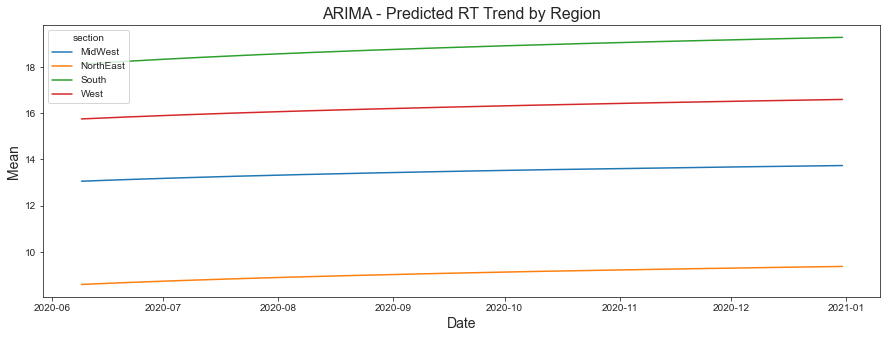

In [152]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=region_mean_Nov, x="date", y="ARIMA", hue="section")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Mean', fontsize=14)
plt.title('ARIMA - Predicted RT Trend by Region', fontsize=16)

Text(0.5, 1.0, 'HWAAS - Predicted RT Trend by Region')

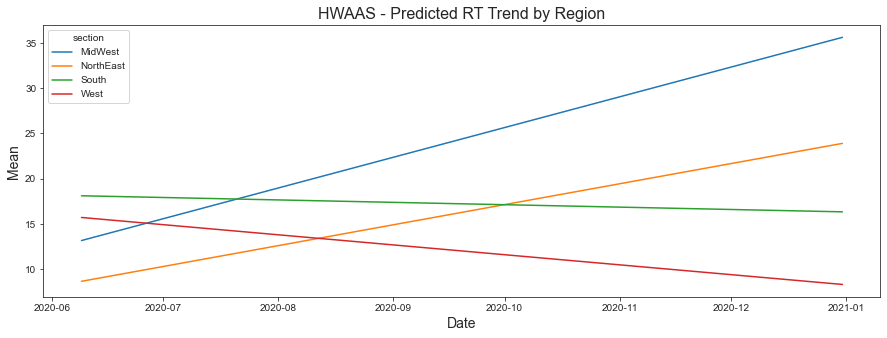

In [153]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=region_mean_Nov, x="date", y="HWAAS", hue="section")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Mean', fontsize=14)
plt.title('HWAAS - Predicted RT Trend by Region', fontsize=16)

Text(0.5, 1.0, 'Prohphet - Predicted RT Trend by Region')

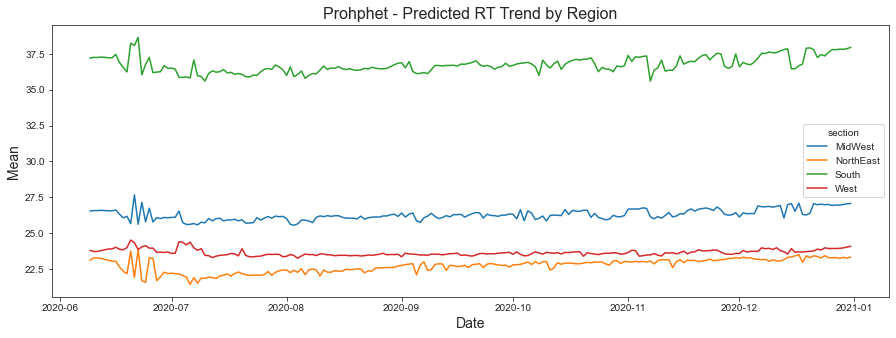

In [154]:
plt.figure(figsize=(15, 5))
sns.lineplot(data=region_mean_Nov, x="date", y="Prohphet", hue="section")
plt.xlabel('Date', fontsize=14)
plt.ylabel('Mean', fontsize=14)
plt.title('Prohphet - Predicted RT Trend by Region', fontsize=16)